# LTE Downlink Throughput — Notebook 02 FINAL OPTIMIZED
## Statistical-First Anomaly Detection, Causal ML Validation, Fusion, Bad-Cell Ranking, and Compact RCA JSON Handoff

Final-stage design principles:

1. **Statistics remain the primary detectors.** Global P10, session P10, IQR lower fence, and robust MAD are retained because they are data-driven and do not depend on one arbitrary telecom throughput threshold.
2. Correlated low-tail methods remain visible individually, but fusion counts them as **one LOW_LEVEL evidence family** so confidence is not inflated.
3. The project sampling cadence is **exactly 1 second**, so local windows and temporal plots are interpreted directly in seconds.
4. ML forecasting is strictly **causal/past-only**. Symmetric ± event windows are banned from model predictors.
5. Active predictive ML is reduced to **HGB temporal Q50, HGB resource Q50, and calibrated resource Q75**. LSTM-Q50 and IsolationForest are retained as validation/context models only and never appear in the final RCA JSON.
6. Strict, rare **ML-only anomalies are allowed**, but are explicitly marked `requires_human_review=true`.
7. RCA receives compact incident JSON plus separate ranked worst-cell/PCI evidence, not the 600+ column audit table.


# Output folders produced

All outputs are written under:

```text
Throughput_Anomaly_Detection_Outputs/
```

The notebook separates the files into three folders:

| Folder | Purpose |
|---|---|
| `01_preprocessing_cleaning/` | Raw profile, cleaning reports, canonical mapping, cleaned base table, event/activity tables, and LTE-DL modeling table. |
| `02_anomaly_detection/` | Expected-throughput references, anomaly flags, anomaly handoff table, anomaly summaries, score QC tables, and schema files. |
| `03_plots/` | All visual EDA and anomaly-QC plots. |

Main anomaly-detection outputs:

| File | Purpose |
|---|---|
| `lte_dl_modeling_table.parquet` | LTE-DL rows with canonical KPI aliases, analysis context, expected-throughput values, and statistical anomaly scores. |
| `expected_throughput_group_radio_p75.csv` | Radio-condition P75 expected-throughput reference. |
| `expected_throughput_group_rb_conditioned_p75.csv` | RB-conditioned P75 expected-throughput reference. |
| `lte_throughput_anomalies_baseline.csv` | Only rows flagged as throughput anomalies. This is the main handoff file for RCA. |
| `throughput_anomaly_episode_summary.csv` | Consecutive anomaly samples grouped into anomaly episodes. |
| `anomaly_method_summary.csv` | Flag percentages with clear denominator columns. |
| `anomaly_flag_overlap_summary.csv` | Independent trigger-family overlap and score behavior. |
| `anomaly_score_distribution_qc.csv` | Score-distribution checkpoints to detect over-compression or over-severity. |

No final RCA cause is assigned in this notebook. RCA fields are placeholders/evidence fields for the next pipeline module.


This version keeps the same folder split, but the anomaly percentages are now calculated over all valid LTE-DL rows, not only active download activity rows.

# Latest threshold calibration update

This version uses calibrated real-drive-test LTE thresholds:

- Low throughput fixed threshold remains **10 Mbps**. In the current exported LTE-DL modeling table this flags about **17.2%** of samples, so it behaves as a practical lower-tail screening threshold, not an extreme-failure threshold.
- RSRP bins are now **Poor < -120 dBm**, **Fair [-120, -100)**, **Good [-100, -90)**, and **Excellent >= -90 dBm**.
- RSRQ bins are **Poor < -20 dB**, **Fair [-20, -15)**, **Good [-15, -10)**, and **Excellent >= -10 dB**.
- SINR bins are **Poor < 0 dB**, **Fair [0, 10)**, **Good [10, 15)**, and **Excellent >= 15 dB**.

The poor-radio flags now use the Poor-bin boundary, while Fair radio remains contextual evidence rather than an automatic poor-radio trigger.


In [1]:
# =========================
# 1. Imports and settings
# =========================

from pathlib import Path
import os
import re
import json
import math
import warnings
from typing import Any, Dict, Iterable, List, Optional, Sequence, Tuple

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display

warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 150)
pd.set_option("display.max_colwidth", 180)
pd.set_option("display.width", 260)

# Use plain matplotlib only.
plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["axes.grid"] = True

# -------------------------
# Project paths
# -------------------------
DATA_DIR = Path("Raw_Data")
DRIVE_TEST_PATH = DATA_DIR / "Network_Drive_Test.pkl"
OUTPUT_ROOT = Path("Throughput_Anomaly_Detection_Outputs")
PREPROCESSING_DIR = OUTPUT_ROOT / "01_preprocessing_cleaning"
ANOMALY_DIR = OUTPUT_ROOT / "02_anomaly_detection"
PLOTS_DIR = OUTPUT_ROOT / "03_plots"
RCA_HANDOFF_DIR = OUTPUT_ROOT / "04_rca_handoff_final"
RCA_KEY_FILES_DIR = RCA_HANDOFF_DIR / "00_key_review_files"
RCA_CASE_PLOTS_DIR = RCA_HANDOFF_DIR / "01_top_anomaly_case_plots"
# OUTPUT_DIR remains as the root for backward compatibility inside helper functions.
OUTPUT_DIR = OUTPUT_ROOT
for _dir in [OUTPUT_ROOT, PREPROCESSING_DIR, ANOMALY_DIR, PLOTS_DIR, RCA_HANDOFF_DIR, RCA_KEY_FILES_DIR, RCA_CASE_PLOTS_DIR]:
    _dir.mkdir(parents=True, exist_ok=True)

# -------------------------
# Cleaning configuration
# -------------------------
MISSING_THRESHOLD_PCT = 70.0
DROP_FULLY_MISSING_PROTECTED_COLUMNS = True
RANDOM_SEED = 42
PROFILE_SAMPLE_ROWS = 100_000
EARTH_RADIUS_KM = 6371.0088
# Project-verified cadence. All local sample windows map directly to seconds.
SAMPLE_INTERVAL_SECONDS = 1.0

# Canonical columns are defined early because statistical ranking/QC runs before the ML section.
TARGET_COL = "actual_lte_dl_throughput"
GROUP_COL = "id"
TIME_COL = "timestamp"

# -------------------------
# Throughput configuration
# -------------------------
# Most common drive-test exports store the selected LTE throughput KPI in Mbps.
# If your exported target is Kbps, set THROUGHPUT_TO_MBPS = 1 / 1000.
THROUGHPUT_TO_MBPS = 1.0

LOW_TP_FIXED_MBPS = 10.0
MIN_EXPECTED_TP_MBPS_FOR_UNDERPERFORMANCE = 25.0
UNDERPERFORMANCE_RATIO_THRESHOLD = 0.35
UNDERPERFORMANCE_GAP_MBPS = 15.0

# Robust lower-tail z-score setting.
# A classic modified-z threshold of -3.5 can become too strict after log1p() compression
# and may produce 0 rows. -3.0 keeps this as an extreme lower-tail detector.
ROBUST_Z_LOWER_THRESHOLD = -3.0

# Group P75 expected-throughput settings.
MIN_GROUP_SIZE_FOR_P75 = 30
P75_QUANTILE = 0.75

# Rolling/sudden-drop settings.
ROLLING_WINDOW_SAMPLES = 11
ROLLING_DROP_RATIO_THRESHOLD = 0.50
SUDDEN_DROP_PREV_MIN_MBPS = 10.0
SUDDEN_DROP_RATIO_THRESHOLD = 0.50
SUDDEN_DROP_GAP_MBPS = 5.0

# Sustained-window and bad-session settings.
# Sudden-drop detection looks for contrast versus a healthy local baseline.
# The following thresholds catch the different case where the whole local window/session is bad.
MIN_ROLLING_SAMPLES = 5
VERY_LOW_TP_MBPS = 5.0
ROLLING_BAD_WINDOW_MEDIAN_MBPS = LOW_TP_FIXED_MBPS
ROLLING_BAD_WINDOW_P25_MBPS = VERY_LOW_TP_MBPS

SESSION_MIN_ROWS_FOR_BAD_SESSION = 20
BAD_SESSION_MEDIAN_MBPS = LOW_TP_FIXED_MBPS
BAD_SESSION_P25_MBPS = VERY_LOW_TP_MBPS
BAD_SESSION_LOW_TP_RATIO_THRESHOLD = 0.40
SESSION_P10_MAX_THRESHOLD_MBPS = 20.0

# -------------------------
# Download activity-window settings
# -------------------------
# LTE-DL session rows can include script/activity context such as HTTP/HTTPS download windows.
# Earlier versions used active download windows as the main analysis mask. The latest V1 uses
# all valid LTE-DL rows because the observed throughput distributions across active/warmup/outside
# activity windows were very close. Activity windows are now kept as context only.
BUILD_DOWNLOAD_ACTIVITY_CONTEXT_FLAGS = True
DOWNLOAD_ACTIVITY_NAME_PATTERN = r"HTTP|HTTPS|Download"
DOWNLOAD_ACTIVITY_WARMUP_SECONDS = 5
DOWNLOAD_ACTIVITY_COOLDOWN_SECONDS = 2

# Visual context settings.
MAX_TOP_CONTEXT_WINDOWS = 8
MAX_CONTEXT_WINDOWS_BY_TYPE = 8
ANOMALY_CONTEXT_SAMPLES_BEFORE = 60
ANOMALY_CONTEXT_SAMPLES_AFTER = 60


# -------------------------
# LTE radio-quality bin thresholds
# -------------------------
# These thresholds are intentionally calibrated for this real drive-test export.
# They are slightly more forgiving than some textbook/paper thresholds because field
# measurements, mobility, server/application behavior, and route conditions can make
# practical throughput lower than ideal lab expectations.
#
# RSRP bins:
#   Excellent: >= -90 dBm
#   Good:      [-100, -90) dBm
#   Fair:      [-120, -100) dBm
#   Poor:      < -120 dBm
RSRP_EXCELLENT_MIN_DBM = -90.0
RSRP_GOOD_MIN_DBM = -100.0
RSRP_FAIR_MIN_DBM = -120.0

# RSRQ bins:
#   Excellent: >= -10 dB
#   Good:      [-15, -10) dB
#   Fair:      [-20, -15) dB
#   Poor:      < -20 dB
RSRQ_EXCELLENT_MIN_DB = -10.0
RSRQ_GOOD_MIN_DB = -15.0
RSRQ_FAIR_MIN_DB = -20.0

# SINR bins:
#   Excellent: >= 15 dB
#   Good:      [10, 15) dB
#   Fair:      [0, 10) dB
#   Poor:      < 0 dB
SINR_EXCELLENT_MIN_DB = 15.0
SINR_GOOD_MIN_DB = 10.0
SINR_FAIR_MIN_DB = 0.0


# -------------------------
# Final visual-QC and false-positive-control settings
# -------------------------
# Visualization clipping only affects plots, never the data used by anomaly detection.
ROUTE_MAP_COLOR_CLIP_Q = 0.95
HISTOGRAM_COLOR_CLIP_Q = 0.99

# RB reliability checks. RB fields are only used as strong evidence when coverage and
# cardinality show that the export contains enough valid RB data.
MIN_RELIABLE_RB_NON_NULL_PCT = 70.0
MIN_RELIABLE_RB_UNIQUE_VALUES = 10
LOW_RB_QUANTILE = 0.25
MEDIUM_RB_QUANTILE = 0.50
HIGH_RB_QUANTILE = 0.75

# Demand/RB evidence controls.
# If RB data is reliable, strict expected-throughput and CA-underperformance flags
# require medium-or-high RB usage. Otherwise low observed throughput can be caused by
# low offered traffic or a scheduler/resource-allocation state, so it should be lower
# confidence instead of a strong capacity anomaly.
REQUIRE_RB_DEMAND_FOR_STRICT_P75 = True
REQUIRE_RB_DEMAND_FOR_CA_UNDERPERFORMANCE = True

# Score calibration after removing aggressive flag stacking.
# These floors prevent visually obvious severe samples from receiving unrealistically low
# scores, while caps prevent low-RB/low-demand rows from looking like confirmed capacity failures.
MIN_SCORE_ANY_TRIGGER = 15.0
MIN_SCORE_FIXED_LOW_TP = 25.0
MIN_SCORE_SUSTAINED_LOW_WINDOW = 35.0
MIN_SCORE_RADIO_LIMITED = 35.0
MIN_SCORE_LOCAL_DROP = 50.0
MIN_SCORE_P75_UNDERPERF = 55.0
MIN_SCORE_SEVERE_P75_UNDERPERF = 75.0
LOW_RB_DEMAND_SCORE_CAP = 45.0

# Score saturation control. Scores are softly capped below 100 unless a truly catastrophic
# case is present. This prevents too many rows from saturating at 100.
SCORE_SOFT_CAP_NON_CATASTROPHIC = 95.0
CATASTROPHIC_ACTUAL_TP_MBPS = 1.0
CATASTROPHIC_EXPECTED_TP_MBPS = 50.0

# RB-efficiency anomaly settings. Throughput per RB becomes useful after RB availability
# was proven reliable. It checks whether throughput is inefficient even when resources exist.
RB_EFFICIENCY_REFERENCE_QUANTILE = 0.10
RB_EFFICIENCY_MIN_ACTUAL_TP_FOR_CONTEXT_MBPS = 0.0


# Continuous score calibration. The final score is no longer just a sum of flags or only
# a set of floors. It combines: strongest-trigger base, continuous anomaly magnitude,
# independent trigger-family bonus, and capped evidence/context bonus.
MULTI_TRIGGER_BONUS_PER_LOG_STEP = 5.0
MULTI_TRIGGER_BONUS_CAP = 12.0
EVIDENCE_BONUS_CAP = 10.0
MAGNITUDE_GAP_DENOMINATOR_MBPS = 80.0
MAGNITUDE_DROP_DENOMINATOR_MBPS = 40.0
MAGNITUDE_LOW_TP_REFERENCE_MBPS = 20.0

# RB-conditioned P75 expected-throughput controls.
USE_RB_CONDITIONED_P75 = True
RB_P75_LABEL = "rb_conditioned"

# P75 reliability controls. Specific group references are more trustworthy than global fallback.
MAX_RELIABLE_P75_FALLBACK_LEVEL = 4
MIN_RELIABLE_P75_GROUP_N = MIN_GROUP_SIZE_FOR_P75

# Bootstrap confidence interval settings for group P75 references.
# These CIs are used as an additional confidence guard for strict P75 underperformance.
P75_CI_BOOTSTRAP_N = 80
P75_CI_ALPHA = 0.05

# Tighter CA-underperformance controls.
CA_UNDERPERF_MIN_EXPECTED_MBPS = 30.0
CA_UNDERPERF_MAX_ACTUAL_MBPS = 15.0
CA_UNDERPERF_RATIO_THRESHOLD = 0.35

# Episode grouping converts consecutive row-level anomalies into reviewable periods.
MAX_SECONDS_GAP_SAME_ANOMALY_EPISODE = 3.0

# Event-window settings used only to prepare anomaly evidence, not final RCA.
# Measurement reports are separated from actual HO execution/failure so mobility context does
# not become too broad. Legacy aliases are created later for compatibility.
EVENT_WINDOWS_SECONDS = {
    "any_event": 30,
    "measurement_report_event": 5,
    "handover_execution": 5,
    "handover_failure": 10,
    "rach_attempt": 10,
    "rach_failure": 10,
    "ca_activation_change": 10,
    "failure_other": 10,
}

# Candidate-vs-handoff split. The candidate table keeps broad statistical findings;
# the baseline handoff table is a stricter subset for practical RCA review.
RCA_HANDOFF_MIN_SCORE = 35.0

# Final bad-cell / PCI ranking and RCA shortlist settings.
CELL_RANK_MIN_ROWS = 30
CELL_RANK_MIN_SESSIONS = 1
BAD_CELL_TOP_N = 25
BAD_PCI_TOP_N = 25
RCA_SHORTLIST_TARGET_INCIDENTS = 15
RCA_SHORTLIST_PER_CASE_QUOTA = 3
TOP_PLOTS_PER_ANOMALY_CASE = 2
TOP_CASE_CONTEXT_SECONDS = 30

# Low-tail methods are retained individually but grouped as one independent family.
LOW_TAIL_CONSENSUS_METHODS = ["global_p10", "iqr", "robust_mad"]
LOW_TAIL_CONSENSUS_EVIDENCE_BONUS_MAX = 4.0

print("Notebook configured.")
print("Raw drive-test path:", DRIVE_TEST_PATH)
print("Output root:", OUTPUT_ROOT.resolve())
print("Preprocessing/cleaning folder:", PREPROCESSING_DIR.resolve())
print("Anomaly-detection folder:", ANOMALY_DIR.resolve())
print("Plots folder:", PLOTS_DIR.resolve())
print("Final RCA handoff folder:", RCA_HANDOFF_DIR.resolve())
print("Missing threshold:", MISSING_THRESHOLD_PCT, "%")

PRE_ANOMALY_FEATURE_TABLE_PATH = PREPROCESSING_DIR / "lte_dl_feature_table_clean_pre_anomaly.parquet"
PRE_ANOMALY_FEATURE_TABLE_FALLBACK_CSV = PREPROCESSING_DIR / "lte_dl_feature_table_clean_pre_anomaly.csv.gz"


Notebook configured.
Raw drive-test path: Raw_Data\Network_Drive_Test.pkl
Output root: D:\ITI 9 Months\Graduation Project\Throughput_Anomaly_Detection_Outputs
Preprocessing/cleaning folder: D:\ITI 9 Months\Graduation Project\Throughput_Anomaly_Detection_Outputs\01_preprocessing_cleaning
Anomaly-detection folder: D:\ITI 9 Months\Graduation Project\Throughput_Anomaly_Detection_Outputs\02_anomaly_detection
Plots folder: D:\ITI 9 Months\Graduation Project\Throughput_Anomaly_Detection_Outputs\03_plots
Final RCA handoff folder: D:\ITI 9 Months\Graduation Project\Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final
Missing threshold: 70.0 %


In [2]:
# =========================
# 2. General utility functions
# =========================

def human_bytes(num_bytes: float) -> str:
    """Convert bytes to a readable memory-size string."""
    if pd.isna(num_bytes):
        return "N/A"
    units = ["B", "KB", "MB", "GB", "TB"]
    size = float(num_bytes)
    for unit in units:
        if size < 1024:
            return f"{size:,.2f} {unit}"
        size /= 1024
    return f"{size:,.2f} PB"



def infer_output_dir(filename: str, category: Optional[str] = None) -> Path:
    """
    Route output artifacts into the requested folder.

    category can be:
    - "preprocessing" / "cleaning"
    - "anomaly"
    - "plots"
    - "rca" / "handoff" / "key"

    When category is omitted, the filename is classified using stable prefixes.
    """
    if category is not None:
        cat = str(category).lower()
        if cat in {"preprocessing", "cleaning", "preprocess", "clean"}:
            return PREPROCESSING_DIR
        if cat in {"anomaly", "anomalies", "detection"}:
            return ANOMALY_DIR
        if cat in {"plot", "plots", "figure", "figures"}:
            return PLOTS_DIR
        if cat in {"rca", "handoff", "final"}:
            return RCA_HANDOFF_DIR
        if cat in {"key", "review", "key_review"}:
            return RCA_KEY_FILES_DIR

    name = str(filename).lower()
    preprocessing_prefixes = (
        "raw_", "column_family_", "missing_", "kept_", "removed_",
        "cleaning_", "cleaned_", "drive_clean_", "activity_", "events_",
        "event_", "canonical_", "detected_", "lte_dl_modeling_table",
        "download_activity_", "throughput_by_download_context", "throughput_by_ca_condition",
        "throughput_by_rb_demand", "rb_usage_quality", "threshold_calibration",
    )
    if name.startswith(preprocessing_prefixes):
        return PREPROCESSING_DIR
    return ANOMALY_DIR


def save_table(df: pd.DataFrame, filename: str, index: bool = False, category: Optional[str] = None) -> Path:
    """Save a table as UTF-8 CSV inside the correct output subfolder."""
    folder = infer_output_dir(filename, category=category)
    folder.mkdir(parents=True, exist_ok=True)
    path = folder / filename
    df.to_csv(path, index=index, encoding="utf-8-sig")
    print(f"Saved CSV: {path}  shape={df.shape}")
    return path


def save_parquet_or_csv(df: pd.DataFrame, filename_no_ext: str, index: bool = False, category: Optional[str] = None) -> Path:
    """
    Save a DataFrame as Parquet when pyarrow/fastparquet is available.
    If Parquet support is missing, save a compressed CSV fallback.
    """
    folder = infer_output_dir(filename_no_ext, category=category)
    folder.mkdir(parents=True, exist_ok=True)
    parquet_path = folder / f"{filename_no_ext}.parquet"
    csv_path = folder / f"{filename_no_ext}.csv.gz"
    try:
        df.to_parquet(parquet_path, index=index)
        print(f"Saved Parquet: {parquet_path}  shape={df.shape}")
        return parquet_path
    except Exception as exc:
        print("Parquet export failed. Falling back to compressed CSV.")
        print("Reason:", exc)
        df.to_csv(csv_path, index=index, compression="gzip", encoding="utf-8-sig")
        print(f"Saved compressed CSV: {csv_path}  shape={df.shape}")
        return csv_path


def sample_df(df: pd.DataFrame, n: int = 100_000, seed: int = RANDOM_SEED) -> pd.DataFrame:
    """Return a safe sample. If df is smaller than n, return a copy of the full df."""
    if len(df) <= n:
        return df.copy()
    return df.sample(n=n, random_state=seed).copy()


def safe_value_counts(s: pd.Series, top_n: int = 10) -> Dict[str, int]:
    """Return top value counts as a dict without failing on mixed dtypes."""
    non_null = s.dropna()
    if non_null.empty:
        return {}
    return non_null.astype(str).value_counts().head(top_n).to_dict()


def get_column_family(col: str) -> str:
    """Infer a practical telecom family from a column name."""
    text = str(col)
    if " - " in text:
        return text.split(" - ")[0].strip()
    if "." in text:
        return text.split(".")[0].strip()
    return text.split()[0].strip() if text.split() else "Unknown"


def first_existing(df: pd.DataFrame, candidates: Sequence[str]) -> Optional[str]:
    """Return the first existing column from a candidate list."""
    for col in candidates:
        if col in df.columns:
            return col
    return None


def to_numeric_series(df: pd.DataFrame, col: Optional[str]) -> pd.Series:
    """Return a numeric Series for col; returns all-NaN if col is missing."""
    if col is None or col not in df.columns:
        return pd.Series(np.nan, index=df.index, dtype="float64")
    return pd.to_numeric(df[col], errors="coerce")


def overview(df: pd.DataFrame, name: str) -> None:
    """Display a compact overview of a dataframe."""
    print(f"===== {name} =====")
    print("Shape:", df.shape)
    print("Rows:", f"{len(df):,}")
    print("Columns:", f"{df.shape[1]:,}")
    print("Memory:", human_bytes(df.memory_usage(deep=True).sum()))
    display(pd.DataFrame({
        "column": df.columns,
        "dtype": df.dtypes.astype(str).values,
        "non_null": df.notna().sum().values,
        "missing": df.isna().sum().values,
        "missing_pct": (df.isna().mean().values * 100).round(3),
    }).head(250))

In [3]:
# =========================
# 2B. Visualization helper functions
# =========================


def save_current_plot(filename: str) -> None:
    """Save the current matplotlib figure into the notebook plot-output folder."""
    path = PLOTS_DIR / filename
    plt.tight_layout()
    plt.savefig(path, dpi=140, bbox_inches="tight")
    print(f"Saved plot: {path}")


def clip_for_plot(s: pd.Series, lower: Optional[float] = None, upper_q: Optional[float] = 0.995) -> pd.Series:
    """Return a numeric series clipped only for visualization, never for modeling."""
    out = pd.to_numeric(s, errors="coerce")
    if lower is not None:
        out = out.clip(lower=lower)
    if upper_q is not None and out.notna().any():
        upper = out.quantile(upper_q)
        out = out.clip(upper=upper)
    return out


def plot_distribution_with_lines(
    df: pd.DataFrame,
    col: str,
    title: str,
    xlabel: str,
    thresholds: Optional[Dict[str, float]] = None,
    bins: int = 80,
    filename: Optional[str] = None,
    clip_upper_q: Optional[float] = 0.995,
) -> None:
    """Plot a histogram with optional vertical reference thresholds."""
    if col not in df.columns:
        print(f"Skipped {title}: column not found: {col}")
        return
    s = clip_for_plot(df[col], lower=0 if "throughput" in col.lower() or "score" in col.lower() else None, upper_q=clip_upper_q).dropna()
    if s.empty:
        print(f"Skipped {title}: no numeric values in {col}")
        return
    plt.figure(figsize=(12, 5))
    plt.hist(s, bins=bins)
    if thresholds:
        for label, value in thresholds.items():
            if pd.notna(value):
                plt.axvline(float(value), linestyle="--", label=f"{label}: {float(value):.2f}")
        plt.legend()
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Rows")
    if filename:
        save_current_plot(filename)
    plt.show()


def plot_box_by_category(
    df: pd.DataFrame,
    category_col: str,
    value_col: str,
    title: str,
    ylabel: str,
    filename: Optional[str] = None,
    category_order: Optional[List[Any]] = None,
    clip_upper_q: Optional[float] = 0.995,
) -> None:
    """Plot a boxplot for a numeric value split by a categorical column."""
    if category_col not in df.columns or value_col not in df.columns:
        print(f"Skipped {title}: missing {category_col} or {value_col}")
        return
    tmp = df[[category_col, value_col]].copy()
    tmp[value_col] = clip_for_plot(tmp[value_col], lower=0, upper_q=clip_upper_q)
    tmp = tmp.dropna(subset=[category_col, value_col])
    if tmp.empty:
        print(f"Skipped {title}: no data after dropping missing values")
        return
    if category_order is None:
        category_order = list(tmp[category_col].astype(str).value_counts().index)
    data = [tmp.loc[tmp[category_col].astype(str) == str(cat), value_col].values for cat in category_order]
    labels = [str(cat) for cat, arr in zip(category_order, data) if len(arr) > 0]
    data = [arr for arr in data if len(arr) > 0]
    if not data:
        print(f"Skipped {title}: no non-empty groups")
        return
    plt.figure(figsize=(12, 5))
    plt.boxplot(data, labels=labels, showfliers=False)
    plt.title(title)
    plt.xlabel(category_col)
    plt.ylabel(ylabel)
    plt.xticks(rotation=30, ha="right")
    if filename:
        save_current_plot(filename)
    plt.show()


def plot_scatter_sample(
    df: pd.DataFrame,
    x_col: str,
    y_col: str,
    title: str,
    xlabel: str,
    ylabel: str,
    filename: Optional[str] = None,
    max_points: int = 20_000,
    y_clip_upper_q: Optional[float] = 0.995,
) -> None:
    """Scatter plot on a random sample to keep the notebook responsive."""
    if x_col not in df.columns or y_col not in df.columns:
        print(f"Skipped {title}: missing {x_col} or {y_col}")
        return
    tmp = df[[x_col, y_col]].copy()
    tmp[y_col] = clip_for_plot(tmp[y_col], lower=0, upper_q=y_clip_upper_q)
    tmp = tmp.dropna()
    if tmp.empty:
        print(f"Skipped {title}: no data")
        return
    tmp = sample_df(tmp, max_points)
    plt.figure(figsize=(10, 5))
    plt.scatter(tmp[x_col], tmp[y_col], s=6, alpha=0.35)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if filename:
        save_current_plot(filename)
    plt.show()



def plot_route_metric(
    df: pd.DataFrame,
    metric_col: str,
    title: str,
    filename: Optional[str] = None,
    max_points: int = 30_000,
    clip_upper_q: Optional[float] = ROUTE_MAP_COLOR_CLIP_Q,
    colorbar_label: Optional[str] = None,
) -> None:
    """Route scatter colored by a metric, with optional display-only clipping.

    The metric values are never changed in the dataframe. Clipping is applied only to the
    plotted color values so that extreme throughput outliers do not make the whole route
    appear dark. This is especially useful for drive-test throughput maps where the most
    important visual detail is often in the 0-80 Mbps range, while a few samples exceed
    200 Mbps.
    """
    required = {"latitude", "longitude", metric_col}
    if not required.issubset(df.columns):
        print(f"Skipped {title}: missing one of {required}")
        return
    tmp = df.dropna(subset=["latitude", "longitude", metric_col]).copy()
    if tmp.empty:
        print(f"Skipped {title}: no valid GPS/metric rows")
        return
    tmp = sample_df(tmp, max_points)

    color_values = pd.to_numeric(tmp[metric_col], errors="coerce")
    cb_label = colorbar_label or metric_col
    if clip_upper_q is not None and color_values.notna().any():
        upper = color_values.quantile(clip_upper_q)
        color_values = color_values.clip(upper=upper)
        cb_label = f"{cb_label} (display clipped at P{int(clip_upper_q * 100)}={upper:.2f})"

    plt.figure(figsize=(8, 8))
    sc = plt.scatter(tmp["longitude"], tmp["latitude"], c=color_values, s=7, alpha=0.75)
    plt.colorbar(sc, label=cb_label)
    plt.title(title)
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    if filename:
        save_current_plot(filename)
    plt.show()


def plot_route_anomaly_overlay(
    df: pd.DataFrame,
    filename: Optional[str] = None,
    max_points: int = 40_000,
) -> None:
    """Show the full route as background and overlay anomaly samples.

    This makes spatial anomaly interpretation easier than coloring every point with the
    raw score. The background route shows coverage of the drive path, while overlaid samples
    show where the detector found problematic LTE-DL behavior.
    """
    required = {"latitude", "longitude", "is_throughput_anomaly"}
    if not required.issubset(df.columns):
        print(f"Skipped anomaly overlay map: missing one of {required}")
        return
    tmp = df.dropna(subset=["latitude", "longitude"]).copy()
    if tmp.empty:
        print("Skipped anomaly overlay map: no valid GPS rows")
        return
    tmp = sample_df(tmp, max_points)
    normal = tmp[~tmp["is_throughput_anomaly"].fillna(False).astype(bool)]
    anom = tmp[tmp["is_throughput_anomaly"].fillna(False).astype(bool)]

    plt.figure(figsize=(8, 8))
    if not normal.empty:
        plt.scatter(normal["longitude"], normal["latitude"], s=5, alpha=0.20, label="Not flagged")
    if not anom.empty:
        score = pd.to_numeric(anom.get("anomaly_score_0_100", pd.Series(1, index=anom.index)), errors="coerce").fillna(1)
        plt.scatter(anom["longitude"], anom["latitude"], c=score, s=10, alpha=0.85, label="Flagged anomaly")
        plt.colorbar(label="Anomaly score (0-100)")
    plt.title("Route with Throughput Anomaly Overlay")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend()
    if filename:
        save_current_plot(filename)
    plt.show()


def plot_flag_percentage_bars(summary_df: pd.DataFrame, filename: Optional[str] = None) -> None:
    """Plot anomaly method/case percentages from anomaly_method_summary.csv."""
    if summary_df is None or summary_df.empty or "method_or_case" not in summary_df.columns:
        print("Skipped method-percentage plot: summary table is empty")
        return
    tmp = summary_df.sort_values("flagged_pct", ascending=True)
    plt.figure(figsize=(12, max(5, 0.35 * len(tmp))))
    plt.barh(tmp["method_or_case"], tmp["flagged_pct"])
    plt.xlabel("Flagged rows (%)")
    plt.title("Anomaly Method / Case Flagging Rate")
    if filename:
        save_current_plot(filename)
    plt.show()


def plot_actual_vs_expected(df: pd.DataFrame, filename: Optional[str] = None, max_points: int = 25_000) -> None:
    """Actual-vs-expected scatter with anomaly samples highlighted."""
    needed = {"actual_lte_dl_throughput", "expected_tp_p75", "is_throughput_anomaly"}
    if not needed.issubset(df.columns):
        print(f"Skipped actual-vs-expected plot: missing {needed - set(df.columns)}")
        return
    tmp = df.dropna(subset=["actual_lte_dl_throughput", "expected_tp_p75"]).copy()
    if tmp.empty:
        print("Skipped actual-vs-expected plot: no valid rows")
        return
    tmp = sample_df(tmp, max_points)
    normal = tmp[~tmp["is_throughput_anomaly"].fillna(False).astype(bool)]
    anom = tmp[tmp["is_throughput_anomaly"].fillna(False).astype(bool)]
    plt.figure(figsize=(8, 8))
    if not normal.empty:
        plt.scatter(normal["expected_tp_p75"], normal["actual_lte_dl_throughput"], s=5, alpha=0.25, label="Not flagged")
    if not anom.empty:
        plt.scatter(anom["expected_tp_p75"], anom["actual_lte_dl_throughput"], s=7, alpha=0.55, label="Flagged anomaly")
    max_axis = np.nanpercentile(tmp[["expected_tp_p75", "actual_lte_dl_throughput"]].values, 99)
    plt.plot([0, max_axis], [0, max_axis], linestyle="--", label="Actual = expected")
    plt.xlabel("Expected throughput P75 (Mbps)")
    plt.ylabel("Actual LTE DL throughput (Mbps)")
    plt.title("Actual vs Group-P75 Expected Throughput")
    plt.legend()
    if filename:
        save_current_plot(filename)
    plt.show()



def plot_anomaly_context(
    df: pd.DataFrame,
    anomaly_df: Optional[pd.DataFrame] = None,
    rank: int = 0,
    samples_before: int = 40,
    samples_after: int = 40,
    filename_prefix: Optional[str] = None,
    title_prefix: str = "Top anomaly context window",
) -> None:
    """Plot surrounding session samples around a selected anomaly.

    The rolling/anomaly context is sample-based because the current drive-test export is
    mostly consecutive. To make the sample axis easier to interpret, the x-axis tick labels
    also show the real elapsed seconds from the selected anomaly when timestamps exist.

    The selected anomaly itself is shown with a vertical dashed line. The plot helps answer:
    - Is this an isolated drop?
    - Is it part of a sustained bad window?
    - Is expected P75 consistently above actual, or only locally?
    - Did radio KPIs degrade around the same time?
    """
    if anomaly_df is None:
        if "is_throughput_anomaly" not in df.columns:
            print("Skipped anomaly context: no anomaly flag available")
            return
        anomaly_df = df[df["is_throughput_anomaly"].fillna(False).astype(bool)].copy()

    if anomaly_df.empty:
        print("Skipped anomaly context: no anomalies available")
        return

    if "anomaly_score_0_100" in anomaly_df.columns:
        anomaly_df = anomaly_df.sort_values("anomaly_score_0_100", ascending=False)

    if rank >= len(anomaly_df):
        print(f"Skipped anomaly context: rank {rank} out of range")
        return

    row = anomaly_df.iloc[rank]
    sid = row.get("id", None)

    if "id" in df.columns and pd.notna(sid):
        session = df[df["id"] == sid].copy()
    else:
        session = df.copy()

    if "timestamp" in session.columns:
        session = session.sort_values("timestamp")

    # Find the center row using source_index when available, otherwise nearest timestamp.
    center_pos = None
    if "source_index" in row.index and "source_index" in session.columns:
        matches = np.where(session["source_index"].values == row["source_index"])[0]
        if len(matches):
            center_pos = int(matches[0])

    if center_pos is None and "timestamp" in row.index and "timestamp" in session.columns:
        session_ts_utc = pd.to_datetime(session["timestamp"], utc=True, errors="coerce")
        row_ts_utc = pd.to_datetime(row["timestamp"], utc=True, errors="coerce")
        diffs = (session_ts_utc - row_ts_utc).abs()
        center_pos = int(diffs.argmin()) if len(diffs) else None

    if center_pos is None:
        print("Skipped anomaly context: could not locate selected anomaly in session")
        return

    start = max(0, center_pos - samples_before)
    end = min(len(session), center_pos + samples_after + 1)
    ctx = session.iloc[start:end].copy().reset_index(drop=True)
    ctx["context_sample_number"] = np.arange(len(ctx))
    center_x = center_pos - start

    selected_timestamp_text = ""
    if "timestamp" in ctx.columns:
        ts = pd.to_datetime(ctx["timestamp"], utc=True, errors="coerce")
        center_ts = ts.iloc[center_x]
        ctx["seconds_from_selected_anomaly"] = (ts - center_ts).dt.total_seconds()
        if pd.notna(center_ts):
            selected_timestamp_text = f" | selected time: {center_ts}"

    def _apply_time_ticks() -> None:
        """Use tick labels that show both sample index and seconds from selected anomaly."""
        if "seconds_from_selected_anomaly" not in ctx.columns:
            plt.xlabel("Sample number inside context window")
            return
        max_ticks = min(11, len(ctx))
        ticks = np.linspace(0, len(ctx) - 1, max_ticks).round().astype(int)
        ticks = np.unique(np.r_[ticks, center_x])
        tick_labels = []
        for t in ticks:
            sec = ctx.loc[int(t), "seconds_from_selected_anomaly"]
            if pd.notna(sec):
                tick_labels.append(f"{int(t)}\n{sec:+.0f}s")
            else:
                tick_labels.append(str(int(t)))
        plt.xticks(ticks, tick_labels)
        plt.xlabel("Context sample number\n(second line = seconds from selected anomaly)")

    # Print a compact textual summary before the plots.
    summary_cols = [
        "timestamp", "id", "anomaly_type", "anomaly_type_flags", "anomaly_score_0_100",
        "actual_lte_dl_throughput", "expected_tp_p75", "expected_tp_rb_conditioned_p75", "throughput_ratio_p75", "throughput_ratio_rb_p75",
        "rb_usage_value", "rb_usage_bucket", "rb_demand_confidence", "throughput_per_rb",
        "lte_rsrp", "lte_rsrq", "lte_sinr", "carrier_count",
        "download_context_label", "download_analysis_window_flag",
    ]
    available_summary_cols = [c for c in summary_cols if c in row.index]
    if available_summary_cols:
        print("Selected anomaly summary:")
        display(pd.DataFrame([row[available_summary_cols].to_dict()]))

    plt.figure(figsize=(14, 5))
    plt.plot(ctx["context_sample_number"], ctx["actual_lte_dl_throughput"], marker="o", markersize=3, label="Actual TP")
    if "expected_tp_p75" in ctx.columns:
        plt.plot(ctx["context_sample_number"], ctx["expected_tp_p75"], linestyle="--", label="Radio P75")
    if "expected_tp_rb_conditioned_p75" in ctx.columns:
        plt.plot(ctx["context_sample_number"], ctx["expected_tp_rb_conditioned_p75"], linestyle="-.", label="RB-conditioned P75")
    if "rolling_median_tp" in ctx.columns:
        plt.plot(ctx["context_sample_number"], ctx["rolling_median_tp"], linestyle=":", label="Rolling median")
    if "download_analysis_window_flag" in ctx.columns:
        # Lightly mark samples that are outside the parsed active download window.
        # This is context only; it is not the main anomaly-analysis mask in the latest version.
        inactive = ~ctx["download_analysis_window_flag"].fillna(True).astype(bool)
        if inactive.any():
            y_marker = max(0, np.nanmin(ctx["actual_lte_dl_throughput"]) if ctx["actual_lte_dl_throughput"].notna().any() else 0)
            plt.scatter(ctx.loc[inactive, "context_sample_number"], np.repeat(y_marker, inactive.sum()), marker="x", s=25, label="Outside parsed active download window")
    plt.axvline(center_x, linestyle="--", label="Selected anomaly")
    plt.title(f"{title_prefix} #{rank + 1}: throughput behavior{selected_timestamp_text}")
    _apply_time_ticks()
    plt.ylabel("Throughput (Mbps)")
    plt.legend()
    if filename_prefix:
        save_current_plot(f"{filename_prefix}_rank_{rank + 1}_throughput_context.png")
    plt.show()

    # Separate radio-context plot so throughput and radio scales are not mixed.
    radio_cols = [c for c in ["lte_rsrp", "lte_rsrq", "lte_sinr"] if c in ctx.columns]
    if radio_cols:
        plt.figure(figsize=(14, 5))
        for col in radio_cols:
            plt.plot(ctx["context_sample_number"], ctx[col], marker="o", markersize=3, label=col)
        plt.axvline(center_x, linestyle="--", label="Selected anomaly")
        plt.title(f"{title_prefix} #{rank + 1}: radio evidence{selected_timestamp_text}")
        _apply_time_ticks()
        plt.ylabel("Radio KPI value")
        plt.legend()
        if filename_prefix:
            save_current_plot(f"{filename_prefix}_rank_{rank + 1}_radio_context.png")
        plt.show()


def plot_context_examples_by_type(
    df: pd.DataFrame,
    anomaly_df: pd.DataFrame,
    max_types: int = 8,
    samples_before: int = 60,
    samples_after: int = 60,
    filename_prefix: str = "19_type_example_context",
) -> None:
    """Plot one high-score context example for several anomaly types.

    Top-score-only examples often show extreme edge cases. This helper adds diversity by
    selecting one representative high-score sample from each major anomaly type.
    """
    if anomaly_df is None or anomaly_df.empty or "anomaly_type" not in anomaly_df.columns:
        print("Skipped type examples: anomaly table is empty or missing anomaly_type")
        return

    types = anomaly_df["anomaly_type"].value_counts().head(max_types).index.tolist()
    for i, anomaly_type in enumerate(types, start=1):
        subset = anomaly_df[anomaly_df["anomaly_type"] == anomaly_type].copy()
        if subset.empty:
            continue
        subset = subset.sort_values("anomaly_score_0_100", ascending=False).head(1)
        print(f"\nRepresentative anomaly type example: {anomaly_type}")
        plot_anomaly_context(
            df,
            anomaly_df=subset,
            rank=0,
            samples_before=samples_before,
            samples_after=samples_after,
            filename_prefix=f"{filename_prefix}_{i}_{str(anomaly_type).replace('/', '_').replace(' ', '_')}",
            title_prefix=f"Representative {anomaly_type}",
        )


# Load clean pre-anomaly table

Notebook 02 intentionally loads the clean feature table produced by Notebook 01. This prevents accidental ML/statistical leakage from post-scoring columns.

In [4]:
# =========================
# Load Notebook 01 output
# =========================

def read_parquet_robust(path: Path) -> pd.DataFrame:
    """Read parquet with a pyarrow-direct fallback.

    Some environments can have a pandas/pyarrow extension-type compatibility issue.
    The fallback uses pyarrow directly and ignores pandas metadata.
    """
    try:
        return pd.read_parquet(path)
    except Exception as exc:
        print("pd.read_parquet failed; trying pyarrow direct fallback.")
        print("Reason:", exc)
        try:
            import pyarrow.parquet as pq
            return pq.read_table(path).to_pandas(ignore_metadata=True)
        except Exception as exc2:
            raise RuntimeError(f"Both pandas and pyarrow failed to read {path}") from exc2


def load_pre_anomaly_feature_table() -> pd.DataFrame:
    candidate_paths = [
        PRE_ANOMALY_FEATURE_TABLE_PATH,
        Path("lte_dl_feature_table_clean_pre_anomaly.parquet"),
        Path("/mnt/data/lte_dl_feature_table_clean_pre_anomaly.parquet"),
    ]
    for path in candidate_paths:
        if path.exists():
            print("Loading clean pre-anomaly parquet:", path)
            return read_parquet_robust(path)

    csv_candidates = [
        PRE_ANOMALY_FEATURE_TABLE_FALLBACK_CSV,
        Path("lte_dl_feature_table_clean_pre_anomaly.csv.gz"),
        Path("/mnt/data/lte_dl_feature_table_clean_pre_anomaly.csv.gz"),
    ]
    for path in csv_candidates:
        if path.exists():
            print("Loading clean pre-anomaly compressed CSV:", path)
            return pd.read_csv(path)

    raise FileNotFoundError(
        "Clean pre-anomaly feature table was not found. Run Notebook 01 first, or place "
        f"the file at {PRE_ANOMALY_FEATURE_TABLE_PATH}."
    )

lte_dl = load_pre_anomaly_feature_table()
print("Loaded clean pre-anomaly LTE-DL table shape:", lte_dl.shape)

# Guard against accidental leakage from an old post-scoring table.
leakage_prefixes = (
    "expected_tp", "throughput_gap_p75", "throughput_ratio_p75", "log_residual_p75",
    "score_", "anomaly_score", "anomaly_type", "anomaly_severity", "is_throughput_anomaly",
    "underperform_", "low_tp_", "rolling_", "prev_tp", "tp_drop_", "tp_ratio_to_prev",
    "bad_session",
)
leakage_cols_at_load = [c for c in lte_dl.columns if any(str(c).startswith(p) for p in leakage_prefixes)]
if leakage_cols_at_load:
    print("Warning: post-anomaly columns found in loaded table and will be overwritten/recomputed as needed:")
    print(leakage_cols_at_load[:50])

preview_cols = [c for c in ["source_index", "id", "timestamp", "actual_lte_dl_throughput", "lte_rsrp", "lte_sinr", "rb_usage_bucket", "carrier_count", "download_context_label"] if c in lte_dl.columns]
display(lte_dl[preview_cols].head(20))


Loading clean pre-anomaly parquet: Throughput_Anomaly_Detection_Outputs\01_preprocessing_cleaning\lte_dl_feature_table_clean_pre_anomaly.parquet
Loaded clean pre-anomaly LTE-DL table shape: (32238, 353)


,source_index,id,timestamp,actual_lte_dl_throughput,lte_rsrp,lte_sinr,rb_usage_bucket,carrier_count,download_context_label
0,32048,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:40+02:00,0.000144,-101.905240,10.830000,low_rb_usage,1.0,outside_download_activity
1,32049,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:41+02:00,0.002336,-105.852940,7.888544,low_rb_usage,1.0,outside_download_activity
2,32050,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:42+02:00,0.031944,-104.577126,8.440907,low_rb_usage,1.0,outside_download_activity
3,32051,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:43+02:00,0.043088,-100.460590,9.509525,low_rb_usage,1.0,outside_download_activity
4,32052,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:44+02:00,0.001464,-107.604164,5.791666,low_rb_usage,1.0,outside_download_activity
5,32053,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:45+02:00,0.008488,-110.119080,4.092308,low_rb_usage,2.0,outside_download_activity
6,32054,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:46+02:00,0.018432,-111.684784,1.961682,low_rb_usage,2.0,outside_download_activity
7,32055,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:47+02:00,0.008776,-111.661766,2.067532,low_rb_usage,1.0,outside_download_activity
8,32056,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:48+02:00,0.008024,-111.179110,2.957142,low_rb_usage,1.0,outside_download_activity
9,32057,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,2025-08-26 23:37:49+02:00,0.019640,-110.680310,3.066666,low_rb_usage,1.0,outside_download_activity


# Statistical anomaly methods

V1 uses multiple statistical views instead of one generic anomaly label:

1. **Fixed threshold:** simple low-throughput rule.
2. **Global percentile:** bottom tail of LTE-DL throughput.
3. **Session percentile:** low compared with the same drive-test session.
4. **Robust log z-score:** robust outlier score using median and MAD on log throughput.
5. **Log-IQR lower-tail score:** another robust lower-tail score.
6. **Rolling median drop:** low compared with local session context.
7. **Sudden drop:** large drop compared with previous sample.
8. **Group P75 expected throughput:** actual throughput much lower than a realistic achievable P75 under similar radio/CA/band conditions.

These methods are intentionally explainable and do not require machine learning.

In [5]:
# =========================
# 12. Simple and robust statistical anomaly scores
# =========================


def minmax_clip_score(value: pd.Series, denominator: float) -> pd.Series:
    """Convert a positive gap into a clipped 0..1 score."""
    if denominator is None or denominator == 0 or pd.isna(denominator):
        return pd.Series(0.0, index=value.index)
    return (value / denominator).clip(lower=0, upper=1)


def robust_mad_zscore(x: pd.Series) -> pd.Series:
    """Robust modified z-score using median absolute deviation.

    The median and MAD are calculated from the non-null values. This allows us to pass a
    series where non-eligible values may be set to NaN.
    """
    x = pd.to_numeric(x, errors="coerce")
    med = x.median(skipna=True)
    mad = (x - med).abs().median(skipna=True)
    if pd.isna(mad) or mad == 0:
        std = x.std(skipna=True)
        if pd.isna(std) or std == 0:
            return pd.Series(0.0, index=x.index)
        return (x - med) / std
    return 0.6745 * (x - med) / mad


def rolling_stat_by_session(df: pd.DataFrame, target: str, window: int, stat: str) -> pd.Series:
    """Return a centered sample-based rolling statistic calculated inside each session.

    The drive-test cadence is project-verified at exactly 1 second/sample. Therefore an
    11-sample window is an 11-second local window. Timestamp deltas are still exported as QC.

    Non-eligible values can be stored as NaN in the target column. Pandas rolling
    statistics ignore NaN values but still require enough valid samples through min_periods.
    """
    min_periods = max(MIN_ROLLING_SAMPLES, window // 3)

    def _apply(s: pd.Series) -> pd.Series:
        roll = s.rolling(window=window, min_periods=min_periods, center=True)
        if stat == "median":
            return roll.median()
        if stat == "p25":
            return roll.quantile(0.25)
        if stat == "count":
            return roll.count()
        raise ValueError(f"Unsupported rolling stat: {stat}")

    if "id" in df.columns:
        return df.groupby("id", group_keys=False)[target].apply(_apply).reindex(df.index)
    return _apply(df[target])


tp = lte_dl["actual_lte_dl_throughput"].astype(float)
lte_dl["log_actual_lte_dl_throughput"] = np.log1p(tp)

# Main analysis population: all valid LTE-DL rows.
# The download activity window remains in the table as context only. This change is based on
# the observed fact that active/warmup/outside activity rows had very similar throughput medians.
analysis_mask = tp.notna() & (tp >= 0)

# Safety fallback: if something unexpected removes all rows, analyze the LTE-DL table as-is.
if not analysis_mask.any():
    print("Warning: anomaly analysis mask is empty. Falling back to all LTE-DL rows.")
    analysis_mask = pd.Series(True, index=lte_dl.index)

lte_dl["anomaly_analysis_window_flag"] = analysis_mask
analysis_n = int(analysis_mask.sum())
all_n = len(lte_dl)
print(f"Anomaly analysis rows: {analysis_n:,} / {all_n:,} LTE-DL rows ({analysis_n / max(all_n, 1) * 100:.2f}%).")
print("Download activity context is retained only as metadata; RB usage is the main demand/resource-confidence signal.")

tp_active = tp.where(analysis_mask)
log_tp_active = np.log1p(tp_active)

# 1) Fixed threshold.
lte_dl["low_tp_fixed_flag"] = analysis_mask & (tp < LOW_TP_FIXED_MBPS)
lte_dl["score_fixed_low_tp"] = ((LOW_TP_FIXED_MBPS - tp) / LOW_TP_FIXED_MBPS).clip(lower=0, upper=1)
lte_dl["score_fixed_low_tp"] = lte_dl["score_fixed_low_tp"].where(lte_dl["low_tp_fixed_flag"], 0.0)

fixed_threshold_pct_analysis = float(lte_dl["low_tp_fixed_flag"].sum() / max(analysis_n, 1) * 100)
fixed_threshold_pct_all = float(lte_dl["low_tp_fixed_flag"].sum() / max(all_n, 1) * 100)
print(
    f"LOW_TP_FIXED_MBPS={LOW_TP_FIXED_MBPS:g} Mbps flags "
    f"{fixed_threshold_pct_analysis:.2f}% of analyzed LTE-DL rows "
    f"({fixed_threshold_pct_all:.2f}% of all LTE-DL rows)."
)

# 2) Global percentile lower-tail threshold calculated on analyzable rows only.
global_p10 = tp_active.quantile(0.10)
global_p25 = tp_active.quantile(0.25)
lte_dl["global_p10_tp_threshold"] = global_p10
lte_dl["global_p25_tp_threshold"] = global_p25
lte_dl["low_tp_global_p10_flag"] = analysis_mask & (tp <= global_p10)
lte_dl["score_global_p10_low_tp"] = ((global_p10 - tp) / max(global_p10, 1e-9)).clip(lower=0, upper=1)
lte_dl["score_global_p10_low_tp"] = lte_dl["score_global_p10_low_tp"].where(lte_dl["low_tp_global_p10_flag"], 0.0)

# 3) Session percentile threshold based only on valid LTE-DL samples.
if "id" in lte_dl.columns:
    tmp_session = lte_dl[["id"]].copy()
    tmp_session["_tp_active"] = tp_active

    session_group = tmp_session.groupby("id")["_tp_active"]
    session_q10 = session_group.transform(lambda x: x.dropna().quantile(0.10) if x.notna().any() else np.nan)
    session_q25 = session_group.transform(lambda x: x.dropna().quantile(0.25) if x.notna().any() else np.nan)
    session_rows = session_group.transform("count")
    session_mean = session_group.transform("mean")
    session_median = session_group.transform("median")
    session_low_tp_ratio = session_group.transform(
        lambda x: float((x.dropna() < LOW_TP_FIXED_MBPS).mean()) if x.notna().any() else np.nan
    )
else:
    session_q10 = pd.Series(global_p10, index=lte_dl.index)
    session_q25 = pd.Series(global_p25, index=lte_dl.index)
    session_rows = pd.Series(analysis_n, index=lte_dl.index)
    session_mean = pd.Series(tp_active.mean(), index=lte_dl.index)
    session_median = pd.Series(tp_active.median(), index=lte_dl.index)
    session_low_tp_ratio = pd.Series(float((tp_active.dropna() < LOW_TP_FIXED_MBPS).mean()), index=lte_dl.index)

# Fill sessions without valid LTE-DL samples from global LTE-DL values so outputs remain numeric.
session_q10 = session_q10.fillna(global_p10)
session_q25 = session_q25.fillna(global_p25)
session_mean = session_mean.fillna(tp_active.mean())
session_median = session_median.fillna(tp_active.median())
session_low_tp_ratio = session_low_tp_ratio.fillna(float((tp_active.dropna() < LOW_TP_FIXED_MBPS).mean()))

lte_dl["session_rows"] = session_rows.fillna(0).astype(int)
lte_dl["session_mean_tp"] = session_mean
lte_dl["session_median_tp"] = session_median
lte_dl["session_p10_tp_threshold"] = session_q10
lte_dl["session_p25_tp"] = session_q25
lte_dl["session_low_tp_ratio"] = session_low_tp_ratio

lte_dl["low_tp_session_p10_flag"] = (
    analysis_mask &
    (tp <= session_q10) &
    (session_q10 <= SESSION_P10_MAX_THRESHOLD_MBPS)
)
lte_dl["score_session_p10_low_tp"] = ((session_q10 - tp) / session_q10.replace(0, np.nan)).clip(lower=0, upper=1).fillna(0)
lte_dl["score_session_p10_low_tp"] = lte_dl["score_session_p10_low_tp"].where(lte_dl["low_tp_session_p10_flag"], 0.0)

# 4) Robust log z-score lower-tail method.
lte_dl["log_tp_modified_z"] = robust_mad_zscore(log_tp_active)
lte_dl["low_tp_robust_z_flag"] = analysis_mask & (lte_dl["log_tp_modified_z"] <= ROBUST_Z_LOWER_THRESHOLD)
lte_dl["score_robust_z_low_tp"] = (lte_dl["log_tp_modified_z"] / ROBUST_Z_LOWER_THRESHOLD).clip(lower=0, upper=1)
lte_dl["score_robust_z_low_tp"] = lte_dl["score_robust_z_low_tp"].where(lte_dl["low_tp_robust_z_flag"], 0.0).fillna(0.0)
print(
    f"Robust log modified-z min={lte_dl['log_tp_modified_z'].min(skipna=True):.3f}; "
    f"threshold={ROBUST_Z_LOWER_THRESHOLD:.1f}; "
    f"flagged={int(lte_dl['low_tp_robust_z_flag'].sum())} rows."
)

# 5) IQR lower-tail on log throughput using valid LTE-DL samples.
q1 = log_tp_active.quantile(0.25)
q3 = log_tp_active.quantile(0.75)
iqr = q3 - q1
log_iqr_lower_fence = q1 - 1.5 * iqr
lte_dl["log_iqr_lower_fence"] = log_iqr_lower_fence
lte_dl["low_tp_iqr_flag"] = analysis_mask & (np.log1p(tp) < log_iqr_lower_fence)
lte_dl["score_iqr_low_tp"] = ((log_iqr_lower_fence - np.log1p(tp)) / max(abs(log_iqr_lower_fence), 1e-9)).clip(lower=0, upper=1)
lte_dl["score_iqr_low_tp"] = lte_dl["score_iqr_low_tp"].where(lte_dl["low_tp_iqr_flag"], 0.0)

# 6) Rolling context inside each session.
# All valid LTE-DL rows are used as rolling values. Sampling is exactly 1 second, so the
# sample-based rolling window is also a directly interpretable seconds-based window.
lte_dl["_tp_for_active_rolling"] = tp.where(analysis_mask)
lte_dl["rolling_median_tp"] = rolling_stat_by_session(lte_dl, "_tp_for_active_rolling", ROLLING_WINDOW_SAMPLES, "median")
lte_dl["rolling_p25_tp"] = rolling_stat_by_session(lte_dl, "_tp_for_active_rolling", ROLLING_WINDOW_SAMPLES, "p25")
lte_dl["rolling_count"] = rolling_stat_by_session(lte_dl, "_tp_for_active_rolling", ROLLING_WINDOW_SAMPLES, "count")

lte_dl["rolling_tp_gap"] = lte_dl["rolling_median_tp"] - tp
lte_dl["rolling_tp_ratio"] = tp / lte_dl["rolling_median_tp"].replace(0, np.nan)

# Contrast anomaly: current sample suddenly falls from a locally healthy baseline.
lte_dl["rolling_drop_flag"] = (
    analysis_mask &
    (lte_dl["rolling_count"] >= MIN_ROLLING_SAMPLES) &
    (lte_dl["rolling_median_tp"] >= LOW_TP_FIXED_MBPS) &
    (lte_dl["rolling_tp_ratio"] <= ROLLING_DROP_RATIO_THRESHOLD) &
    (lte_dl["rolling_tp_gap"] >= SUDDEN_DROP_GAP_MBPS)
)
lte_dl["score_rolling_drop"] = (1 - lte_dl["rolling_tp_ratio"]).clip(lower=0, upper=1).fillna(0)
lte_dl["score_rolling_drop"] = lte_dl["score_rolling_drop"].where(lte_dl["rolling_drop_flag"], 0.0)

# Sustained-window context: the whole local LTE-DL window is poor, not just one sample.
lte_dl["rolling_bad_window_flag"] = (
    analysis_mask &
    (lte_dl["rolling_count"] >= MIN_ROLLING_SAMPLES) &
    (
        (lte_dl["rolling_median_tp"] < ROLLING_BAD_WINDOW_MEDIAN_MBPS) |
        (lte_dl["rolling_p25_tp"] < ROLLING_BAD_WINDOW_P25_MBPS)
    )
)

lte_dl["rolling_sustained_degradation_flag"] = lte_dl["rolling_bad_window_flag"] & (
    lte_dl["low_tp_fixed_flag"] |
    lte_dl["low_tp_global_p10_flag"] |
    lte_dl["low_tp_session_p10_flag"] |
    lte_dl["low_tp_iqr_flag"] |
    (tp <= lte_dl["rolling_p25_tp"])
)
lte_dl["score_rolling_bad_window"] = np.maximum(
    ((ROLLING_BAD_WINDOW_MEDIAN_MBPS - lte_dl["rolling_median_tp"]) / ROLLING_BAD_WINDOW_MEDIAN_MBPS).clip(lower=0, upper=1).fillna(0),
    ((ROLLING_BAD_WINDOW_P25_MBPS - lte_dl["rolling_p25_tp"]) / ROLLING_BAD_WINDOW_P25_MBPS).clip(lower=0, upper=1).fillna(0),
)
lte_dl["score_rolling_bad_window"] = lte_dl["score_rolling_bad_window"].where(lte_dl["rolling_sustained_degradation_flag"], 0.0)

# 7) Bad-session context and sample-level bad-session anomaly.
lte_dl["bad_session_flag"] = (
    (lte_dl["session_rows"] >= SESSION_MIN_ROWS_FOR_BAD_SESSION) &
    (
        (lte_dl["session_median_tp"] < BAD_SESSION_MEDIAN_MBPS) |
        (lte_dl["session_p25_tp"] < BAD_SESSION_P25_MBPS) |
        (lte_dl["session_low_tp_ratio"] >= BAD_SESSION_LOW_TP_RATIO_THRESHOLD)
    )
)
lte_dl["bad_session_sample_flag"] = analysis_mask & lte_dl["bad_session_flag"] & (
    lte_dl["low_tp_fixed_flag"] |
    lte_dl["low_tp_global_p10_flag"] |
    lte_dl["low_tp_session_p10_flag"] |
    lte_dl["low_tp_iqr_flag"] |
    lte_dl["low_tp_robust_z_flag"]
)
lte_dl["score_bad_session"] = np.maximum.reduce([
    ((BAD_SESSION_MEDIAN_MBPS - lte_dl["session_median_tp"]) / BAD_SESSION_MEDIAN_MBPS).clip(lower=0, upper=1).fillna(0).values,
    ((BAD_SESSION_P25_MBPS - lte_dl["session_p25_tp"]) / BAD_SESSION_P25_MBPS).clip(lower=0, upper=1).fillna(0).values,
    (lte_dl["session_low_tp_ratio"] / BAD_SESSION_LOW_TP_RATIO_THRESHOLD).clip(lower=0, upper=1).fillna(0).values,
])
lte_dl["score_bad_session"] = pd.Series(lte_dl["score_bad_session"], index=lte_dl.index).where(lte_dl["bad_session_sample_flag"], 0.0)

# 8) Sudden drop compared with previous valid LTE-DL sample in the same session.
lte_dl["prev_tp"] = np.nan
if "id" in lte_dl.columns:
    for _, idx in lte_dl[analysis_mask].groupby("id", sort=False).groups.items():
        idx = list(idx)
        lte_dl.loc[idx, "prev_tp"] = lte_dl.loc[idx, "actual_lte_dl_throughput"].shift(1)
else:
    analysis_idx = lte_dl.index[analysis_mask]
    lte_dl.loc[analysis_idx, "prev_tp"] = lte_dl.loc[analysis_idx, "actual_lte_dl_throughput"].shift(1)

lte_dl["tp_drop_from_prev"] = lte_dl["prev_tp"] - tp
lte_dl["tp_ratio_to_prev"] = tp / lte_dl["prev_tp"].replace(0, np.nan)
lte_dl["sudden_drop_flag"] = (
    analysis_mask &
    (lte_dl["prev_tp"] >= SUDDEN_DROP_PREV_MIN_MBPS) &
    (lte_dl["tp_ratio_to_prev"] <= SUDDEN_DROP_RATIO_THRESHOLD) &
    (lte_dl["tp_drop_from_prev"] >= SUDDEN_DROP_GAP_MBPS)
)
lte_dl["score_sudden_drop"] = (1 - lte_dl["tp_ratio_to_prev"]).clip(lower=0, upper=1).fillna(0)
lte_dl["score_sudden_drop"] = lte_dl["score_sudden_drop"].where(lte_dl["sudden_drop_flag"], 0.0)

print("Global LTE-DL-row P10 throughput threshold:", round(float(global_p10), 3), "Mbps")
print("Global LTE-DL-row P25 throughput threshold:", round(float(global_p25), 3), "Mbps")
print("Rolling bad-window context rows:", int(lte_dl["rolling_bad_window_flag"].sum()))
print("Rolling sustained-degradation sample rows:", int(lte_dl["rolling_sustained_degradation_flag"].sum()))
print("Bad-session context rows:", int(lte_dl["bad_session_flag"].sum()))
print("Bad-session low-sample rows:", int(lte_dl["bad_session_sample_flag"].sum()))


Anomaly analysis rows: 32,238 / 32,238 LTE-DL rows (100.00%).
Download activity context is retained only as metadata; RB usage is the main demand/resource-confidence signal.
LOW_TP_FIXED_MBPS=10 Mbps flags 17.21% of analyzed LTE-DL rows (17.21% of all LTE-DL rows).
Robust log modified-z min=-3.405; threshold=-3.0; flagged=1145 rows.
Global LTE-DL-row P10 throughput threshold: 4.99 Mbps
Global LTE-DL-row P25 throughput threshold: 15.431 Mbps
Rolling bad-window context rows: 4512
Rolling sustained-degradation sample rows: 3565
Bad-session context rows: 3760
Bad-session low-sample rows: 2034


In [6]:
# =========================
# 12B. Data-driven threshold calibration, overlap, and low-tail consensus
# =========================

# Keep P10, IQR, and robust MAD as separate visible detectors. They are valuable because
# they learn the low tail from the data rather than depending on one domain threshold.
# For fusion, however, they are correlated views of LOW_LEVEL evidence and must not be
# counted as separate independent families.

log_med = log_tp_active.median(skipna=True)
log_mad = (log_tp_active - log_med).abs().median(skipna=True)
if pd.notna(log_mad) and log_mad > 0:
    robust_mad_cutoff_log = log_med + (ROBUST_Z_LOWER_THRESHOLD * log_mad / 0.6745)
    robust_mad_cutoff_mbps = float(np.expm1(robust_mad_cutoff_log))
else:
    robust_mad_cutoff_mbps = np.nan

iqr_cutoff_mbps = float(np.expm1(log_iqr_lower_fence)) if pd.notna(log_iqr_lower_fence) else np.nan
session_p10_median = float(lte_dl.loc[analysis_mask, "session_p10_tp_threshold"].median())

lte_dl["low_tail_robust_consensus_count"] = pd.concat([
    lte_dl["low_tp_global_p10_flag"].fillna(False).astype(int),
    lte_dl["low_tp_iqr_flag"].fillna(False).astype(int),
    lte_dl["low_tp_robust_z_flag"].fillna(False).astype(int),
], axis=1).sum(axis=1)
lte_dl["low_tail_robust_consensus_flag"] = lte_dl["low_tail_robust_consensus_count"] >= 2
lte_dl["low_tail_robust_consensus_strength_0_1"] = lte_dl["low_tail_robust_consensus_count"] / 3.0

threshold_rows = [
    ("fixed_domain_reference", LOW_TP_FIXED_MBPS, "Domain reference; not the only detector."),
    ("global_p10", float(global_p10), "Data-driven bottom 10% threshold."),
    ("median_session_p10", session_p10_median, "Typical session-relative bottom 10% threshold."),
    ("iqr_lower_fence", iqr_cutoff_mbps, "Distribution-adaptive extreme lower fence in log-throughput."),
    ("robust_mad_modified_z_cutoff", robust_mad_cutoff_mbps, "Robust distribution-adaptive extreme tail cutoff."),
]
threshold_calibration_report = pd.DataFrame(threshold_rows, columns=["threshold_method", "threshold_mbps", "interpretation"])
threshold_calibration_report["distance_from_fixed_10mbps"] = threshold_calibration_report["threshold_mbps"] - LOW_TP_FIXED_MBPS

flag_map = {
    "global_p10": "low_tp_global_p10_flag",
    "iqr_lower_fence": "low_tp_iqr_flag",
    "robust_mad_modified_z_cutoff": "low_tp_robust_z_flag",
}
threshold_calibration_report["flagged_rows"] = threshold_calibration_report["threshold_method"].map(
    lambda m: int(lte_dl[flag_map[m]].sum()) if m in flag_map else np.nan
)
threshold_calibration_report["flagged_pct_analysis"] = threshold_calibration_report["threshold_method"].map(
    lambda m: float(lte_dl[flag_map[m]].sum() / max(analysis_n, 1) * 100) if m in flag_map else np.nan
)

robust_method_flags = {
    "global_p10": lte_dl["low_tp_global_p10_flag"].fillna(False).astype(bool),
    "iqr": lte_dl["low_tp_iqr_flag"].fillna(False).astype(bool),
    "robust_mad": lte_dl["low_tp_robust_z_flag"].fillna(False).astype(bool),
}
overlap_rows = []
for a_name, a in robust_method_flags.items():
    for b_name, b in robust_method_flags.items():
        inter = int((a & b).sum())
        union = int((a | b).sum())
        overlap_rows.append({
            "method_a": a_name, "method_b": b_name,
            "intersection_rows": inter, "union_rows": union,
            "jaccard": inter / union if union else np.nan,
        })
low_tail_overlap_matrix = pd.DataFrame(overlap_rows)

# A compact validation verdict: fixed 10 Mbps is treated as a useful domain anchor when it
# lies in the broad neighborhood of the empirical low-tail cutoffs; no automatic retuning is
# performed because P10/IQR/MAD already provide data-adaptive coverage.
empirical_cutoffs = pd.Series([global_p10, session_p10_median, iqr_cutoff_mbps, robust_mad_cutoff_mbps], dtype=float).dropna()
if len(empirical_cutoffs):
    empirical_q25, empirical_q75 = empirical_cutoffs.quantile([0.25, 0.75])
    fixed_threshold_validation = "SUPPORTED_AS_DOMAIN_ANCHOR" if (LOW_TP_FIXED_MBPS >= empirical_q25 * 0.5 and LOW_TP_FIXED_MBPS <= empirical_q75 * 2.0) else "REVIEW_DOMAIN_ANCHOR"
else:
    fixed_threshold_validation = "INSUFFICIENT_EMPIRICAL_CUTOFFS"
threshold_calibration_report["fixed_10mbps_validation"] = fixed_threshold_validation

save_table(threshold_calibration_report, "statistical_threshold_calibration_report.csv", category="key")
save_table(low_tail_overlap_matrix, "statistical_low_tail_method_overlap.csv", category="key")

print("Data-driven low-tail calibration:")
display(threshold_calibration_report.round(4))
print("Low-tail consensus rows (>=2 of global P10 / IQR / robust MAD):", int(lte_dl["low_tail_robust_consensus_flag"].sum()))
display(low_tail_overlap_matrix.round(4))


Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\statistical_threshold_calibration_report.csv  shape=(5, 7)
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\statistical_low_tail_method_overlap.csv  shape=(9, 5)
Data-driven low-tail calibration:


,threshold_method,threshold_mbps,interpretation,distance_from_fixed_10mbps,flagged_rows,flagged_pct_analysis,fixed_10mbps_validation
0,fixed_domain_reference,10.0000,Domain reference; not the only detector.,0.0000,NaN,NaN,SUPPORTED_AS_DOMAIN_ANCHOR
1,global_p10,4.9905,Data-driven bottom 10% threshold.,-5.0095,3224.0,10.0006,SUPPORTED_AS_DOMAIN_ANCHOR
2,median_session_p10,7.0084,Typical session-relative bottom 10% threshold.,-2.9916,NaN,NaN,SUPPORTED_AS_DOMAIN_ANCHOR
3,iqr_lower_fence,0.6691,Distribution-adaptive extreme lower fence in log-throughput.,-9.3309,1279.0,3.9674,SUPPORTED_AS_DOMAIN_ANCHOR
4,robust_mad_modified_z_cutoff,0.5496,Robust distribution-adaptive extreme tail cutoff.,-9.4504,1145.0,3.5517,SUPPORTED_AS_DOMAIN_ANCHOR


Low-tail consensus rows (>=2 of global P10 / IQR / robust MAD): 1279


,method_a,method_b,intersection_rows,union_rows,jaccard
0,global_p10,global_p10,3224,3224,1.0000
1,global_p10,iqr,1279,3224,0.3967
2,global_p10,robust_mad,1145,3224,0.3551
3,iqr,global_p10,1279,3224,0.3967
4,iqr,iqr,1279,1279,1.0000
5,iqr,robust_mad,1145,1279,0.8952
6,robust_mad,global_p10,1145,3224,0.3551
7,robust_mad,iqr,1145,1279,0.8952
8,robust_mad,robust_mad,1145,1145,1.0000


In [7]:
# =========================
# 13. Group-based P75 expected throughput with fallback hierarchy
# =========================

# Discretize conditions. These bins match the calibrated real-drive-test thresholds.
lte_dl["sinr_bin_for_expected"] = pd.cut(
    lte_dl["lte_sinr"],
    bins=[-50, SINR_FAIR_MIN_DB, SINR_GOOD_MIN_DB, SINR_EXCELLENT_MIN_DB, 80],
    labels=["Poor", "Fair", "Good", "Excellent"],
    include_lowest=True,
    right=False,
)
lte_dl["rsrp_bin_for_expected"] = pd.cut(
    lte_dl["lte_rsrp"],
    bins=[-160, RSRP_FAIR_MIN_DBM, RSRP_GOOD_MIN_DBM, RSRP_EXCELLENT_MIN_DBM, 0],
    labels=["Poor", "Fair", "Good", "Excellent"],
    include_lowest=True,
    right=False,
)
lte_dl["rsrq_bin_for_expected"] = pd.cut(
    lte_dl["lte_rsrq"],
    bins=[-40, RSRQ_FAIR_MIN_DB, RSRQ_GOOD_MIN_DB, RSRQ_EXCELLENT_MIN_DB, 0],
    labels=["Poor", "Fair", "Good", "Excellent"],
    include_lowest=True,
    right=False,
)

# Keep carrier count numeric but compact. Very high values are clipped into one bucket.
lte_dl["carrier_count_for_expected"] = lte_dl["carrier_count"].round().clip(lower=1, upper=4)
lte_dl["serving_band_for_expected"] = lte_dl["serving_band"].astype("Int64").astype(str).replace("<NA>", np.nan)
lte_dl["serving_earfcn_for_expected"] = lte_dl["serving_earfcn"].astype("Int64").astype(str).replace("<NA>", np.nan) if "serving_earfcn" in lte_dl.columns else np.nan

# Radio-only P75 excludes RB on purpose. It answers:
# "Given radio/CA/band/frequency context, what throughput was realistically achievable?"
EXPECTED_HIERARCHY_RADIO = [
    (1, ["sinr_bin_for_expected", "rsrp_bin_for_expected", "carrier_count_for_expected", "serving_band_for_expected", "serving_earfcn_for_expected"]),
    (2, ["sinr_bin_for_expected", "rsrp_bin_for_expected", "carrier_count_for_expected", "serving_band_for_expected"]),
    (3, ["sinr_bin_for_expected", "rsrp_bin_for_expected", "carrier_count_for_expected"]),
    (4, ["sinr_bin_for_expected", "carrier_count_for_expected"]),
    (5, ["carrier_count_for_expected"]),
]

# RB-conditioned P75 includes RB demand bucket. It answers:
# "Given radio/CA/band/frequency context AND allocated RB resources, was throughput still unusually low?"
EXPECTED_HIERARCHY_RB = [
    (1, ["sinr_bin_for_expected", "rsrp_bin_for_expected", "carrier_count_for_expected", "serving_band_for_expected", "serving_earfcn_for_expected", "rb_usage_bucket"]),
    (2, ["sinr_bin_for_expected", "rsrp_bin_for_expected", "carrier_count_for_expected", "serving_band_for_expected", "rb_usage_bucket"]),
    (3, ["sinr_bin_for_expected", "rsrp_bin_for_expected", "carrier_count_for_expected", "rb_usage_bucket"]),
    (4, ["sinr_bin_for_expected", "carrier_count_for_expected", "rb_usage_bucket"]),
    (5, ["carrier_count_for_expected", "rb_usage_bucket"]),
]


def bootstrap_quantile_ci(
    values: pd.Series,
    q: float = P75_QUANTILE,
    n_boot: int = P75_CI_BOOTSTRAP_N,
    alpha: float = P75_CI_ALPHA,
    seed: int = RANDOM_SEED,
) -> Tuple[float, float]:
    """Bootstrap confidence interval for a quantile.

    The interval is used as a stricter guard for P75 underperformance. If a group is
    too small or invalid, NaN bounds are returned and the point P75 remains as context.
    """
    arr = pd.to_numeric(pd.Series(values), errors="coerce").dropna().to_numpy(dtype=float)
    if len(arr) < MIN_GROUP_SIZE_FOR_P75:
        return np.nan, np.nan
    rng = np.random.default_rng(seed + len(arr))
    boots = np.empty(n_boot, dtype=float)
    for i in range(n_boot):
        boots[i] = np.quantile(rng.choice(arr, size=len(arr), replace=True), q)
    return float(np.quantile(boots, alpha / 2)), float(np.quantile(boots, 1 - alpha / 2))


def build_expected_p75_with_fallback(
    df: pd.DataFrame,
    target_col: str,
    hierarchy: List[Tuple[int, List[str]]],
    min_group_size: int = MIN_GROUP_SIZE_FOR_P75,
    quantile: float = P75_QUANTILE,
    reference_mask: Optional[pd.Series] = None,
    reference_name: str = "radio",
) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Assign group-P75 expected throughput using increasingly broad fallback groups.

    P75 is calculated from reference rows only. The P75 value is then merged back to
    all LTE-DL rows for context. The function records fallback level and group count
    because sparse/broad P75 references can inflate anomaly counts.
    """
    out = df.copy()
    out["expected_tp_p75"] = np.nan
    out["expected_tp_source_level"] = np.nan
    out["expected_tp_group_n"] = np.nan
    out["expected_tp_group_cols"] = ""
    out["expected_tp_p75_ci_low"] = np.nan
    out["expected_tp_p75_ci_high"] = np.nan
    out["expected_tp_p75_ci_width"] = np.nan

    if reference_mask is None:
        reference_mask = pd.Series(True, index=out.index)
    else:
        reference_mask = reference_mask.reindex(out.index).fillna(False).astype(bool)

    ref = out.loc[reference_mask].copy()
    reference_scope = "all_valid_lte_dl_rows"
    if ref.empty:
        print(f"Warning: P75 reference mask is empty for {reference_name}. Falling back to all rows.")
        ref = out.copy()
        reference_scope = "all_rows_fallback"

    reference_tables = []

    for level, cols in hierarchy:
        available_cols = [c for c in cols if c in out.columns]
        if not available_cols:
            continue

        ref_group_base = ref.dropna(subset=available_cols + [target_col])
        grouped = (
            ref_group_base
            .groupby(available_cols, dropna=False)[target_col]
            .agg(
                expected_tp_p75=lambda s: s.quantile(quantile),
                expected_tp_median="median",
                expected_tp_mean="mean",
                expected_tp_group_n="count",
                expected_tp_p75_ci_low=lambda s: bootstrap_quantile_ci(s, q=quantile)[0],
                expected_tp_p75_ci_high=lambda s: bootstrap_quantile_ci(s, q=quantile)[1],
            )
            .reset_index()
        )
        grouped["expected_tp_p75_ci_width"] = grouped["expected_tp_p75_ci_high"] - grouped["expected_tp_p75_ci_low"]

        grouped = grouped[grouped["expected_tp_group_n"] >= min_group_size].copy()
        grouped["fallback_level"] = level
        grouped["group_cols"] = ",".join(available_cols)
        grouped["reference_scope"] = reference_scope
        grouped["reference_name"] = reference_name
        reference_tables.append(grouped)

        if grouped.empty:
            continue

        pending_idx = out[out["expected_tp_p75"].isna()].index
        pending_keys = out.loc[pending_idx, available_cols].reset_index()
        merged = pending_keys.merge(
            grouped[available_cols + ["expected_tp_p75", "expected_tp_group_n", "expected_tp_p75_ci_low", "expected_tp_p75_ci_high", "expected_tp_p75_ci_width"]],
            on=available_cols,
            how="left",
        ).set_index("index")

        valid = merged["expected_tp_p75"].notna()
        assign_idx = merged.index[valid]
        out.loc[assign_idx, "expected_tp_p75"] = merged.loc[assign_idx, "expected_tp_p75"]
        out.loc[assign_idx, "expected_tp_source_level"] = level
        out.loc[assign_idx, "expected_tp_group_n"] = merged.loc[assign_idx, "expected_tp_group_n"]
        out.loc[assign_idx, "expected_tp_group_cols"] = ",".join(available_cols)
        out.loc[assign_idx, "expected_tp_p75_ci_low"] = merged.loc[assign_idx, "expected_tp_p75_ci_low"]
        out.loc[assign_idx, "expected_tp_p75_ci_high"] = merged.loc[assign_idx, "expected_tp_p75_ci_high"]
        out.loc[assign_idx, "expected_tp_p75_ci_width"] = merged.loc[assign_idx, "expected_tp_p75_ci_width"]

    # Final global P75 fallback. Useful as context, not trusted for strict anomalies.
    global_p75 = ref[target_col].quantile(quantile)
    global_n = ref[target_col].notna().sum()
    global_ci_low, global_ci_high = bootstrap_quantile_ci(ref[target_col], q=quantile)
    global_ci_width = global_ci_high - global_ci_low if pd.notna(global_ci_low) and pd.notna(global_ci_high) else np.nan
    missing_expected = out["expected_tp_p75"].isna()
    out.loc[missing_expected, "expected_tp_p75"] = global_p75
    out.loc[missing_expected, "expected_tp_source_level"] = 6
    out.loc[missing_expected, "expected_tp_group_n"] = global_n
    out.loc[missing_expected, "expected_tp_group_cols"] = "GLOBAL"
    out.loc[missing_expected, "expected_tp_p75_ci_low"] = global_ci_low
    out.loc[missing_expected, "expected_tp_p75_ci_high"] = global_ci_high
    out.loc[missing_expected, "expected_tp_p75_ci_width"] = global_ci_width

    global_ref = pd.DataFrame([{
        "expected_tp_p75": global_p75,
        "expected_tp_median": ref[target_col].median(),
        "expected_tp_mean": ref[target_col].mean(),
        "expected_tp_group_n": global_n,
        "expected_tp_p75_ci_low": global_ci_low,
        "expected_tp_p75_ci_high": global_ci_high,
        "expected_tp_p75_ci_width": global_ci_width,
        "fallback_level": 6,
        "group_cols": "GLOBAL",
        "reference_scope": reference_scope,
        "reference_name": reference_name,
    }])
    reference_tables.append(global_ref)

    expected_reference = pd.concat(reference_tables, ignore_index=True, sort=False) if reference_tables else global_ref
    return out, expected_reference


# P75 references are built from all valid LTE-DL rows. Download activity context is metadata only.
p75_reference_mask = lte_dl["actual_lte_dl_throughput"].notna() & (lte_dl["actual_lte_dl_throughput"] >= 0)

# -------------------------
# A) Radio-condition P75
# -------------------------
lte_dl, expected_reference_radio = build_expected_p75_with_fallback(
    lte_dl,
    target_col="actual_lte_dl_throughput",
    hierarchy=EXPECTED_HIERARCHY_RADIO,
    reference_mask=p75_reference_mask,
    reference_name="radio_condition",
)

# Keep legacy column names for compatibility. Also create explicit radio-P75 aliases.
lte_dl["expected_tp_radio_p75"] = lte_dl["expected_tp_p75"]
lte_dl["expected_tp_radio_source_level"] = lte_dl["expected_tp_source_level"]
lte_dl["expected_tp_radio_group_n"] = lte_dl["expected_tp_group_n"]
lte_dl["expected_tp_radio_group_cols"] = lte_dl["expected_tp_group_cols"]
lte_dl["expected_tp_radio_p75_ci_low"] = lte_dl["expected_tp_p75_ci_low"]
lte_dl["expected_tp_radio_p75_ci_high"] = lte_dl["expected_tp_p75_ci_high"]
lte_dl["expected_tp_radio_p75_ci_width"] = lte_dl["expected_tp_p75_ci_width"]

lte_dl["expected_tp_reliable_flag"] = (
    (lte_dl["expected_tp_radio_source_level"] <= MAX_RELIABLE_P75_FALLBACK_LEVEL) &
    (lte_dl["expected_tp_radio_group_n"] >= MIN_RELIABLE_P75_GROUP_N)
)
lte_dl["expected_tp_confidence"] = np.select(
    [
        lte_dl["expected_tp_reliable_flag"],
        (lte_dl["expected_tp_radio_source_level"] <= 5) & (lte_dl["expected_tp_radio_group_n"] >= MIN_RELIABLE_P75_GROUP_N),
    ],
    ["high", "medium"],
    default="low_global_or_sparse",
)

lte_dl["throughput_gap_p75"] = lte_dl["expected_tp_radio_p75"] - lte_dl["actual_lte_dl_throughput"]
lte_dl["throughput_ratio_p75"] = lte_dl["actual_lte_dl_throughput"] / lte_dl["expected_tp_radio_p75"].replace(0, np.nan)
lte_dl["log_residual_p75"] = np.log1p(lte_dl["actual_lte_dl_throughput"]) - np.log1p(lte_dl["expected_tp_radio_p75"])
lte_dl["score_group_p75_gap_raw"] = (1 - lte_dl["throughput_ratio_p75"]).clip(lower=0, upper=1).fillna(0)
radio_expected_for_strict = lte_dl["expected_tp_radio_p75_ci_low"].where(lte_dl["expected_tp_radio_p75_ci_low"].notna(), lte_dl["expected_tp_radio_p75"])
lte_dl["throughput_gap_p75_ci_low"] = radio_expected_for_strict - lte_dl["actual_lte_dl_throughput"]
lte_dl["throughput_ratio_p75_ci_low"] = lte_dl["actual_lte_dl_throughput"] / radio_expected_for_strict.replace(0, np.nan)

# Demand-aware strict radio-P75 gate.
rb_reliable_global = bool(lte_dl["rb_usage_evidence_reliable_flag"].fillna(False).any()) if "rb_usage_evidence_reliable_flag" in lte_dl.columns else False
if REQUIRE_RB_DEMAND_FOR_STRICT_P75 and rb_reliable_global and "rb_medium_or_high_usage_flag" in lte_dl.columns:
    rb_demand_ok_for_p75 = lte_dl["rb_medium_or_high_usage_flag"].fillna(False).astype(bool)
else:
    rb_demand_ok_for_p75 = pd.Series(True, index=lte_dl.index)

lte_dl["p75_demand_confirmed_flag"] = rb_demand_ok_for_p75

lte_dl["underperform_vs_p75_context_flag"] = (
    p75_reference_mask &
    (lte_dl["expected_tp_radio_p75"] >= MIN_EXPECTED_TP_MBPS_FOR_UNDERPERFORMANCE) &
    (lte_dl["throughput_ratio_p75"] <= UNDERPERFORMANCE_RATIO_THRESHOLD) &
    (lte_dl["throughput_gap_p75"] >= UNDERPERFORMANCE_GAP_MBPS)
)
lte_dl["p75_underperformance_demand_unknown_context_flag"] = (
    lte_dl["underperform_vs_p75_context_flag"] &
    lte_dl["expected_tp_reliable_flag"] &
    ~rb_demand_ok_for_p75
)
lte_dl["underperform_vs_p75_flag"] = (
    p75_reference_mask &
    lte_dl["expected_tp_reliable_flag"] &
    rb_demand_ok_for_p75 &
    (radio_expected_for_strict >= MIN_EXPECTED_TP_MBPS_FOR_UNDERPERFORMANCE) &
    (lte_dl["throughput_ratio_p75_ci_low"] <= UNDERPERFORMANCE_RATIO_THRESHOLD) &
    (lte_dl["throughput_gap_p75_ci_low"] >= UNDERPERFORMANCE_GAP_MBPS)
)
lte_dl["score_group_p75_gap"] = lte_dl["score_group_p75_gap_raw"].where(lte_dl["underperform_vs_p75_flag"], 0.0)

# -------------------------
# B) RB-conditioned P75
# -------------------------
rb_conditioned_available = (
    USE_RB_CONDITIONED_P75 and
    "rb_usage_bucket" in lte_dl.columns and
    rb_reliable_global
)

if rb_conditioned_available:
    tmp_rb, expected_reference_rb = build_expected_p75_with_fallback(
        lte_dl,
        target_col="actual_lte_dl_throughput",
        hierarchy=EXPECTED_HIERARCHY_RB,
        reference_mask=p75_reference_mask,
        reference_name="rb_conditioned",
    )
    lte_dl["expected_tp_rb_conditioned_p75"] = tmp_rb["expected_tp_p75"]
    lte_dl["expected_tp_rb_source_level"] = tmp_rb["expected_tp_source_level"]
    lte_dl["expected_tp_rb_group_n"] = tmp_rb["expected_tp_group_n"]
    lte_dl["expected_tp_rb_group_cols"] = tmp_rb["expected_tp_group_cols"]
    lte_dl["expected_tp_rb_p75_ci_low"] = tmp_rb["expected_tp_p75_ci_low"]
    lte_dl["expected_tp_rb_p75_ci_high"] = tmp_rb["expected_tp_p75_ci_high"]
    lte_dl["expected_tp_rb_p75_ci_width"] = tmp_rb["expected_tp_p75_ci_width"]
else:
    expected_reference_rb = pd.DataFrame(columns=expected_reference_radio.columns)
    lte_dl["expected_tp_rb_conditioned_p75"] = np.nan
    lte_dl["expected_tp_rb_source_level"] = np.nan
    lte_dl["expected_tp_rb_group_n"] = np.nan
    lte_dl["expected_tp_rb_group_cols"] = "not_available"
    lte_dl["expected_tp_rb_p75_ci_low"] = np.nan
    lte_dl["expected_tp_rb_p75_ci_high"] = np.nan
    lte_dl["expected_tp_rb_p75_ci_width"] = np.nan

lte_dl["expected_tp_rb_reliable_flag"] = (
    rb_conditioned_available &
    (lte_dl["expected_tp_rb_source_level"] <= MAX_RELIABLE_P75_FALLBACK_LEVEL) &
    (lte_dl["expected_tp_rb_group_n"] >= MIN_RELIABLE_P75_GROUP_N)
)
lte_dl["expected_tp_rb_confidence"] = np.select(
    [
        lte_dl["expected_tp_rb_reliable_flag"],
        rb_conditioned_available & (lte_dl["expected_tp_rb_source_level"] <= 5) & (lte_dl["expected_tp_rb_group_n"] >= MIN_RELIABLE_P75_GROUP_N),
    ],
    ["high", "medium"],
    default="not_available_or_sparse",
)

lte_dl["throughput_gap_rb_p75"] = lte_dl["expected_tp_rb_conditioned_p75"] - lte_dl["actual_lte_dl_throughput"]
lte_dl["throughput_ratio_rb_p75"] = lte_dl["actual_lte_dl_throughput"] / lte_dl["expected_tp_rb_conditioned_p75"].replace(0, np.nan)
lte_dl["log_residual_rb_p75"] = np.log1p(lte_dl["actual_lte_dl_throughput"]) - np.log1p(lte_dl["expected_tp_rb_conditioned_p75"])
lte_dl["score_group_rb_p75_gap_raw"] = (1 - lte_dl["throughput_ratio_rb_p75"]).clip(lower=0, upper=1).fillna(0)
rb_expected_for_strict = lte_dl["expected_tp_rb_p75_ci_low"].where(lte_dl["expected_tp_rb_p75_ci_low"].notna(), lte_dl["expected_tp_rb_conditioned_p75"])
lte_dl["throughput_gap_rb_p75_ci_low"] = rb_expected_for_strict - lte_dl["actual_lte_dl_throughput"]
lte_dl["throughput_ratio_rb_p75_ci_low"] = lte_dl["actual_lte_dl_throughput"] / rb_expected_for_strict.replace(0, np.nan)

lte_dl["underperform_vs_rb_p75_context_flag"] = (
    p75_reference_mask &
    rb_conditioned_available &
    (lte_dl["expected_tp_rb_conditioned_p75"] >= MIN_EXPECTED_TP_MBPS_FOR_UNDERPERFORMANCE) &
    (lte_dl["throughput_ratio_rb_p75"] <= UNDERPERFORMANCE_RATIO_THRESHOLD) &
    (lte_dl["throughput_gap_rb_p75"] >= UNDERPERFORMANCE_GAP_MBPS)
)
lte_dl["underperform_vs_rb_p75_flag"] = (
    p75_reference_mask &
    rb_conditioned_available &
    lte_dl["expected_tp_rb_reliable_flag"] &
    rb_demand_ok_for_p75 &
    (rb_expected_for_strict >= MIN_EXPECTED_TP_MBPS_FOR_UNDERPERFORMANCE) &
    (lte_dl["throughput_ratio_rb_p75_ci_low"] <= UNDERPERFORMANCE_RATIO_THRESHOLD) &
    (lte_dl["throughput_gap_rb_p75_ci_low"] >= UNDERPERFORMANCE_GAP_MBPS)
)
lte_dl["score_group_rb_p75_gap"] = lte_dl["score_group_rb_p75_gap_raw"].where(lte_dl["underperform_vs_rb_p75_flag"], 0.0)

# Save references. The legacy file name is kept for compatibility and points to radio-P75.
save_table(expected_reference_radio, "expected_throughput_group_p75.csv")
save_table(expected_reference_radio, "expected_throughput_group_radio_p75.csv")
save_table(expected_reference_rb, "expected_throughput_group_rb_conditioned_p75.csv")
print("Radio P75 reference levels:")
display(expected_reference_radio["fallback_level"].value_counts().sort_index().to_frame("groups"))
if not expected_reference_rb.empty:
    print("RB-conditioned P75 reference levels:")
    display(expected_reference_rb["fallback_level"].value_counts().sort_index().to_frame("groups"))

p75_reliability_summary = (
    lte_dl.groupby(["expected_tp_radio_source_level", "expected_tp_confidence"], dropna=False)
    .agg(
        rows=("actual_lte_dl_throughput", "count"),
        median_expected_p75=("expected_tp_radio_p75", "median"),
        median_actual_tp=("actual_lte_dl_throughput", "median"),
        underperform_context_pct=("underperform_vs_p75_context_flag", "mean"),
        strict_underperform_pct=("underperform_vs_p75_flag", "mean"),
    )
    .reset_index()
    .sort_values(["expected_tp_radio_source_level", "expected_tp_confidence"])
)
for c in ["median_expected_p75", "median_actual_tp", "underperform_context_pct", "strict_underperform_pct"]:
    p75_reliability_summary[c] = p75_reliability_summary[c].astype(float).round(3)
p75_reliability_summary["underperform_context_pct"] *= 100
p75_reliability_summary["strict_underperform_pct"] *= 100
save_table(p75_reliability_summary, "p75_reliability_summary.csv")
display(p75_reliability_summary)

rb_p75_reliability_summary = (
    lte_dl.groupby(["expected_tp_rb_source_level", "expected_tp_rb_confidence"], dropna=False)
    .agg(
        rows=("actual_lte_dl_throughput", "count"),
        median_expected_rb_p75=("expected_tp_rb_conditioned_p75", "median"),
        median_actual_tp=("actual_lte_dl_throughput", "median"),
        underperform_context_pct=("underperform_vs_rb_p75_context_flag", "mean"),
        strict_underperform_pct=("underperform_vs_rb_p75_flag", "mean"),
    )
    .reset_index()
    .sort_values(["expected_tp_rb_source_level", "expected_tp_rb_confidence"])
)
for c in ["median_expected_rb_p75", "median_actual_tp", "underperform_context_pct", "strict_underperform_pct"]:
    rb_p75_reliability_summary[c] = rb_p75_reliability_summary[c].astype(float).round(3)
rb_p75_reliability_summary["underperform_context_pct"] *= 100
rb_p75_reliability_summary["strict_underperform_pct"] *= 100
save_table(rb_p75_reliability_summary, "rb_conditioned_p75_reliability_summary.csv")
display(rb_p75_reliability_summary)

p75_diagnostics = pd.DataFrame([
    {
        "scope": "all_lte_dl_rows_radio_p75",
        "rows": len(lte_dl),
        "mean_actual_tp": lte_dl["actual_lte_dl_throughput"].mean(),
        "median_actual_tp": lte_dl["actual_lte_dl_throughput"].median(),
        "mean_expected_p75": lte_dl["expected_tp_radio_p75"].mean(),
        "median_expected_p75": lte_dl["expected_tp_radio_p75"].median(),
        "underperform_context_pct": lte_dl["underperform_vs_p75_context_flag"].mean() * 100,
        "strict_underperform_pct": lte_dl["underperform_vs_p75_flag"].mean() * 100,
    },
    {
        "scope": "analysis_rows_all_valid_lte_dl_radio_p75",
        "rows": int(p75_reference_mask.sum()),
        "mean_actual_tp": lte_dl.loc[p75_reference_mask, "actual_lte_dl_throughput"].mean(),
        "median_actual_tp": lte_dl.loc[p75_reference_mask, "actual_lte_dl_throughput"].median(),
        "mean_expected_p75": lte_dl.loc[p75_reference_mask, "expected_tp_radio_p75"].mean(),
        "median_expected_p75": lte_dl.loc[p75_reference_mask, "expected_tp_radio_p75"].median(),
        "underperform_context_pct": lte_dl.loc[p75_reference_mask, "underperform_vs_p75_context_flag"].mean() * 100,
        "strict_underperform_pct": lte_dl.loc[p75_reference_mask, "underperform_vs_p75_flag"].mean() * 100,
    },
    {
        "scope": "all_lte_dl_rows_rb_conditioned_p75",
        "rows": len(lte_dl),
        "mean_actual_tp": lte_dl["actual_lte_dl_throughput"].mean(),
        "median_actual_tp": lte_dl["actual_lte_dl_throughput"].median(),
        "mean_expected_p75": lte_dl["expected_tp_rb_conditioned_p75"].mean(),
        "median_expected_p75": lte_dl["expected_tp_rb_conditioned_p75"].median(),
        "underperform_context_pct": lte_dl["underperform_vs_rb_p75_context_flag"].mean() * 100,
        "strict_underperform_pct": lte_dl["underperform_vs_rb_p75_flag"].mean() * 100,
    },
])
for col in ["mean_actual_tp", "median_actual_tp", "mean_expected_p75", "median_expected_p75", "underperform_context_pct", "strict_underperform_pct"]:
    p75_diagnostics[col] = p75_diagnostics[col].astype(float).round(3)
save_table(p75_diagnostics, "p75_expected_throughput_diagnostics.csv")
display(p75_diagnostics)


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\expected_throughput_group_p75.csv  shape=(256, 16)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\expected_throughput_group_radio_p75.csv  shape=(256, 16)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\expected_throughput_group_rb_conditioned_p75.csv  shape=(544, 17)
Radio P75 reference levels:


,groups
fallback_level,
1,131
2,77
3,32
4,12
5,3
6,1


RB-conditioned P75 reference levels:


,groups
fallback_level,
1,264
2,154
3,79
4,36
5,10
6,1


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\p75_reliability_summary.csv  shape=(4, 7)


,expected_tp_radio_source_level,expected_tp_confidence,rows,median_expected_p75,median_actual_tp,underperform_context_pct,strict_underperform_pct
0,1.0,high,31254,62.203,39.391,20.0,4.0
1,2.0,high,439,25.100,13.359,18.0,0.0
2,3.0,high,469,40.812,26.868,16.4,2.3
3,4.0,high,76,13.227,10.149,2.6,0.0


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\rb_conditioned_p75_reliability_summary.csv  shape=(6, 7)


,expected_tp_rb_source_level,expected_tp_rb_confidence,rows,median_expected_rb_p75,median_actual_tp,underperform_context_pct,strict_underperform_pct
0,1.0,high,29096,55.064,40.307,10.3,4.2
1,2.0,high,1337,36.236,23.125,13.9,2.5
2,3.0,high,1426,37.395,30.162,9.8,1.8
3,4.0,high,324,34.146,23.310,20.7,4.3
4,5.0,medium,54,76.617,22.527,75.9,0.0
5,6.0,not_available_or_sparse,1,74.473,10.444,100.0,0.0


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\p75_expected_throughput_diagnostics.csv  shape=(3, 8)


,scope,rows,mean_actual_tp,median_actual_tp,mean_expected_p75,median_expected_p75,underperform_context_pct,strict_underperform_pct
0,all_lte_dl_rows_radio_p75,32238,50.86,38.801,71.068,62.150,19.924,3.884
1,analysis_rows_all_valid_lte_dl_radio_p75,32238,50.86,38.801,71.068,62.150,19.924,3.884
2,all_lte_dl_rows_rb_conditioned_p75,32238,50.86,38.801,65.151,53.399,10.649,4.001


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\anomaly_method_summary.csv  shape=(33, 5)


,method_or_case,flag_role,flagged_rows,flagged_pct,flagged_pct_of_all_lte_dl_rows
0,low_tp_family_flag,trigger_family_independent,5782,17.935,17.935
1,temporal_drop_family_flag,trigger_family_independent,3685,11.431,11.431
2,expected_tp_family_flag,trigger_family_independent,1480,4.591,4.591
3,rb_efficiency_family_flag,trigger_family,518,1.607,1.607
4,sustained_window_family_flag,context_or_case_family_alias,3565,11.058,11.058
5,radio_limited_family_flag,context_or_case_family_alias,2247,6.970,6.970
6,ca_underperformance_family_flag,context_or_case_family_alias,641,1.988,1.988
7,low_tp_fixed_flag,trigger_detail,5549,17.213,17.213
8,low_tp_global_p10_flag,trigger_detail,3224,10.001,10.001
9,low_tp_session_p10_flag,trigger_detail,2685,8.329,8.329


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\anomaly_flag_overlap_summary.csv  shape=(36, 7)


,independent_trigger_count,context_flag_count,rows,anomaly_rows,mean_score,median_score,median_tp
0,0,0,18676,0,0.000,0.00,65.806
1,0,1,3547,0,0.000,0.00,27.633
2,0,2,763,0,0.000,0.00,20.434
3,0,3,863,0,0.000,0.00,17.120
4,0,4,287,0,0.000,0.00,13.598
5,0,5,16,0,0.000,0.00,12.530
6,1,0,289,289,51.727,52.00,38.773
7,1,1,418,418,50.727,52.00,20.173
8,1,2,566,566,47.680,52.00,11.061
9,1,3,970,970,51.319,54.00,10.798


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\anomaly_score_distribution_qc.csv  shape=(15, 3)


,metric,value,qc_note
0,flagged_rows,8086.000,Number of anomaly rows used for score-distribution checks.
1,score_p10,37.200,Flagged-score percentile.
2,score_p25,42.100,Flagged-score percentile.
3,score_p50,58.700,Flagged-score percentile.
4,score_p75,71.200,Flagged-score percentile.
5,score_p80,75.000,Flagged-score percentile.
6,score_p90,87.600,Flagged-score percentile.
7,score_p95,92.900,Flagged-score percentile.
8,score_p99,94.200,Flagged-score percentile.
9,severity_pct_High,48.603,Share of flagged rows by severity.


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\anomaly_percentage_qc_review.csv  shape=(33, 7)


,method_or_case,flag_role,flagged_pct,expected_low_pct,expected_high_pct,qc_status,interpretation
0,low_tp_family_flag,trigger_family_independent,17.935,0.0,100,OK,No fixed review band configured.
1,temporal_drop_family_flag,trigger_family_independent,11.431,0.0,100,OK,No fixed review band configured.
2,expected_tp_family_flag,trigger_family_independent,4.591,2.0,15,OK,Expected-throughput family combines radio-P75 and RB-conditioned P75.
3,rb_efficiency_family_flag,trigger_family,1.607,0.5,8,OK,RB-efficiency family should not dominate; it confirms inefficient use of allocated RBs.
4,sustained_window_family_flag,context_or_case_family_alias,11.058,0.0,100,OK,No fixed review band configured.
5,radio_limited_family_flag,context_or_case_family_alias,6.970,0.0,100,OK,No fixed review band configured.
6,ca_underperformance_family_flag,context_or_case_family_alias,1.988,0.0,100,OK,No fixed review band configured.
7,low_tp_fixed_flag,trigger_detail,17.213,10.0,25,OK,"10 Mbps should capture the lower tail, not half the route."
8,low_tp_global_p10_flag,trigger_detail,10.001,9.0,11,OK,Global P10 should be almost exactly 10% by construction.
9,low_tp_session_p10_flag,trigger_detail,8.329,3.0,12,OK,Session P10 should be lower than 10% overall after the low-session-threshold guard.


Sanity check passed: every anomaly row has a non-default anomaly_type.
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\fusion_component_empirical_validation.csv  shape=(4, 5)
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\fusion_independent_family_overlap.csv  shape=(16, 5)
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\fusion_weight_health_check.csv  shape=(1, 6)
Empirical fusion component validation:


,component,mean,median,p90,nonzero_pct
0,score_base_from_strongest_trigger,44.474,50.000,55.000,100.000
1,score_continuous_magnitude,55.762,55.797,82.803,100.000
2,score_independent_trigger_bonus,1.312,0.000,3.466,33.416
3,score_evidence_bonus,3.849,4.000,7.000,91.467


,anomaly_rows,median_base_or_magnitude,median_total_bonus,p90_total_bonus,pct_rows_bonus_exceeds_base_or_magnitude,verdict
0,8086,55.797,5.0,9.493,0.0,BONUS_IS_SUPPORTING_EVIDENCE


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\stat_28_fusion_component_contribution_audit.png


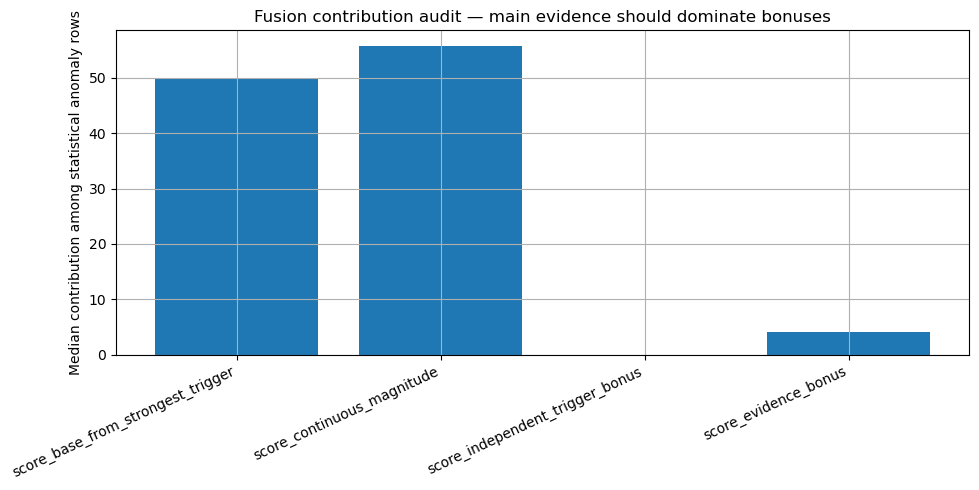

In [8]:
# =========================
# 14. Combine anomaly cases, severity, and scores
# =========================

# The broader bad_session_flag is context only. A sample inside a bad session is not automatically
# a sample-level anomaly unless a direct sample-level detector also fires.
lte_dl["bad_session_sample_flag"] = lte_dl["bad_session_sample_flag"] | (
    lte_dl["bad_session_flag"] & (lte_dl["underperform_vs_p75_flag"] | lte_dl.get("underperform_vs_rb_p75_flag", False))
)

# -------------------------
# A) Independent trigger families
# -------------------------
# Several flags are correlated. For example, fixed low throughput, P10, IQR, and robust-z
# all describe the same broad idea: "throughput is low". They should not stack as four
# independent pieces of evidence. We first create family-level triggers, then score the
# number of independent families.
lte_dl["low_tp_family_flag"] = (
    lte_dl["low_tp_fixed_flag"] |
    lte_dl["low_tp_global_p10_flag"] |
    lte_dl["low_tp_session_p10_flag"] |
    lte_dl["low_tp_robust_z_flag"] |
    lte_dl["low_tp_iqr_flag"]
)
lte_dl["temporal_drop_family_flag"] = lte_dl["rolling_drop_flag"] | lte_dl["sudden_drop_flag"]
lte_dl["sustained_window_family_flag"] = lte_dl["rolling_sustained_degradation_flag"]  # persistence modifier, not independent family
lte_dl["expected_tp_family_flag"] = lte_dl["underperform_vs_p75_flag"] | lte_dl.get("underperform_vs_rb_p75_flag", False)


# RB-efficiency method.
# RB usage tells us that resources were allocated. Throughput per RB tells us whether
# the allocated resources were converted efficiently into throughput. This is a strong
# candidate anomaly when RB demand is medium/high but throughput-per-RB is extremely low.
rb_values_for_eff = pd.to_numeric(lte_dl.get("rb_usage_value", pd.Series(np.nan, index=lte_dl.index)), errors="coerce")
lte_dl["throughput_per_rb"] = lte_dl["actual_lte_dl_throughput"] / rb_values_for_eff.replace(0, np.nan)
rb_eff_reference_mask = (
    lte_dl.get("rb_usage_evidence_reliable_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool) &
    lte_dl.get("rb_medium_or_high_usage_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool) &
    lte_dl["throughput_per_rb"].notna()
)
rb_eff_p10 = lte_dl.loc[rb_eff_reference_mask, "throughput_per_rb"].quantile(RB_EFFICIENCY_REFERENCE_QUANTILE) if rb_eff_reference_mask.any() else np.nan
lte_dl["rb_efficiency_p10_threshold"] = rb_eff_p10
lte_dl["low_rb_efficiency_high_rb_flag"] = (
    rb_eff_reference_mask &
    pd.notna(rb_eff_p10) &
    (lte_dl["throughput_per_rb"] <= rb_eff_p10) &
    (lte_dl["actual_lte_dl_throughput"] <= max(LOW_TP_FIXED_MBPS, VERY_LOW_TP_MBPS))
)
lte_dl["rb_efficiency_family_flag"] = lte_dl["low_rb_efficiency_high_rb_flag"]
lte_dl["score_rb_efficiency"] = ((rb_eff_p10 - lte_dl["throughput_per_rb"]) / max(float(rb_eff_p10) if pd.notna(rb_eff_p10) else 1e-9, 1e-9)).clip(lower=0, upper=1).fillna(0)
lte_dl["score_rb_efficiency"] = lte_dl["score_rb_efficiency"].where(lte_dl["low_rb_efficiency_high_rb_flag"], 0.0)

# Low throughput with low RB is still useful, but it means demand/resource uncertainty,
# not confirmed unexpected underperformance. It remains a case/context label and is score-capped later.
lte_dl["low_tp_low_rb_flag"] = (
    lte_dl["low_tp_family_flag"] &
    lte_dl.get("rb_usage_evidence_reliable_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool) &
    lte_dl.get("rb_low_usage_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool)
)

# RSRQ is useful evidence but noisy in the current plots. RSRQ alone should not dominate
# the radio-limited flag; it contributes strongly when SINR is also poor.
radio_bad_evidence = (
    lte_dl["poor_rsrp_flag"] |
    lte_dl["poor_sinr_flag"] |
    lte_dl["high_bler_flag"] |
    (lte_dl["poor_rsrq_flag"] & lte_dl["poor_sinr_flag"])
)

# Low throughput caused by clearly bad radio is still an anomaly, but it is radio-limited,
# not unexpected underperformance.
lte_dl["radio_limited_degradation_flag"] = (
    (lte_dl["low_tp_family_flag"] | lte_dl["temporal_drop_family_flag"] | lte_dl["sustained_window_family_flag"] | lte_dl["expected_tp_family_flag"]) &
    radio_bad_evidence
)
lte_dl["radio_limited_family_flag"] = lte_dl["radio_limited_degradation_flag"]  # case/context alias, not independent family

radio_ok_for_unexpected = ~radio_bad_evidence
lte_dl["unexpected_underperformance_flag"] = lte_dl["expected_tp_family_flag"] & radio_ok_for_unexpected

lte_dl["ca_active_flag"] = (
    (lte_dl["carrier_count"] >= 2) |
    lte_dl[["scell1_rsrp", "scell1_sinr", "scell1_cqi", "scell1_rb_count"]].notna().any(axis=1)
)

radio_ok_for_ca = ~(
    lte_dl["poor_rsrp_flag"] |
    lte_dl["poor_sinr_flag"] |
    lte_dl["high_bler_flag"]
)
if REQUIRE_RB_DEMAND_FOR_CA_UNDERPERFORMANCE and bool(lte_dl.get("rb_usage_evidence_reliable_flag", pd.Series(False, index=lte_dl.index)).fillna(False).any()):
    rb_demand_ok_for_ca = lte_dl.get("rb_medium_or_high_usage_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool)
else:
    rb_demand_ok_for_ca = pd.Series(True, index=lte_dl.index)

# CA underperformance is strict: CA is active, radio is not obviously poor, RB demand exists,
# and either radio-P75 or RB-conditioned P75 says throughput is far lower than expected.
lte_dl["ca_underperformance_flag"] = (
    lte_dl["anomaly_analysis_window_flag"].fillna(True).astype(bool) &
    lte_dl["ca_active_flag"] &
    radio_ok_for_ca &
    rb_demand_ok_for_ca &
    (
        (
            lte_dl["expected_tp_reliable_flag"] &
            (lte_dl["expected_tp_radio_p75"] >= CA_UNDERPERF_MIN_EXPECTED_MBPS) &
            (lte_dl["actual_lte_dl_throughput"] <= CA_UNDERPERF_MAX_ACTUAL_MBPS) &
            (lte_dl["throughput_ratio_p75"] <= CA_UNDERPERF_RATIO_THRESHOLD)
        ) |
        (
            lte_dl.get("expected_tp_rb_reliable_flag", False) &
            (lte_dl.get("expected_tp_rb_conditioned_p75", np.nan) >= CA_UNDERPERF_MIN_EXPECTED_MBPS) &
            (lte_dl["actual_lte_dl_throughput"] <= CA_UNDERPERF_MAX_ACTUAL_MBPS) &
            (lte_dl.get("throughput_ratio_rb_p75", np.nan) <= CA_UNDERPERF_RATIO_THRESHOLD)
        )
    )
)
lte_dl["ca_underperformance_family_flag"] = lte_dl["ca_underperformance_flag"]  # case/context alias, not independent family

# Event evidence is contextual only. It does not create an anomaly by itself.
lte_dl["event_related_degradation_flag"] = (
    (lte_dl["low_tp_family_flag"] | lte_dl["temporal_drop_family_flag"] | lte_dl["sustained_window_family_flag"] | lte_dl["expected_tp_family_flag"]) &
    (
        lte_dl.get("near_handover_mobility_flag", False) |
        lte_dl.get("near_rach_failure_flag", False) |
        lte_dl.get("rach_failure_direct_flag", False)
    )
)

# Only genuinely distinct detector families count toward independence/fusion confidence.
# P10/IQR/MAD/fixed/session-P10 stay visible as details inside LOW_LEVEL.
# Sustained-window, radio-limited, and CA labels are persistence/case/context modifiers.
trigger_family_cols = [
    "low_tp_family_flag",
    "temporal_drop_family_flag",
    "expected_tp_family_flag",
    "rb_efficiency_family_flag",
]
context_family_alias_cols = [
    "sustained_window_family_flag",
    "radio_limited_family_flag",
    "ca_underperformance_family_flag",
]
trigger_detail_cols = [
    "low_tp_fixed_flag",
    "low_tp_global_p10_flag",
    "low_tp_session_p10_flag",
    "low_tp_robust_z_flag",
    "low_tp_iqr_flag",
    "rolling_drop_flag",
    "rolling_sustained_degradation_flag",
    "sudden_drop_flag",
    "underperform_vs_p75_flag",
    "underperform_vs_rb_p75_flag",
    "low_rb_efficiency_high_rb_flag",
    "ca_underperformance_flag",
]
context_flag_cols = [
    "radio_limited_degradation_flag",
    "unexpected_underperformance_flag",
    "event_related_degradation_flag",
    "bad_session_flag",
    "bad_session_sample_flag",
    "underperform_vs_p75_context_flag",
    "underperform_vs_rb_p75_context_flag",
    "p75_underperformance_demand_unknown_context_flag",
    "low_tp_low_rb_flag",
    "rb_low_usage_flag",
]
for col in trigger_family_cols + context_family_alias_cols + trigger_detail_cols + context_flag_cols:
    if col not in lte_dl.columns:
        lte_dl[col] = False

lte_dl["independent_trigger_count"] = lte_dl[trigger_family_cols].fillna(False).astype(bool).sum(axis=1)
lte_dl["is_throughput_anomaly"] = lte_dl["independent_trigger_count"] > 0
lte_dl["anomaly_method_count"] = lte_dl["independent_trigger_count"]
lte_dl["context_flag_count"] = lte_dl[context_flag_cols].fillna(False).astype(bool).sum(axis=1)
lte_dl["trigger_family_flags"] = lte_dl[trigger_family_cols].fillna(False).astype(bool).apply(
    lambda row: ";".join([col.replace("_flag", "") for col, active in row.items() if active]) if row.any() else "none",
    axis=1,
)

# -------------------------
# B) Continuous evidence-based score
# -------------------------
score_cols = [
    "score_fixed_low_tp",
    "score_global_p10_low_tp",
    "score_session_p10_low_tp",
    "score_robust_z_low_tp",
    "score_iqr_low_tp",
    "score_rolling_drop",
    "score_rolling_bad_window",
    "score_bad_session",
    "score_sudden_drop",
    "score_group_p75_gap",
    "score_group_rb_p75_gap",
    "score_rb_efficiency",
]
for col in score_cols:
    if col not in lte_dl.columns:
        lte_dl[col] = 0.0

# Strongest trigger base. These are interpretable minimum anchors, not the full score.
severe_radio_p75_condition = (
    lte_dl["underperform_vs_p75_flag"].fillna(False).astype(bool) &
    (lte_dl["actual_lte_dl_throughput"] <= VERY_LOW_TP_MBPS) &
    (lte_dl["expected_tp_radio_p75"] >= 40) &
    (lte_dl["throughput_ratio_p75"] <= 0.20)
)
severe_rb_p75_condition = (
    lte_dl.get("underperform_vs_rb_p75_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool) &
    (lte_dl["actual_lte_dl_throughput"] <= VERY_LOW_TP_MBPS) &
    (lte_dl.get("expected_tp_rb_conditioned_p75", np.nan) >= 40) &
    (lte_dl.get("throughput_ratio_rb_p75", np.nan) <= 0.20)
)
severe_p75_condition = severe_radio_p75_condition | severe_rb_p75_condition
reliable_p75_condition = lte_dl["expected_tp_family_flag"].fillna(False).astype(bool)
rb_efficiency_condition = lte_dl.get("rb_efficiency_family_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool)
local_drop_condition = lte_dl["temporal_drop_family_flag"].fillna(False).astype(bool)
sustained_condition = lte_dl["sustained_window_family_flag"].fillna(False).astype(bool)
radio_limited_condition = lte_dl["radio_limited_family_flag"].fillna(False).astype(bool)
low_tp_condition = lte_dl["low_tp_family_flag"].fillna(False).astype(bool)

base_score_candidates = pd.concat([
    pd.Series(np.where(severe_p75_condition, MIN_SCORE_SEVERE_P75_UNDERPERF, 0), index=lte_dl.index),
    pd.Series(np.where(reliable_p75_condition, MIN_SCORE_P75_UNDERPERF, 0), index=lte_dl.index),
    pd.Series(np.where(rb_efficiency_condition, MIN_SCORE_P75_UNDERPERF, 0), index=lte_dl.index),
    pd.Series(np.where(local_drop_condition, MIN_SCORE_LOCAL_DROP, 0), index=lte_dl.index),
    pd.Series(np.where(sustained_condition, MIN_SCORE_SUSTAINED_LOW_WINDOW, 0), index=lte_dl.index),
    pd.Series(np.where(radio_limited_condition, MIN_SCORE_RADIO_LIMITED, 0), index=lte_dl.index),
    pd.Series(np.where(low_tp_condition, MIN_SCORE_FIXED_LOW_TP, 0), index=lte_dl.index),
    pd.Series(np.where(lte_dl["is_throughput_anomaly"], MIN_SCORE_ANY_TRIGGER, 0), index=lte_dl.index),
], axis=1)
lte_dl["score_base_from_strongest_trigger"] = base_score_candidates.max(axis=1)

# Continuous anomaly magnitude. This avoids artificial score piles caused by floors alone.
best_ratio = pd.concat([
    lte_dl["throughput_ratio_p75"],
    lte_dl.get("throughput_ratio_rb_p75", pd.Series(np.nan, index=lte_dl.index)),
], axis=1).min(axis=1)
best_gap = pd.concat([
    lte_dl["throughput_gap_p75"],
    lte_dl.get("throughput_gap_rb_p75", pd.Series(np.nan, index=lte_dl.index)),
], axis=1).max(axis=1)

lte_dl["score_magnitude_ratio_severity"] = ((0.60 - best_ratio) / 0.60).clip(lower=0, upper=1).fillna(0)
lte_dl["score_magnitude_gap_severity"] = (best_gap / MAGNITUDE_GAP_DENOMINATOR_MBPS).clip(lower=0, upper=1).fillna(0)
lte_dl["score_magnitude_low_tp_severity"] = ((MAGNITUDE_LOW_TP_REFERENCE_MBPS - lte_dl["actual_lte_dl_throughput"]) / MAGNITUDE_LOW_TP_REFERENCE_MBPS).clip(lower=0, upper=1).fillna(0)
rolling_gap_for_score = pd.concat([
    lte_dl.get("rolling_tp_gap", pd.Series(0, index=lte_dl.index)),
    lte_dl.get("tp_drop_from_prev", pd.Series(0, index=lte_dl.index)),
], axis=1).max(axis=1)
lte_dl["score_magnitude_drop_severity"] = (rolling_gap_for_score / MAGNITUDE_DROP_DENOMINATOR_MBPS).clip(lower=0, upper=1).fillna(0)

lte_dl["score_continuous_magnitude"] = 100 * (
    0.35 * lte_dl["score_magnitude_ratio_severity"] +
    0.25 * lte_dl["score_magnitude_gap_severity"] +
    0.25 * lte_dl["score_magnitude_low_tp_severity"] +
    0.15 * lte_dl["score_magnitude_drop_severity"]
)

# RB-efficiency severity is used as an additional continuous evidence dimension.
lte_dl["score_magnitude_rb_efficiency"] = lte_dl.get("score_rb_efficiency", pd.Series(0, index=lte_dl.index)).fillna(0)
lte_dl["score_continuous_magnitude"] = np.maximum(
    lte_dl["score_continuous_magnitude"],
    75 * lte_dl["score_magnitude_rb_efficiency"],
)

# Independent-trigger bonus. Count trigger families, not raw correlated flags.
lte_dl["score_independent_trigger_bonus"] = (
    MULTI_TRIGGER_BONUS_PER_LOG_STEP * np.log1p(np.maximum(lte_dl["independent_trigger_count"] - 1, 0))
).clip(lower=0, upper=MULTI_TRIGGER_BONUS_CAP)

# Capped evidence bonus. Context supports confidence but does not create anomalies by itself.
poor_radio_context_flag = radio_bad_evidence
near_event_context_flag = lte_dl["event_related_degradation_flag"].fillna(False).astype(bool)
# P10/IQR/robust-MAD remain individually visible detectors, but their agreement contributes
# only ONE bounded low-tail evidence term so correlated methods cannot inflate confidence.
low_tail_consensus_strength = pd.to_numeric(
    lte_dl.get("low_tail_robust_consensus_strength_0_1", pd.Series(0.0, index=lte_dl.index)), errors="coerce"
).fillna(0).clip(0, 1)
lte_dl["score_evidence_bonus"] = (
    3.0 * low_tail_consensus_strength +
    4 * lte_dl.get("rb_high_usage_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool).astype(int) +
    2 * lte_dl["ca_active_flag"].fillna(False).astype(bool).astype(int) +
    2 * near_event_context_flag.astype(int) +
    2 * poor_radio_context_flag.fillna(False).astype(bool).astype(int)
).clip(lower=0, upper=EVIDENCE_BONUS_CAP)

score_before_cap = np.maximum(lte_dl["score_base_from_strongest_trigger"], lte_dl["score_continuous_magnitude"])
score_before_cap = score_before_cap + lte_dl["score_independent_trigger_bonus"] + lte_dl["score_evidence_bonus"]
lte_dl["score_raw_before_caps"] = score_before_cap

# Preserve an uncapped analytical score for ranking/fusion. Operational uncertainty is
# applied smoothly so many rows do not collapse to exactly 45 or 95.
lte_dl["anomaly_score_raw_0_100"] = pd.Series(score_before_cap, index=lte_dl.index).clip(lower=0, upper=100)

low_rb_cap_mask = (
    lte_dl.get("rb_usage_evidence_reliable_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool) &
    lte_dl.get("rb_low_usage_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool) &
    ~lte_dl["radio_limited_family_flag"].fillna(False).astype(bool) &
    ~lte_dl["temporal_drop_family_flag"].fillna(False).astype(bool)
)
lte_dl["score_low_rb_cap_applied_flag"] = low_rb_cap_mask
# Smooth asymptotic uncertainty compression: approaches LOW_RB_DEMAND_SCORE_CAP without
# producing a pile of rows at the exact cap.
low_rb_smoothed = LOW_RB_DEMAND_SCORE_CAP * (
    1.0 - np.exp(-1.5 * pd.Series(score_before_cap, index=lte_dl.index) / max(LOW_RB_DEMAND_SCORE_CAP, 1e-6))
)
score_after_cap = pd.Series(score_before_cap, index=lte_dl.index).where(~low_rb_cap_mask, low_rb_smoothed)
lte_dl["score_after_low_rb_cap"] = score_after_cap

best_expected_for_score = pd.concat([
    lte_dl.get("expected_tp_radio_p75", pd.Series(np.nan, index=lte_dl.index)),
    lte_dl.get("expected_tp_rb_conditioned_p75", pd.Series(np.nan, index=lte_dl.index)),
], axis=1).max(axis=1)
lte_dl["catastrophic_score_allowed_flag"] = (
    (lte_dl["actual_lte_dl_throughput"] <= CATASTROPHIC_ACTUAL_TP_MBPS) &
    (best_expected_for_score >= CATASTROPHIC_EXPECTED_TP_MBPS) &
    lte_dl.get("rb_medium_or_high_usage_flag", pd.Series(False, index=lte_dl.index)).fillna(False).astype(bool) &
    (lte_dl["independent_trigger_count"] >= 2)
)
# Smooth high-end saturation toward the non-catastrophic cap while retaining ordering.
score_operational = score_after_cap.copy()
high_mask = score_operational > 85.0
score_operational.loc[high_mask] = 85.0 + (SCORE_SOFT_CAP_NON_CATASTROPHIC - 85.0) * (
    1.0 - np.exp(-(score_operational.loc[high_mask] - 85.0) / 10.0)
)
score_operational = score_operational.where(~lte_dl["catastrophic_score_allowed_flag"], 100.0)

lte_dl["anomaly_score_0_100"] = score_operational.clip(lower=0, upper=100)
lte_dl["anomaly_score_0_100"] = lte_dl["anomaly_score_0_100"].where(lte_dl["is_throughput_anomaly"], 0.0).round(1)

score_component_cols = [
    "score_base_from_strongest_trigger",
    "score_continuous_magnitude",
    "score_independent_trigger_bonus",
    "score_evidence_bonus",
    "score_low_rb_cap_applied_flag",
    "score_magnitude_ratio_severity",
    "score_magnitude_gap_severity",
    "score_magnitude_low_tp_severity",
    "score_magnitude_drop_severity",
    "score_magnitude_rb_efficiency",
    "score_raw_before_caps",
    "anomaly_score_raw_0_100",
    "score_after_low_rb_cap",
    "catastrophic_score_allowed_flag",
]

# -------------------------
# C) Case labels and severity
# -------------------------
CASE_FLAG_MAP = {
    "unexpected_underperformance": "unexpected_underperformance_flag",
    "radio_limited_degradation": "radio_limited_degradation_flag",
    "ca_underperformance": "ca_underperformance_flag",
    "rb_efficiency_underperformance": "low_rb_efficiency_high_rb_flag",
    "rb_conditioned_underperformance": "underperform_vs_rb_p75_flag",
    "resource_limited_or_demand_uncertain_low_throughput": "low_tp_low_rb_flag",
    "radio_p75_underperformance": "underperform_vs_p75_flag",
    "sudden_drop": "sudden_drop_flag",
    "rolling_local_drop": "rolling_drop_flag",
    "sustained_low_throughput_window": "rolling_sustained_degradation_flag",
    "fixed_low_throughput": "low_tp_fixed_flag",
    "global_percentile_low_throughput": "low_tp_global_p10_flag",
    "session_percentile_low_throughput": "low_tp_session_p10_flag",
    "iqr_extreme_low_throughput": "low_tp_iqr_flag",
    "robust_z_extreme_low_throughput": "low_tp_robust_z_flag",
}

case_df = pd.DataFrame(index=lte_dl.index)
for label, col in CASE_FLAG_MAP.items():
    case_df[label] = lte_dl[col].fillna(False).astype(bool) if col in lte_dl.columns else False

lte_dl["anomaly_type_flags"] = case_df.apply(
    lambda row: ";".join([label for label, active in row.items() if active]) if row.any() else "not_flagged",
    axis=1,
)

# Specific-first priority. Generic unexpected-underperformance should not hide
# CA, RB-conditioned, RB-efficiency, or radio-P75-specific cases.
priority_labels = [
    "ca_underperformance",
    "rb_efficiency_underperformance",
    "rb_conditioned_underperformance",
    "radio_p75_underperformance",
    "unexpected_underperformance",
    "radio_limited_degradation",
    "sudden_drop",
    "rolling_local_drop",
    "sustained_low_throughput_window",
    "resource_limited_or_demand_uncertain_low_throughput",
    "fixed_low_throughput",
    "global_percentile_low_throughput",
    "session_percentile_low_throughput",
    "iqr_extreme_low_throughput",
    "robust_z_extreme_low_throughput",
]
conditions = [case_df[label].values for label in priority_labels]
lte_dl["anomaly_type"] = np.select(conditions, priority_labels, default="not_flagged")
lte_dl.loc[~lte_dl["is_throughput_anomaly"], "anomaly_type"] = "not_flagged"
lte_dl.loc[~lte_dl["is_throughput_anomaly"], "anomaly_type_flags"] = "not_flagged"

# Severity combines score thresholds with technical severity criteria.
SEVERITY_ORDER = {"Normal": 0, "Low": 1, "Medium": 2, "High": 3, "Critical": 4}
REVERSE_SEVERITY_ORDER = {v: k for k, v in SEVERITY_ORDER.items()}


def max_severity(a: str, b: str) -> str:
    return REVERSE_SEVERITY_ORDER[max(SEVERITY_ORDER.get(a, 0), SEVERITY_ORDER.get(b, 0))]


def cap_severity(severity: str, max_allowed: str) -> str:
    return REVERSE_SEVERITY_ORDER[min(SEVERITY_ORDER.get(severity, 0), SEVERITY_ORDER.get(max_allowed, 0))]


def assign_severity_v3(row: pd.Series) -> str:
    if not bool(row.get("is_throughput_anomaly", False)):
        return "Normal"

    actual = row.get("actual_lte_dl_throughput", np.nan)
    expected_radio = row.get("expected_tp_radio_p75", np.nan)
    expected_rb = row.get("expected_tp_rb_conditioned_p75", np.nan)
    expected = np.nanmax([expected_radio, expected_rb])
    ratio_radio = row.get("throughput_ratio_p75", np.nan)
    ratio_rb = row.get("throughput_ratio_rb_p75", np.nan)
    ratio = np.nanmin([ratio_radio, ratio_rb])
    reliable = bool(row.get("expected_tp_reliable_flag", False)) or bool(row.get("expected_tp_rb_reliable_flag", False))
    score = row.get("anomaly_score_0_100", 0)
    families = int(row.get("independent_trigger_count", 0))

    catastrophic = bool(row.get("catastrophic_score_allowed_flag", False))
    rb_confirmed = bool(row.get("rb_medium_or_high_usage_flag", False))
    radio_limited = bool(row.get("radio_limited_degradation_flag", False)) or bool(row.get("radio_limited_family_flag", False))
    temporal_drop = bool(row.get("temporal_drop_family_flag", False))

    severity = "Low"
    if reliable and pd.notna(actual) and pd.notna(expected) and pd.notna(ratio):
        if catastrophic and score >= 85:
            severity = "Critical"
        elif actual <= 2.0 and expected >= 50 and ratio <= 0.15 and rb_confirmed and score >= 85:
            severity = "Critical"
        elif actual <= LOW_TP_FIXED_MBPS and expected >= 25 and ratio <= 0.35:
            # Low-RB/demand-uncertain rows should not become High only because the
            # radio-P75 reference is high. Require RB confirmation or direct radio/temporal evidence.
            severity = "High" if (rb_confirmed or radio_limited or temporal_drop) else "Medium"

    if severity != "Critical":
        if score >= 85 and families >= 3 and rb_confirmed:
            severity = max_severity(severity, "High")
        if score >= 60 or families >= 4:
            severity = max_severity(severity, "High")
        elif score >= 35 or families >= 2:
            severity = max_severity(severity, "Medium")

    # Final cap for demand-uncertain low-RB rows unless there is radio or temporal evidence.
    if bool(row.get("score_low_rb_cap_applied_flag", False)) and not radio_limited and not temporal_drop:
        severity = cap_severity(severity, "Medium")

    return severity


lte_dl["anomaly_severity"] = lte_dl.apply(assign_severity_v3, axis=1)

# Candidate-vs-handoff split. The candidate flag remains broad for monitoring/QC. The
# RCA handoff flag is stricter and suppresses weak low-RB-only candidates.
lte_dl["weak_low_rb_only_candidate_flag"] = (
    lte_dl["low_tp_low_rb_flag"].fillna(False).astype(bool) &
    ~lte_dl["radio_limited_family_flag"].fillna(False).astype(bool) &
    ~lte_dl["temporal_drop_family_flag"].fillna(False).astype(bool) &
    ~lte_dl["expected_tp_family_flag"].fillna(False).astype(bool) &
    ~lte_dl["rb_efficiency_family_flag"].fillna(False).astype(bool)
)
lte_dl["rca_handoff_flag"] = (
    lte_dl["is_throughput_anomaly"].fillna(False).astype(bool) &
    (lte_dl["anomaly_score_0_100"] >= RCA_HANDOFF_MIN_SCORE) &
    (
        lte_dl["expected_tp_family_flag"].fillna(False).astype(bool) |
        lte_dl["rb_efficiency_family_flag"].fillna(False).astype(bool) |
        lte_dl["radio_limited_family_flag"].fillna(False).astype(bool) |
        lte_dl["temporal_drop_family_flag"].fillna(False).astype(bool) |
        lte_dl["sustained_window_family_flag"].fillna(False).astype(bool)
    ) &
    ~lte_dl["weak_low_rb_only_candidate_flag"].fillna(False).astype(bool)
)

# -------------------------
# D) Summary tables and QC
# -------------------------
flag_roles = {c: "trigger_detail" for c in trigger_detail_cols}
flag_roles.update({c: "trigger_family_independent" for c in trigger_family_cols})
flag_roles.update({c: "context_or_case_family_alias" for c in context_family_alias_cols})
flag_roles.update({
    "radio_limited_degradation_flag": "case_context",
    "unexpected_underperformance_flag": "case_context",
    "event_related_degradation_flag": "context_only",
    "bad_session_flag": "context_only",
    "bad_session_sample_flag": "context_only",
    "underperform_vs_p75_context_flag": "context_only",
    "underperform_vs_rb_p75_context_flag": "context_only",
    "p75_underperformance_demand_unknown_context_flag": "context_only",
    "low_tp_low_rb_flag": "case_context",
    "low_rb_efficiency_high_rb_flag": "trigger_detail",
    "rb_efficiency_family_flag": "trigger_family",
    "rb_low_usage_flag": "context_only",
    "weak_low_rb_only_candidate_flag": "context_only",
    "is_throughput_anomaly": "candidate_gate",
    "rca_handoff_flag": "handoff_gate",
})
summary_cols = list(dict.fromkeys(trigger_family_cols + context_family_alias_cols + trigger_detail_cols + context_flag_cols + ["low_tail_robust_consensus_flag", "weak_low_rb_only_candidate_flag", "is_throughput_anomaly", "rca_handoff_flag"]))
analysis_denominator = int(lte_dl["anomaly_analysis_window_flag"].fillna(True).astype(bool).sum()) if "anomaly_analysis_window_flag" in lte_dl.columns else len(lte_dl)
method_summary = pd.DataFrame([
    {
        "method_or_case": col,
        "flag_role": flag_roles.get(col, "unknown"),
        "flagged_rows": int(lte_dl[col].fillna(False).astype(bool).sum()),
        "flagged_pct": round(float(lte_dl[col].fillna(False).astype(bool).sum() / max(analysis_denominator, 1) * 100), 3),
        "flagged_pct_of_all_lte_dl_rows": round(float(lte_dl[col].fillna(False).astype(bool).mean() * 100), 3),
    }
    for col in summary_cols
    if col in lte_dl.columns
])
save_table(method_summary, "anomaly_method_summary.csv")
display(method_summary)

flag_overlap_summary = (
    lte_dl.groupby(["independent_trigger_count", "context_flag_count"], dropna=False)
    .agg(
        rows=("actual_lte_dl_throughput", "count"),
        anomaly_rows=("is_throughput_anomaly", "sum"),
        mean_score=("anomaly_score_0_100", "mean"),
        median_score=("anomaly_score_0_100", "median"),
        median_tp=("actual_lte_dl_throughput", "median"),
    )
    .reset_index()
    .sort_values(["independent_trigger_count", "context_flag_count"])
)
for c in ["mean_score", "median_score", "median_tp"]:
    flag_overlap_summary[c] = flag_overlap_summary[c].astype(float).round(3)
save_table(flag_overlap_summary, "anomaly_flag_overlap_summary.csv")
display(flag_overlap_summary)

# Score distribution QC. These warnings help tune whether scores are too compressed or too severe.
flagged_scores = lte_dl.loc[lte_dl["is_throughput_anomaly"], "anomaly_score_0_100"].dropna()
score_qc_rows = []
if not flagged_scores.empty:
    score_qc_rows.append({"metric": "flagged_rows", "value": len(flagged_scores), "qc_note": "Number of anomaly rows used for score-distribution checks."})
    for q in [0.10, 0.25, 0.50, 0.75, 0.80, 0.90, 0.95, 0.99]:
        score_qc_rows.append({"metric": f"score_p{int(q*100):02d}", "value": float(flagged_scores.quantile(q)), "qc_note": "Flagged-score percentile."})
    severity_pct = lte_dl.loc[lte_dl["is_throughput_anomaly"], "anomaly_severity"].value_counts(normalize=True) * 100
    for sev, pct in severity_pct.items():
        score_qc_rows.append({"metric": f"severity_pct_{sev}", "value": float(pct), "qc_note": "Share of flagged rows by severity."})

    if float(flagged_scores.quantile(0.95)) < 60:
        score_qc_rows.append({"metric": "warning_score_compressed", "value": 1, "qc_note": "P95 flagged score is below 60; scoring may still be too compressed."})
    if float((lte_dl.loc[lte_dl["is_throughput_anomaly"], "anomaly_severity"] == "Critical").mean() * 100) > 10:
        score_qc_rows.append({"metric": "warning_critical_pct_high", "value": 1, "qc_note": "Critical percentage is above 10%; review severity/score scaling."})
    if float(flagged_scores.quantile(0.50)) < 35:
        score_qc_rows.append({"metric": "warning_median_score_low", "value": 1, "qc_note": "Median flagged score is below 35; many anomalies may be weak candidates."})
    low_rb_cap_pile_pct = float((flagged_scores == LOW_RB_DEMAND_SCORE_CAP).mean() * 100)
    soft_cap_pile_pct = float((flagged_scores == SCORE_SOFT_CAP_NON_CATASTROPHIC).mean() * 100)
    score_qc_rows.append({"metric": "pct_exact_low_rb_cap", "value": low_rb_cap_pile_pct, "qc_note": "Share of flagged scores exactly at the low-RB cap."})
    score_qc_rows.append({"metric": "pct_exact_soft_cap", "value": soft_cap_pile_pct, "qc_note": "Share of flagged scores exactly at the non-catastrophic soft cap."})
    if low_rb_cap_pile_pct > 10:
        score_qc_rows.append({"metric": "warning_low_rb_cap_pileup", "value": 1, "qc_note": "Many anomalies sit exactly at the low-RB cap; ranking may be compressed."})
    if soft_cap_pile_pct > 5:
        score_qc_rows.append({"metric": "warning_soft_cap_pileup", "value": 1, "qc_note": "Many anomalies sit exactly at the soft cap; high-end ranking may be compressed."})
score_qc = pd.DataFrame(score_qc_rows)
if not score_qc.empty:
    score_qc["value"] = pd.to_numeric(score_qc["value"], errors="coerce").round(3)
save_table(score_qc, "anomaly_score_distribution_qc.csv")
display(score_qc)

# Percentage sanity review. These are not hard pass/fail rules; they flag methods that deserve a look.
expected_pct_ranges = {
    "low_tp_fixed_flag": (10, 25, "10 Mbps should capture the lower tail, not half the route."),
    "low_tp_global_p10_flag": (9, 11, "Global P10 should be almost exactly 10% by construction."),
    "low_tp_session_p10_flag": (3, 12, "Session P10 should be lower than 10% overall after the low-session-threshold guard."),
    "low_tp_robust_z_flag": (1, 6, "Robust z is an extreme lower-tail method; 0% usually means the threshold is too strict."),
    "low_tp_iqr_flag": (1, 6, "Log-IQR should catch only extreme low-throughput outliers."),
    "rolling_drop_flag": (3, 15, "Rolling drop should capture local collapses, not every low segment."),
    "rolling_sustained_degradation_flag": (5, 18, "Sustained window degradation can be broader than extreme outlier methods."),
    "sudden_drop_flag": (3, 15, "Sudden one-sample drops are common in drive tests but should stay bounded."),
    "underperform_vs_p75_flag": (1, 10, "Reliable radio-P75 underperformance should be narrower after RB-demand gating."),
    "underperform_vs_rb_p75_flag": (1, 10, "RB-conditioned P75 underperformance should be narrow and high confidence."),
    "low_rb_efficiency_high_rb_flag": (0.5, 8, "Low throughput-per-RB under medium/high RB should be narrow and high confidence."),
    "rb_efficiency_family_flag": (0.5, 8, "RB-efficiency family should not dominate; it confirms inefficient use of allocated RBs."),
    "expected_tp_family_flag": (2, 15, "Expected-throughput family combines radio-P75 and RB-conditioned P75."),
    "unexpected_underperformance_flag": (2, 12, "Unexpected underperformance should be narrower than broad P75 context."),
    "radio_limited_degradation_flag": (3, 18, "With calibrated poor-radio thresholds, this should focus on clearly bad radio evidence."),
    "ca_underperformance_flag": (1, 8, "Tightened CA underperformance should not dominate the anomaly table."),
    "event_related_degradation_flag": (3, 18, "Event evidence is contextual and should not use near_any_event."),
    "is_throughput_anomaly": (8, 26, "Broad statistical candidate gate. The stricter RCA handoff is controlled separately."),
    "rca_handoff_flag": (8, 22, "Practical RCA handoff subset after weak low-RB-only suppression."),
}
qc_rows = []
for _, row in method_summary.iterrows():
    method = row["method_or_case"]
    pct = float(row["flagged_pct"])
    lo, hi, note = expected_pct_ranges.get(method, (0, 100, "No fixed review band configured."))
    status = "OK"
    if pct < lo:
        status = "LOW_REVIEW"
    elif pct > hi:
        status = "HIGH_REVIEW"
    qc_rows.append({
        "method_or_case": method,
        "flag_role": row.get("flag_role", "unknown"),
        "flagged_pct": pct,
        "expected_low_pct": lo,
        "expected_high_pct": hi,
        "qc_status": status,
        "interpretation": note,
    })
percentage_qc_review = pd.DataFrame(qc_rows)
save_table(percentage_qc_review, "anomaly_percentage_qc_review.csv")
display(percentage_qc_review)

leaked_default_rows = int(((lte_dl["is_throughput_anomaly"]) & (lte_dl["anomaly_type"] == "not_flagged")).sum())
if leaked_default_rows:
    print(f"WARNING: {leaked_default_rows} anomaly rows still have anomaly_type='not_flagged'. Review CASE_FLAG_MAP.")
else:
    print("Sanity check passed: every anomaly row has a non-default anomaly_type.")


# -------------------------
# E) Empirical fusion-weight validation
# -------------------------
# This does not auto-tune weights on the same data. It diagnoses whether a component dominates
# the fused score, whether independent families are actually redundant, and whether the robust
# low-tail trio is being treated as one bounded evidence source as intended.
fusion_validation_mask = lte_dl["is_throughput_anomaly"].fillna(False).astype(bool)
fusion_component_cols = [
    "score_base_from_strongest_trigger", "score_continuous_magnitude",
    "score_independent_trigger_bonus", "score_evidence_bonus",
]
fusion_component_rows = []
for col in fusion_component_cols:
    vals = pd.to_numeric(lte_dl.loc[fusion_validation_mask, col], errors="coerce")
    fusion_component_rows.append({
        "component": col,
        "mean": vals.mean(), "median": vals.median(), "p90": vals.quantile(0.90),
        "nonzero_pct": 100 * vals.gt(0).mean() if len(vals) else np.nan,
    })
fusion_component_validation = pd.DataFrame(fusion_component_rows)

# Pairwise Jaccard among the four independent families. High overlap is a warning that
# independence assumptions should be reviewed, not a reason to silently retune weights.
family_overlap_rows = []
for a in trigger_family_cols:
    A = lte_dl[a].fillna(False).astype(bool)
    for b in trigger_family_cols:
        B = lte_dl[b].fillna(False).astype(bool)
        union = int((A | B).sum()); inter = int((A & B).sum())
        family_overlap_rows.append({
            "family_a": a, "family_b": b, "intersection_rows": inter,
            "union_rows": union, "jaccard": inter / union if union else np.nan,
        })
fusion_family_overlap = pd.DataFrame(family_overlap_rows)

# Weight-health flags: evidence/bonus terms should support—not dominate—the main base/magnitude.
base_mag = pd.concat([
    pd.to_numeric(lte_dl.loc[fusion_validation_mask, "score_base_from_strongest_trigger"], errors="coerce"),
    pd.to_numeric(lte_dl.loc[fusion_validation_mask, "score_continuous_magnitude"], errors="coerce"),
], axis=1).max(axis=1)
bonus_total = (
    pd.to_numeric(lte_dl.loc[fusion_validation_mask, "score_independent_trigger_bonus"], errors="coerce").fillna(0) +
    pd.to_numeric(lte_dl.loc[fusion_validation_mask, "score_evidence_bonus"], errors="coerce").fillna(0)
)
fusion_weight_health = pd.DataFrame([{
    "anomaly_rows": int(fusion_validation_mask.sum()),
    "median_base_or_magnitude": float(base_mag.median()) if len(base_mag) else np.nan,
    "median_total_bonus": float(bonus_total.median()) if len(bonus_total) else np.nan,
    "p90_total_bonus": float(bonus_total.quantile(0.90)) if len(bonus_total) else np.nan,
    "pct_rows_bonus_exceeds_base_or_magnitude": float(100 * (bonus_total > base_mag).mean()) if len(base_mag) else np.nan,
    "verdict": "REVIEW_IF_BONUS_DOMINATES" if len(base_mag) and (bonus_total > base_mag).mean() > 0.10 else "BONUS_IS_SUPPORTING_EVIDENCE",
}])

save_table(fusion_component_validation, "fusion_component_empirical_validation.csv", category="key")
save_table(fusion_family_overlap, "fusion_independent_family_overlap.csv", category="key")
save_table(fusion_weight_health, "fusion_weight_health_check.csv", category="key")
print("Empirical fusion component validation:")
display(fusion_component_validation.round(3))
display(fusion_weight_health.round(3))

if len(fusion_component_validation):
    plt.figure(figsize=(10,5))
    plt.bar(fusion_component_validation["component"], fusion_component_validation["median"].fillna(0))
    plt.ylabel("Median contribution among statistical anomaly rows")
    plt.title("Fusion contribution audit — main evidence should dominate bonuses")
    plt.xticks(rotation=25, ha="right")
    save_current_plot("stat_28_fusion_component_contribution_audit.png")
    plt.show()


Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\worst_performing_cells_ranked.csv  shape=(269, 40)
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\worst_performing_pci_ranked.csv  shape=(146, 36)
Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\14b_worst_performing_cells_ranked.png


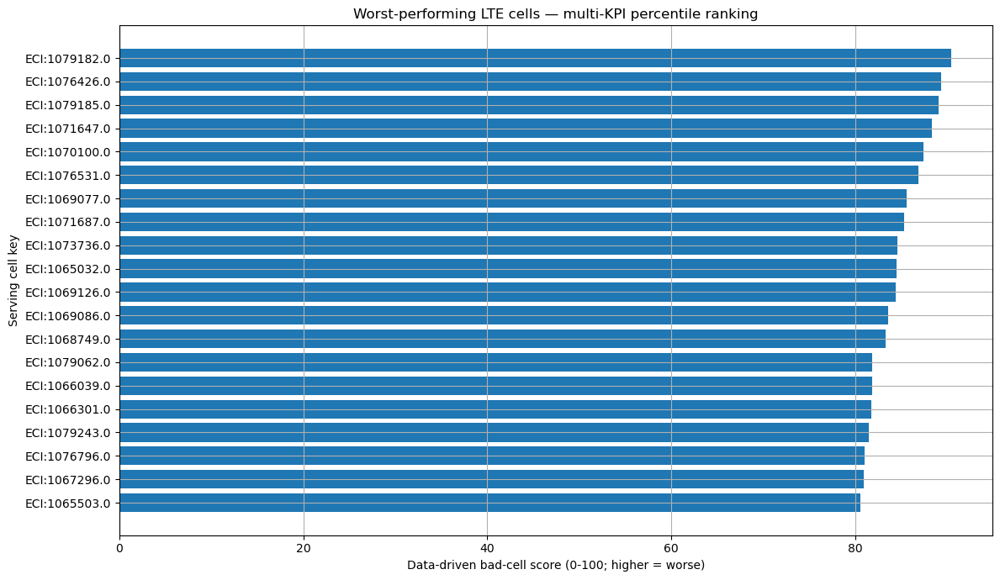

Ranked cells: 269 | Ranked PCI-only groups: 146


,serving_cell_key,rows,sessions,median_tp_mbps,p10_tp_mbps,mean_tp_mbps,low_tp_pct,stat_anomaly_pct,rca_handoff_pct,median_p75_gap_mbps,p90_p75_gap_mbps,median_rsrp_dbm,median_rsrq_db,median_sinr_db,median_cqi,median_mcs,median_bler_pct,p90_bler_pct,median_rb_usage,median_tp_per_rb,median_tp_badness,p10_tp_badness,anomaly_rate_badness,p75_gap_badness,cqi_badness,mcs_badness,bler_badness,sinr_badness,rsrq_badness,rsrp_badness,bad_entity_score_0_100,entity_label,bad_entity_rank,bad_entity_percentile,bad_entity_candidate_flag,rank_reliability,serving_pci,serving_eci,serving_earfcn,serving_band
0,ECI:1079182.0,35,2,7.275304,1.964522,8.944258,71.428571,91.428571,74.285714,37.180173,57.541079,-102.256165,-12.995146,4.244084,8.0,6.0,9.259259,15.249027,125.0,0.063230,0.951673,0.828996,0.985130,0.866171,0.739777,0.994424,0.868030,0.977695,0.925651,0.780669,90.37,cell_key,1,100.00,True,LOW,385.0,1079182.0,41186.0,41.0
1,ECI:1076426.0,94,4,2.183432,0.122512,4.970890,89.361702,91.489362,52.127660,42.270146,58.066313,-104.294042,-11.788887,3.880067,6.0,6.0,3.868460,21.884669,74.0,0.032549,0.996283,0.966543,0.988848,0.895911,0.955390,0.994424,0.263941,0.988848,0.814126,0.843866,89.35,cell_key,2,99.63,True,MEDIUM,375.0,1076426.0,500.0,1.0
2,ECI:1079185.0,45,3,14.514736,2.312883,16.474504,40.000000,66.666667,66.666667,35.946499,47.904124,-94.311170,-11.812500,5.258620,5.0,7.0,9.311225,13.222516,160.0,0.087256,0.884758,0.810409,0.951673,0.851301,0.994424,0.985130,0.877323,0.933086,0.825279,0.420074,89.07,cell_key,3,99.26,True,LOW,385.0,1079185.0,41384.0,41.0
3,ECI:1071647.0,85,5,4.661624,0.273858,6.288917,78.823529,78.823529,37.647059,26.523032,52.647923,-102.957860,-10.908334,6.102128,6.0,11.0,7.738095,14.038951,67.0,0.068826,0.977695,0.936803,0.970260,0.743494,0.955390,0.933086,0.579926,0.903346,0.672862,0.802974,88.27,cell_key,4,98.88,True,MEDIUM,395.0,1071647.0,1850.0,3.0
4,ECI:1070100.0,30,2,11.794504,4.338938,12.675429,40.000000,63.333333,60.000000,30.100970,37.758019,-110.379270,-12.421503,3.211607,6.5,8.5,8.448898,13.929264,142.0,0.080442,0.925651,0.713755,0.944238,0.776952,0.921933,0.981413,0.710037,0.996283,0.888476,0.977695,87.41,cell_key,5,98.51,True,LOW,332.0,1070100.0,500.0,1.0
5,ECI:1076531.0,42,2,1.980864,0.480622,3.330783,95.238095,97.619048,30.952381,29.804164,39.448478,-109.373722,-11.571812,6.176419,8.0,11.0,6.095672,11.849871,49.0,0.048703,1.000000,0.921933,1.000000,0.773234,0.739777,0.933086,0.468401,0.899628,0.791822,0.959108,86.83,cell_key,6,98.14,True,LOW,182.0,1076531.0,41186.0,41.0
6,ECI:1069077.0,56,5,5.078936,0.930688,11.178798,60.714286,66.071429,42.857143,10.592109,29.112544,-113.140200,-10.705509,5.073601,7.0,9.5,8.561248,14.996135,75.5,0.064914,0.970260,0.884758,0.947955,0.434944,0.873606,0.966543,0.743494,0.940520,0.628253,0.992565,85.59,cell_key,7,97.77,True,MEDIUM,140.0,1069077.0,500.0,1.0
7,ECI:1071687.0,36,2,2.593712,1.040292,3.241342,97.222222,97.222222,47.222222,6.438752,23.215560,-105.466768,-11.454085,4.986049,6.0,9.0,7.900946,13.269143,58.0,0.042987,0.988848,0.877323,0.992565,0.319703,0.955390,0.973978,0.602230,0.951673,0.773234,0.862454,85.25,cell_key,8,97.40,True,LOW,395.0,1071687.0,9310.0,28.0
8,ECI:1073736.0,82,4,4.909248,0.737702,6.641640,80.487805,84.146341,57.317073,6.374488,19.442859,-104.660780,-11.594877,5.622658,6.0,11.0,7.980496,17.205081,73.0,0.062361,0.973978,0.895911,0.977695,0.315985,0.955390,0.933086,0.613383,0.918216,0.795539,0.851301,84.52,cell_key,9,97.03,True,MEDIUM,363.0,1073736.0,9310.0,28.0
9,ECI:1065032.0,66,4,4.249308,0.009104,5.779771,77.272727,77.272727,37.878788,5.086268,16.661200,-101.944927,-11.248178,5.072572,6.0,10.0,7.045374,15.620520,71.5,0.064085,0.981413,0.996283,0.966543,0.275093,0.955390,0.953532,0.542751,0.944238,0.717472,0.769517,84.49,cell_key,10,96.65,True,MEDIUM,469.0,1065032.0,9310.0,28.0


In [9]:
# =========================
# 14B. Worst-performing cell / PCI ranking for RCA investigation
# =========================

# PCI can be reused across the network, so the primary ranking uses a cell key:
# ECI when available; otherwise EARFCN+PCI. A separate PCI-only ranking is exported as
# a secondary view and should be interpreted with reuse caution.

def _mode_or_nan(s: pd.Series):
    m = s.dropna().mode()
    return m.iloc[0] if len(m) else np.nan


def build_cell_key(frame: pd.DataFrame) -> pd.Series:
    eci = frame.get("serving_eci", pd.Series(np.nan, index=frame.index))
    earfcn = frame.get("serving_earfcn", pd.Series(np.nan, index=frame.index))
    pci = frame.get("serving_pci", pd.Series(np.nan, index=frame.index))
    out = pd.Series(index=frame.index, dtype="object")
    has_eci = eci.notna()
    out.loc[has_eci] = "ECI:" + eci.loc[has_eci].astype(str)
    fallback = ~has_eci & pci.notna()
    out.loc[fallback] = "EARFCN:" + earfcn.loc[fallback].astype(str) + "|PCI:" + pci.loc[fallback].astype(str)
    return out

lte_dl["serving_cell_key"] = build_cell_key(lte_dl)

def rank_bad_entities(frame: pd.DataFrame, group_col: str, entity_label: str, min_rows: int) -> pd.DataFrame:
    valid = frame[frame[group_col].notna()].copy()
    if valid.empty:
        return pd.DataFrame()

    agg_spec = {
        "rows": (TARGET_COL, "size"),
        "sessions": ("id", "nunique"),
        "median_tp_mbps": (TARGET_COL, "median"),
        "p10_tp_mbps": (TARGET_COL, lambda s: pd.to_numeric(s, errors="coerce").quantile(0.10)),
        "mean_tp_mbps": (TARGET_COL, "mean"),
        "low_tp_pct": ("low_tp_family_flag", lambda s: 100 * pd.Series(s).fillna(False).astype(bool).mean()),
        "stat_anomaly_pct": ("is_throughput_anomaly", lambda s: 100 * pd.Series(s).fillna(False).astype(bool).mean()),
        "rca_handoff_pct": ("rca_handoff_flag", lambda s: 100 * pd.Series(s).fillna(False).astype(bool).mean()),
        "median_p75_gap_mbps": ("throughput_gap_p75", "median"),
        "p90_p75_gap_mbps": ("throughput_gap_p75", lambda s: pd.to_numeric(s, errors="coerce").quantile(0.90)),
        "median_rsrp_dbm": ("lte_rsrp", "median"),
        "median_rsrq_db": ("lte_rsrq", "median"),
        "median_sinr_db": ("lte_sinr", "median"),
        "median_cqi": ("lte_cqi", "median"),
        "median_mcs": ("lte_mcs", "median"),
        "median_bler_pct": ("lte_bler", "median"),
        "p90_bler_pct": ("lte_bler", lambda s: pd.to_numeric(s, errors="coerce").quantile(0.90)),
        "median_rb_usage": ("rb_usage_value", "median"),
        "median_tp_per_rb": ("throughput_per_rb", "median"),
    }
    # Only retain aggregations whose source columns exist.
    agg_spec = {k:v for k,v in agg_spec.items() if v[0] in valid.columns}
    ranked = valid.groupby(group_col, dropna=False).agg(**agg_spec).reset_index()
    ranked = ranked[(ranked["rows"] >= min_rows) & (ranked["sessions"] >= CELL_RANK_MIN_SESSIONS)].copy()
    if ranked.empty:
        return ranked

    # Percentile badness is fully data-driven. Higher = worse.
    # Low throughput/CQI/MCS/SINR => bad; high BLER/anomaly/gap => bad.
    components = {
        # Throughput remains the primary definition of bad performance. Radio/PHY KPIs explain
        # whether that poor performance is accompanied by coverage/interference/link-quality evidence.
        "median_tp_badness": ("median_tp_mbps", "low", 0.25),
        "p10_tp_badness": ("p10_tp_mbps", "low", 0.12),
        "anomaly_rate_badness": ("stat_anomaly_pct", "high", 0.13),
        "p75_gap_badness": ("median_p75_gap_mbps", "high", 0.10),
        "cqi_badness": ("median_cqi", "low", 0.10),
        "mcs_badness": ("median_mcs", "low", 0.08),
        "bler_badness": ("median_bler_pct", "high", 0.10),
        "sinr_badness": ("median_sinr_db", "low", 0.06),
        "rsrq_badness": ("median_rsrq_db", "low", 0.04),
        "rsrp_badness": ("median_rsrp_dbm", "low", 0.02),
    }
    weighted_sum = pd.Series(0.0, index=ranked.index)
    available_weight = pd.Series(0.0, index=ranked.index)
    for out_col, (source_col, direction, weight) in components.items():
        if source_col not in ranked.columns:
            ranked[out_col] = np.nan
            continue
        s = pd.to_numeric(ranked[source_col], errors="coerce")
        if direction == "low":
            bad = s.rank(pct=True, ascending=False, method="average")
        else:
            bad = s.rank(pct=True, ascending=True, method="average")
        ranked[out_col] = bad
        valid_comp = bad.notna()
        weighted_sum.loc[valid_comp] += weight * bad.loc[valid_comp]
        available_weight.loc[valid_comp] += weight
    ranked["bad_entity_score_0_100"] = (100 * weighted_sum / available_weight.replace(0, np.nan)).round(2)
    ranked["entity_label"] = entity_label
    ranked = ranked.sort_values(["bad_entity_score_0_100", "rows"], ascending=[False, False]).reset_index(drop=True)
    ranked["bad_entity_rank"] = np.arange(1, len(ranked) + 1)
    ranked["bad_entity_percentile"] = (100 * (1 - (ranked["bad_entity_rank"] - 1) / max(len(ranked), 1))).round(2)
    ranked["bad_entity_candidate_flag"] = ranked["bad_entity_rank"] <= max(1, int(np.ceil(0.10 * len(ranked))))
    # Ranking reliability is reported, not used to hide entities. This prevents a cell seen in only
    # one short route segment from looking equally certain as a cell observed repeatedly.
    ranked["rank_reliability"] = np.select(
        [(ranked["sessions"] >= 3) & (ranked["rows"] >= 100), (ranked["sessions"] >= 2) & (ranked["rows"] >= 50)],
        ["HIGH", "MEDIUM"], default="LOW",
    )
    return ranked

cell_rank = rank_bad_entities(lte_dl, "serving_cell_key", "cell_key", CELL_RANK_MIN_ROWS)
pci_rank = rank_bad_entities(lte_dl, "serving_pci", "pci_only_reuse_caution", CELL_RANK_MIN_ROWS)

# Add identity/context columns to cell ranking.
if not cell_rank.empty:
    cell_identity = (
        lte_dl[lte_dl["serving_cell_key"].notna()]
        .groupby("serving_cell_key", dropna=False)
        .agg(
            serving_pci=("serving_pci", _mode_or_nan),
            serving_eci=("serving_eci", _mode_or_nan),
            serving_earfcn=("serving_earfcn", _mode_or_nan),
            serving_band=("serving_band", _mode_or_nan),
        ).reset_index()
    )
    cell_rank = cell_rank.merge(cell_identity, on="serving_cell_key", how="left")

save_table(cell_rank, "worst_performing_cells_ranked.csv", category="rca")
save_table(pci_rank, "worst_performing_pci_ranked.csv", category="rca")

# RCA-friendly JSON for the top cells/PCIs.
def _json_safe_records(frame: pd.DataFrame, n: int):
    if frame.empty:
        return []
    part = frame.head(n).copy().replace({np.nan: None})
    return part.to_dict(orient="records")

with open(RCA_HANDOFF_DIR / "worst_performing_cells_rca_handoff.json", "w", encoding="utf-8") as f:
    json.dump(_json_safe_records(cell_rank, BAD_CELL_TOP_N), f, ensure_ascii=False, indent=2, default=str)
with open(RCA_HANDOFF_DIR / "worst_performing_pci_rca_handoff.json", "w", encoding="utf-8") as f:
    json.dump(_json_safe_records(pci_rank, BAD_PCI_TOP_N), f, ensure_ascii=False, indent=2, default=str)

# Plot the highest-ranked cells. This is a ranking aid, not a root-cause conclusion.
if not cell_rank.empty:
    top = cell_rank.head(min(BAD_CELL_TOP_N, 20)).sort_values("bad_entity_score_0_100")
    plt.figure(figsize=(12, max(5, 0.35 * len(top))))
    labels = top["serving_cell_key"].astype(str)
    plt.barh(labels, top["bad_entity_score_0_100"])
    plt.xlabel("Data-driven bad-cell score (0-100; higher = worse)")
    plt.ylabel("Serving cell key")
    plt.title("Worst-performing LTE cells — multi-KPI percentile ranking")
    save_current_plot("14b_worst_performing_cells_ranked.png")
    plt.show()

print("Ranked cells:", len(cell_rank), "| Ranked PCI-only groups:", len(pci_rank))
display(cell_rank.head(25))


In [10]:
# =========================
# 15. Build final RCA-ready anomaly handoff table
# =========================

# Canonical handoff columns expected by the next RCA module.
handoff_cols = [
    "source_index",
    "id",
    "timestamp",
    "date",
    "hour",
    "minute",
    "id_route_test_label",
    "id_location_label",
    "id_test_type",
    "session_elapsed_seconds",
    "sample_gap_seconds",
    "anomaly_analysis_window_flag",
    "download_activity_window_raw_flag",
    "download_analysis_window_flag",
    "inactive_download_context_flag",
    "download_context_label",
    "latitude",
    "longitude",
    "speed",
    "location_accuracy",
    "altitude",
    "distance_from_prev_m",
    "serving_pci",
    "serving_earfcn",
    "serving_band",
    "serving_eci",
    "serving_enodebid",
    "serving_lci",
    "actual_lte_dl_throughput",
    "expected_tp_p75",
    "expected_tp_source_level",
    "expected_tp_group_n",
    "expected_tp_group_cols",
    "expected_tp_p75_ci_low",
    "expected_tp_p75_ci_high",
    "expected_tp_p75_ci_width",
    "expected_tp_reliable_flag",
    "expected_tp_confidence",
    "expected_tp_radio_p75",
    "expected_tp_radio_source_level",
    "expected_tp_radio_group_n",
    "expected_tp_radio_group_cols",
    "expected_tp_radio_p75_ci_low",
    "expected_tp_radio_p75_ci_high",
    "expected_tp_radio_p75_ci_width",
    "throughput_gap_p75_ci_low",
    "throughput_ratio_p75_ci_low",
    "expected_tp_rb_conditioned_p75",
    "expected_tp_rb_source_level",
    "expected_tp_rb_group_n",
    "expected_tp_rb_group_cols",
    "expected_tp_rb_p75_ci_low",
    "expected_tp_rb_p75_ci_high",
    "expected_tp_rb_p75_ci_width",
    "expected_tp_rb_reliable_flag",
    "expected_tp_rb_confidence",
    "throughput_gap_rb_p75",
    "throughput_ratio_rb_p75",
    "log_residual_rb_p75",
    "throughput_gap_rb_p75_ci_low",
    "throughput_ratio_rb_p75_ci_low",
    "underperform_vs_rb_p75_context_flag",
    "underperform_vs_rb_p75_flag",
    "independent_trigger_count",
    "trigger_family_flags",
    "score_base_from_strongest_trigger",
    "score_continuous_magnitude",
    "score_independent_trigger_bonus",
    "score_evidence_bonus",
    "throughput_gap_p75",
    "throughput_ratio_p75",
    "log_residual_p75",
    "rolling_median_tp",
    "rolling_p25_tp",
    "rolling_count",
    "rolling_tp_gap",
    "rolling_tp_ratio",
    "prev_tp",
    "tp_drop_from_prev",
    "tp_ratio_to_prev",
    "session_rows",
    "session_mean_tp",
    "session_median_tp",
    "session_p10_tp_threshold",
    "session_p25_tp",
    "session_low_tp_ratio",
    "anomaly_score_0_100",
    "anomaly_severity",
    "anomaly_type",
    "anomaly_type_flags",
    "anomaly_method_count",
    "context_flag_count",
    "weak_low_rb_only_candidate_flag",
    "rca_handoff_flag",
    "lte_rsrp",
    "lte_rsrq",
    "lte_sinr",
    "lte_rssi",
    "lte_cqi",
    "lte_mcs",
    "lte_bler",
    "lte_rank",
    "lte_rb_count",
    "lte_agg_rb_dl",
    "lte_agg_rb_dl_bin",
    "lte_bandwidth_dl",
    "lte_agg_bandwidth_dl",
    "rb_usage_evidence_reliable_flag",
    "reliable_rb_columns",
    "rb_reference_column",
    "rb_usage_value",
    "rb_usage_bucket",
    "rb_demand_confidence",
    "estimated_available_rb",
    "rb_capacity_estimation_method",
    "rb_utilization_pct",
    "rb_low_usage_threshold",
    "rb_medium_usage_threshold",
    "rb_high_usage_threshold",
    "rb_low_usage_flag",
    "rb_medium_or_high_usage_flag",
    "rb_high_usage_flag",
    "throughput_per_rb",
    "rb_efficiency_p10_threshold",
    "low_rb_efficiency_high_rb_flag",
    "rb_efficiency_family_flag",
    "low_tp_low_rb_flag",
    "p75_demand_confirmed_flag",
    "p75_underperformance_demand_unknown_context_flag",
    "score_floor_from_rules",
    "score_low_rb_cap_applied_flag",
    "catastrophic_score_allowed_flag",
    "carrier_count",
    "ca_condition_label",
    "scell1_rsrp",
    "scell1_rsrq",
    "scell1_sinr",
    "scell1_cqi",
    "scell1_mcs",
    "scell1_bler",
    "scell1_rb_count",
    "neighbor_count",
    "best_neighbor_rsrp",
    "strong_neighbor_count",
    "serving_minus_best_neighbor_rsrp",
    "poor_rsrp_flag",
    "poor_rsrq_flag",
    "poor_sinr_flag",
    "high_bler_flag",
    "low_cqi_flag",
    "low_rb_allocation_flag",
    "low_tp_fixed_flag",
    "low_tp_global_p10_flag",
    "low_tp_session_p10_flag",
    "low_tp_robust_z_flag",
    "low_tp_iqr_flag",
    "rolling_drop_flag",
    "rolling_bad_window_flag",
    "rolling_sustained_degradation_flag",
    "bad_session_flag",
    "bad_session_sample_flag",
    "sudden_drop_flag",
    "underperform_vs_p75_context_flag",
    "underperform_vs_p75_flag",
    "unexpected_underperformance_flag",
    "radio_limited_degradation_flag",
    "ca_active_flag",
    "ca_underperformance_flag",
    "event_related_degradation_flag",
    "rach_failure_direct_flag",
    "rach_result",
    "rach_reason",
    "rach_latency",
]

# Add event-window columns dynamically.
for name, window in EVENT_WINDOWS_SECONDS.items():
    handoff_cols.extend([f"{name}_count_pm{window}s", f"near_{name}_flag"])

# Add all trigger-family and score columns so reviewers can compare methods.
if "trigger_family_cols" in globals():
    handoff_cols.extend(trigger_family_cols)
handoff_cols.extend(score_cols)
if "score_component_cols" in globals():
    handoff_cols.extend(score_component_cols)

# Important: score_cols, score_component_cols, and manually listed handoff columns can
# overlap. If duplicate column names are passed to DataFrame selection, pandas returns
# duplicate-labelled columns. Later, anomaly_handoff[col] becomes a DataFrame instead
# of a Series, which breaks schema generation because DataFrame has .dtypes, not .dtype.
def unique_existing_columns(columns, source_df):
    """Keep columns that exist in source_df, remove duplicates, and preserve order."""
    seen = set()
    out = []
    for c in columns:
        if c in source_df.columns and c not in seen:
            out.append(c)
            seen.add(c)
    return out

handoff_cols = unique_existing_columns(handoff_cols, lte_dl)

# Post-scoring audit export. The leakage-safe clean modeling table is produced by Notebook 01.
modeling_export_cols = list(dict.fromkeys(handoff_cols + ["is_throughput_anomaly", "rca_handoff_flag"]))
modeling_export_cols = [c for c in modeling_export_cols if c in lte_dl.columns]
lte_dl_modeling_export = lte_dl[modeling_export_cols].copy()
save_parquet_or_csv(lte_dl_modeling_export, "lte_dl_anomaly_audit_table_post_scoring", category="anomaly")

anomalies = lte_dl[lte_dl["is_throughput_anomaly"]].copy()
# Drop old IDs if an analyst accidentally used a previous post-scoring table as input.
anomalies = anomalies.drop(columns=["anomaly_id", "anomaly_episode_id", "rca_status", "rca_decision_placeholder"], errors="ignore")
anomalies = anomalies.sort_values(["id" if "id" in anomalies.columns else "timestamp", "timestamp"]).reset_index(drop=True)
anomalies.insert(0, "anomaly_id", [f"LTE-TP-{i:06d}" for i in range(1, len(anomalies) + 1)])
anomalies["rca_status"] = "pending_rca"
anomalies["rca_decision_placeholder"] = ""

# Episode grouping: consecutive anomaly samples in the same session are grouped into one
# degradation episode. This prevents long P75 runs from being interpreted as unrelated events.
def add_anomaly_episode_ids(anomaly_df: pd.DataFrame) -> pd.DataFrame:
    if anomaly_df.empty:
        anomaly_df["anomaly_episode_id"] = []
        return anomaly_df
    out = anomaly_df.copy()
    out["timestamp_utc_episode"] = pd.to_datetime(out["timestamp"], errors="coerce", utc=True)
    out["_episode_new"] = False
    episode_ids = []
    episode_counter = 0
    group_col = "id" if "id" in out.columns else None
    groups = out.groupby(group_col, dropna=False, sort=False) if group_col else [(None, out)]
    for _, g in groups:
        prev_ts = None
        prev_source = None
        for idx, row in g.sort_values("timestamp_utc_episode").iterrows():
            ts = row.get("timestamp_utc_episode")
            source = row.get("source_index", np.nan)
            new_episode = False
            if prev_ts is None:
                new_episode = True
            else:
                gap_sec = (ts - prev_ts).total_seconds() if pd.notna(ts) and pd.notna(prev_ts) else np.inf
                source_gap = source - prev_source if pd.notna(source) and pd.notna(prev_source) else np.nan
                if (pd.notna(gap_sec) and gap_sec > MAX_SECONDS_GAP_SAME_ANOMALY_EPISODE) or (pd.notna(source_gap) and source_gap > 1):
                    new_episode = True
            if new_episode:
                episode_counter += 1
            episode_ids.append((idx, f"LTE-TP-EP-{episode_counter:06d}"))
            prev_ts = ts
            prev_source = source
    for idx, ep in episode_ids:
        out.loc[idx, "anomaly_episode_id"] = ep
    return out.drop(columns=["timestamp_utc_episode", "_episode_new"], errors="ignore")

anomalies = add_anomaly_episode_ids(anomalies)

# Save broad candidate table first. This preserves every statistical anomaly candidate.
handoff_output_cols = ["anomaly_id", "anomaly_episode_id"] + handoff_cols + ["rca_status", "rca_decision_placeholder"]
handoff_output_cols = unique_existing_columns(handoff_output_cols, anomalies)
anomaly_candidates_all = anomalies[handoff_output_cols].copy()
anomaly_candidates_all = anomaly_candidates_all.loc[:, ~anomaly_candidates_all.columns.duplicated()].copy()
save_table(anomaly_candidates_all, "lte_throughput_anomaly_candidates_all.csv")

# Main RCA-ready baseline handoff table: stricter subset for practical review.
# This still contains anomaly evidence only; no final RCA cause is assigned here.
if "rca_handoff_flag" in anomalies.columns:
    anomalies = anomalies[anomalies["rca_handoff_flag"].fillna(False).astype(bool)].copy()

handoff_output_cols = unique_existing_columns(handoff_output_cols, anomalies)
anomaly_handoff = anomalies[handoff_output_cols].copy()

# Extra guard: if duplicate column labels still exist because the source dataframe itself
# contained duplicate labels, keep the first occurrence for the handoff output.
anomaly_handoff = anomaly_handoff.loc[:, ~anomaly_handoff.columns.duplicated()].copy()

save_table(anomaly_handoff, "lte_throughput_anomalies_baseline.csv")
# Main anomaly handoff is intentionally saved as CSV for easy RCA handoff/review.

# Episode-level summary for RCA review.
if not anomaly_handoff.empty and "anomaly_episode_id" in anomaly_handoff.columns:
    severity_rank = {"Low": 1, "Medium": 2, "High": 3, "Critical": 4}
    tmp_ep = anomaly_handoff.copy()
    tmp_ep["severity_rank"] = tmp_ep["anomaly_severity"].map(severity_rank).fillna(0)
    episode_summary = (
        tmp_ep.groupby("anomaly_episode_id", dropna=False)
        .agg(
            id=("id", "first"),
            route_label=("id_route_test_label", "first"),
            test_type=("id_test_type", "first"),
            start_time=("timestamp", "min"),
            end_time=("timestamp", "max"),
            rows=("anomaly_id", "count"),
            dominant_type=("anomaly_type", lambda s: s.value_counts().index[0] if len(s) else np.nan),
            max_score=("anomaly_score_0_100", "max"),
            mean_score=("anomaly_score_0_100", "mean"),
            max_severity_rank=("severity_rank", "max"),
            min_actual_tp=("actual_lte_dl_throughput", "min"),
            median_actual_tp=("actual_lte_dl_throughput", "median"),
            median_expected_tp=("expected_tp_p75", "median"),
            median_expected_radio_p75=("expected_tp_radio_p75", "median"),
            median_expected_rb_conditioned_p75=("expected_tp_rb_conditioned_p75", "median"),
            expected_radio_confidence_mode=("expected_tp_confidence", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            expected_rb_confidence_mode=("expected_tp_rb_confidence", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            min_ratio=("throughput_ratio_p75", "min"),
            min_rb_ratio=("throughput_ratio_rb_p75", "min"),
            median_rb_usage=("rb_usage_value", "median"),
            rb_usage_bucket_mode=("rb_usage_bucket", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            rb_demand_confidence_mode=("rb_demand_confidence", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            median_throughput_per_rb=("throughput_per_rb", "median"),
            primary_serving_pci=("serving_pci", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            primary_earfcn=("serving_earfcn", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            primary_band=("serving_band", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            mean_rsrp=("lte_rsrp", "mean"),
            mean_sinr=("lte_sinr", "mean"),
            serving_pci_count=("serving_pci", "nunique"),
        )
        .reset_index()
    )

    # Episode duration and event/route aggregates for RCA handoff.
    episode_summary["duration_seconds"] = (
        pd.to_datetime(episode_summary["end_time"], errors="coerce", utc=True) -
        pd.to_datetime(episode_summary["start_time"], errors="coerce", utc=True)
    ).dt.total_seconds()

    ep_group = tmp_ep.groupby("anomaly_episode_id", dropna=False)
    for name, window in EVENT_WINDOWS_SECONDS.items():
        flag_col = f"near_{name}_flag"
        count_col = f"{name}_count_pm{window}s"
        if flag_col in tmp_ep.columns:
            episode_summary[f"{name}_near_rows"] = episode_summary["anomaly_episode_id"].map(ep_group[flag_col].sum()).fillna(0).astype(int)
            episode_summary[f"{name}_near_rows_pct"] = (episode_summary[f"{name}_near_rows"] / episode_summary["rows"].replace(0, np.nan) * 100).round(3)
        if count_col in tmp_ep.columns:
            episode_summary[f"{name}_event_count_sum"] = episode_summary["anomaly_episode_id"].map(ep_group[count_col].sum()).fillna(0).astype(int)
    for legacy_flag in ["near_handover_mobility_flag", "near_rach_failure_flag", "near_ca_change_flag", "near_any_event_flag"]:
        if legacy_flag in tmp_ep.columns:
            out_col = legacy_flag.replace("near_", "").replace("_flag", "_near_rows")
            episode_summary[out_col] = episode_summary["anomaly_episode_id"].map(ep_group[legacy_flag].sum()).fillna(0).astype(int)
            episode_summary[out_col + "_pct"] = (episode_summary[out_col] / episode_summary["rows"].replace(0, np.nan) * 100).round(3)
    if "speed" in tmp_ep.columns:
        episode_summary["max_speed"] = episode_summary["anomaly_episode_id"].map(ep_group["speed"].max())
    if "distance_from_prev_m" in tmp_ep.columns:
        episode_summary["min_distance_from_prev_m"] = episode_summary["anomaly_episode_id"].map(ep_group["distance_from_prev_m"].min())
        episode_summary["max_distance_from_prev_m"] = episode_summary["anomaly_episode_id"].map(ep_group["distance_from_prev_m"].max())

    rev_severity_rank = {v: k for k, v in severity_rank.items()}
    episode_summary["max_severity"] = episode_summary["max_severity_rank"].map(rev_severity_rank)
    for c in ["duration_seconds", "max_score", "mean_score", "min_actual_tp", "median_actual_tp", "median_expected_tp", "median_expected_radio_p75", "median_expected_rb_conditioned_p75", "min_ratio", "min_rb_ratio", "median_rb_usage", "median_throughput_per_rb", "mean_rsrp", "mean_sinr", "max_speed", "min_distance_from_prev_m", "max_distance_from_prev_m"]:
        if c in episode_summary.columns:
            episode_summary[c] = episode_summary[c].astype(float).round(3)
    episode_summary = episode_summary.drop(columns=["max_severity_rank"]).sort_values(["max_score", "rows"], ascending=[False, False])
    save_table(episode_summary, "throughput_anomaly_episode_summary.csv")
else:
    episode_summary = pd.DataFrame()
    save_table(episode_summary, "throughput_anomaly_episode_summary.csv")

# Compact summaries for quick review.
summary_by_type_sev = (
    anomaly_handoff.groupby(["anomaly_type", "anomaly_severity"], dropna=False)
    .agg(
        anomalies=("anomaly_id", "count"),
        episodes=("anomaly_episode_id", "nunique") if "anomaly_episode_id" in anomaly_handoff.columns else ("anomaly_id", "count"),
        mean_score=("anomaly_score_0_100", "mean"),
        mean_actual_tp=("actual_lte_dl_throughput", "mean"),
        mean_expected_tp=("expected_tp_p75", "mean"),
        mean_expected_radio_p75=("expected_tp_radio_p75", "mean"),
        mean_expected_rb_conditioned_p75=("expected_tp_rb_conditioned_p75", "mean"),
        mean_rb_usage=("rb_usage_value", "mean"),
        mean_throughput_per_rb=("throughput_per_rb", "mean"),
        mean_gap=("throughput_gap_p75", "mean"),
    )
    .reset_index()
    .sort_values(["anomalies", "mean_score"], ascending=[False, False])
)
for c in ["mean_score", "mean_actual_tp", "mean_expected_tp", "mean_expected_radio_p75", "mean_expected_rb_conditioned_p75", "mean_rb_usage", "mean_throughput_per_rb", "mean_gap"]:
    summary_by_type_sev[c] = summary_by_type_sev[c].astype(float).round(3)
save_table(summary_by_type_sev, "anomaly_summary_by_type_severity.csv")

if "serving_pci" in anomaly_handoff.columns:
    pci_exposure = (
        lte_dl.groupby("serving_pci", dropna=False)
        .agg(
            total_lte_dl_rows_on_pci=("actual_lte_dl_throughput", "count"),
            analysis_rows_on_pci=("anomaly_analysis_window_flag", "sum"),
            median_tp_all_rows_on_pci=("actual_lte_dl_throughput", "median"),
            median_rb_usage_on_pci=("rb_usage_value", "median"),
            ca_median_carrier_count_on_pci=("carrier_count", "median"),
        )
        .reset_index()
    )
    summary_by_pci = (
        anomaly_handoff.groupby("serving_pci", dropna=False)
        .agg(
            anomalies=("anomaly_id", "count"),
            episodes=("anomaly_episode_id", "nunique") if "anomaly_episode_id" in anomaly_handoff.columns else ("anomaly_id", "count"),
            mean_score=("anomaly_score_0_100", "mean"),
            mean_actual_tp=("actual_lte_dl_throughput", "mean"),
            mean_expected_tp=("expected_tp_p75", "mean"),
            mean_expected_rb_p75=("expected_tp_rb_conditioned_p75", "mean"),
            mean_rb_usage=("rb_usage_value", "mean"),
            mean_throughput_per_rb=("throughput_per_rb", "mean"),
            mean_rsrp=("lte_rsrp", "mean"),
            mean_sinr=("lte_sinr", "mean"),
        )
        .reset_index()
        .merge(pci_exposure, on="serving_pci", how="left")
    )
    summary_by_pci["anomaly_rate_on_pci_pct"] = (summary_by_pci["anomalies"] / summary_by_pci["total_lte_dl_rows_on_pci"].replace(0, np.nan) * 100).round(3)
    summary_by_pci["episode_rate_on_pci_pct"] = (summary_by_pci["episodes"] / summary_by_pci["total_lte_dl_rows_on_pci"].replace(0, np.nan) * 100).round(3)

    def wilson_ci(successes, total, z=1.96):
        if pd.isna(successes) or pd.isna(total) or total <= 0:
            return (np.nan, np.nan)
        p = successes / total
        denom = 1 + z**2 / total
        center = (p + z**2 / (2 * total)) / denom
        half = (z * np.sqrt((p * (1 - p) + z**2 / (4 * total)) / total)) / denom
        return max(0.0, center - half), min(1.0, center + half)

    pci_rate_ci = summary_by_pci.apply(lambda r: wilson_ci(r["anomalies"], r["total_lte_dl_rows_on_pci"]), axis=1)
    summary_by_pci["anomaly_rate_ci_low_pct"] = [round(lo * 100, 3) for lo, hi in pci_rate_ci]
    summary_by_pci["anomaly_rate_ci_high_pct"] = [round(hi * 100, 3) for lo, hi in pci_rate_ci]
    for c in ["mean_score", "mean_actual_tp", "mean_expected_tp", "mean_expected_rb_p75", "mean_rb_usage", "mean_throughput_per_rb", "mean_rsrp", "mean_sinr", "median_tp_all_rows_on_pci", "median_rb_usage_on_pci", "ca_median_carrier_count_on_pci"]:
        if c in summary_by_pci.columns:
            summary_by_pci[c] = summary_by_pci[c].astype(float).round(3)
    summary_by_pci = summary_by_pci.sort_values(["anomaly_rate_on_pci_pct", "anomalies"], ascending=[False, False])
    save_table(summary_by_pci, "anomaly_summary_by_serving_pci.csv")

# Session-level anomaly context. This is important because a bad session is not the same
# as every sample in that session being individually anomalous.
if "id" in lte_dl.columns:
    session_anomaly_summary = (
        lte_dl.groupby("id", dropna=False)
        .agg(
            route_label=("id_route_test_label", "first"),
            test_type=("id_test_type", "first"),
            rows=("actual_lte_dl_throughput", "count"),
            time_start=("timestamp", "min"),
            time_end=("timestamp", "max"),
            mean_tp=("actual_lte_dl_throughput", "mean"),
            median_tp=("actual_lte_dl_throughput", "median"),
            p25_tp=("actual_lte_dl_throughput", lambda s: s.quantile(0.25)),
            p10_tp=("actual_lte_dl_throughput", lambda s: s.quantile(0.10)),
            low_tp_ratio=("low_tp_fixed_flag", "mean"),
            anomaly_sample_ratio=("is_throughput_anomaly", "mean"),
            bad_session_flag=("bad_session_flag", "max"),
            median_rb_usage=("rb_usage_value", "median"),
            median_throughput_per_rb=("throughput_per_rb", "median"),
            rb_demand_confidence_mode=("rb_demand_confidence", lambda s: s.value_counts().index[0] if len(s.dropna()) else np.nan),
            mean_rsrp=("lte_rsrp", "mean"),
            mean_sinr=("lte_sinr", "mean"),
            unique_pci_count=("serving_pci", "nunique"),
        )
        .reset_index()
        .sort_values(["bad_session_flag", "low_tp_ratio", "anomaly_sample_ratio"], ascending=[False, False, False])
    )
    save_table(session_anomaly_summary, "lte_dl_session_anomaly_summary.csv")

# Schema file for integration.
# Guard against accidental duplicate columns before schema generation.
if anomaly_handoff.columns.duplicated().any():
    duplicate_cols = anomaly_handoff.columns[anomaly_handoff.columns.duplicated()].tolist()
    print("Warning: duplicate handoff columns removed before schema generation:", duplicate_cols)
    anomaly_handoff = anomaly_handoff.loc[:, ~anomaly_handoff.columns.duplicated()].copy()

schema_rows = []
for col in anomaly_handoff.columns:
    series = anomaly_handoff[col]
    # If a duplicate-column situation ever slips through, pandas returns a DataFrame.
    # Use the first duplicate safely rather than crashing.
    if isinstance(series, pd.DataFrame):
        series = series.iloc[:, 0]
    schema_rows.append({
        "column": col,
        "dtype": str(series.dtype),
        "non_null": int(series.notna().sum()),
        "missing_pct": round(float(series.isna().mean() * 100), 3),
        "description": "RCA handoff / anomaly evidence column",
    })
anomaly_schema = pd.DataFrame(schema_rows)
save_table(anomaly_schema, "lte_throughput_anomaly_output_schema.csv")

print("Anomaly handoff shape:", anomaly_handoff.shape)
print("Episode summary shape:", episode_summary.shape)
display(summary_by_type_sev)
preview_cols = [c for c in ["anomaly_id", "anomaly_episode_id", "timestamp", "id", "actual_lte_dl_throughput", "expected_tp_p75", "throughput_ratio_p75", "anomaly_score_0_100", "anomaly_severity", "anomaly_type", "lte_rsrp", "lte_sinr", "serving_pci"] if c in anomaly_handoff.columns]
display(anomaly_handoff[preview_cols].head(20))


Saved Parquet: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_dl_anomaly_audit_table_post_scoring.parquet  shape=(32238, 212)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomaly_candidates_all.csv  shape=(8086, 215)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomalies_baseline.csv  shape=(6217, 215)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\throughput_anomaly_episode_summary.csv  shape=(2993, 58)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\anomaly_summary_by_type_severity.csv  shape=(17, 12)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\anomaly_summary_by_serving_pci.csv  shape=(182, 20)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_dl_session_anomaly_summary.csv  shape=(271, 19)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomaly_output_schema.csv  sh

,anomaly_type,anomaly_severity,anomalies,episodes,mean_score,mean_actual_tp,mean_expected_tp,mean_expected_radio_p75,mean_expected_rb_conditioned_p75,mean_rb_usage,mean_throughput_per_rb,mean_gap
3,radio_limited_degradation,High,1201,674,74.353,3.988,51.319,51.319,22.544,47.947,0.071,47.331
13,sudden_drop,High,771,750,77.877,6.596,73.543,73.543,33.528,56.900,0.115,66.946
4,radio_limited_degradation,Medium,733,409,47.958,10.370,22.770,22.770,18.011,70.731,0.149,12.400
14,sudden_drop,Medium,701,695,53.280,25.089,54.369,54.369,45.252,99.866,0.253,29.281
11,rolling_local_drop,High,547,450,77.960,6.362,72.277,72.277,30.344,52.309,0.113,65.915
1,ca_underperformance,High,538,405,72.897,8.655,56.182,56.182,59.258,153.827,0.056,47.527
7,rb_conditioned_underperformance,High,441,392,65.888,24.806,89.919,89.919,100.099,166.590,0.149,65.113
12,rolling_local_drop,Medium,312,296,53.524,23.960,58.300,58.300,44.084,97.179,0.260,34.341
16,sustained_low_throughput_window,Medium,202,113,46.361,7.161,24.665,24.665,22.805,93.129,0.078,17.504
10,rb_efficiency_underperformance,High,179,133,73.741,5.804,27.597,27.597,33.569,151.832,0.039,21.794


,anomaly_id,anomaly_episode_id,timestamp,id,actual_lte_dl_throughput,expected_tp_p75,throughput_ratio_p75,anomaly_score_0_100,anomaly_severity,anomaly_type,lte_rsrp,lte_sinr,serving_pci
2,LTE-TP-000003,LTE-TP-EP-000001,2025-08-26 23:37:42+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,0.031944,21.385519,0.001494,71.5,High,radio_limited_degradation,-104.577126,8.440907,351.0
13,LTE-TP-000014,LTE-TP-EP-000002,2025-08-26 23:38:04+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,5.816136,36.476880,0.159447,64.0,High,sudden_drop,-108.694520,10.982141,145.0
14,LTE-TP-000015,LTE-TP-EP-000002,2025-08-26 23:38:05+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,4.897872,36.476880,0.134273,70.2,High,radio_limited_degradation,-109.345000,10.644209,145.0
15,LTE-TP-000016,LTE-TP-EP-000002,2025-08-26 23:38:06+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,3.267600,22.690904,0.144005,68.2,High,radio_limited_degradation,-111.963540,7.470000,145.0
16,LTE-TP-000017,LTE-TP-EP-000003,2025-08-26 23:38:44+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,14.709280,22.690904,0.648246,52.0,Medium,radio_limited_degradation,-108.393040,9.317390,145.0
17,LTE-TP-000018,LTE-TP-EP-000004,2025-08-26 23:39:20+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,1.880664,15.098080,0.124563,77.1,High,sudden_drop,-108.264710,7.968750,288.0
18,LTE-TP-000019,LTE-TP-EP-000004,2025-08-26 23:39:21+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,7.614520,32.411430,0.234933,68.1,High,ca_underperformance,-104.050400,6.930770,145.0
19,LTE-TP-000020,LTE-TP-EP-000005,2025-08-26 23:39:25+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,19.944767,32.411430,0.615362,54.0,Medium,sudden_drop,-109.184460,4.446666,145.0
20,LTE-TP-000021,LTE-TP-EP-000006,2025-08-26 23:39:27+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,0.744216,31.148228,0.023893,87.8,High,sudden_drop,-102.289635,11.074360,288.0
21,LTE-TP-000022,LTE-TP-EP-000006,2025-08-26 23:39:28+02:00,542020041221088+20250827094025+Fiji-Nadi-LTE-DL-D!20250827093942,9.689928,49.449800,0.195955,70.9,High,rolling_local_drop,-103.635414,8.338711,288.0


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\10_anomaly_score_distribution.png


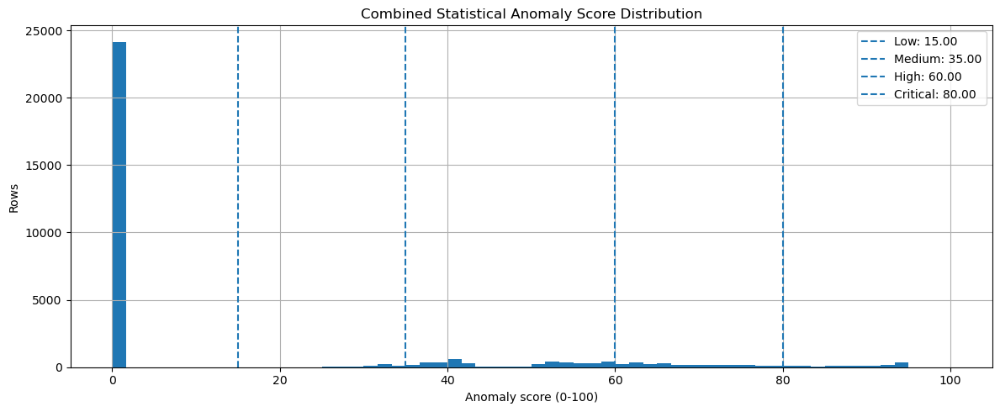

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\10b_anomaly_score_distribution_flagged_only.png


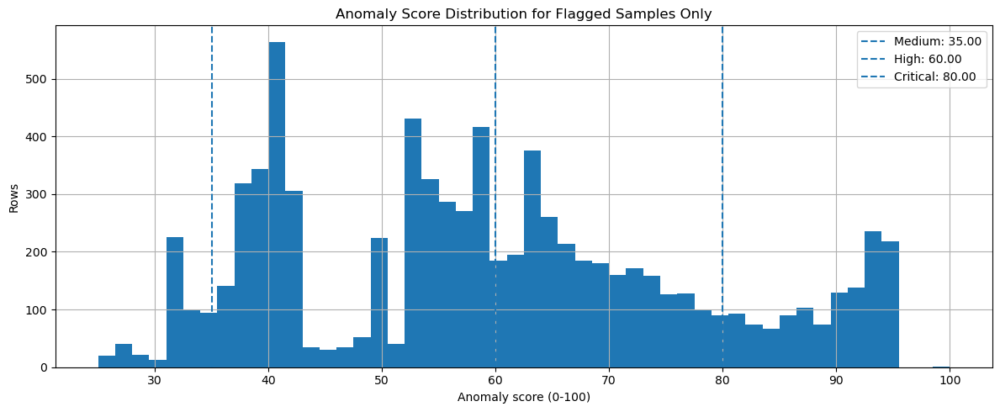

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\10c_anomaly_trigger_overlap_distribution.png


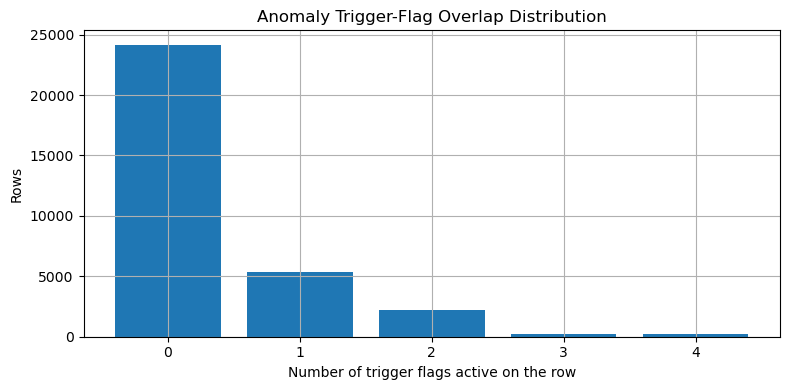

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\11_anomaly_method_percentages.png


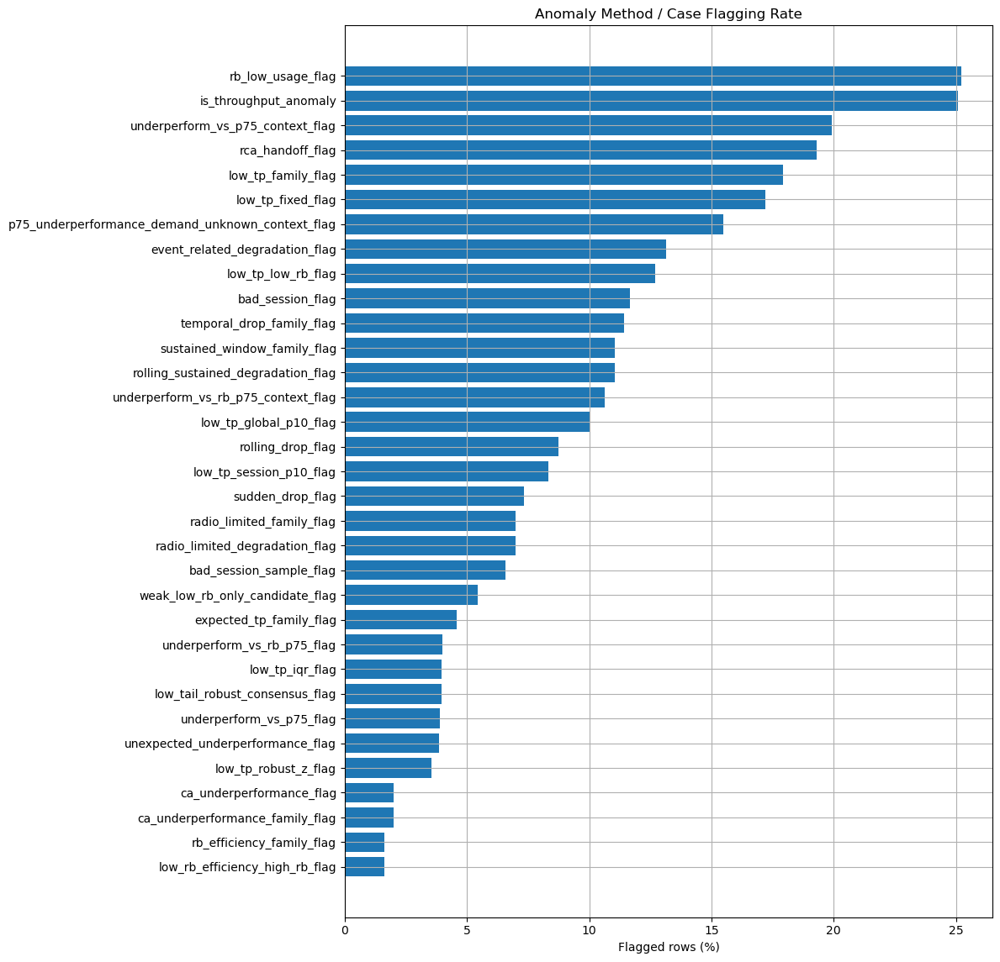

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\12_anomaly_count_by_type.png


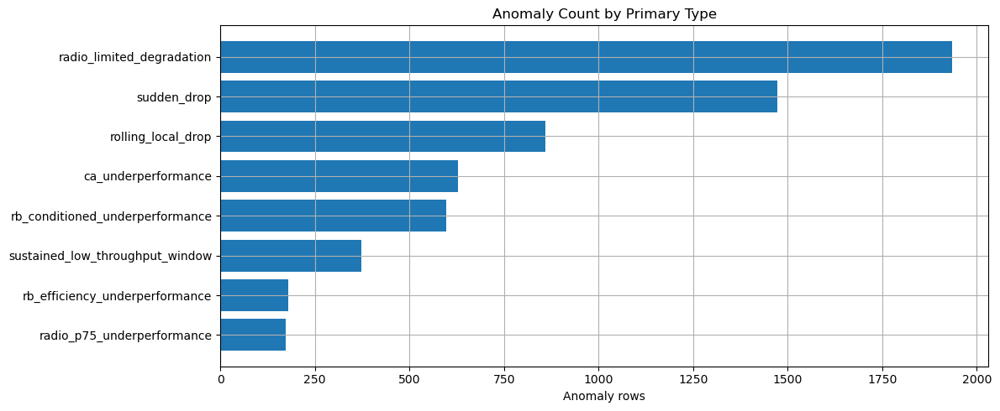

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\13_anomaly_count_by_severity.png


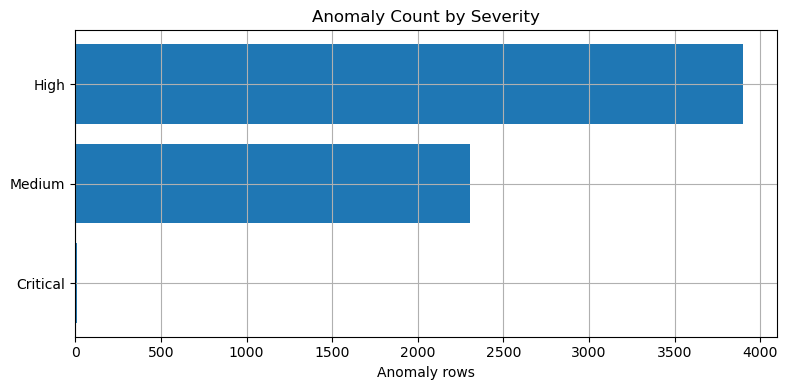

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\14_actual_vs_expected_with_anomalies.png


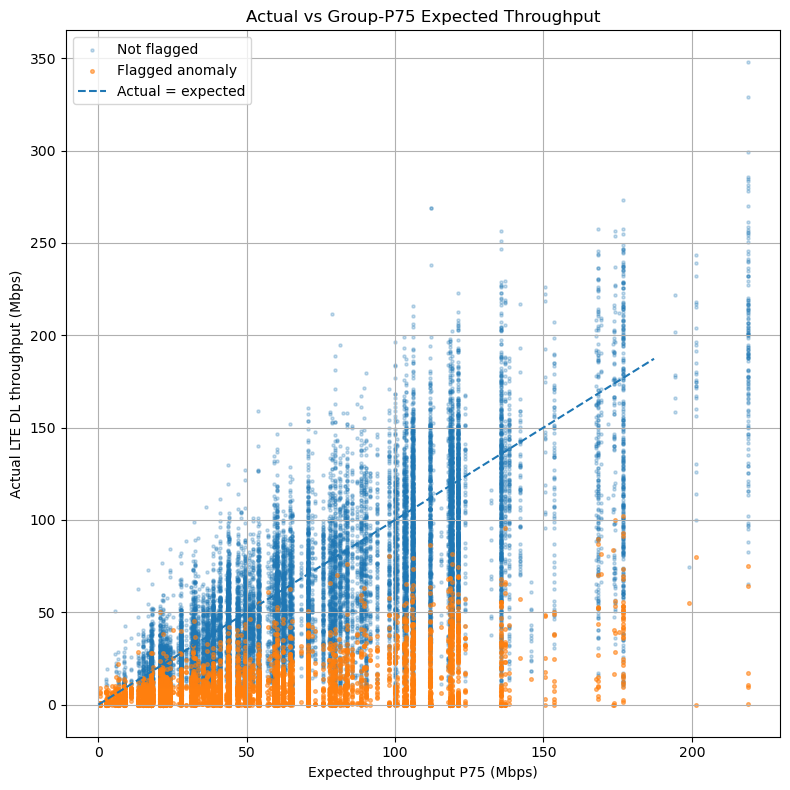

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\15_throughput_ratio_p75_distribution.png


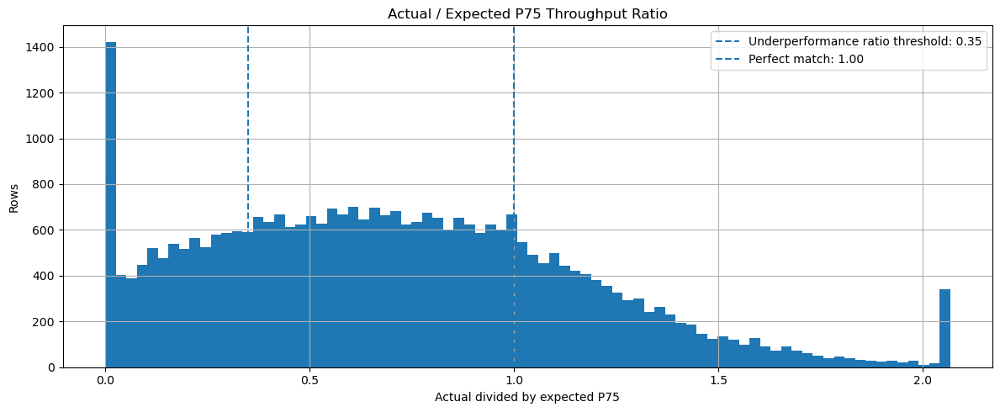

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\16_throughput_gap_p75_distribution.png


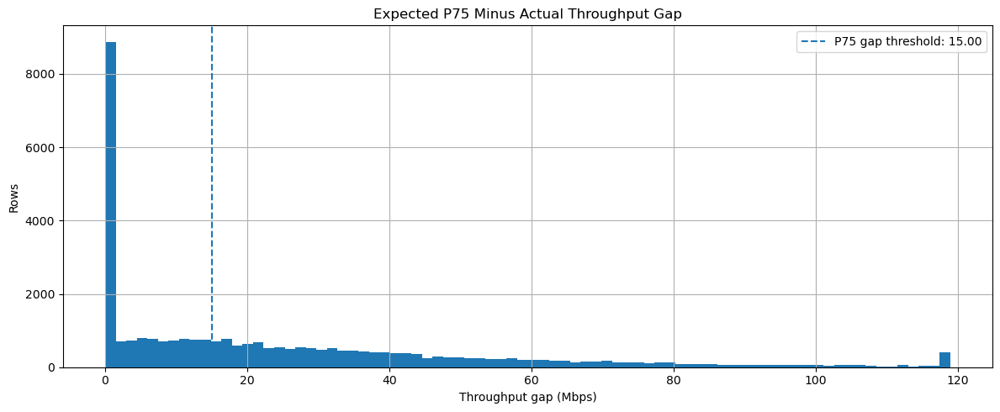

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\17_route_by_anomaly_score.png


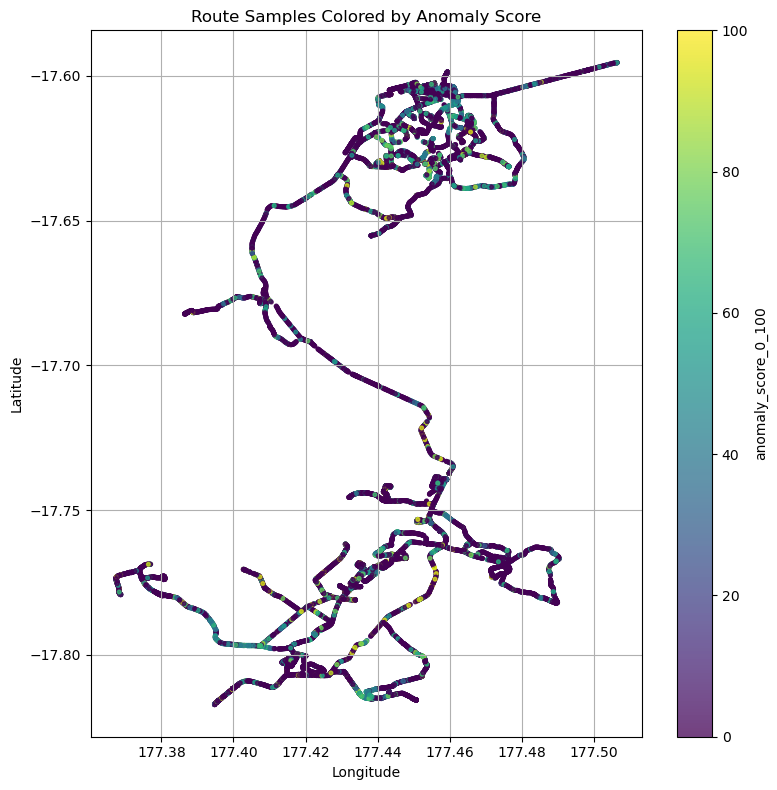

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\17c_route_with_anomaly_overlay.png


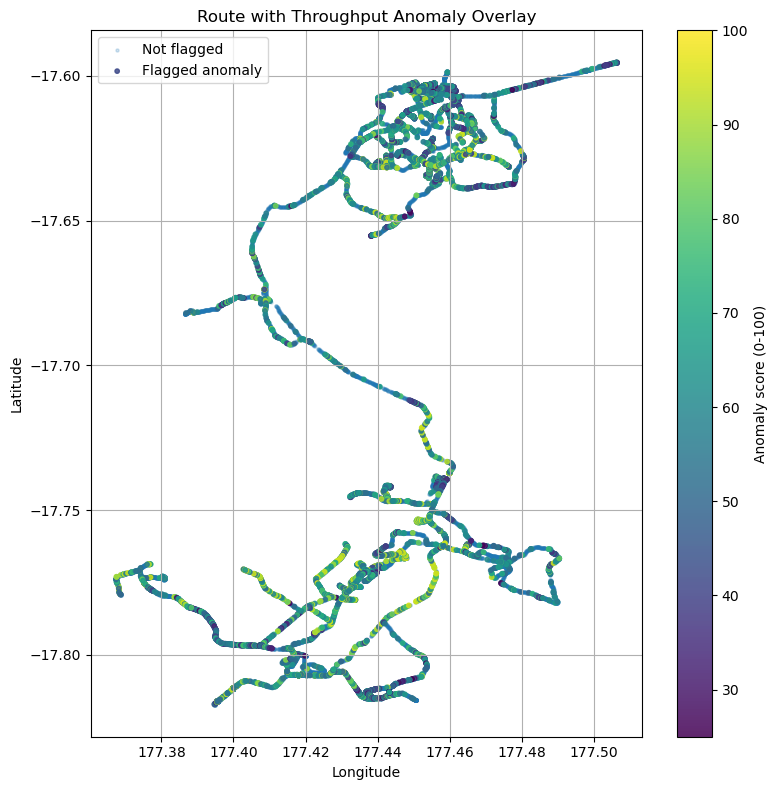

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\17b_route_by_download_analysis_window.png


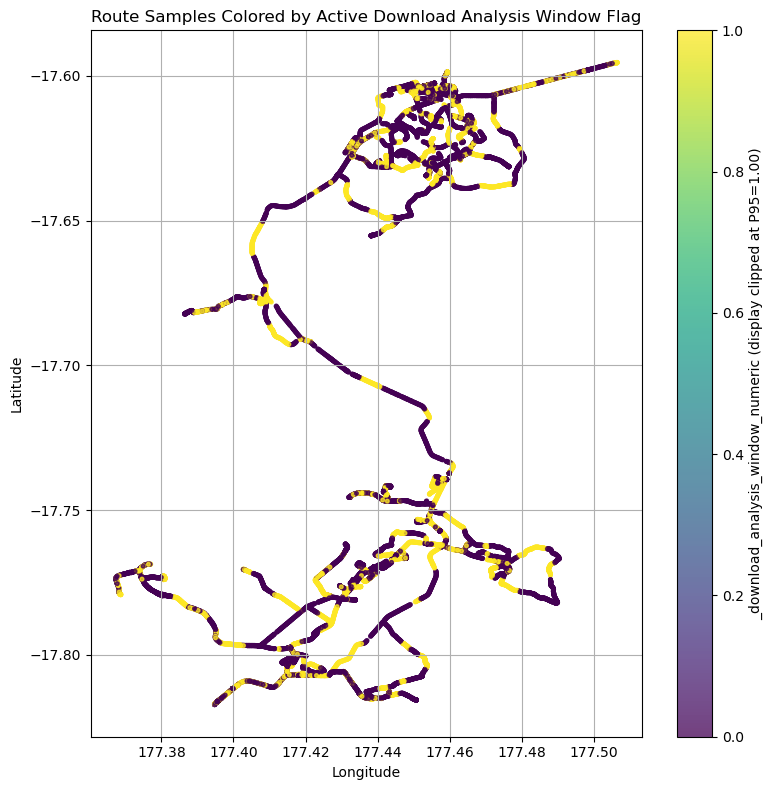

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 02:27:03+02:00,542020041221088+20250828123202+Fiji-Nadi-LTE-DL-D!20250828122853,rb_efficiency_underperformance,radio_limited_degradation;rb_efficiency_underperformance;rb_conditioned_underperformance;radio_p75_underperformance;rolling_local_drop;fixed_low_throughput;global_percentile_lo...,100.0,0.736984,62.203377,47.696416,0.011848,0.015452,138.0,medium_rb_usage,medium,0.00534,-96.81851,-13.428486,8.05699,2.0,active_download_analysis_window,True


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_1_throughput_context.png


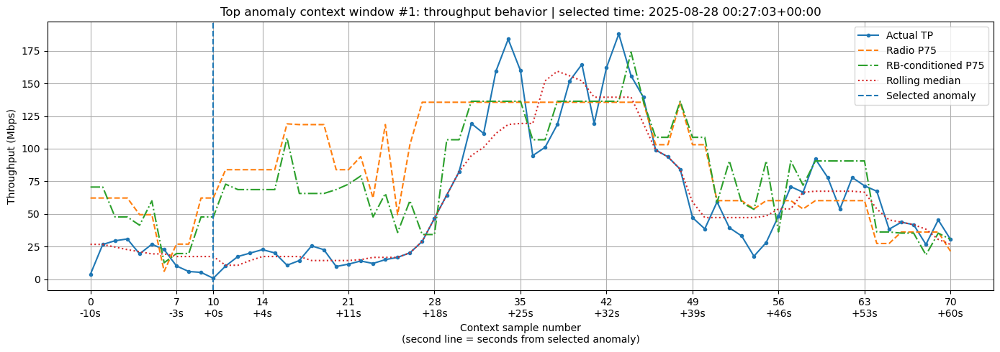

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_1_radio_context.png


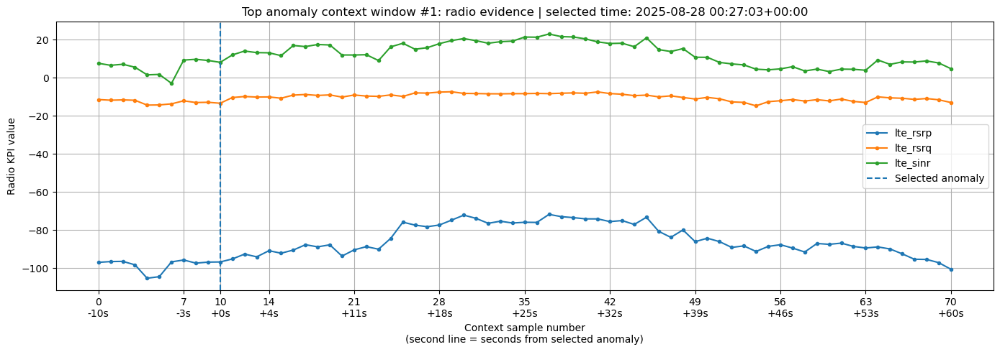

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 03:22:57+02:00,542020041221088+20250828133115+Fiji-Nadi-LTE-DL-D!20250828132346,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;sudden_drop;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_perce...,94.4,0.066024,82.333025,29.692828,0.000802,0.002224,6.0,low_rb_usage,low_or_uncertain,0.011004,-88.42904,-12.084636,6.156818,3.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_2_throughput_context.png


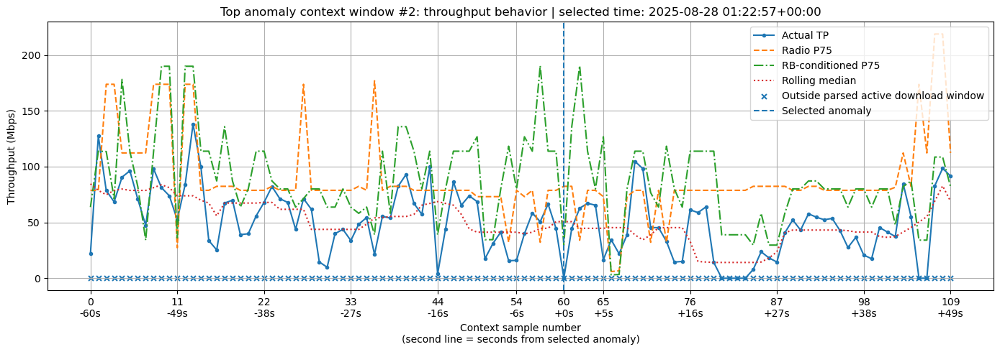

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_2_radio_context.png


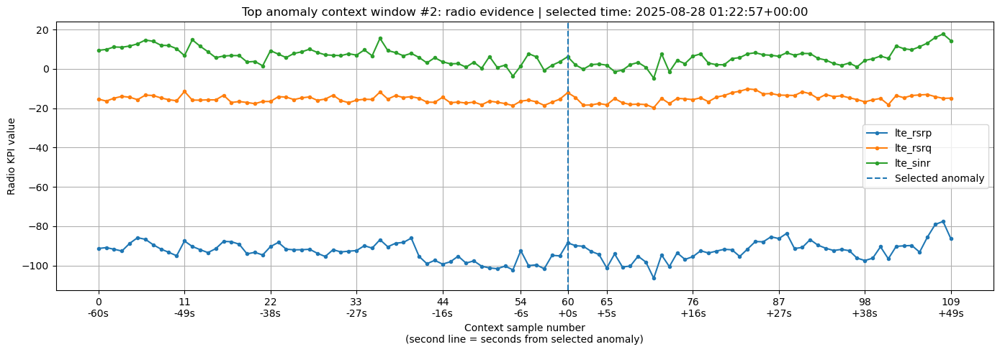

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 02:22:42+02:00,542020041221088+20250828122802+Fiji-Nadi-LTE-DL-D!20250828122423,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_percentile_low_th...,94.3,0.083032,118.44779,19.2922,0.000701,0.004304,2.0,low_rb_usage,low_or_uncertain,0.041516,-87.13081,-7.975291,18.05803,2.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_3_throughput_context.png


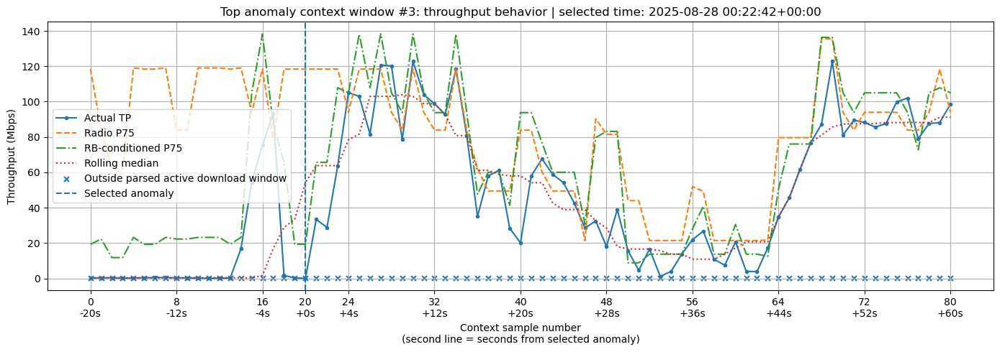

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_3_radio_context.png


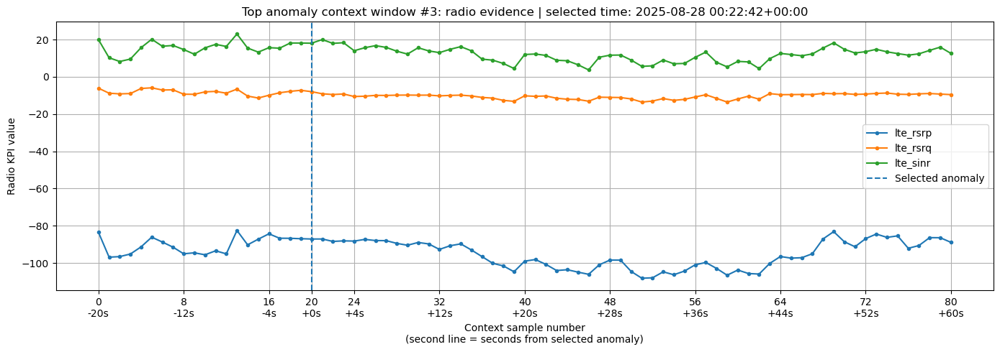

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-27 00:44:06+02:00,542020041221088+20250827104707+Fiji-Nadi-LTE-DL-D!20250827104518,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;sudden_drop;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_perce...,94.2,0.00664,168.440535,49.662575,0.000039,0.000134,1.0,low_rb_usage,low_or_uncertain,0.00664,-91.446,-5.8665,20.165304,2.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_4_throughput_context.png


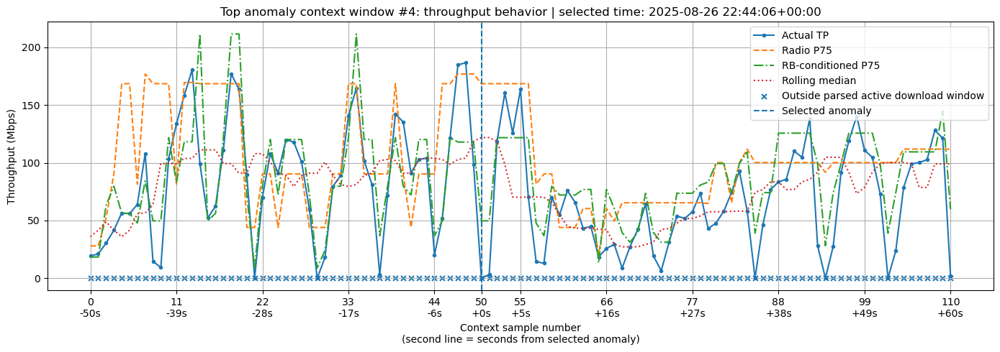

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_4_radio_context.png


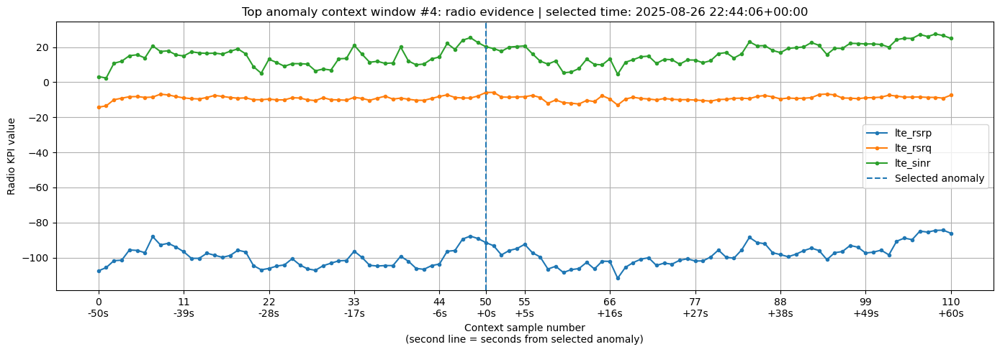

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-27 05:16:03+02:00,542020041221088+20250827151812+Fiji-Nadi-LTE-DL-D!20250827151738,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_percentile_low_th...,94.2,0.13844,135.5693,34.23432,0.001021,0.004044,4.0,low_rb_usage,low_or_uncertain,0.03461,-71.89768,-6.887601,22.480608,2.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_5_throughput_context.png


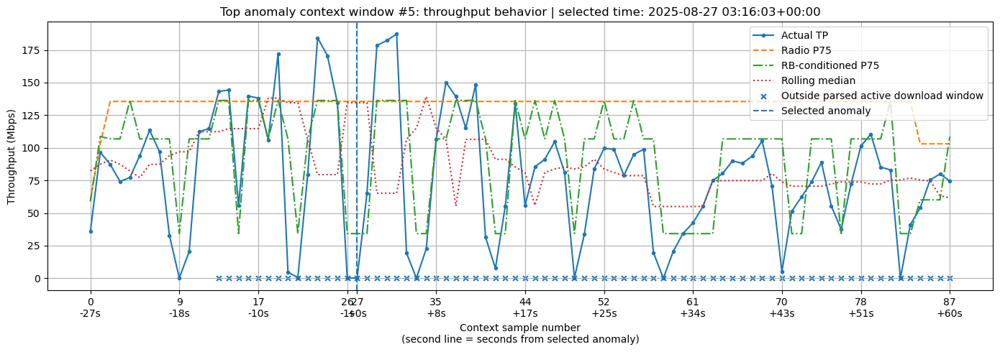

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_5_radio_context.png


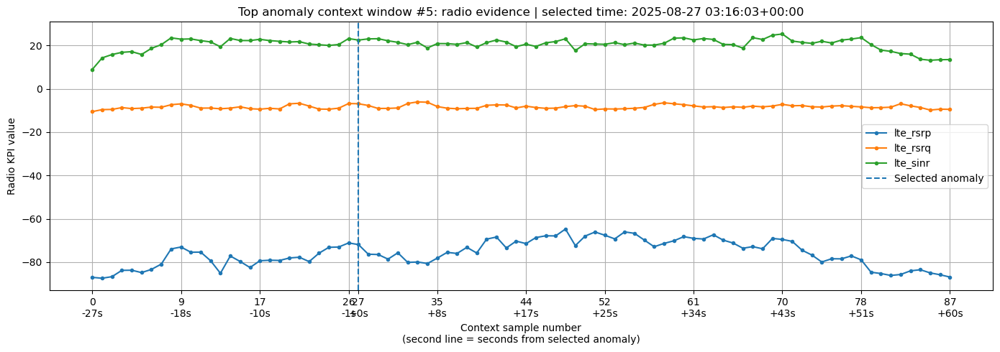

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 03:20:20+02:00,542020041221088+20250828132735+Fiji-Nadi-LTE-DL-D!20250828132130,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;sudden_drop;rolling_local_drop;sustained_low_throughput_window;fixed_low_throughput;global_percent...,94.2,0.0496,112.239355,34.146222,0.000442,0.001453,16.0,low_rb_usage,low_or_uncertain,0.0031,-89.408005,-12.191011,13.076192,3.0,active_download_analysis_window,True


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_6_throughput_context.png


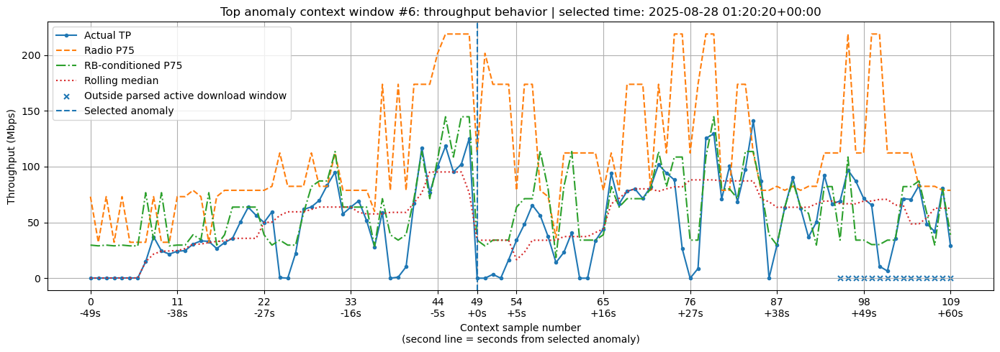

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_6_radio_context.png


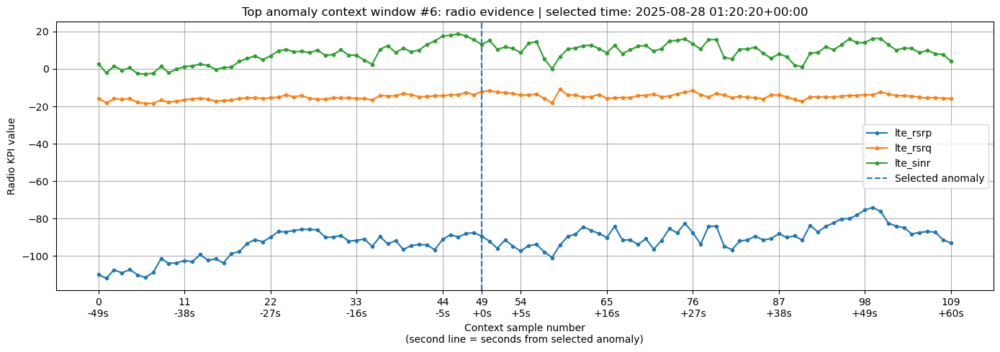

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-27 03:39:00+02:00,542020041221088+20250827135649+Fiji-Nadi-LTE-DL-D!20250827133934,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;sudden_drop;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_perce...,94.2,0.150032,118.44779,19.2922,0.001267,0.007777,10.0,low_rb_usage,low_or_uncertain,0.015003,-87.84789,-7.21009,20.212502,2.0,active_download_analysis_window,True


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_7_throughput_context.png


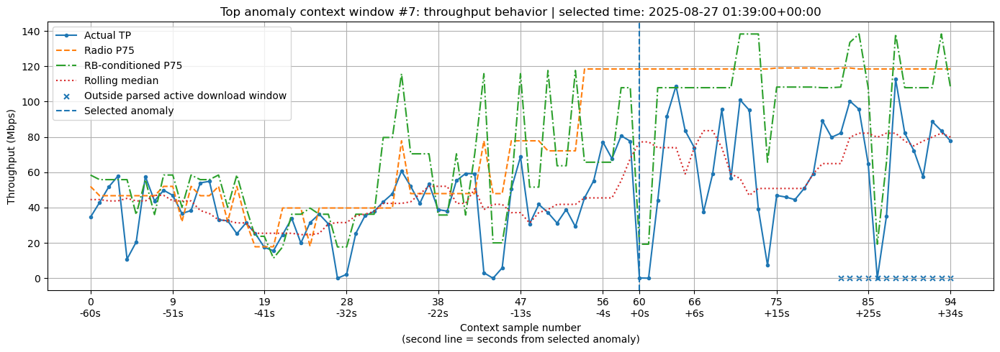

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_7_radio_context.png


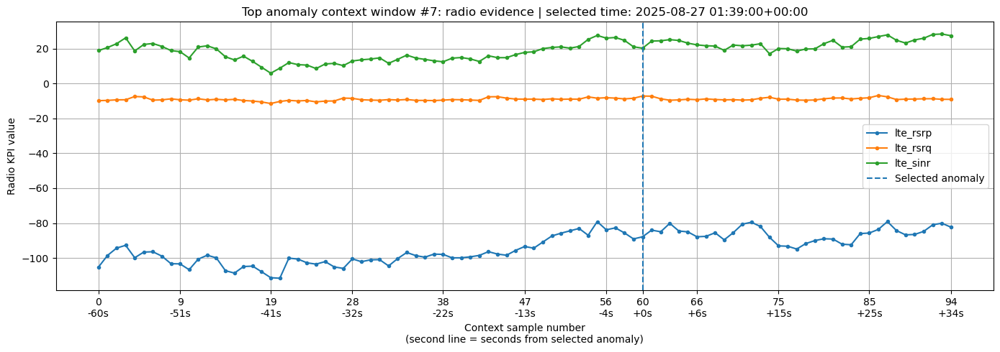

Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 03:23:43+02:00,542020041221088+20250828133115+Fiji-Nadi-LTE-DL-D!20250828132346,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_percentile_low_th...,94.2,0.024904,112.239355,34.146222,0.000222,0.000729,5.0,low_rb_usage,low_or_uncertain,0.004981,-85.5,-13.040842,13.100001,3.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_8_throughput_context.png


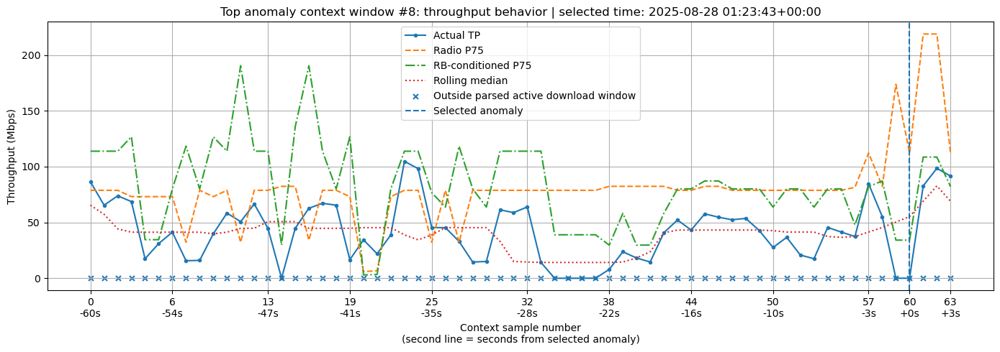

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\18_top_anomaly_episode_context_rank_8_radio_context.png


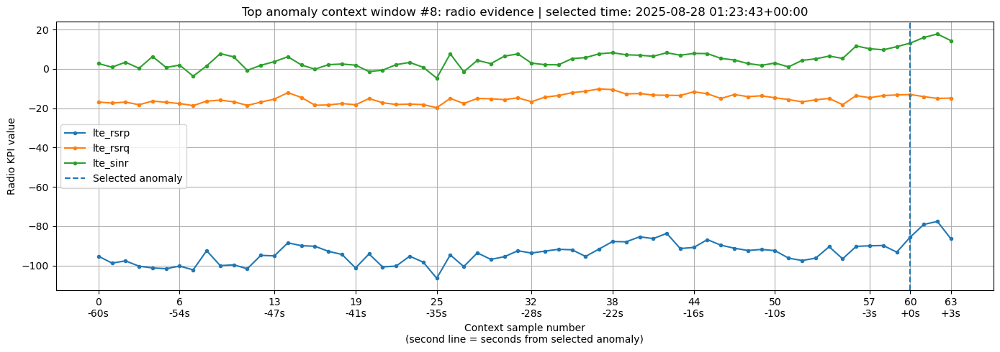


Representative anomaly type example: radio_limited_degradation
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 03:22:57+02:00,542020041221088+20250828133115+Fiji-Nadi-LTE-DL-D!20250828132346,radio_limited_degradation,radio_limited_degradation;resource_limited_or_demand_uncertain_low_throughput;sudden_drop;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_perce...,94.4,0.066024,82.333025,29.692828,0.000802,0.002224,6.0,low_rb_usage,low_or_uncertain,0.011004,-88.42904,-12.084636,6.156818,3.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_1_radio_limited_degradation_rank_1_throughput_context.png


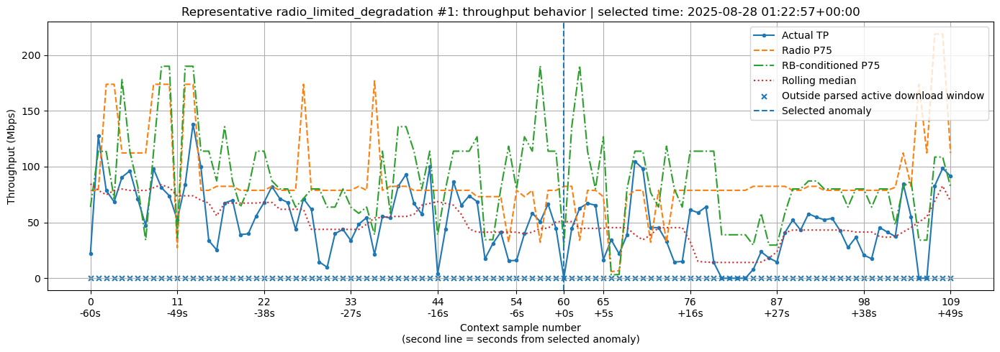

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_1_radio_limited_degradation_rank_1_radio_context.png


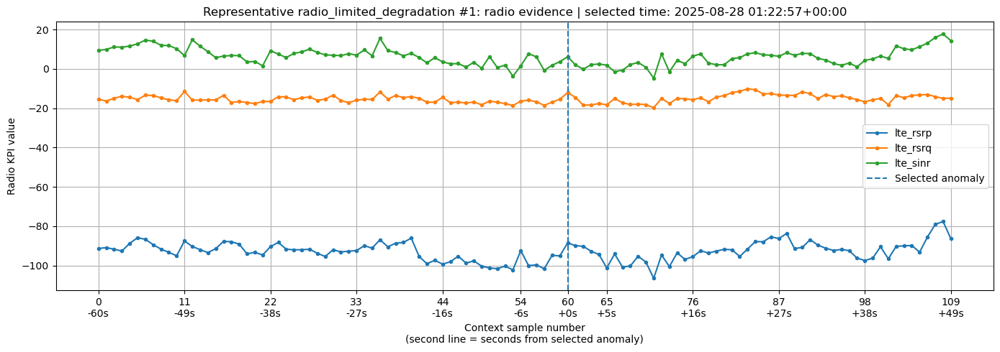


Representative anomaly type example: sudden_drop
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 03:23:42+02:00,542020041221088+20250828133115+Fiji-Nadi-LTE-DL-D!20250828132346,sudden_drop,resource_limited_or_demand_uncertain_low_throughput;sudden_drop;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_percentile_low_throughput;iqr_e...,94.2,0.024472,173.72594,34.146222,0.000141,0.000717,6.0,low_rb_usage,low_or_uncertain,0.004079,-93.16523,-13.27227,11.253751,3.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_2_sudden_drop_rank_1_throughput_context.png


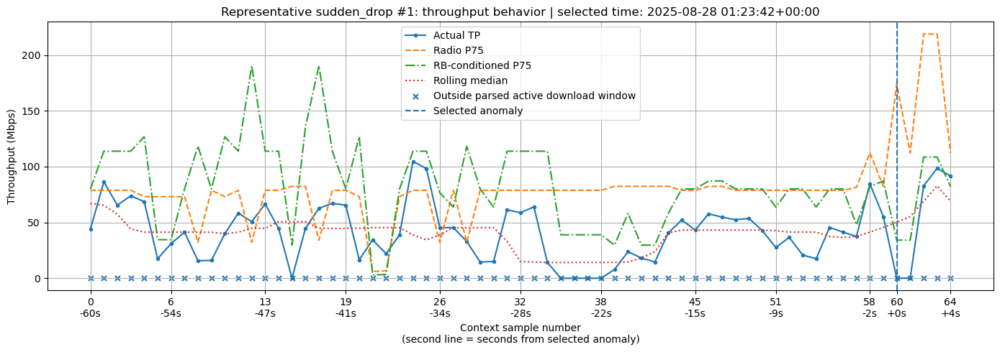

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_2_sudden_drop_rank_1_radio_context.png


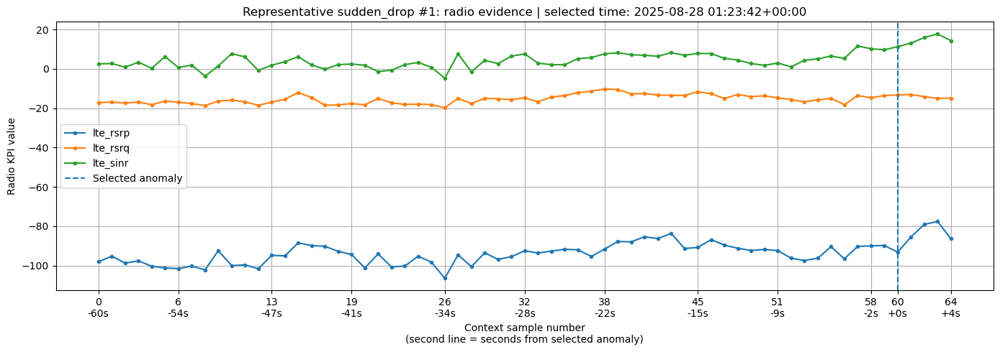


Representative anomaly type example: rolling_local_drop
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-27 05:13:06+02:00,542020041221088+20250827151332+Fiji-Nadi-LTE-DL-D!20250827151309,rolling_local_drop,resource_limited_or_demand_uncertain_low_throughput;rolling_local_drop;fixed_low_throughput;global_percentile_low_throughput;session_percentile_low_throughput;iqr_extreme_low_t...,94.2,0.232992,137.05949,30.167366,0.0017,0.007723,4.0,low_rb_usage,low_or_uncertain,0.058248,-78.75798,-13.415559,15.040909,3.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_3_rolling_local_drop_rank_1_throughput_context.png


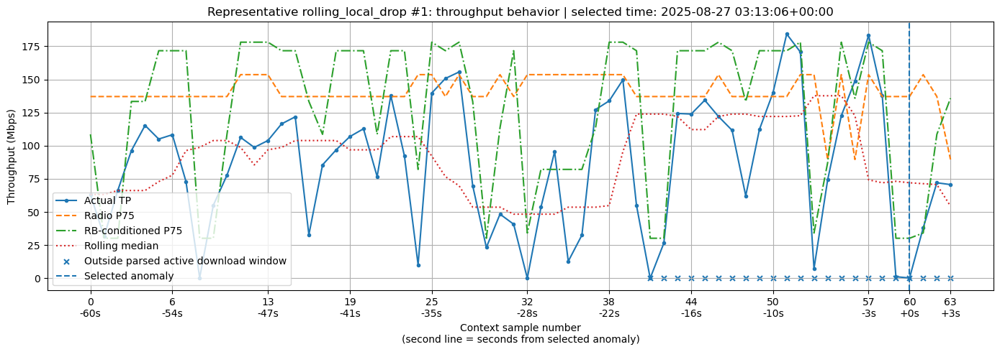

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_3_rolling_local_drop_rank_1_radio_context.png


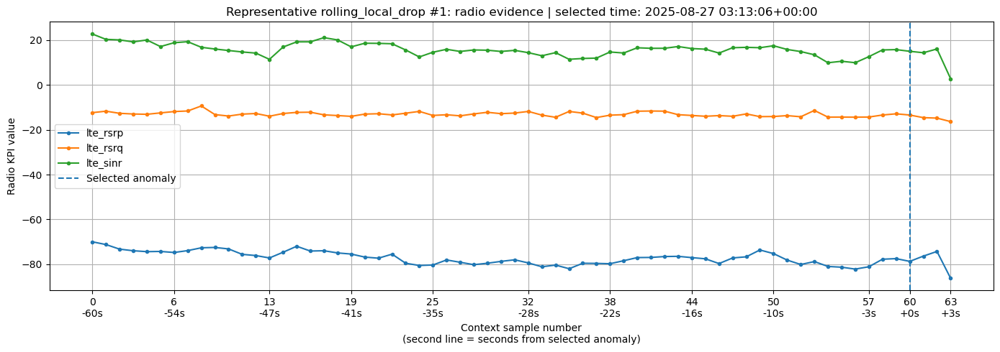


Representative anomaly type example: ca_underperformance
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 01:07:06+02:00,542020041221088+20250828114011+Fiji-Nadi-LTE-DL-D!20250828110908,ca_underperformance,unexpected_underperformance;ca_underperformance;rb_efficiency_underperformance;rb_conditioned_underperformance;radio_p75_underperformance;rolling_local_drop;fixed_low_throughpu...,94.0,1.032872,65.360043,80.685852,0.015803,0.012801,186.0,high_rb_usage,high,0.005553,-101.175,-10.6125,11.675,2.0,active_download_analysis_window,True


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_4_ca_underperformance_rank_1_throughput_context.png


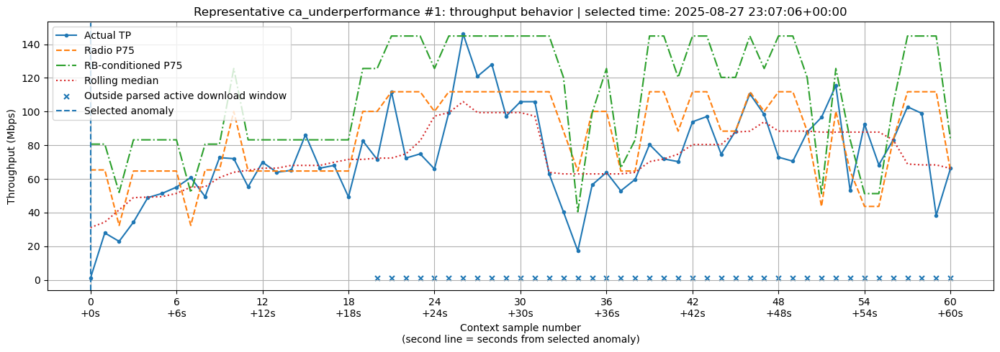

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_4_ca_underperformance_rank_1_radio_context.png


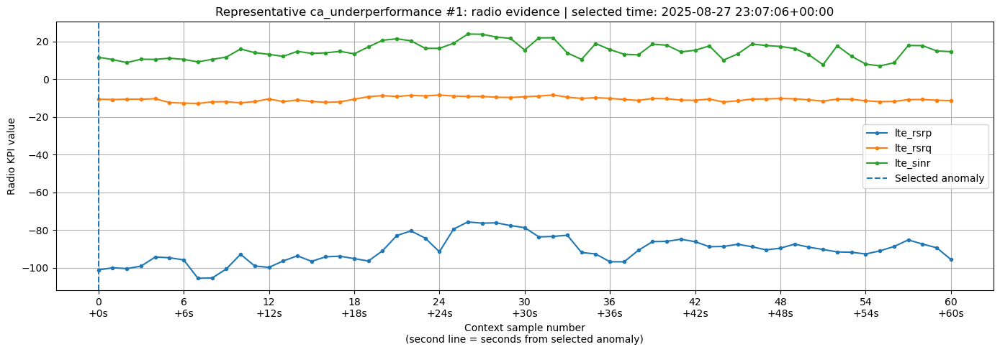


Representative anomaly type example: rb_conditioned_underperformance
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 02:49:39+02:00,542020041221088+20250828125203+Fiji-Nadi-LTE-DL-D!20250828125121,rb_conditioned_underperformance,radio_limited_degradation;rb_conditioned_underperformance;radio_p75_underperformance;sudden_drop;rolling_local_drop,89.8,10.097096,111.794821,109.39058,0.090318,0.092303,137.0,medium_rb_usage,medium,0.073701,-83.24787,-12.410511,15.805122,2.0,download_warmup_or_cooldown,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_5_rb_conditioned_underperformance_rank_1_throughput_context.png


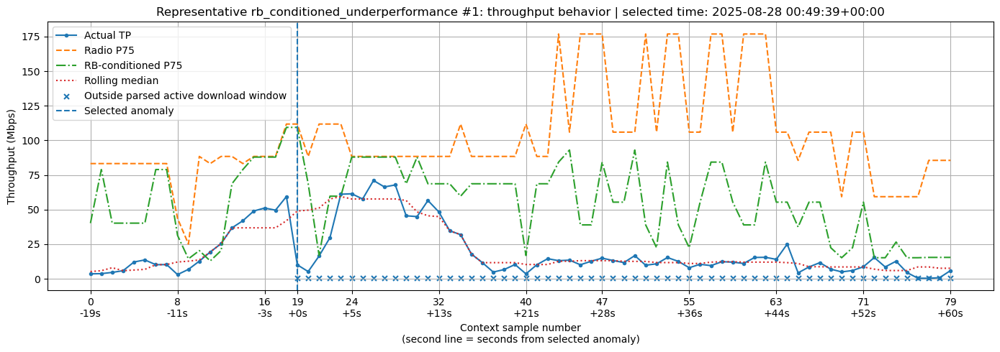

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_5_rb_conditioned_underperformance_rank_1_radio_context.png


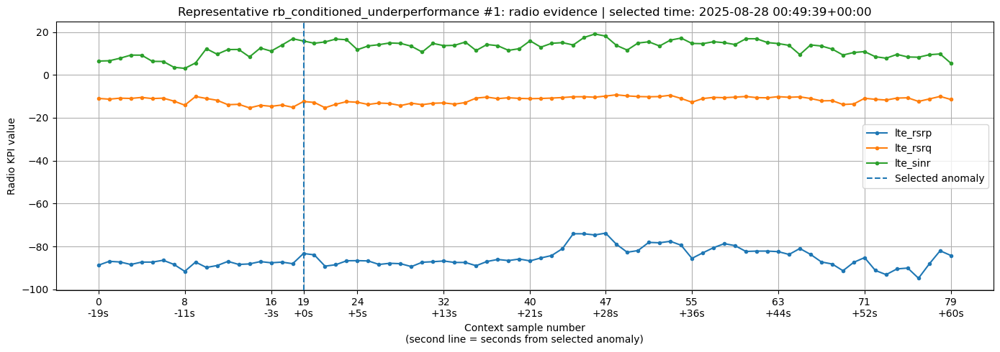


Representative anomaly type example: sustained_low_throughput_window
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 02:49:03+02:00,542020041221088+20250828124943+Fiji-Nadi-LTE-DL-D!20250828124907,sustained_low_throughput_window,sustained_low_throughput_window;fixed_low_throughput;global_percentile_low_throughput;session_percentile_low_throughput,89.6,0.971768,98.077295,55.897085,0.009908,0.017385,85.0,below_median_rb_usage,unknown,0.011433,-88.12234,-10.146276,11.168181,2.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_6_sustained_low_throughput_window_rank_1_throughput_context.png


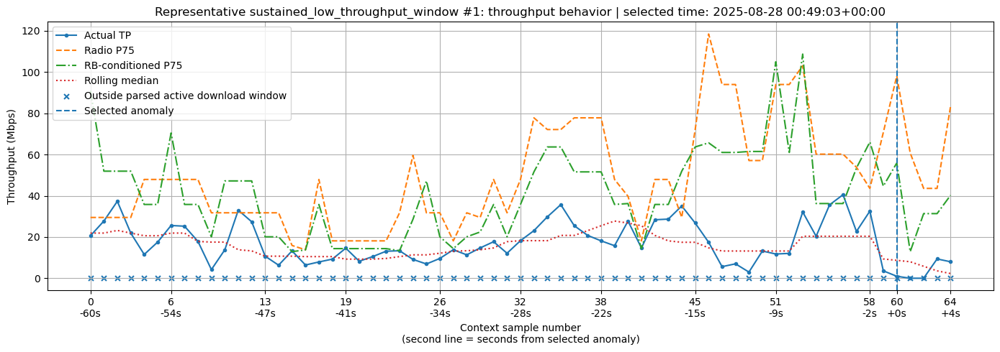

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_6_sustained_low_throughput_window_rank_1_radio_context.png


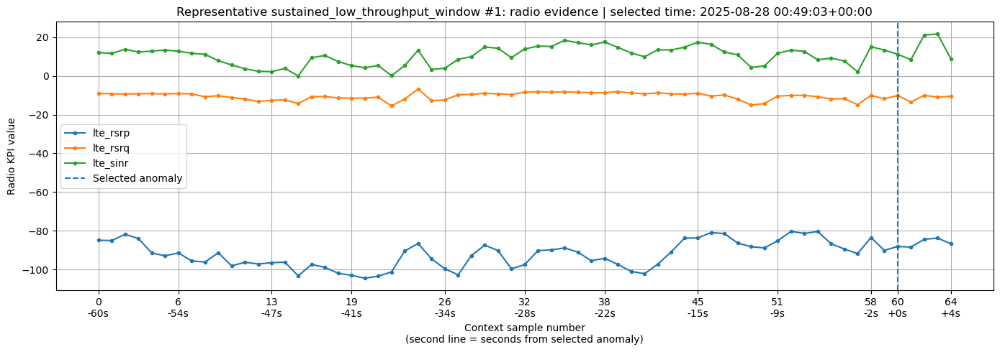


Representative anomaly type example: rb_efficiency_underperformance
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 02:27:03+02:00,542020041221088+20250828123202+Fiji-Nadi-LTE-DL-D!20250828122853,rb_efficiency_underperformance,radio_limited_degradation;rb_efficiency_underperformance;rb_conditioned_underperformance;radio_p75_underperformance;rolling_local_drop;fixed_low_throughput;global_percentile_lo...,100.0,0.736984,62.203377,47.696416,0.011848,0.015452,138.0,medium_rb_usage,medium,0.00534,-96.81851,-13.428486,8.05699,2.0,active_download_analysis_window,True


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_7_rb_efficiency_underperformance_rank_1_throughput_context.png


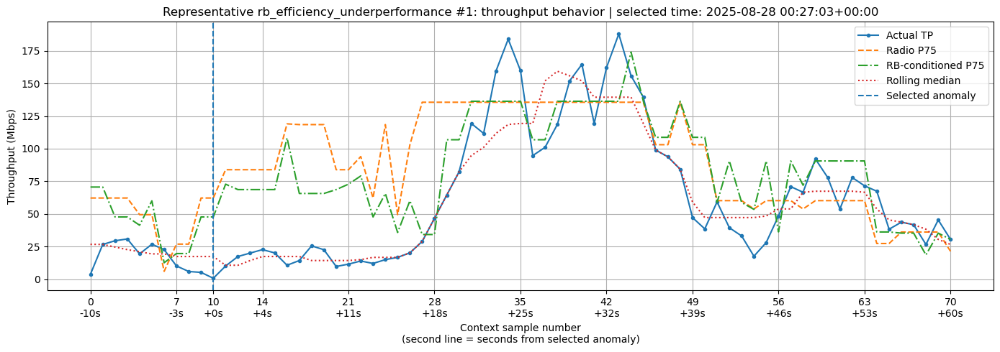

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_7_rb_efficiency_underperformance_rank_1_radio_context.png


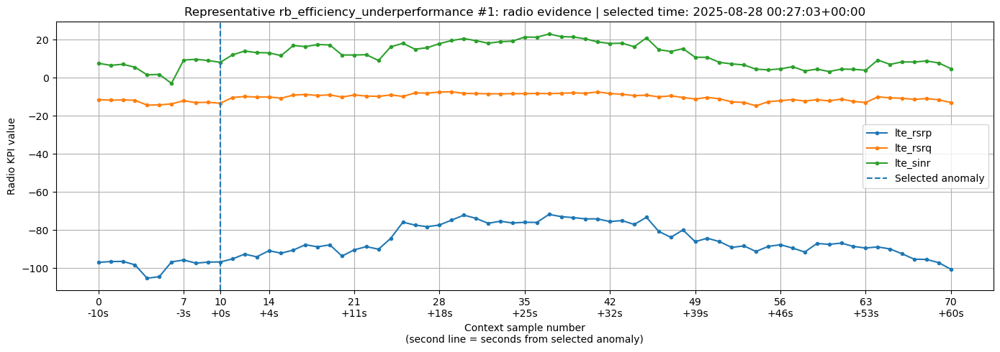


Representative anomaly type example: radio_p75_underperformance
Selected anomaly summary:


,timestamp,id,anomaly_type,anomaly_type_flags,anomaly_score_0_100,actual_lte_dl_throughput,expected_tp_p75,expected_tp_rb_conditioned_p75,throughput_ratio_p75,throughput_ratio_rb_p75,rb_usage_value,rb_usage_bucket,rb_demand_confidence,throughput_per_rb,lte_rsrp,lte_rsrq,lte_sinr,carrier_count,download_context_label,download_analysis_window_flag
0,2025-08-28 00:40:31+02:00,542020041221088+20250828104127+Fiji-Nadi-LTE-DL-D!20250828104043,radio_p75_underperformance,unexpected_underperformance;radio_p75_underperformance;sudden_drop,65.8,50.386112,176.8458,117.884358,0.284916,0.42742,134.0,medium_rb_usage,medium,0.376016,-87.229164,-8.221102,19.412502,2.0,outside_download_activity,False


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_8_radio_p75_underperformance_rank_1_throughput_context.png


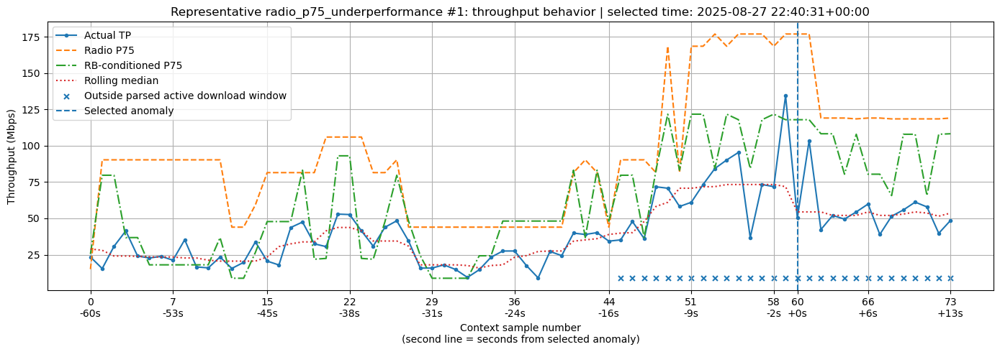

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\19_type_example_context_8_radio_p75_underperformance_rank_1_radio_context.png


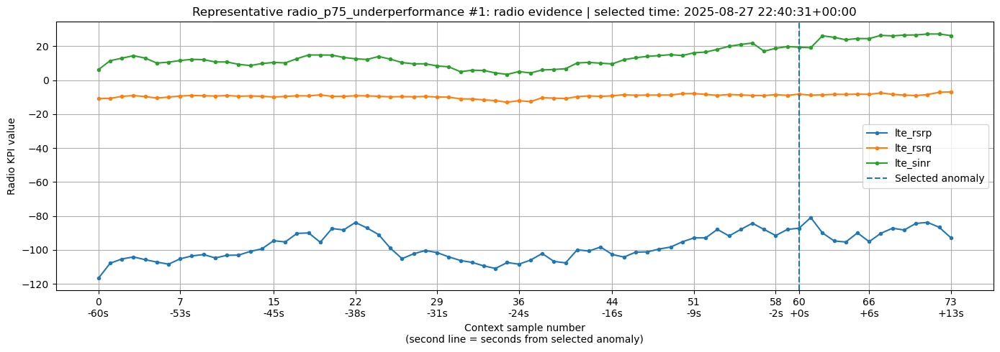

In [11]:
# =========================
# 16. Post-anomaly visual QC
# =========================

# These plots help confirm whether flagged samples look abnormal in their surrounding context.
# They also make it easier to explain why some method percentages are high or low.

if not lte_dl.empty:
    plot_distribution_with_lines(
        lte_dl,
        "anomaly_score_0_100",
        "Combined Statistical Anomaly Score Distribution",
        "Anomaly score (0-100)",
        thresholds={"Low": 15, "Medium": 35, "High": 60, "Critical": 80},
        bins=60,
        filename="10_anomaly_score_distribution.png",
        clip_upper_q=None,
    )



    # The full score distribution is usually dominated by normal zero-score rows. This zoom
    # shows only flagged anomalies so score calibration can be reviewed more clearly.
    plot_distribution_with_lines(
        lte_dl[lte_dl["is_throughput_anomaly"].fillna(False).astype(bool)],
        "anomaly_score_0_100",
        "Anomaly Score Distribution for Flagged Samples Only",
        "Anomaly score (0-100)",
        thresholds={"Medium": 35, "High": 60, "Critical": 80},
        bins=50,
        filename="10b_anomaly_score_distribution_flagged_only.png",
        clip_upper_q=None,
    )

    if "anomaly_method_count" in lte_dl.columns:
        method_count_summary = lte_dl["anomaly_method_count"].value_counts().sort_index()
        plt.figure(figsize=(8, 4))
        plt.bar(method_count_summary.index.astype(str), method_count_summary.values)
        plt.xlabel("Number of trigger flags active on the row")
        plt.ylabel("Rows")
        plt.title("Anomaly Trigger-Flag Overlap Distribution")
        save_current_plot("10c_anomaly_trigger_overlap_distribution.png")
        plt.show()

    if "method_summary" in globals():
        plot_flag_percentage_bars(method_summary, "11_anomaly_method_percentages.png")

    if "summary_by_type_sev" in globals() and not summary_by_type_sev.empty:
        type_counts = anomaly_handoff["anomaly_type"].value_counts().sort_values(ascending=True)
        plt.figure(figsize=(12, max(5, 0.35 * len(type_counts))))
        plt.barh(type_counts.index.astype(str), type_counts.values)
        plt.xlabel("Anomaly rows")
        plt.title("Anomaly Count by Primary Type")
        save_current_plot("12_anomaly_count_by_type.png")
        plt.show()

        sev_counts = anomaly_handoff["anomaly_severity"].value_counts().sort_values(ascending=True)
        plt.figure(figsize=(8, 4))
        plt.barh(sev_counts.index.astype(str), sev_counts.values)
        plt.xlabel("Anomaly rows")
        plt.title("Anomaly Count by Severity")
        save_current_plot("13_anomaly_count_by_severity.png")
        plt.show()

    plot_actual_vs_expected(lte_dl, "14_actual_vs_expected_with_anomalies.png")

    plot_distribution_with_lines(
        lte_dl,
        "throughput_ratio_p75",
        "Actual / Expected P75 Throughput Ratio",
        "Actual divided by expected P75",
        thresholds={"Underperformance ratio threshold": UNDERPERFORMANCE_RATIO_THRESHOLD, "Perfect match": 1.0},
        bins=80,
        filename="15_throughput_ratio_p75_distribution.png",
        clip_upper_q=0.99,
    )

    plot_distribution_with_lines(
        lte_dl,
        "throughput_gap_p75",
        "Expected P75 Minus Actual Throughput Gap",
        "Throughput gap (Mbps)",
        thresholds={"P75 gap threshold": UNDERPERFORMANCE_GAP_MBPS},
        bins=80,
        filename="16_throughput_gap_p75_distribution.png",
        clip_upper_q=0.99,
    )

    plot_route_metric(lte_dl, "anomaly_score_0_100", "Route Samples Colored by Anomaly Score", "17_route_by_anomaly_score.png", clip_upper_q=None)
    plot_route_anomaly_overlay(lte_dl, "17c_route_with_anomaly_overlay.png")

    if "download_analysis_window_flag" in lte_dl.columns:
        lte_dl["_download_analysis_window_numeric"] = lte_dl["download_analysis_window_flag"].fillna(True).astype(int)
        plot_route_metric(
            lte_dl,
            "_download_analysis_window_numeric",
            "Route Samples Colored by Active Download Analysis Window Flag",
            "17b_route_by_download_analysis_window.png",
        )

    if "anomaly_handoff" in globals() and not anomaly_handoff.empty:
        # Plot top anomaly EPISODES, not repeated neighboring rows from the same episode.
        # This directly fixes the visual issue where several top context windows showed the
        # same sustained low-throughput period instead of independent anomaly cases.
        if "anomaly_episode_id" in anomaly_handoff.columns:
            context_examples = (
                anomaly_handoff.sort_values("anomaly_score_0_100", ascending=False)
                .drop_duplicates("anomaly_episode_id", keep="first")
                .sort_values("anomaly_score_0_100", ascending=False)
                .reset_index(drop=True)
            )
        else:
            context_examples = anomaly_handoff.sort_values("anomaly_score_0_100", ascending=False).reset_index(drop=True)

        for rank in range(min(MAX_TOP_CONTEXT_WINDOWS, len(context_examples))):
            plot_anomaly_context(
                lte_dl,
                anomaly_df=context_examples,
                rank=rank,
                samples_before=ANOMALY_CONTEXT_SAMPLES_BEFORE,
                samples_after=ANOMALY_CONTEXT_SAMPLES_AFTER,
                filename_prefix="18_top_anomaly_episode_context",
            )

        # Add representative examples by anomaly type so review is not biased toward
        # only the highest-score edge cases.
        plot_context_examples_by_type(
            lte_dl,
            anomaly_handoff,
            max_types=MAX_CONTEXT_WINDOWS_BY_TYPE,
            samples_before=ANOMALY_CONTEXT_SAMPLES_BEFORE,
            samples_after=ANOMALY_CONTEXT_SAMPLES_AFTER,
            filename_prefix="19_type_example_context",
        )


# Final ML validation, causal temporal modeling, and strict Statistical–ML fusion

This section is intentionally reduced to the models that answer distinct questions well:

- **HGB strict-causal temporal Q50**: strongest past-only temporal predictor; no future event-window context.
- **HGB resource-conditioned Q50**: strong central predictor using radio/resource/link-adaptation context.
- **GradientBoosting resource-conditioned Q75**: calibrated upper expected-throughput reference for underperformance gaps.
- **LSTM-Q50**: retained only as a sequence-model comparator for model-selection validation.
- **Isolation Forest**: retained only as unsupervised residual-space context.

Only the three HGB/GradientBoosting production models may influence final ML anomaly evidence. LSTM and Isolation Forest are excluded from final anomaly cases and the compact RCA JSON. Statistical detectors remain the primary anomaly layer.


In [12]:

# =========================
# 18. ML/LSTM/fusion imports and configuration
# =========================

from copy import deepcopy
from dataclasses import dataclass
from collections import defaultdict
import time

from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import HistGradientBoostingRegressor, GradientBoostingRegressor, IsolationForest
from sklearn.model_selection import GroupKFold, GroupShuffleSplit
from threadpoolctl import threadpool_limits
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    mean_pinball_loss,
)
import joblib

# PyTorch is used for the compact LSTM-Q50 trial. The notebook remains runnable without
# TensorFlow and uses CPU automatically when no GPU is present.
try:
    import torch
    import torch.nn as nn
    from torch.utils.data import Dataset, DataLoader
    TORCH_AVAILABLE = True
except Exception as exc:
    TORCH_AVAILABLE = False
    print("PyTorch is not available. The LSTM trial will be skipped.")
    print("Reason:", exc)

TARGET_COL = "actual_lte_dl_throughput"
GROUP_COL = "id"
TIME_COL = "timestamp"

# -------------------------
# Reproducibility and runtime controls
# -------------------------
ML_RANDOM_SEED = RANDOM_SEED
np.random.seed(ML_RANDOM_SEED)
if TORCH_AVAILABLE:
    torch.set_num_threads(max(1, min(4, os.cpu_count() or 1)))
    torch.manual_seed(ML_RANDOM_SEED)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(ML_RANDOM_SEED)

ML_OOF_N_SPLITS = 5
ML_REPEATED_GROUP_RUNS = 5
ML_REPEATED_TEST_SIZE = 0.20
ML_RUN_REPEATED_VALIDATION = True
ML_RUN_FEATURE_ABLATION = False  # final model set already selected; keep notebook lean
ML_RUN_ROBUST_REFERENCE_REFIT = True
ML_REFERENCE_REFIT_EXTREME_QUANTILE = 0.01
ML_REFERENCE_INNER_N_SPLITS = 3
ML_NESTED_REFERENCE_FILTERING = True
ML_CALIBRATE_Q75_WITH_INNER_OOF = True
ML_SAVE_FINAL_MODELS = True

# Use None for the real run. A positive integer can be used only for code debugging.
ML_MAX_ROWS_DEBUG = None

# -------------------------
# Core expected-throughput gates
# -------------------------
ML_MIN_EXPECTED_TP_MBPS = 25.0
ML_MIN_GAP_MBPS = 15.0
ML_LOW_EXPECTED_CONTEXT_MBPS = 20.0
ML_Q75_RATIO_GATE = 0.35
ML_Q75_RESOURCE_RATIO_GATE = 0.40
ML_HGB_RATIO_GATE = 0.40
ML_LSTM_RATIO_GATE = 0.50
ML_IFOREST_RATIO_GATE = 0.50
ML_IFOREST_CONTAMINATION = 0.03

# A model trigger requires the expected/RB gates and at least this many of:
# severe ratio, severe gap, severe residual percentile.
# Ratio and absolute gap are one magnitude family; residual/model-family agreement is
# treated as separate confirmation so correlated ratio+gap evidence is not double counted.
ML_MIN_MAGNITUDE_EVIDENCE_COUNT = 2  # retained only for backward-compatible QC columns
ML_SINGLE_FAMILY_MIN_CONFIDENCE = 70.0
ML_SINGLE_FAMILY_MIN_GAP_MBPS = 30.0
ML_SINGLE_FAMILY_MAX_RATIO = 0.25
ML_SINGLE_FAMILY_MIN_EVIDENCE = 0.75

# -------------------------
# Boosted-tree model parameters
# -------------------------
HGB_COMMON_PARAMS = dict(
    max_iter=350,
    learning_rate=0.04,
    max_leaf_nodes=31,
    min_samples_leaf=25,
    l2_regularization=1.0,
    early_stopping=False,  # tuning/validation is session-group aware outside the model
    random_state=ML_RANDOM_SEED,
)

Q75_GB_PARAMS = dict(
    loss="quantile",
    alpha=0.75,
    n_estimators=300,
    learning_rate=0.04,
    max_depth=3,
    min_samples_leaf=20,
    subsample=0.85,
    random_state=ML_RANDOM_SEED,
)

# -------------------------
# LSTM-Q50 parameters
# -------------------------
ML_RUN_LSTM_Q50 = True
LSTM_SEQUENCE_LENGTH = 20
LSTM_HIDDEN_SIZE = 48
LSTM_NUM_LAYERS = 1
LSTM_DROPOUT = 0.10
LSTM_BATCH_SIZE = 256
LSTM_MAX_EPOCHS = 35
LSTM_EARLY_STOPPING_PATIENCE = 6
LSTM_LEARNING_RATE = 1e-3
LSTM_WEIGHT_DECAY = 1e-5
LSTM_VALIDATION_SESSION_FRACTION = 0.15
LSTM_OOF_N_SPLITS = ML_OOF_N_SPLITS
LSTM_DEVICE = "cuda" if TORCH_AVAILABLE and torch.cuda.is_available() else "cpu"

# -------------------------
# ML score and final fusion calibration
# -------------------------
ML_SCORE_MEDIUM = 45.0
ML_SCORE_HIGH = 70.0
ML_SCORE_CRITICAL = 90.0
ML_NON_CATASTROPHIC_CAP = 95.0

FUSION_IMPACT_WEIGHT = 0.55
FUSION_CONFIDENCE_WEIGHT = 0.45
FUSION_MEDIUM = 40.0
FUSION_HIGH = 65.0
FUSION_CRITICAL = 90.0
FUSION_MIN_ROW_HANDOFF_SCORE = 40.0
FUSION_CONSENSUS_MIN_SCORE = 40.0
FUSION_STAT_EXPECTED_MIN_SCORE = 50.0
FUSION_STAT_RADIO_TEMPORAL_MIN_SCORE = 55.0
FUSION_ML_ONLY_MIN_SCORE = 55.0
FUSION_ML_ONLY_MIN_CONFIDENCE = 60.0
FUSION_EPISODE_MIN_SCORE = 40.0
FUSION_EPISODE_MIN_CONFIDENCE = 40.0
FUSION_SINGLETON_STAT_ONLY_MIN_SCORE = 55.0
FUSION_OPERATIONAL_MAX_GAP_SECONDS = 5.0
FUSION_OPERATIONAL_MAX_DISTANCE_M = 50.0

# Validation-informed reliability priors. They are role weights, not probabilities.
ML_RELIABILITY_HGB_TEMPORAL = 0.95
ML_RELIABILITY_HGB_RESOURCE = 0.90
ML_RELIABILITY_Q75_RESOURCE = 0.90
ML_RELIABILITY_LSTM = 0.68
ML_RELIABILITY_IFOREST = 0.55

# Final roles: only these three predictive models may influence final ML anomaly decisions.
ML_PRODUCTION_MODELS = ["hgb_temporal", "hgb_resource", "q75_resource"]
ML_CONTEXT_VALIDATION_MODELS = ["lstm_q50", "iforest"]
ML_ONLY_REQUIRES_HUMAN_REVIEW = True

MODEL_ARTIFACT_DIR = ANOMALY_DIR / "ml_model_artifacts"
MODEL_ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)

print("PyTorch available:", TORCH_AVAILABLE)
print("LSTM device:", LSTM_DEVICE)
print("OOF group folds:", ML_OOF_N_SPLITS)


PyTorch available: True
LSTM device: cpu
OOF group folds: 5


## 19. Leakage-safe feature views and model objectives

The notebook constructs separate feature views so each model has a defensible objective.

### Resource-conditioned view — production
Uses radio, CA, bandwidth, RB allocation, CQI, MCS, BLER, rank, and SCell context. It estimates central throughput given the measured network/resource state.

### Strict-causal temporal view — production
Adds **past-only** throughput lags/trends and past/current-available technical context. Event predictors use only `*_count_prevXs` / `*_prev_flag`; symmetric ± event windows are explicitly rejected by a leakage guard. No sequence crosses session boundaries.

### Resource Q75 view — production
Uses the resource-conditioned features with a quantile objective and fold-local calibration to estimate an upper achievable-throughput reference used for gap/ratio evidence.

### LSTM temporal view — validation only
Uses past-only sequences to provide a deep temporal comparator. Its metrics and train/test plots help validate the selected HGB model; it does not contribute to final cases/JSON.

### Capability/cell-aware views — retained only as schema/audit constructs
They are not part of the reduced final production model run.


In [13]:

# =========================
# 19. Leakage-safe feature construction and feature-view audits
# =========================

ML_EXCLUDE_EXACT = {
    "source_index", "id", "timestamp", "date", TARGET_COL,
    "LTE.LTE_Data_KPI.Agg_Throughput_DL",
    "LTE.DownlinkMeasurements.Throughput_DL",
    "Throughput.Physical_DL",
    "Throughput.HTTP_DL",
    "Activity.Throughput",
    "LTE - PrimaryCell - PCell_Throughput",
    "LTE - SecondaryCell 1 - SCell1_Throughput",
}

ML_EXCLUDE_PATTERNS = [
    r"throughput", r"expected", r"p75", r"anomaly", r"score", r"severity",
    r"underperform", r"low_tp_", r"rolling_", r"prev_tp", r"tp_drop",
    r"tp_ratio", r"log_residual", r"rca", r"candidate", r"handoff",
    r"remote ip", r"remote address", r"private ip", r"public ip", r"source ports",
    r"_count_pm\d+s",  # symmetric ± event windows are forbidden in causal forecasting
]


def make_ml_working_table(df: pd.DataFrame) -> pd.DataFrame:
    """Create only target-safe helper features for ML and sequence modeling."""
    out = df.copy()

    # Cyclical hour representation is more meaningful than treating 23 and 0 as far apart.
    if "hour" in out.columns:
        hour_num = pd.to_numeric(out["hour"], errors="coerce")
        out["ml_hour_sin"] = np.sin(2 * np.pi * hour_num / 24.0)
        out["ml_hour_cos"] = np.cos(2 * np.pi * hour_num / 24.0)

    # Some aggregate-CA RB denominators underestimate available RB and produce >100%.
    if "rb_utilization_pct" in out.columns:
        out["rb_utilization_pct_clipped"] = (
            pd.to_numeric(out["rb_utilization_pct"], errors="coerce")
            .clip(lower=0, upper=100)
        )

    if "rb_demand_confidence" in out.columns:
        out["rb_demand_confidence_ml"] = out["rb_demand_confidence"].astype(str)
        if "rb_usage_bucket" in out.columns:
            below_med = out["rb_usage_bucket"].astype(str).eq("below_median_rb_usage")
            out.loc[below_med, "rb_demand_confidence_ml"] = "below_median_or_uncertain"
        out["rb_demand_confidence_ml"] = out["rb_demand_confidence_ml"].replace({
            "unknown": "unknown_or_not_reliable",
        })

    # CAUSAL event features only: counts at/before the target sample.
    # Symmetric *_count_pmXs fields are offline RCA context and are banned from predictors.
    event_count_cols = [
        "measurement_report_event_count_prev5s",
        "handover_execution_count_prev5s",
        "handover_failure_count_prev10s",
        "rach_attempt_count_prev10s",
        "rach_failure_count_prev10s",
        "ca_activation_change_count_prev10s",
        "failure_other_count_prev10s",
    ]
    for col in event_count_cols:
        if col in out.columns:
            values = pd.to_numeric(out[col], errors="coerce").clip(lower=0)
            cap = values.quantile(0.99)
            if pd.notna(cap):
                values = values.clip(upper=cap)
            out[f"ml_log1p_{col}"] = np.log1p(values)

    return out


def add_past_only_lag_features(df: pd.DataFrame) -> pd.DataFrame:
    """Add causal lag/trend features for the boosted-tree temporal benchmark.

    Every throughput lag is shifted within session before rolling, so the current target is
    never present in the current row's predictors. These features intentionally define a
    forecasting objective and are kept out of capability/resource models.
    """
    out = df.copy()
    sort_cols = [GROUP_COL] + ([TIME_COL] if TIME_COL in out.columns else [])
    out = out.sort_values(sort_cols).copy()
    group = out.groupby(GROUP_COL, sort=False, group_keys=False)

    tp_log = np.log1p(pd.to_numeric(out[TARGET_COL], errors="coerce"))
    for lag in [1, 2, 3, 5, 10]:
        out[f"ml_tp_log_lag_{lag}"] = group[TARGET_COL].shift(lag).pipe(lambda x: np.log1p(pd.to_numeric(x, errors="coerce")))

    out["ml_tp_log_past_median_5"] = group[TARGET_COL].transform(
        lambda s: np.log1p(pd.to_numeric(s, errors="coerce")).shift(1).rolling(5, min_periods=2).median()
    )
    out["ml_tp_log_past_mean_10"] = group[TARGET_COL].transform(
        lambda s: np.log1p(pd.to_numeric(s, errors="coerce")).shift(1).rolling(10, min_periods=3).mean()
    )
    out["ml_tp_log_past_slope_5"] = group[TARGET_COL].transform(
        lambda s: np.log1p(pd.to_numeric(s, errors="coerce")).shift(1).diff(4) / 4.0
    )

    for source_col, short in [
        ("lte_rsrp", "rsrp"), ("lte_sinr", "sinr"), ("rb_usage_value", "rb"),
        ("lte_bler", "bler"), ("lte_cqi", "cqi"),
    ]:
        if source_col in out.columns:
            values = pd.to_numeric(out[source_col], errors="coerce")
            out[f"ml_{short}_lag_1"] = values.groupby(out[GROUP_COL], sort=False).shift(1)
            out[f"ml_{short}_past_mean_5"] = values.groupby(out[GROUP_COL], sort=False).transform(
                lambda s: s.shift(1).rolling(5, min_periods=2).mean()
            )

    out["ml_temporal_history_count"] = group.cumcount().clip(upper=20)
    return out.sort_index()


def _existing(df: pd.DataFrame, columns: Sequence[str]) -> List[str]:
    return [c for c in columns if c in df.columns]


def _drop_leakage_and_constants(
    df: pd.DataFrame,
    columns: Sequence[str],
    view_name: str,
) -> Tuple[List[str], List[Dict[str, Any]]]:
    kept, audit = [], []
    for col in dict.fromkeys(columns):
        reason = "kept"
        keep = True
        lower = str(col).lower()
        if col not in df.columns:
            keep, reason = False, "missing"
        elif col in ML_EXCLUDE_EXACT:
            keep, reason = False, "exact leakage/id exclusion"
        elif any(re.search(pattern, lower) for pattern in ML_EXCLUDE_PATTERNS):
            keep, reason = False, "pattern leakage/post-anomaly exclusion"
        elif df[col].nunique(dropna=True) <= 1:
            keep, reason = False, "constant or single-value feature"
        if keep:
            kept.append(col)
        audit.append({
            "view": view_name,
            "column": col,
            "kept_for_ml": keep,
            "reason": reason,
            "dtype": str(df[col].dtype) if col in df.columns else "missing",
            "non_null_pct": float(df[col].notna().mean() * 100) if col in df.columns else np.nan,
            "unique_values": int(df[col].nunique(dropna=True)) if col in df.columns else 0,
        })
    return kept, audit


def build_ml_feature_views(df: pd.DataFrame) -> Tuple[Dict[str, Dict[str, List[str]]], pd.DataFrame]:
    """Build pure/contextual capability, resource, temporal, cell-aware, and LSTM views."""
    capability_numeric = [
        "ml_hour_sin", "ml_hour_cos", "session_elapsed_seconds",
        "speed", "location_accuracy", "altitude", "distance_from_prev_m",
        "lte_rsrp", "lte_rsrq", "lte_sinr", "lte_rssi",
        "carrier_count", "lte_agg_bandwidth_dl", "lte_bandwidth_dl",
        "scell1_rsrp", "scell1_rsrq", "scell1_sinr",
        "neighbor_count", "best_neighbor_rsrp", "strong_neighbor_count",
        "serving_minus_best_neighbor_rsrp", "neighbor_pci_count",
        "ml_log1p_measurement_report_event_count_prev5s",
        "ml_log1p_handover_execution_count_prev5s",
        "ml_log1p_handover_failure_count_prev10s",
        "ml_log1p_rach_attempt_count_prev10s",
        "ml_log1p_rach_failure_count_prev10s",
        "ml_log1p_ca_activation_change_count_prev10s",
        "ml_log1p_failure_other_count_prev10s",
    ]
    capability_bool = [
        "near_measurement_report_event_prev_flag", "near_handover_execution_prev_flag",
        "near_handover_failure_prev_flag", "near_rach_failure_prev_flag",
        "near_ca_activation_change_prev_flag", "near_failure_other_prev_flag",
        "download_activity_window_raw_flag", "download_analysis_window_flag",
        "inactive_download_context_flag", "ca_active_flag",
    ]
    capability_categorical = [
        "serving_earfcn", "serving_band", "id_test_type",
        "download_context_label", "ca_condition_label",
    ]

    resource_numeric = capability_numeric + [
        "lte_cqi", "lte_mcs", "lte_bler", "lte_rank",
        "lte_rb_count", "lte_agg_rb_dl", "rb_usage_value",
        "rb_utilization_pct_clipped", "estimated_available_rb",
        "scell1_cqi", "scell1_mcs", "scell1_bler", "scell1_rank", "scell1_rb_count",
    ]
    resource_bool = capability_bool + [
        "rb_low_usage_flag", "rb_medium_or_high_usage_flag", "rb_high_usage_flag",
    ]
    resource_categorical = capability_categorical + [
        "rb_usage_bucket", "rb_demand_confidence_ml", "rb_capacity_estimation_method",
    ]

    augmented_numeric = capability_numeric
    augmented_bool = capability_bool + [
        "poor_rsrp_flag", "poor_rsrq_flag", "poor_sinr_flag",
        "high_bler_flag", "low_cqi_flag", "low_rb_allocation_flag",
    ]
    augmented_categorical = capability_categorical + ["rsrp_bin", "rsrq_bin", "sinr_bin"]

    cell_aware_categorical = capability_categorical + ["serving_pci", "serving_eci"]

    # Pure capability intentionally excludes activity/event context so the model does not
    # learn to explain away a mobility/access disturbance that we later want to detect.
    pure_capability_numeric = [
        c for c in capability_numeric
        if not c.startswith("ml_log1p_")
    ]
    pure_capability_bool = [
        c for c in capability_bool
        if c not in {
            "near_measurement_report_event_prev_flag", "near_handover_execution_prev_flag",
            "near_handover_failure_prev_flag", "near_rach_failure_prev_flag",
            "near_ca_activation_change_prev_flag", "near_failure_other_prev_flag",
            "download_activity_window_raw_flag", "download_analysis_window_flag",
            "inactive_download_context_flag",
        }
    ]
    pure_capability_categorical = [
        c for c in capability_categorical if c != "download_context_label"
    ]

    # Temporal LSTM uses numeric technical features only. Past throughput is added later
    # as a lagged sequence channel, never as the current target row.
    lstm_numeric = [
        "ml_hour_sin", "ml_hour_cos", "session_elapsed_seconds", "speed",
        "distance_from_prev_m", "lte_rsrp", "lte_rsrq", "lte_sinr", "lte_rssi",
        "lte_cqi", "lte_mcs", "lte_bler", "lte_rank",
        "lte_rb_count", "lte_agg_rb_dl", "rb_usage_value", "rb_utilization_pct_clipped",
        "carrier_count", "lte_agg_bandwidth_dl", "lte_bandwidth_dl",
        "scell1_rsrp", "scell1_rsrq", "scell1_sinr", "scell1_cqi",
        "scell1_mcs", "scell1_bler", "scell1_rank", "scell1_rb_count",
        "best_neighbor_rsrp", "serving_minus_best_neighbor_rsrp",
        "ml_log1p_handover_execution_count_prev5s",
        "ml_log1p_handover_failure_count_prev10s",
        "ml_log1p_rach_failure_count_prev10s",
        "ml_log1p_ca_activation_change_count_prev10s",
    ]

    temporal_lag_numeric = resource_numeric + resource_bool + [
        "ml_tp_log_lag_1", "ml_tp_log_lag_2", "ml_tp_log_lag_3",
        "ml_tp_log_lag_5", "ml_tp_log_lag_10",
        "ml_tp_log_past_median_5", "ml_tp_log_past_mean_10", "ml_tp_log_past_slope_5",
        "ml_rsrp_lag_1", "ml_rsrp_past_mean_5",
        "ml_sinr_lag_1", "ml_sinr_past_mean_5",
        "ml_rb_lag_1", "ml_rb_past_mean_5",
        "ml_bler_lag_1", "ml_bler_past_mean_5",
        "ml_cqi_lag_1", "ml_cqi_past_mean_5",
        "ml_temporal_history_count",
    ]

    raw_views = {
        "capability_pure": {"numeric": pure_capability_numeric + pure_capability_bool, "categorical": pure_capability_categorical},
        "capability": {"numeric": capability_numeric + capability_bool, "categorical": capability_categorical},
        "resource": {"numeric": resource_numeric + resource_bool, "categorical": resource_categorical},
        "capability_augmented": {"numeric": augmented_numeric + augmented_bool, "categorical": augmented_categorical},
        "cell_aware": {"numeric": capability_numeric + capability_bool, "categorical": cell_aware_categorical},
        "temporal_lag": {"numeric": temporal_lag_numeric, "categorical": resource_categorical},
        "lstm_temporal": {"numeric": lstm_numeric, "categorical": []},
    }

    views, audit_records = {}, []
    for name, spec in raw_views.items():
        numeric, audit_num = _drop_leakage_and_constants(df, spec["numeric"], name)
        categorical, audit_cat = _drop_leakage_and_constants(df, spec["categorical"], name)
        views[name] = {"numeric": numeric, "categorical": categorical}
        audit_records.extend(audit_num + audit_cat)

    audit_df = pd.DataFrame(audit_records).drop_duplicates(["view", "column"], keep="last")
    return views, audit_df


# Reload the clean table so ML never consumes columns created by the statistical section.
ml_base = make_ml_working_table(load_pre_anomaly_feature_table())
ml_base = ml_base.loc[
    ml_base[TARGET_COL].notna() & (pd.to_numeric(ml_base[TARGET_COL], errors="coerce") >= 0)
].copy()
ml_base = ml_base.sort_values([GROUP_COL, TIME_COL] if TIME_COL in ml_base.columns else [GROUP_COL]).reset_index(drop=True)
ml_base = add_past_only_lag_features(ml_base)

if ML_MAX_ROWS_DEBUG is not None and len(ml_base) > ML_MAX_ROWS_DEBUG:
    # Debug sampling is session aware to preserve sequences and group validation.
    session_sizes = ml_base.groupby(GROUP_COL).size().sort_values(ascending=False)
    selected_sessions, rows = [], 0
    for sid, n_rows in session_sizes.items():
        selected_sessions.append(sid)
        rows += int(n_rows)
        if rows >= ML_MAX_ROWS_DEBUG:
            break
    ml_base = ml_base[ml_base[GROUP_COL].isin(selected_sessions)].copy().reset_index(drop=True)

ml_feature_views, ml_feature_audit = build_ml_feature_views(ml_base)

# Hard causal guard: no symmetric ± event-window column may enter any ML view.
for _view_name, _spec in ml_feature_views.items():
    _all = _spec["numeric"] + _spec["categorical"]
    _bad = [c for c in _all if "_count_pm" in c or (c.startswith("near_") and not c.endswith("_prev_flag") and "download" not in c and "ca_active" not in c)]
    if _bad:
        raise AssertionError(f"Non-causal symmetric event context leaked into {_view_name}: {_bad}")

# Final hard guard against direct target-like names in any tabular view.
for view_name, spec in ml_feature_views.items():
    for col in spec["numeric"] + spec["categorical"]:
        assert col != TARGET_COL, f"Target leaked into {view_name}: {col}"
        assert not any(re.search(p, str(col).lower()) for p in ML_EXCLUDE_PATTERNS), f"Leak-like feature in {view_name}: {col}"

save_table(ml_feature_audit, "ml_feature_leakage_audit.csv", category="anomaly")

feature_view_rows = []
for view_name, spec in ml_feature_views.items():
    for feature_type in ["numeric", "categorical"]:
        for col in spec[feature_type]:
            feature_view_rows.append({"view": view_name, "feature_type": feature_type, "column": col})
ml_feature_view_table = pd.DataFrame(feature_view_rows)
save_table(ml_feature_view_table, "ml_safe_feature_views.csv", category="anomaly")

# Backward-compatible flat safe list for the resource-conditioned view.
ml_safe_feature_list = ml_feature_view_table.loc[
    ml_feature_view_table["view"].eq("resource"), ["column", "feature_type"]
].drop_duplicates()
save_table(ml_safe_feature_list, "ml_safe_feature_list.csv", category="anomaly")

# Export explicit feature lists per objective so future reviewers know exactly which model
# consumed each feature view.
feature_file_map = {
    "capability_pure": "ml_capability_pure_feature_list.csv",
    "capability": "ml_capability_contextual_feature_list.csv",
    "resource": "ml_resource_feature_list.csv",
    "temporal_lag": "ml_temporal_hgb_feature_list.csv",
    "lstm_temporal": "ml_lstm_feature_list.csv",
    "cell_aware": "ml_cell_aware_ablation_feature_list.csv",
}
for view_name, filename in feature_file_map.items():
    part = ml_feature_view_table.loc[
        ml_feature_view_table["view"].eq(view_name), ["column", "feature_type"]
    ].drop_duplicates()
    save_table(part, filename, category="anomaly")

# Full-schema leakage audit: every column from the clean pre-anomaly table receives an
# explicit used/not-used decision, not only columns that appeared in curated candidate lists.
used_by = {}
for view_name, spec in ml_feature_views.items():
    for col in spec["numeric"] + spec["categorical"]:
        used_by.setdefault(col, []).append(view_name)
full_schema_rows = []
for col in ml_base.columns:
    lower = str(col).lower()
    direct_target_like = col in ML_EXCLUDE_EXACT or any(re.search(p, lower) for p in ML_EXCLUDE_PATTERNS)
    views_using = used_by.get(col, [])
    full_schema_rows.append({
        "column": col,
        "dtype": str(ml_base[col].dtype),
        "used_by_any_model": bool(views_using),
        "models_using_column": ";".join(sorted(views_using)),
        "decision": "USED" if views_using else "NOT_USED",
        "exclusion_reason": (
            "target/throughput/post-anomaly name guard" if (not views_using and direct_target_like)
            else "not selected for any model objective" if not views_using
            else "objective-safe curated feature"
        ),
        "target_or_post_anomaly_pattern_flag": bool(direct_target_like),
        "non_null_pct": float(ml_base[col].notna().mean() * 100),
        "unique_values": int(ml_base[col].nunique(dropna=True)),
    })
ml_full_schema_leakage_audit = pd.DataFrame(full_schema_rows)
save_table(ml_full_schema_leakage_audit, "ml_full_schema_leakage_audit.csv", category="anomaly")

print("ML rows:", len(ml_base))
print("Sessions:", ml_base[GROUP_COL].nunique())
for view_name, spec in ml_feature_views.items():
    print(f"{view_name}: {len(spec['numeric'])} numeric + {len(spec['categorical'])} categorical")
display(ml_feature_audit[~ml_feature_audit["kept_for_ml"]].head(30))
display(ml_feature_view_table.groupby(["view", "feature_type"]).size().rename("features").reset_index())


Loading clean pre-anomaly parquet: Throughput_Anomaly_Detection_Outputs\01_preprocessing_cleaning\lte_dl_feature_table_clean_pre_anomaly.parquet
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_feature_leakage_audit.csv  shape=(351, 7)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_safe_feature_views.csv  shape=(342, 3)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_safe_feature_list.csv  shape=(62, 2)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_capability_pure_feature_list.csv  shape=(26, 2)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_capability_contextual_feature_list.csv  shape=(43, 2)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_resource_feature_list.csv  shape=(62, 2)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_temporal_hgb_feature_list.csv  shape=(81, 2)
Saved CSV: Throughput_Anomaly_Detection_Outpu

,view,column,kept_for_ml,reason,dtype,non_null_pct,unique_values
22,capability_pure,ca_active_flag,False,missing,missing,NaN,0
65,capability,ca_active_flag,False,missing,missing,NaN,0
112,resource,scell1_rank,False,missing,missing,NaN,0
123,resource,ca_active_flag,False,missing,missing,NaN,0
173,capability_augmented,ca_active_flag,False,missing,missing,NaN,0
226,cell_aware,ca_active_flag,False,missing,missing,NaN,0
275,temporal_lag,scell1_rank,False,missing,missing,NaN,0
286,temporal_lag,ca_active_flag,False,missing,missing,NaN,0
343,lstm_temporal,scell1_rank,False,missing,missing,NaN,0


,view,feature_type,features
0,capability,categorical,5
1,capability,numeric,38
2,capability_augmented,categorical,8
3,capability_augmented,numeric,44
4,capability_pure,categorical,4
5,capability_pure,numeric,22
6,cell_aware,categorical,7
7,cell_aware,numeric,38
8,lstm_temporal,numeric,33
9,resource,categorical,8


## 20. Group-aware cross-fitting and calibration

Historical anomaly scoring uses session-grouped out-of-fold predictions so a model never trains on the session it is scoring. The same outer fold plan is used for fair comparison of the reduced production set:

- HGB strict-causal temporal Q50;
- HGB resource-conditioned Q50;
- calibrated GradientBoosting resource-conditioned Q75.

LSTM-Q50 is evaluated separately as a validation comparator, and Isolation Forest remains unsupervised context only. Repeated held-out-session validation measures stability. Q75 is checked with pinball loss, empirical 75% coverage, subgroup/decile coverage, and Q75-vs-Q50 inversion frequency.


In [14]:

# =========================
# 20. Preprocessors, cross-fitting, repeated validation, and ablation helpers
# =========================


def make_preprocessor(numeric_cols: Sequence[str], categorical_cols: Sequence[str]) -> ColumnTransformer:
    numeric_pipe = Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
    ])
    categorical_pipe = Pipeline([
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(
            handle_unknown="ignore",
            min_frequency=5,
            sparse_output=False,
        )),
    ])
    return ColumnTransformer([
        ("num", numeric_pipe, list(numeric_cols)),
        ("cat", categorical_pipe, list(categorical_cols)),
    ], remainder="drop", verbose_feature_names_out=False)


def make_hgb_pipeline(view: Dict[str, List[str]]) -> Pipeline:
    return Pipeline([
        ("preprocess", make_preprocessor(view["numeric"], view["categorical"])),
        ("model", HistGradientBoostingRegressor(**HGB_COMMON_PARAMS)),
    ])


def make_q75_pipeline(view: Dict[str, List[str]]) -> Pipeline:
    return Pipeline([
        ("preprocess", make_preprocessor(view["numeric"], view["categorical"])),
        ("model", GradientBoostingRegressor(**Q75_GB_PARAMS)),
    ])


def regression_metrics(
    y_true_log: np.ndarray,
    y_pred_log: np.ndarray,
    model_name: str,
    split_name: str,
    fold: Optional[int] = None,
    alpha: Optional[float] = None,
) -> Dict[str, Any]:
    mask = np.isfinite(y_true_log) & np.isfinite(y_pred_log)
    yt_log = np.asarray(y_true_log)[mask]
    yp_log = np.asarray(y_pred_log)[mask]
    yt = np.expm1(yt_log)
    yp = np.maximum(np.expm1(yp_log), 0)
    row = {
        "model": model_name,
        "split": split_name,
        "fold": fold,
        "rows": int(mask.sum()),
        "mae_mbps": mean_absolute_error(yt, yp),
        "rmse_mbps": mean_squared_error(yt, yp) ** 0.5,
        "r2_mbps": r2_score(yt, yp),
        "mae_log": mean_absolute_error(yt_log, yp_log),
        "rmse_log": mean_squared_error(yt_log, yp_log) ** 0.5,
        "r2_log": r2_score(yt_log, yp_log),
    }
    if alpha is not None:
        row["pinball_loss_log"] = mean_pinball_loss(yt_log, yp_log, alpha=alpha)
        row["empirical_coverage"] = float((yt_log <= yp_log).mean())
        row["coverage_error_from_target"] = row["empirical_coverage"] - alpha
    return row


def cross_fit_sklearn(
    df: pd.DataFrame,
    view: Dict[str, List[str]],
    model_factory,
    model_name: str,
    n_splits: int,
    quantile_alpha: Optional[float] = None,
    train_reference_mask: Optional[np.ndarray] = None,
) -> Tuple[np.ndarray, pd.DataFrame, Dict[str, Any]]:
    feature_cols = view["numeric"] + view["categorical"]
    X = df[feature_cols].copy()
    y_log = np.log1p(pd.to_numeric(df[TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    groups = df[GROUP_COL].astype(str).to_numpy()

    oof_pred = np.full(len(df), np.nan, dtype=float)
    metrics, fold_models = [], []
    comparison_bundle = {}
    splitter = GroupKFold(n_splits=n_splits)

    for fold, (train_idx, valid_idx) in enumerate(splitter.split(X, y_log, groups=groups), start=1):
        fit_idx = train_idx
        if train_reference_mask is not None:
            fit_idx = train_idx[np.asarray(train_reference_mask, dtype=bool)[train_idx]]
            if len(fit_idx) < max(100, int(0.50 * len(train_idx))):
                fit_idx = train_idx
        pipeline = model_factory(view)
        with threadpool_limits(limits=1):
            pipeline.fit(X.iloc[fit_idx], y_log[fit_idx])
            pred_train = pipeline.predict(X.iloc[fit_idx])
            pred_valid = pipeline.predict(X.iloc[valid_idx])
        oof_pred[valid_idx] = pred_valid

        metrics.append(regression_metrics(
            y_log[fit_idx], pred_train, model_name, "fold_reference_train", fold, quantile_alpha
        ))
        metrics.append(regression_metrics(
            y_log[valid_idx], pred_valid, model_name, "fold_validation", fold, quantile_alpha
        ))
        fold_models.append(pipeline)

        # Fold 1 is retained for transparent train-vs-held-out comparison plots.
        if fold == 1:
            comparison_bundle = {
                "pipeline": pipeline,
                "train_idx": fit_idx,
                "test_idx": valid_idx,
                "pred_train_log": pred_train,
                "pred_test_log": pred_valid,
                "feature_cols": feature_cols,
            }

    assert np.isfinite(oof_pred).all(), f"OOF predictions incomplete for {model_name}"
    return oof_pred, pd.DataFrame(metrics), comparison_bundle


def repeated_group_validation(
    df: pd.DataFrame,
    view: Dict[str, List[str]],
    model_factory,
    model_name: str,
    runs: int,
    test_size: float,
    quantile_alpha: Optional[float] = None,
    train_reference_mask: Optional[np.ndarray] = None,
) -> pd.DataFrame:
    feature_cols = view["numeric"] + view["categorical"]
    X = df[feature_cols].copy()
    y_log = np.log1p(pd.to_numeric(df[TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    groups = df[GROUP_COL].astype(str).to_numpy()
    rows = []
    for run in range(runs):
        splitter = GroupShuffleSplit(
            n_splits=1,
            test_size=test_size,
            random_state=ML_RANDOM_SEED + run,
        )
        train_idx, test_idx = next(splitter.split(X, y_log, groups=groups))
        fit_idx = train_idx
        if train_reference_mask is not None:
            fit_idx = train_idx[np.asarray(train_reference_mask, dtype=bool)[train_idx]]
            if len(fit_idx) < max(100, int(0.50 * len(train_idx))):
                fit_idx = train_idx
        model = model_factory(view)
        with threadpool_limits(limits=1):
            model.fit(X.iloc[fit_idx], y_log[fit_idx])
            pred = model.predict(X.iloc[test_idx])
        row = regression_metrics(
            y_log[test_idx], pred, model_name, "repeated_group_test", run + 1, quantile_alpha
        )
        row["train_sessions"] = int(pd.Series(groups[fit_idx]).nunique())
        row["test_sessions"] = int(pd.Series(groups[test_idx]).nunique())
        rows.append(row)
    return pd.DataFrame(rows)


def run_feature_ablation(df: pd.DataFrame, feature_views: Dict[str, Dict[str, List[str]]]) -> pd.DataFrame:
    """One held-out group split compares raw, augmented, resource, and cell-aware views."""
    y_log = np.log1p(pd.to_numeric(df[TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    groups = df[GROUP_COL].astype(str).to_numpy()
    split = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=ML_RANDOM_SEED)
    train_idx, test_idx = next(split.split(df, y_log, groups=groups))
    rows = []
    for view_name in ["capability", "capability_augmented", "resource", "cell_aware"]:
        view = feature_views[view_name]
        cols = view["numeric"] + view["categorical"]
        model = make_hgb_pipeline(view)
        with threadpool_limits(limits=1):
            model.fit(df.iloc[train_idx][cols], y_log[train_idx])
            pred = model.predict(df.iloc[test_idx][cols])
        row = regression_metrics(y_log[test_idx], pred, f"HGB_{view_name}", "ablation_test", 1)
        row["numeric_features"] = len(view["numeric"])
        row["categorical_features"] = len(view["categorical"])
        rows.append(row)
    return pd.DataFrame(rows)


def summarize_repeated_metrics(repeated_df: pd.DataFrame) -> pd.DataFrame:
    metrics = [
        "mae_mbps", "rmse_mbps", "r2_mbps", "mae_log", "rmse_log", "r2_log",
        "pinball_loss_log", "empirical_coverage", "coverage_error_from_target",
    ]
    rows = []
    for model_name, group in repeated_df.groupby("model"):
        row = {"model": model_name, "runs": len(group)}
        for metric in metrics:
            if metric in group.columns and group[metric].notna().any():
                values = pd.to_numeric(group[metric], errors="coerce")
                row[f"{metric}_mean"] = values.mean()
                row[f"{metric}_std"] = values.std(ddof=1)
                row[f"{metric}_min"] = values.min()
                row[f"{metric}_max"] = values.max()
        rows.append(row)
    return pd.DataFrame(rows)


# -----------------------------------------------------------------------------
# Nested outer-fold reference filtering and quantile calibration helpers
# -----------------------------------------------------------------------------
def _safe_inner_group_splits(groups: np.ndarray, requested: int) -> int:
    n_groups = int(pd.Series(groups).nunique())
    if n_groups < 2:
        return 0
    return max(2, min(int(requested), n_groups))


def _inner_oof_predictions(
    df: pd.DataFrame,
    train_idx: np.ndarray,
    view: Dict[str, List[str]],
    model_factory,
    n_splits: int,
) -> np.ndarray:
    """OOF predictions only inside an outer-training population."""
    feature_cols = view["numeric"] + view["categorical"]
    X = df.iloc[train_idx][feature_cols].copy()
    y = np.log1p(pd.to_numeric(df.iloc[train_idx][TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    groups = df.iloc[train_idx][GROUP_COL].astype(str).to_numpy()
    splits = _safe_inner_group_splits(groups, n_splits)
    if splits < 2:
        return np.full(len(train_idx), np.nan)
    pred = np.full(len(train_idx), np.nan, dtype=float)
    splitter = GroupKFold(n_splits=splits)
    for inner_train_local, inner_valid_local in splitter.split(X, y, groups=groups):
        model = model_factory(view)
        with threadpool_limits(limits=1):
            model.fit(X.iloc[inner_train_local], y[inner_train_local])
            pred[inner_valid_local] = model.predict(X.iloc[inner_valid_local])
    return pred


def _derive_reference_and_q75_calibration_for_train(
    df: pd.DataFrame,
    train_idx: np.ndarray,
) -> Dict[str, Any]:
    """Derive robust-reference exclusions and Q75 corrections using outer-train only.

    This is intentionally nested: no outer-test session contributes to reference-row
    selection or quantile calibration.
    """
    y_train = np.log1p(pd.to_numeric(df.iloc[train_idx][TARGET_COL], errors="coerce")).to_numpy(dtype=float)

    resource_inner = _inner_oof_predictions(
        df, train_idx, ml_feature_views["resource"], make_hgb_pipeline,
        ML_REFERENCE_INNER_N_SPLITS,
    )
    q75_resource_inner = _inner_oof_predictions(
        df, train_idx, ml_feature_views["resource"], make_q75_pipeline,
        ML_REFERENCE_INNER_N_SPLITS,
    )

    valid_resource = np.isfinite(resource_inner)
    valid_q75_resource = np.isfinite(q75_resource_inner)
    resource_resid = y_train - resource_inner
    q75_resource_resid = y_train - q75_resource_inner

    resource_cut = np.nanquantile(resource_resid[valid_resource], ML_REFERENCE_REFIT_EXTREME_QUANTILE) if valid_resource.any() else -np.inf
    q75_resource_cut = np.nanquantile(q75_resource_resid[valid_q75_resource], ML_REFERENCE_REFIT_EXTREME_QUANTILE) if valid_q75_resource.any() else -np.inf
    keep_local = np.ones(len(train_idx), dtype=bool)
    if ML_RUN_ROBUST_REFERENCE_REFIT and ML_NESTED_REFERENCE_FILTERING:
        keep_local &= ~(valid_resource & (resource_resid <= resource_cut))
        keep_local &= ~(valid_q75_resource & (q75_resource_resid <= q75_resource_cut))
        if int(keep_local.sum()) < max(100, int(0.50 * len(train_idx))):
            keep_local[:] = True

    def quantile_correction(inner_pred: np.ndarray) -> float:
        valid = np.isfinite(inner_pred) & np.isfinite(y_train)
        if not valid.any() or not ML_CALIBRATE_Q75_WITH_INNER_OOF:
            return 0.0
        # Additive correction in log space so P(actual <= calibrated Q75) ~= 0.75.
        return float(np.nanquantile(y_train[valid] - inner_pred[valid], 0.75))

    return {
        "fit_idx": train_idx[keep_local],
        "reference_keep_local": keep_local,
        "resource_residual_cut": float(resource_cut),
        "q75_resource_residual_cut": float(q75_resource_cut),
        "q75_resource_correction_log": quantile_correction(q75_resource_inner),
    }


def build_nested_outer_fold_plan(df: pd.DataFrame, n_splits: int) -> Tuple[List[Dict[str, Any]], pd.DataFrame]:
    y = np.log1p(pd.to_numeric(df[TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    groups = df[GROUP_COL].astype(str).to_numpy()
    splitter = GroupKFold(n_splits=n_splits)
    plans, summary = [], []
    for fold, (train_idx, valid_idx) in enumerate(splitter.split(df, y, groups=groups), start=1):
        nested = _derive_reference_and_q75_calibration_for_train(df, train_idx)
        plan = {"fold": fold, "train_idx": train_idx, "valid_idx": valid_idx, **nested}
        plans.append(plan)
        summary.append({
            "fold": fold,
            "outer_train_rows": len(train_idx),
            "outer_test_rows": len(valid_idx),
            "reference_rows_kept": len(nested["fit_idx"]),
            "reference_rows_removed": len(train_idx) - len(nested["fit_idx"]),
            "reference_removed_pct": (len(train_idx) - len(nested["fit_idx"])) / max(len(train_idx), 1) * 100,
            "resource_residual_cut": nested["resource_residual_cut"],
            "q75_resource_residual_cut": nested["q75_resource_residual_cut"],
            "q75_resource_correction_log": nested["q75_resource_correction_log"],
        })
    return plans, pd.DataFrame(summary)


def cross_fit_sklearn_with_plan(
    df: pd.DataFrame,
    view: Dict[str, List[str]],
    model_factory,
    model_name: str,
    fold_plan: Sequence[Dict[str, Any]],
    quantile_alpha: Optional[float] = None,
    q75_correction_key: Optional[str] = None,
) -> Tuple[np.ndarray, pd.DataFrame, Dict[str, Any]]:
    feature_cols = view["numeric"] + view["categorical"]
    X = df[feature_cols].copy()
    y_log = np.log1p(pd.to_numeric(df[TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    oof = np.full(len(df), np.nan, dtype=float)
    metrics, comparison = [], {}
    for plan in fold_plan:
        fold = int(plan["fold"])
        fit_idx = np.asarray(plan["fit_idx"], dtype=int)
        valid_idx = np.asarray(plan["valid_idx"], dtype=int)
        model = model_factory(view)
        with threadpool_limits(limits=1):
            model.fit(X.iloc[fit_idx], y_log[fit_idx])
            pred_train = model.predict(X.iloc[fit_idx])
            pred_valid = model.predict(X.iloc[valid_idx])
        correction = float(plan.get(q75_correction_key, 0.0)) if q75_correction_key else 0.0
        pred_train = pred_train + correction
        pred_valid = pred_valid + correction
        oof[valid_idx] = pred_valid
        metrics.append(regression_metrics(y_log[fit_idx], pred_train, model_name, "fold_reference_train", fold, quantile_alpha))
        metrics.append(regression_metrics(y_log[valid_idx], pred_valid, model_name, "fold_validation", fold, quantile_alpha))
        if fold == 1:
            comparison = {
                "pipeline": model,
                "train_idx": fit_idx,
                "test_idx": valid_idx,
                "pred_train_log": pred_train,
                "pred_test_log": pred_valid,
                "feature_cols": feature_cols,
                "q75_correction_log": correction,
            }
    assert np.isfinite(oof).all(), f"OOF predictions incomplete for {model_name}"
    return oof, pd.DataFrame(metrics), comparison


def build_repeated_nested_plan(df: pd.DataFrame, runs: int, test_size: float) -> List[Dict[str, Any]]:
    y = np.log1p(pd.to_numeric(df[TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    groups = df[GROUP_COL].astype(str).to_numpy()
    plans = []
    for run in range(runs):
        splitter = GroupShuffleSplit(n_splits=1, test_size=test_size, random_state=ML_RANDOM_SEED + run)
        train_idx, test_idx = next(splitter.split(df, y, groups=groups))
        nested = _derive_reference_and_q75_calibration_for_train(df, train_idx)
        plans.append({"fold": run + 1, "train_idx": train_idx, "valid_idx": test_idx, **nested})
    return plans


def repeated_group_validation_with_plan(
    df: pd.DataFrame,
    view: Dict[str, List[str]],
    model_factory,
    model_name: str,
    plans: Sequence[Dict[str, Any]],
    quantile_alpha: Optional[float] = None,
    q75_correction_key: Optional[str] = None,
) -> pd.DataFrame:
    cols = view["numeric"] + view["categorical"]
    X = df[cols].copy()
    y = np.log1p(pd.to_numeric(df[TARGET_COL], errors="coerce")).to_numpy(dtype=float)
    groups = df[GROUP_COL].astype(str).to_numpy()
    rows = []
    for plan in plans:
        fit_idx = np.asarray(plan["fit_idx"], dtype=int)
        test_idx = np.asarray(plan["valid_idx"], dtype=int)
        model = model_factory(view)
        with threadpool_limits(limits=1):
            model.fit(X.iloc[fit_idx], y[fit_idx])
            pred = model.predict(X.iloc[test_idx])
        if q75_correction_key:
            pred = pred + float(plan.get(q75_correction_key, 0.0))
        row = regression_metrics(y[test_idx], pred, model_name, "repeated_group_test", int(plan["fold"]), quantile_alpha)
        row["train_sessions"] = int(pd.Series(groups[fit_idx]).nunique())
        row["test_sessions"] = int(pd.Series(groups[test_idx]).nunique())
        rows.append(row)
    return pd.DataFrame(rows)


In [15]:
# =========================
# 21. Execute reduced final predictive model set
# =========================

ml_audit = ml_base.copy()
y_log_all = np.log1p(pd.to_numeric(ml_audit[TARGET_COL], errors="coerce")).to_numpy(dtype=float)

# One shared group-aware outer-fold plan ensures fair comparisons and no session leakage.
outer_fold_plan, nested_reference_summary = build_nested_outer_fold_plan(ml_audit, ML_OOF_N_SPLITS)
save_table(nested_reference_summary, "ml_nested_reference_refit_by_fold.csv", category="anomaly")

reference_refit_summary = pd.DataFrame([{
    "rows_total": len(ml_audit),
    "outer_folds": len(outer_fold_plan),
    "mean_reference_removed_pct": nested_reference_summary["reference_removed_pct"].mean(),
    "max_reference_removed_pct": nested_reference_summary["reference_removed_pct"].max(),
    "median_resource_residual_cut": nested_reference_summary["resource_residual_cut"].median(),
    "median_q75_resource_residual_cut": nested_reference_summary["q75_resource_residual_cut"].median(),
    "median_q75_resource_correction_log": nested_reference_summary["q75_resource_correction_log"].median(),
    "refit_enabled": ML_RUN_ROBUST_REFERENCE_REFIT,
    "nested_outer_fold_filtering": ML_NESTED_REFERENCE_FILTERING,
}])
save_table(reference_refit_summary, "ml_robust_reference_refit_summary.csv", category="anomaly")

# 1) Resource-conditioned HGB Q50/central predictor.
hgb_resource_oof_log, hgb_resource_fold_metrics, hgb_resource_comparison = cross_fit_sklearn_with_plan(
    ml_audit, ml_feature_views["resource"], make_hgb_pipeline,
    "HGB_resource_conditioned_Q50", outer_fold_plan,
)
ml_audit["expected_tp_ml_hgb_resource_q50"] = np.maximum(np.expm1(hgb_resource_oof_log), 0)

# 2) Calibrated resource-conditioned Q75 achievable-throughput reference.
q75_resource_oof_log, q75_resource_fold_metrics, q75_resource_comparison = cross_fit_sklearn_with_plan(
    ml_audit, ml_feature_views["resource"], make_q75_pipeline,
    "GradientBoosting_resource_conditioned_Q75_calibrated", outer_fold_plan,
    quantile_alpha=0.75, q75_correction_key="q75_resource_correction_log",
)
ml_audit["expected_tp_ml_q75_resource"] = np.maximum(np.expm1(q75_resource_oof_log), 0)

# 3) Strongest causal predictor: past-only temporal HGB Q50.
hgb_temporal_oof_log, hgb_temporal_fold_metrics, hgb_temporal_comparison = cross_fit_sklearn_with_plan(
    ml_audit, ml_feature_views["temporal_lag"], make_hgb_pipeline,
    "HGB_strict_causal_temporal_Q50", outer_fold_plan,
)
ml_audit["expected_tp_ml_hgb_temporal_q50"] = np.maximum(np.expm1(hgb_temporal_oof_log), 0)

boosted_fold_metrics = pd.concat([
    hgb_resource_fold_metrics, q75_resource_fold_metrics, hgb_temporal_fold_metrics,
], ignore_index=True)
save_table(boosted_fold_metrics, "ml_oof_fold_evaluation_report.csv", category="anomaly")

# Repeated held-out-session validation only for the reduced final predictive set.
repeated_plans = build_repeated_nested_plan(ml_audit, ML_REPEATED_GROUP_RUNS, ML_REPEATED_TEST_SIZE) if ML_RUN_REPEATED_VALIDATION else []
repeated_parts = []
if repeated_plans:
    repeated_parts.extend([
        repeated_group_validation_with_plan(
            ml_audit, ml_feature_views["resource"], make_hgb_pipeline,
            "HGB_resource_conditioned_Q50", repeated_plans,
        ),
        repeated_group_validation_with_plan(
            ml_audit, ml_feature_views["resource"], make_q75_pipeline,
            "GradientBoosting_resource_conditioned_Q75_calibrated", repeated_plans,
            quantile_alpha=0.75, q75_correction_key="q75_resource_correction_log",
        ),
        repeated_group_validation_with_plan(
            ml_audit, ml_feature_views["temporal_lag"], make_hgb_pipeline,
            "HGB_strict_causal_temporal_Q50", repeated_plans,
        ),
    ])
ml_repeated_validation = pd.concat(repeated_parts, ignore_index=True) if repeated_parts else pd.DataFrame()
save_table(ml_repeated_validation, "ml_repeated_group_validation_runs.csv", category="anomaly")
ml_repeated_validation_summary = summarize_repeated_metrics(ml_repeated_validation) if not ml_repeated_validation.empty else pd.DataFrame()
save_table(ml_repeated_validation_summary, "ml_repeated_group_validation_summary.csv", category="anomaly")

# Final notebook does not rerun broad feature ablation by default; the chosen model set is fixed.
ml_feature_ablation = pd.DataFrame()
save_table(ml_feature_ablation, "ml_feature_objective_ablation.csv", category="anomaly")


def build_q75_calibration_outputs(frame, pred_log, expected_col, prefix):
    global_metric = pd.DataFrame([regression_metrics(y_log_all, pred_log, prefix, "OOF_all_rows", None, 0.75)])
    condition_rows = []
    for condition_col in ["rb_usage_bucket", "ca_condition_label", "sinr_bin", "rsrp_bin", "serving_band", "serving_earfcn"]:
        if condition_col not in frame.columns:
            continue
        for value, idx_labels in frame.groupby(condition_col, dropna=False).groups.items():
            idx = np.asarray(list(idx_labels), dtype=int)
            if len(idx) < 30:
                continue
            actual_log = y_log_all[idx]
            p = pred_log[idx]
            coverage = float((actual_log <= p).mean())
            condition_rows.append({
                "condition": condition_col, "value": value, "rows": len(idx),
                "empirical_q75_coverage": coverage,
                "coverage_error_from_0_75": coverage - 0.75,
                "calibration_status": "REVIEW" if abs(coverage - 0.75) > 0.05 else "OK",
                "pinball_loss_log": mean_pinball_loss(actual_log, p, alpha=0.75),
                "median_actual_mbps": float(np.median(np.expm1(actual_log))),
                "median_q75_expected_mbps": float(np.median(np.expm1(p))),
            })
    condition_df = pd.DataFrame(condition_rows)
    decile_col = f"{prefix}_prediction_decile"
    decile_df = pd.DataFrame()
    try:
        frame[decile_col] = pd.qcut(frame[expected_col], q=10, duplicates="drop")
        decile_df = frame.groupby(decile_col, observed=True, dropna=False).agg(
            rows=(TARGET_COL, "size"), min_predicted_q75=(expected_col, "min"),
            median_predicted_q75=(expected_col, "median"), max_predicted_q75=(expected_col, "max"),
            median_actual=(TARGET_COL, "median"),
        ).reset_index()
        coverages = []
        for category in decile_df[decile_col]:
            mask = frame[decile_col].eq(category).to_numpy()
            coverages.append(float((y_log_all[mask] <= pred_log[mask]).mean()))
        decile_df["empirical_q75_coverage"] = coverages
        decile_df["coverage_error_from_0_75"] = decile_df["empirical_q75_coverage"] - 0.75
        decile_df["calibration_status"] = np.where(decile_df["coverage_error_from_0_75"].abs() > 0.05, "REVIEW", "OK")
    except Exception as exc:
        print("Q75 decile calibration skipped:", exc)
    return global_metric, condition_df, decile_df

q75_resource_global_metrics_df, ml_q75_resource_condition_calibration, ml_q75_resource_decile_calibration = build_q75_calibration_outputs(
    ml_audit, q75_resource_oof_log, "expected_tp_ml_q75_resource", "q75_resource"
)
save_table(q75_resource_global_metrics_df, "ml_q75_resource_global_calibration.csv", category="anomaly")
save_table(ml_q75_resource_condition_calibration, "ml_q75_resource_calibration_by_condition.csv", category="anomaly")
save_table(ml_q75_resource_decile_calibration, "ml_q75_resource_calibration_by_prediction_decile.csv", category="anomaly")

ml_audit["ml_q75_resource_below_hgb_resource_flag"] = (
    ml_audit["expected_tp_ml_q75_resource"] < ml_audit["expected_tp_ml_hgb_resource_q50"]
)
ml_q75_inversion_summary = pd.DataFrame([{
    "reference": "resource_conditioned",
    "rows": len(ml_audit),
    "q75_below_q50_rows": int(ml_audit["ml_q75_resource_below_hgb_resource_flag"].sum()),
    "q75_below_q50_pct": float(ml_audit["ml_q75_resource_below_hgb_resource_flag"].mean() * 100),
    "median_q75_minus_q50_mbps": float((ml_audit["expected_tp_ml_q75_resource"] - ml_audit["expected_tp_ml_hgb_resource_q50"]).median()),
}])
save_table(ml_q75_inversion_summary, "ml_q75_vs_hgb_inversion_summary.csv", category="anomaly")

# OOF-only reference mask for final future-inference artifact fitting.
initial_resource_log, _, _ = cross_fit_sklearn(
    ml_audit, ml_feature_views["resource"], make_hgb_pipeline,
    "HGB_resource_final_reference_mask", ML_OOF_N_SPLITS,
)
initial_q75_resource_log, _, _ = cross_fit_sklearn(
    ml_audit, ml_feature_views["resource"], make_q75_pipeline,
    "Q75_resource_final_reference_mask", ML_OOF_N_SPLITS, quantile_alpha=0.75,
)
resid_resource_final = y_log_all - initial_resource_log
resid_q75_resource_final = y_log_all - initial_q75_resource_log
resource_cut_final = np.nanquantile(resid_resource_final, ML_REFERENCE_REFIT_EXTREME_QUANTILE)
q75_resource_cut_final = np.nanquantile(resid_q75_resource_final, ML_REFERENCE_REFIT_EXTREME_QUANTILE)
final_reference_train_mask = ~((resid_resource_final <= resource_cut_final) | (resid_q75_resource_final <= q75_resource_cut_final))
if not ML_RUN_ROBUST_REFERENCE_REFIT:
    final_reference_train_mask[:] = True

print("Reduced causal predictive model set completed.")
display(reference_refit_summary.round(4))
display(boosted_fold_metrics.round(4))
display(ml_repeated_validation_summary.round(4))
display(q75_resource_global_metrics_df.round(4))
display(ml_q75_inversion_summary.round(4))


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_nested_reference_refit_by_fold.csv  shape=(5, 9)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_robust_reference_refit_summary.csv  shape=(1, 9)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_oof_fold_evaluation_report.csv  shape=(30, 13)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_repeated_group_validation_runs.csv  shape=(15, 15)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_repeated_group_validation_summary.csv  shape=(3, 38)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_feature_objective_ablation.csv  shape=(0, 0)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_q75_resource_global_calibration.csv  shape=(1, 13)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_q75_resource_calibration_by_condition.csv  shape=(27, 9)
Saved CSV: Throughput_

,rows_total,outer_folds,mean_reference_removed_pct,max_reference_removed_pct,median_resource_residual_cut,median_q75_resource_residual_cut,median_q75_resource_correction_log,refit_enabled,nested_outer_fold_filtering
0,32238,5,1.4579,1.4733,-1.1052,-1.7611,0.0198,True,True


,model,split,fold,rows,mae_mbps,rmse_mbps,r2_mbps,mae_log,rmse_log,r2_log,pinball_loss_log,empirical_coverage,coverage_error_from_target
0,HGB_resource_conditioned_Q50,fold_reference_train,1,25419,7.6257,11.3272,0.9362,0.1844,0.2472,0.9556,NaN,NaN,NaN
1,HGB_resource_conditioned_Q50,fold_validation,1,6445,9.7605,14.6174,0.8993,0.2467,0.3554,0.9132,NaN,NaN,NaN
2,HGB_resource_conditioned_Q50,fold_reference_train,2,25413,7.7650,11.4970,0.9364,0.1862,0.2496,0.9548,NaN,NaN,NaN
3,HGB_resource_conditioned_Q50,fold_validation,2,6445,9.9355,15.1419,0.8762,0.2515,0.3476,0.9159,NaN,NaN,NaN
4,HGB_resource_conditioned_Q50,fold_reference_train,3,25420,7.5544,11.2503,0.9354,0.1853,0.2484,0.9568,NaN,NaN,NaN
5,HGB_resource_conditioned_Q50,fold_validation,3,6443,10.4174,15.4538,0.8960,0.2457,0.3431,0.9063,NaN,NaN,NaN
6,HGB_resource_conditioned_Q50,fold_reference_train,4,25421,7.5707,11.2884,0.9376,0.1809,0.2433,0.9558,NaN,NaN,NaN
7,HGB_resource_conditioned_Q50,fold_validation,4,6444,9.6941,14.2570,0.8982,0.2660,0.3804,0.9103,NaN,NaN,NaN
8,HGB_resource_conditioned_Q50,fold_reference_train,5,25399,7.7804,11.5686,0.9354,0.1832,0.2458,0.9566,NaN,NaN,NaN
9,HGB_resource_conditioned_Q50,fold_validation,5,6461,9.3971,14.0250,0.8947,0.2595,0.3672,0.9033,NaN,NaN,NaN


,model,runs,mae_mbps_mean,mae_mbps_std,mae_mbps_min,mae_mbps_max,rmse_mbps_mean,rmse_mbps_std,rmse_mbps_min,rmse_mbps_max,r2_mbps_mean,r2_mbps_std,r2_mbps_min,r2_mbps_max,mae_log_mean,mae_log_std,mae_log_min,mae_log_max,rmse_log_mean,rmse_log_std,rmse_log_min,rmse_log_max,r2_log_mean,r2_log_std,r2_log_min,r2_log_max,pinball_loss_log_mean,pinball_loss_log_std,pinball_loss_log_min,pinball_loss_log_max,empirical_coverage_mean,empirical_coverage_std,empirical_coverage_min,empirical_coverage_max,coverage_error_from_target_mean,coverage_error_from_target_std,coverage_error_from_target_min,coverage_error_from_target_max
0,GradientBoosting_resource_conditioned_Q75_calibrated,5,13.4763,0.8560,12.6780,14.6420,19.7678,0.8319,19.1709,20.9988,0.8083,0.0307,0.7634,0.8420,0.3416,0.0233,0.3053,0.3686,0.5062,0.0285,0.4635,0.5400,0.8193,0.0114,0.8032,0.8303,0.1045,0.0041,0.0987,0.1099,0.753,0.0246,0.7135,0.7788,0.003,0.0246,-0.0365,0.0288
1,HGB_resource_conditioned_Q50,5,9.8773,1.1317,8.8990,11.7772,14.5528,1.4785,13.0302,16.9812,0.8969,0.0154,0.8777,0.9133,0.2454,0.0071,0.2340,0.2508,0.3517,0.0140,0.3310,0.3663,0.9125,0.0084,0.9024,0.9248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,HGB_strict_causal_temporal_Q50,5,8.6277,0.7987,8.0584,9.9866,12.9684,0.8983,12.2898,14.5243,0.9180,0.0107,0.9039,0.9324,0.2182,0.0087,0.2035,0.2256,0.3252,0.0152,0.3024,0.3415,0.9250,0.0096,0.9141,0.9396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,model,split,fold,rows,mae_mbps,rmse_mbps,r2_mbps,mae_log,rmse_log,r2_log,pinball_loss_log,empirical_coverage,coverage_error_from_target
0,q75_resource,OOF_all_rows,None,32238,13.3423,19.5197,0.8127,0.3587,0.5277,0.8062,0.1077,0.7628,0.0128


,reference,rows,q75_below_q50_rows,q75_below_q50_pct,median_q75_minus_q50_mbps
0,resource_conditioned,32238,1331,4.1287,8.2159



## 22. LSTM-Q50 strict causal temporal forecasting validation trial

The LSTM does not replace the boosted-tree models. It contributes a fourth evidence family that asks a different question:

```text
Given the previous 20 samples of throughput and technical behavior in this session,
what is the conditional median throughput at the current sample?
```

Key safeguards:

- sequences never cross session boundaries;
- all features in the input window precede the target sample;
- medians/scalers are fitted on training sessions only;
- held-out-session out-of-fold predictions are used for anomaly scoring;
- the first `LSTM_SEQUENCE_LENGTH` rows of every session remain unavailable rather than being filled with in-sample predictions;
- the objective is Q50 pinball loss, equivalent to median absolute-error forecasting.

Because the effective independent sample size is the number/diversity of sessions, the LSTM is treated as a controlled temporal experiment rather than an automatic production replacement.


For fair comparison, the notebook also trains an HGB model on causal past-only lag/trend features. The LSTM is retained only when it adds stable held-out-session information beyond this simpler temporal tree benchmark.

In [16]:

# =========================
# 22. PyTorch LSTM-Q50 sequence helpers and cross-fitted prediction
# =========================

if TORCH_AVAILABLE:
    class LSTMQ50Dataset(Dataset):
        def __init__(self, X: np.ndarray, y: np.ndarray, row_positions: np.ndarray):
            self.X = torch.tensor(X, dtype=torch.float32)
            self.y = torch.tensor(y, dtype=torch.float32)
            self.row_positions = np.asarray(row_positions, dtype=int)

        def __len__(self):
            return len(self.y)

        def __getitem__(self, idx):
            return self.X[idx], self.y[idx]


    class LSTMQ50Regressor(nn.Module):
        def __init__(self, input_size: int, hidden_size: int, num_layers: int, dropout: float):
            super().__init__()
            effective_dropout = dropout if num_layers > 1 else 0.0
            self.lstm = nn.LSTM(
                input_size=input_size,
                hidden_size=hidden_size,
                num_layers=num_layers,
                dropout=effective_dropout,
                batch_first=True,
            )
            self.head = nn.Sequential(
                nn.Linear(hidden_size, hidden_size // 2),
                nn.ReLU(),
                nn.Dropout(dropout),
                nn.Linear(hidden_size // 2, 1),
            )

        def forward(self, x):
            output, _ = self.lstm(x)
            return self.head(output[:, -1, :]).squeeze(-1)


    def torch_pinball_loss(pred: torch.Tensor, target: torch.Tensor, quantile: float = 0.50) -> torch.Tensor:
        error = target - pred
        return torch.maximum(quantile * error, (quantile - 1.0) * error).mean()


@dataclass
class TemporalScalerBundle:
    columns: List[str]
    medians: pd.Series
    scaler: StandardScaler
    past_tp_log_mean: float
    past_tp_log_std: float


def fit_temporal_scaler(train_df: pd.DataFrame, feature_cols: Sequence[str]) -> TemporalScalerBundle:
    numeric = train_df[list(feature_cols)].apply(pd.to_numeric, errors="coerce")
    medians = numeric.median().fillna(0.0)
    filled = numeric.fillna(medians)
    scaler = StandardScaler()
    scaler.fit(filled)
    past_tp_log = np.log1p(pd.to_numeric(train_df[TARGET_COL], errors="coerce")).dropna()
    tp_mean = float(past_tp_log.mean()) if len(past_tp_log) else 0.0
    tp_std = float(past_tp_log.std(ddof=0)) if len(past_tp_log) else 1.0
    if not np.isfinite(tp_std) or tp_std < 1e-6:
        tp_std = 1.0
    return TemporalScalerBundle(list(feature_cols), medians, scaler, tp_mean, tp_std)


def transform_temporal_rows(df: pd.DataFrame, bundle: TemporalScalerBundle) -> np.ndarray:
    numeric = df[bundle.columns].apply(pd.to_numeric, errors="coerce").fillna(bundle.medians)
    return bundle.scaler.transform(numeric).astype(np.float32)


def build_temporal_sequences(
    df: pd.DataFrame,
    session_ids: Sequence[Any],
    scaler_bundle: TemporalScalerBundle,
    window: int,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Build causal windows. Input positions t-window..t-1 predict target at t."""
    wanted = set(map(str, session_ids))
    X_all, y_all, row_positions = [], [], []
    for _, group in df[df[GROUP_COL].astype(str).isin(wanted)].groupby(GROUP_COL, sort=False):
        group = group.sort_values(TIME_COL) if TIME_COL in group.columns else group.sort_index()
        if len(group) <= window:
            continue
        row_features = transform_temporal_rows(group, scaler_bundle)
        past_tp_log = np.log1p(pd.to_numeric(group[TARGET_COL], errors="coerce").to_numpy(dtype=float)).reshape(-1, 1)
        past_tp_input = (past_tp_log - scaler_bundle.past_tp_log_mean) / scaler_bundle.past_tp_log_std
        row_features = np.concatenate([row_features, past_tp_input.astype(np.float32)], axis=1)
        targets = past_tp_log[:, 0]
        positions = group.index.to_numpy(dtype=int)
        for t in range(window, len(group)):
            X_all.append(row_features[t-window:t])
            y_all.append(targets[t])
            row_positions.append(positions[t])
    if not X_all:
        return (
            np.empty((0, window, len(scaler_bundle.columns) + 1), dtype=np.float32),
            np.empty((0,), dtype=np.float32),
            np.empty((0,), dtype=int),
        )
    return np.asarray(X_all, dtype=np.float32), np.asarray(y_all, dtype=np.float32), np.asarray(row_positions, dtype=int)


def train_lstm_model(
    train_dataset,
    valid_dataset,
    input_size: int,
    seed: int,
) -> Tuple[Any, pd.DataFrame]:
    if not TORCH_AVAILABLE:
        return None, pd.DataFrame()
    torch.manual_seed(seed)
    model = LSTMQ50Regressor(
        input_size=input_size,
        hidden_size=LSTM_HIDDEN_SIZE,
        num_layers=LSTM_NUM_LAYERS,
        dropout=LSTM_DROPOUT,
    ).to(LSTM_DEVICE)
    optimizer = torch.optim.AdamW(
        model.parameters(), lr=LSTM_LEARNING_RATE, weight_decay=LSTM_WEIGHT_DECAY
    )
    train_loader = DataLoader(train_dataset, batch_size=LSTM_BATCH_SIZE, shuffle=True)
    valid_loader = DataLoader(valid_dataset, batch_size=LSTM_BATCH_SIZE, shuffle=False)

    best_state, best_valid = None, np.inf
    patience_left = LSTM_EARLY_STOPPING_PATIENCE
    history = []
    for epoch in range(1, LSTM_MAX_EPOCHS + 1):
        model.train()
        train_losses = []
        for xb, yb in train_loader:
            xb, yb = xb.to(LSTM_DEVICE), yb.to(LSTM_DEVICE)
            optimizer.zero_grad(set_to_none=True)
            pred = model(xb)
            loss = torch_pinball_loss(pred, yb, quantile=0.50)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
            optimizer.step()
            train_losses.append(float(loss.detach().cpu()))

        model.eval()
        valid_losses = []
        with torch.no_grad():
            for xb, yb in valid_loader:
                xb, yb = xb.to(LSTM_DEVICE), yb.to(LSTM_DEVICE)
                valid_losses.append(float(torch_pinball_loss(model(xb), yb, 0.50).cpu()))
        train_loss = float(np.mean(train_losses)) if train_losses else np.nan
        valid_loss = float(np.mean(valid_losses)) if valid_losses else np.nan
        history.append({"epoch": epoch, "train_q50_pinball": train_loss, "valid_q50_pinball": valid_loss})

        if valid_loss < best_valid - 1e-5:
            best_valid = valid_loss
            best_state = deepcopy(model.state_dict())
            patience_left = LSTM_EARLY_STOPPING_PATIENCE
        else:
            patience_left -= 1
            if patience_left <= 0:
                break

    if best_state is not None:
        model.load_state_dict(best_state)
    return model, pd.DataFrame(history)


def predict_lstm(model, dataset) -> np.ndarray:
    if model is None or len(dataset) == 0:
        return np.empty((0,), dtype=float)
    loader = DataLoader(dataset, batch_size=LSTM_BATCH_SIZE, shuffle=False)
    preds = []
    model.eval()
    with torch.no_grad():
        for xb, _ in loader:
            preds.append(model(xb.to(LSTM_DEVICE)).cpu().numpy())
    return np.concatenate(preds) if preds else np.empty((0,), dtype=float)


def cross_fit_lstm_q50(
    df: pd.DataFrame,
    temporal_features: Sequence[str],
    n_splits: int,
) -> Tuple[np.ndarray, pd.DataFrame, pd.DataFrame, Dict[str, Any]]:
    oof_pred_log = np.full(len(df), np.nan, dtype=float)
    fold_metric_rows, histories = [], []
    comparison_bundle = {}
    sessions = df[GROUP_COL].astype(str)
    unique_sessions = sessions.drop_duplicates().to_numpy()
    outer = GroupKFold(n_splits=n_splits)

    # GroupKFold operates on rows; its indices still produce whole-session folds.
    dummy = np.zeros(len(df))
    for fold, (outer_train_idx, outer_test_idx) in enumerate(
        outer.split(dummy, groups=sessions.to_numpy()), start=1
    ):
        outer_train_sessions = sessions.iloc[outer_train_idx].drop_duplicates().to_numpy()
        outer_test_sessions = sessions.iloc[outer_test_idx].drop_duplicates().to_numpy()

        # Session-level inner validation for early stopping.
        inner_session_df = pd.DataFrame({GROUP_COL: outer_train_sessions})
        inner_split = GroupShuffleSplit(
            n_splits=1,
            test_size=LSTM_VALIDATION_SESSION_FRACTION,
            random_state=ML_RANDOM_SEED + fold,
        )
        inner_train_pos, inner_valid_pos = next(inner_split.split(
            inner_session_df, groups=inner_session_df[GROUP_COL]
        ))
        train_sessions = inner_session_df.iloc[inner_train_pos][GROUP_COL].astype(str).to_numpy()
        valid_sessions = inner_session_df.iloc[inner_valid_pos][GROUP_COL].astype(str).to_numpy()

        train_rows = df[sessions.isin(train_sessions)]
        scaler_bundle = fit_temporal_scaler(train_rows, temporal_features)

        X_train, y_train, pos_train = build_temporal_sequences(df, train_sessions, scaler_bundle, LSTM_SEQUENCE_LENGTH)
        X_valid, y_valid, pos_valid = build_temporal_sequences(df, valid_sessions, scaler_bundle, LSTM_SEQUENCE_LENGTH)
        X_test, y_test, pos_test = build_temporal_sequences(df, outer_test_sessions, scaler_bundle, LSTM_SEQUENCE_LENGTH)

        if min(len(y_train), len(y_valid), len(y_test)) == 0:
            print(f"Skipping LSTM fold {fold}: insufficient sequences")
            continue

        train_ds = LSTMQ50Dataset(X_train, y_train, pos_train)
        valid_ds = LSTMQ50Dataset(X_valid, y_valid, pos_valid)
        test_ds = LSTMQ50Dataset(X_test, y_test, pos_test)
        model, history = train_lstm_model(train_ds, valid_ds, X_train.shape[-1], ML_RANDOM_SEED + fold)
        pred_test = predict_lstm(model, test_ds)
        oof_pred_log[pos_test] = pred_test

        metric = regression_metrics(y_test, pred_test, "LSTM_temporal_Q50", "fold_validation", fold, alpha=0.50)
        metric["train_sequences"] = len(y_train)
        metric["valid_sequences"] = len(y_valid)
        metric["test_sequences"] = len(y_test)
        metric["train_sessions"] = len(train_sessions)
        metric["valid_sessions"] = len(valid_sessions)
        metric["test_sessions"] = len(outer_test_sessions)
        fold_metric_rows.append(metric)

        history = history.copy()
        history["fold"] = fold
        histories.append(history)

        if fold == 1:
            pred_train = predict_lstm(model, train_ds)
            comparison_bundle = {
                "model": model,
                "scaler_bundle": scaler_bundle,
                "train_sessions": train_sessions,
                "valid_sessions": valid_sessions,
                "test_sessions": outer_test_sessions,
                "train_positions": pos_train,
                "train_predictions_log": pred_train,
                "test_positions": pos_test,
                "test_predictions_log": pred_test,
                "history": history,
            }

    history_df = pd.concat(histories, ignore_index=True) if histories else pd.DataFrame()
    return oof_pred_log, pd.DataFrame(fold_metric_rows), history_df, comparison_bundle


def train_lstm_fixed_epochs(dataset, input_size: int, epochs: int, seed: int):
    """Refit the final LSTM on all accepted sequences for the selected number of epochs."""
    if not TORCH_AVAILABLE or len(dataset) == 0:
        return None
    torch.manual_seed(seed)
    model = LSTMQ50Regressor(input_size, LSTM_HIDDEN_SIZE, LSTM_NUM_LAYERS, LSTM_DROPOUT).to(LSTM_DEVICE)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LSTM_LEARNING_RATE, weight_decay=LSTM_WEIGHT_DECAY)
    loader = DataLoader(dataset, batch_size=LSTM_BATCH_SIZE, shuffle=True)
    for _ in range(max(1, int(epochs))):
        model.train()
        for xb, yb in loader:
            xb, yb = xb.to(LSTM_DEVICE), yb.to(LSTM_DEVICE)
            optimizer.zero_grad(set_to_none=True)
            loss = torch_pinball_loss(model(xb), yb, 0.50)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
            optimizer.step()
    return model


In [17]:

# =========================
# 23. Execute LSTM-Q50 cross-fitting and save temporal diagnostics
# =========================

lstm_temporal_features = ml_feature_views["lstm_temporal"]["numeric"]

if ML_RUN_LSTM_Q50 and TORCH_AVAILABLE and len(lstm_temporal_features) > 0:
    start_time_lstm = time.time()
    lstm_oof_log, lstm_fold_metrics, lstm_training_history, lstm_comparison = cross_fit_lstm_q50(
        ml_audit,
        lstm_temporal_features,
        LSTM_OOF_N_SPLITS,
    )
    ml_audit["expected_tp_ml_lstm_q50"] = np.where(
        np.isfinite(lstm_oof_log), np.maximum(np.expm1(lstm_oof_log), 0), np.nan
    )
    print(f"LSTM cross-fitting finished in {(time.time() - start_time_lstm) / 60:.2f} minutes")
else:
    lstm_oof_log = np.full(len(ml_audit), np.nan)
    lstm_fold_metrics = pd.DataFrame()
    lstm_training_history = pd.DataFrame()
    lstm_comparison = {}
    ml_audit["expected_tp_ml_lstm_q50"] = np.nan

save_table(lstm_fold_metrics, "ml_lstm_q50_fold_evaluation_report.csv", category="anomaly")
save_table(lstm_training_history, "ml_lstm_q50_training_history.csv", category="anomaly")

# Append LSTM metrics to the unified OOF report.
all_oof_model_metrics = pd.concat([
    boosted_fold_metrics,
    lstm_fold_metrics,
], ignore_index=True, sort=False)
save_table(all_oof_model_metrics, "ml_model_evaluation_report.csv", category="anomaly")

lstm_valid_pct = float(ml_audit["expected_tp_ml_lstm_q50"].notna().mean() * 100)
print(f"LSTM OOF prediction availability: {lstm_valid_pct:.2f}% of rows")
display(lstm_fold_metrics.round(4))


LSTM cross-fitting finished in 2.09 minutes
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_lstm_q50_fold_evaluation_report.csv  shape=(5, 19)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_lstm_q50_training_history.csv  shape=(142, 4)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_model_evaluation_report.csv  shape=(35, 19)
LSTM OOF prediction availability: 83.30% of rows


,model,split,fold,rows,mae_mbps,rmse_mbps,r2_mbps,mae_log,rmse_log,r2_log,pinball_loss_log,empirical_coverage,coverage_error_from_target,train_sequences,valid_sequences,test_sequences,train_sessions,valid_sessions,test_sessions
0,LSTM_temporal_Q50,fold_validation,1,5385,14.7384,22.6553,0.7492,0.4161,0.7153,0.6345,0.2081,0.4511,-0.0489,18260,3210,5385,185,33,53
1,LSTM_temporal_Q50,fold_validation,2,5361,13.9928,21.2098,0.7556,0.3945,0.6467,0.6953,0.1972,0.4262,-0.0738,18368,3126,5361,183,33,55
2,LSTM_temporal_Q50,fold_validation,3,5368,14.5418,21.4496,0.8010,0.3676,0.6084,0.6901,0.1838,0.4523,-0.0477,18097,3390,5368,184,33,54
3,LSTM_temporal_Q50,fold_validation,4,5360,14.0332,21.2695,0.7679,0.4396,0.7263,0.6595,0.2198,0.5045,0.0045,18220,3275,5360,183,33,55
4,LSTM_temporal_Q50,fold_validation,5,5381,13.6204,20.3307,0.7809,0.4013,0.6575,0.6660,0.2007,0.4713,-0.0287,18337,3137,5381,184,33,54



## 24. OOF residuals, telecom-directed anomaly flags, and residual-space confirmation

All model residuals below are based on held-out-session predictions. A final model trigger requires:

1. expected throughput at least 25 Mbps;
2. medium/high RB when the RB evidence is reliable;
3. at least two of three magnitude conditions:
   - ratio is severe;
   - gap is severe;
   - residual lies in the OOF lower tail.

This avoids making ratio, gap, and residual three rigid duplicate vetoes while preserving strong technical guards.

IsolationForest receives only cross-fitted residual evidence. Its raw and context flags remain diagnostic; only telecom-confirmed residual-space isolation can become a secondary final trigger.


In [18]:
# =========================
# 24. Reduced ML anomaly logic: production models vs validation/context models
# =========================

actual_ml = pd.to_numeric(ml_audit[TARGET_COL], errors="coerce")
actual_log_ml = np.log1p(actual_ml)

# Only these predictive models participate in final ML anomaly decisions.
MODEL_COLUMNS = {
    "hgb_resource": "expected_tp_ml_hgb_resource_q50",
    "hgb_temporal": "expected_tp_ml_hgb_temporal_q50",
    "q75_resource": "expected_tp_ml_q75_resource",
    # LSTM is validation/context only but receives residual diagnostics.
    "lstm_q50": "expected_tp_ml_lstm_q50",
}

residual_threshold_rows = []
for model_key, expected_col in MODEL_COLUMNS.items():
    expected = pd.to_numeric(ml_audit.get(expected_col, np.nan), errors="coerce")
    ml_audit[f"ml_{model_key}_gap_mbps"] = expected - actual_ml
    ml_audit[f"ml_{model_key}_ratio"] = actual_ml / expected.replace(0, np.nan)
    ml_audit[f"ml_{model_key}_log_residual"] = actual_log_ml - np.log1p(expected)
    valid_resid = ml_audit[f"ml_{model_key}_log_residual"].dropna()
    residual_threshold_rows.append({
        "model": model_key, "valid_rows": len(valid_resid),
        "residual_q10": valid_resid.quantile(0.10) if len(valid_resid) else np.nan,
        "residual_q05": valid_resid.quantile(0.05) if len(valid_resid) else np.nan,
        "residual_q01": valid_resid.quantile(0.01) if len(valid_resid) else np.nan,
    })
    ml_audit[f"ml_{model_key}_residual_percentile"] = ml_audit[f"ml_{model_key}_log_residual"].rank(pct=True, method="average")

ml_residual_thresholds = pd.DataFrame(residual_threshold_rows)
save_table(ml_residual_thresholds, "ml_residual_thresholds_oof.csv", category="anomaly")
threshold_lookup = ml_residual_thresholds.set_index("model").to_dict("index")

ml_audit["ml_resource_expected_tp"] = ml_audit[["expected_tp_ml_q75_resource", "expected_tp_ml_hgb_resource_q50"]].median(axis=1, skipna=True)
ml_audit["ml_temporal_expected_tp"] = ml_audit[["expected_tp_ml_hgb_temporal_q50", "expected_tp_ml_lstm_q50"]].median(axis=1, skipna=True)
# Production-only expected reference excludes LSTM.
ml_audit["ml_best_expected_tp"] = ml_audit[["expected_tp_ml_q75_resource", "expected_tp_ml_hgb_resource_q50", "expected_tp_ml_hgb_temporal_q50"]].max(axis=1, skipna=True)
ml_audit["ml_best_gap_mbps"] = ml_audit["ml_best_expected_tp"] - actual_ml
ml_audit["ml_best_ratio"] = actual_ml / ml_audit["ml_best_expected_tp"].replace(0, np.nan)
ml_audit["ml_low_expected_context_flag"] = ml_audit["ml_best_expected_tp"] < ML_LOW_EXPECTED_CONTEXT_MBPS

rb_reliable = ml_audit.get("rb_usage_evidence_reliable_flag", pd.Series(False, index=ml_audit.index)).fillna(False).astype(bool)
rb_medium_high = ml_audit.get("rb_medium_or_high_usage_flag", pd.Series(True, index=ml_audit.index)).fillna(False).astype(bool)
rb_final_gate = (~rb_reliable) | rb_medium_high

ratio_gates = {
    "q75_resource": ML_Q75_RESOURCE_RATIO_GATE,
    "hgb_resource": ML_HGB_RATIO_GATE,
    "hgb_temporal": ML_LSTM_RATIO_GATE,
    "lstm_q50": ML_LSTM_RATIO_GATE,
}

for model_key, ratio_gate in ratio_gates.items():
    expected = pd.to_numeric(ml_audit[MODEL_COLUMNS[model_key]], errors="coerce")
    gap = ml_audit[f"ml_{model_key}_gap_mbps"]
    ratio = ml_audit[f"ml_{model_key}_ratio"]
    residual = ml_audit[f"ml_{model_key}_log_residual"]
    q05 = threshold_lookup[model_key]["residual_q05"]
    q01 = threshold_lookup[model_key]["residual_q01"]
    valid = expected.notna() & residual.notna()
    magnitude = valid & (expected >= ML_MIN_EXPECTED_TP_MBPS) & rb_final_gate & (ratio <= ratio_gate) & (gap >= ML_MIN_GAP_MBPS)
    residual_tail = valid & (residual <= q05)
    strict = magnitude & residual_tail
    severe = strict & (residual <= q01) & (actual_ml <= VERY_LOW_TP_MBPS) & (gap >= 30.0)
    ml_audit[f"ml_{model_key}_magnitude_flag"] = magnitude
    ml_audit[f"ml_{model_key}_residual_evidence_flag"] = residual_tail
    ml_audit[f"ml_{model_key}_underperformance_flag"] = strict
    ml_audit[f"ml_{model_key}_severe_underperformance_flag"] = severe

# Production families. Q75+HGB resource are correlated and count as ONE resource family.
ml_audit["ml_resource_family_flag"] = (
    ml_audit["ml_q75_resource_underperformance_flag"] | ml_audit["ml_hgb_resource_underperformance_flag"]
)
ml_audit["ml_temporal_family_flag"] = ml_audit["ml_hgb_temporal_underperformance_flag"]

# -------------------------
# Cross-fitted IsolationForest — validation/context only
# -------------------------
iforest_feature_cols = [
    TARGET_COL, "expected_tp_ml_hgb_resource_q50", "expected_tp_ml_hgb_temporal_q50",
    "expected_tp_ml_q75_resource", "expected_tp_ml_lstm_q50",
    "ml_hgb_resource_gap_mbps", "ml_hgb_resource_ratio", "ml_hgb_resource_log_residual",
    "ml_hgb_temporal_gap_mbps", "ml_hgb_temporal_ratio", "ml_hgb_temporal_log_residual",
    "ml_q75_resource_gap_mbps", "ml_q75_resource_ratio", "ml_q75_resource_log_residual",
    "ml_lstm_q50_gap_mbps", "ml_lstm_q50_ratio", "ml_lstm_q50_log_residual",
    "lte_rsrp", "lte_rsrq", "lte_sinr", "lte_bler", "lte_cqi", "lte_mcs", "rb_usage_value", "carrier_count",
]
iforest_feature_cols = [c for c in iforest_feature_cols if c in ml_audit.columns]
iforest_raw = np.zeros(len(ml_audit), dtype=bool)
iforest_decision = np.full(len(ml_audit), np.nan, dtype=float)

for plan in outer_fold_plan:
    train_idx = np.asarray(plan["train_idx"], dtype=int)
    valid_idx = np.asarray(plan["valid_idx"], dtype=int)
    prep = Pipeline([("imputer", SimpleImputer(strategy="median")), ("scaler", StandardScaler())])
    X_train_if = prep.fit_transform(ml_audit.iloc[train_idx][iforest_feature_cols].replace([np.inf, -np.inf], np.nan))
    X_valid_if = prep.transform(ml_audit.iloc[valid_idx][iforest_feature_cols].replace([np.inf, -np.inf], np.nan))
    model_if = IsolationForest(n_estimators=400, contamination=ML_IFOREST_CONTAMINATION, random_state=ML_RANDOM_SEED + int(plan["fold"]), n_jobs=-1)
    with threadpool_limits(limits=1):
        model_if.fit(X_train_if)
        iforest_raw[valid_idx] = model_if.predict(X_valid_if) == -1
        iforest_decision[valid_idx] = model_if.decision_function(X_valid_if)

ml_audit["ml_iforest_raw_flag"] = iforest_raw
ml_audit["ml_iforest_anomaly_strength"] = np.clip(-iforest_decision, 0, None)
ml_audit["ml_iforest_context_flag"] = (
    ml_audit["ml_iforest_raw_flag"] & (ml_audit["ml_best_gap_mbps"] > 0)
    & ((actual_ml < LOW_TP_FIXED_MBPS) | (ml_audit["ml_best_ratio"] <= 0.70))
)
ml_audit["ml_iforest_confirmed_underperformance_flag"] = (
    ml_audit["ml_iforest_context_flag"] & (ml_audit["ml_best_expected_tp"] >= ML_MIN_EXPECTED_TP_MBPS)
    & (ml_audit["ml_best_gap_mbps"] >= ML_MIN_GAP_MBPS) & (ml_audit["ml_best_ratio"] <= ML_IFOREST_RATIO_GATE) & rb_final_gate
)

iforest_preprocessor = Pipeline([("imputer", SimpleImputer(strategy="median")), ("scaler", StandardScaler())])
X_iforest_all = iforest_preprocessor.fit_transform(ml_audit[iforest_feature_cols].replace([np.inf, -np.inf], np.nan))
iforest_model = IsolationForest(n_estimators=400, contamination=ML_IFOREST_CONTAMINATION, random_state=ML_RANDOM_SEED, n_jobs=-1)
with threadpool_limits(limits=1):
    iforest_model.fit(X_iforest_all)


def model_evidence_score(frame, model_key, ratio_gate):
    ratio = frame[f"ml_{model_key}_ratio"]
    gap = frame[f"ml_{model_key}_gap_mbps"]
    percentile = frame[f"ml_{model_key}_residual_percentile"]
    expected = frame[MODEL_COLUMNS[model_key]]
    ratio_sev = np.clip((ratio_gate - ratio) / max(ratio_gate, 1e-6), 0, 1)
    gap_sev = np.clip((gap - ML_MIN_GAP_MBPS) / (80.0 - ML_MIN_GAP_MBPS), 0, 1)
    tail_sev = np.clip((0.10 - percentile) / 0.10, 0, 1)
    return (0.35*ratio_sev + 0.35*gap_sev + 0.30*tail_sev).where((expected >= ML_LOW_EXPECTED_CONTEXT_MBPS) & (gap > 0), 0).fillna(0)

ml_audit["ml_q75_resource_evidence_0_1"] = model_evidence_score(ml_audit, "q75_resource", ML_Q75_RESOURCE_RATIO_GATE)
ml_audit["ml_hgb_resource_evidence_0_1"] = model_evidence_score(ml_audit, "hgb_resource", ML_HGB_RATIO_GATE)
ml_audit["ml_hgb_temporal_evidence_0_1"] = model_evidence_score(ml_audit, "hgb_temporal", ML_LSTM_RATIO_GATE)
ml_audit["ml_lstm_evidence_0_1"] = model_evidence_score(ml_audit, "lstm_q50", ML_LSTM_RATIO_GATE)

iforest_strength = ml_audit["ml_iforest_anomaly_strength"].fillna(0)
if iforest_strength.max() > 0:
    iforest_strength = iforest_strength / max(float(iforest_strength.quantile(0.99)), 1e-6)
ml_audit["ml_iforest_evidence_0_1"] = np.clip(iforest_strength, 0, 1).where(ml_audit["ml_iforest_confirmed_underperformance_flag"], 0)

# Production evidence only. LSTM and IsolationForest are exported as context validation.
ml_audit["ml_resource_family_evidence_0_1"] = pd.concat([
    ML_RELIABILITY_Q75_RESOURCE * ml_audit["ml_q75_resource_evidence_0_1"],
    ML_RELIABILITY_HGB_RESOURCE * ml_audit["ml_hgb_resource_evidence_0_1"],
], axis=1).max(axis=1)
ml_audit["ml_temporal_family_evidence_0_1"] = ML_RELIABILITY_HGB_TEMPORAL * ml_audit["ml_hgb_temporal_evidence_0_1"]
ml_audit["ml_lstm_context_evidence_0_1"] = ML_RELIABILITY_LSTM * ml_audit["ml_lstm_evidence_0_1"]
ml_audit["ml_iforest_context_evidence_0_1"] = ML_RELIABILITY_IFOREST * ml_audit["ml_iforest_evidence_0_1"]
ml_audit["ml_capability_family_flag"] = False  # compatibility alias; capability models removed
ml_audit["ml_capability_family_evidence_0_1"] = 0.0
ml_audit["ml_residual_space_family_flag"] = False  # context-only, never a final production family
ml_audit["ml_residual_family_evidence_0_1"] = 0.0

family_flag_cols = ["ml_resource_family_flag", "ml_temporal_family_flag"]
ml_audit["ml_independent_trigger_count"] = ml_audit[family_flag_cols].fillna(False).astype(int).sum(axis=1)

confidence_product = (1 - ml_audit["ml_resource_family_evidence_0_1"].clip(0,1)) * (1 - ml_audit["ml_temporal_family_evidence_0_1"].clip(0,1))
ml_confidence = 1 - confidence_product
ml_confidence += 0.08 * (ml_audit["ml_independent_trigger_count"] >= 2).astype(float)
ml_confidence += 0.03 * rb_medium_high.astype(float)
ml_audit["ml_detection_confidence_0_100"] = (100 * np.clip(ml_confidence, 0, 1)).round(2)


def family_impact(expected, include_drop=False):
    exp = pd.to_numeric(expected, errors="coerce")
    gap = exp - actual_ml
    ratio = actual_ml / exp.replace(0, np.nan)
    low = np.clip((20.0 - actual_ml) / 20.0, 0, 1)
    gap_sev = np.clip(gap / 80.0, 0, 1).fillna(0)
    ratio_sev = np.clip((0.60 - ratio) / 0.60, 0, 1).fillna(0)
    score = 0.25*low + 0.40*gap_sev + 0.35*ratio_sev
    return score.clip(0,1)

res_impact = family_impact(ml_audit["ml_resource_expected_tp"])
tmp_impact = family_impact(ml_audit["expected_tp_ml_hgb_temporal_q50"])
family_impacts = pd.concat([
    res_impact.where(ml_audit["ml_resource_family_flag"], 0),
    tmp_impact.where(ml_audit["ml_temporal_family_flag"], 0),
], axis=1)
ml_audit["ml_impact_score_0_100"] = (100 * family_impacts.max(axis=1)).round(2)
ml_audit["ml_anomaly_score_raw_0_100"] = np.clip(0.55*ml_audit["ml_impact_score_0_100"] + 0.45*ml_audit["ml_detection_confidence_0_100"], 0, 100).round(2)

severe_production_any = pd.concat([
    ml_audit["ml_q75_resource_severe_underperformance_flag"],
    ml_audit["ml_hgb_resource_severe_underperformance_flag"],
    ml_audit["ml_hgb_temporal_severe_underperformance_flag"],
], axis=1).any(axis=1)
max_prod_evidence = pd.concat([
    ml_audit["ml_resource_family_evidence_0_1"], ml_audit["ml_temporal_family_evidence_0_1"]
], axis=1).max(axis=1)
strong_single_family = (
    (ml_audit["ml_independent_trigger_count"] == 1)
    & severe_production_any
    & (ml_audit["ml_detection_confidence_0_100"] >= max(80.0, ML_SINGLE_FAMILY_MIN_CONFIDENCE))
    & (ml_audit["ml_best_gap_mbps"] >= max(40.0, ML_SINGLE_FAMILY_MIN_GAP_MBPS))
    & (ml_audit["ml_best_ratio"] <= min(0.20, ML_SINGLE_FAMILY_MAX_RATIO))
    & (max_prod_evidence >= max(0.80, ML_SINGLE_FAMILY_MIN_EVIDENCE))
)
ml_audit["ml_anomaly_candidate_flag"] = ml_audit[family_flag_cols].any(axis=1)
ml_audit["ml_single_family_strong_flag"] = strong_single_family
ml_audit["is_ml_throughput_anomaly"] = (ml_audit["ml_independent_trigger_count"] >= 2) | strong_single_family
ml_audit["ml_requires_human_review_flag"] = ml_audit["is_ml_throughput_anomaly"]

catastrophic_ml = (
    (actual_ml <= CATASTROPHIC_ACTUAL_TP_MBPS) & (ml_audit["ml_best_expected_tp"] >= CATASTROPHIC_EXPECTED_TP_MBPS)
    & rb_medium_high & (ml_audit["ml_independent_trigger_count"] >= 2)
)
ml_priority = ml_audit["ml_anomaly_score_raw_0_100"].where(ml_audit["is_ml_throughput_anomaly"], 0.0).copy()
high = ml_priority > 85.0
ml_priority.loc[high] = 85.0 + (ML_NON_CATASTROPHIC_CAP - 85.0) * (1.0 - np.exp(-(ml_priority.loc[high] - 85.0)/10.0))
ml_priority = ml_priority.where(~catastrophic_ml, 100.0)
ml_audit["ml_anomaly_score_0_100"] = np.round(np.clip(ml_priority, 0, 100), 2)
ml_audit["ml_catastrophic_flag"] = catastrophic_ml

conditions = [
    ml_audit["ml_q75_resource_severe_underperformance_flag"],
    ml_audit["ml_q75_resource_underperformance_flag"],
    ml_audit["ml_hgb_temporal_severe_underperformance_flag"],
    ml_audit["ml_hgb_temporal_underperformance_flag"],
    ml_audit["ml_hgb_resource_severe_underperformance_flag"],
    ml_audit["ml_hgb_resource_underperformance_flag"],
]
choices = [
    "ml_severe_quantile_p75_resource_underperformance", "ml_quantile_p75_resource_underperformance",
    "ml_severe_hgb_strict_causal_temporal_underperformance", "ml_hgb_strict_causal_temporal_underperformance",
    "ml_severe_hgb_resource_conditioned_underperformance", "ml_hgb_resource_conditioned_underperformance",
]
ml_audit["ml_anomaly_type"] = np.select(conditions, choices, default="normal")

# LSTM/IsolationForest validation context is never used as the primary final anomaly type.
ml_audit["ml_validation_context_flags"] = np.select(
    [ml_audit["ml_lstm_q50_underperformance_flag"] & ml_audit["ml_iforest_confirmed_underperformance_flag"],
     ml_audit["ml_lstm_q50_underperformance_flag"], ml_audit["ml_iforest_confirmed_underperformance_flag"]],
    ["lstm_and_iforest_context_agree", "lstm_context_support", "iforest_context_support"], default="none"
)

ml_audit["ml_anomaly_severity"] = np.select(
    [~ml_audit["is_ml_throughput_anomaly"], ml_audit["ml_anomaly_score_0_100"] >= ML_SCORE_CRITICAL,
     ml_audit["ml_anomaly_score_0_100"] >= ML_SCORE_HIGH, ml_audit["ml_anomaly_score_0_100"] >= ML_SCORE_MEDIUM],
    ["Normal", "Critical", "High", "Medium"], default="Low"
)


def bool_col(df, col):
    if col not in df.columns:
        return pd.Series(False, index=df.index, dtype=bool)
    s = df[col]
    if pd.api.types.is_bool_dtype(s):
        return s.fillna(False).astype(bool)
    if pd.api.types.is_numeric_dtype(s):
        return pd.to_numeric(s, errors="coerce").fillna(0).ne(0)
    return s.astype("string").str.strip().str.lower().isin({"true","1","yes","y","t"})

method_specs = [
    ("ml_q75_resource_underperformance_flag", "PRODUCTION_resource_trigger"),
    ("ml_hgb_resource_underperformance_flag", "PRODUCTION_resource_trigger"),
    ("ml_hgb_temporal_underperformance_flag", "PRODUCTION_temporal_trigger"),
    ("ml_lstm_q50_underperformance_flag", "CONTEXT_validation_only"),
    ("ml_iforest_raw_flag", "CONTEXT_unsupervised_validation_only"),
    ("ml_iforest_confirmed_underperformance_flag", "CONTEXT_validation_only"),
    ("ml_anomaly_candidate_flag", "candidate_gate"),
    ("is_ml_throughput_anomaly", "strict_production_final_gate"),
]
ml_anomaly_method_summary = pd.DataFrame([{
    "method_or_case": col, "flag_role": role,
    "flagged_rows": int(bool_col(ml_audit, col).sum()), "flagged_pct": float(bool_col(ml_audit, col).mean()*100),
} for col,role in method_specs])
save_table(ml_anomaly_method_summary, "ml_anomaly_method_summary.csv", category="anomaly")

flagged_ml = ml_audit[ml_audit["is_ml_throughput_anomaly"]].copy()
ml_anomaly_score_qc = pd.DataFrame([{
    "rows": len(ml_audit), "ml_candidate_rows": int(ml_audit["ml_anomaly_candidate_flag"].sum()),
    "ml_final_anomaly_rows": len(flagged_ml), "ml_final_anomaly_pct": float(len(flagged_ml)/max(len(ml_audit),1)*100),
    "single_family_final_rows": int((ml_audit["is_ml_throughput_anomaly"] & (ml_audit["ml_independent_trigger_count"]==1)).sum()),
    "lstm_oof_available_pct": float(ml_audit["expected_tp_ml_lstm_q50"].notna().mean()*100),
    "lstm_context_overlap_with_final_pct": float((ml_audit["ml_lstm_q50_underperformance_flag"] & ml_audit["is_ml_throughput_anomaly"]).sum()/max(int(ml_audit["is_ml_throughput_anomaly"].sum()),1)*100),
    "iforest_context_overlap_with_final_pct": float((ml_audit["ml_iforest_confirmed_underperformance_flag"] & ml_audit["is_ml_throughput_anomaly"]).sum()/max(int(ml_audit["is_ml_throughput_anomaly"].sum()),1)*100),
}])
save_table(ml_anomaly_score_qc, "ml_anomaly_score_distribution_qc.csv", category="anomaly")

ml_model_agreement_summary = ml_audit.groupby("ml_independent_trigger_count", dropna=False).agg(
    rows=(TARGET_COL,"size"), final_ml_anomalies=("is_ml_throughput_anomaly","sum"),
    median_ml_score=("ml_anomaly_score_0_100","median"), median_confidence=("ml_detection_confidence_0_100","median"),
    median_actual_tp=(TARGET_COL,"median"),
).reset_index()
save_table(ml_model_agreement_summary, "ml_model_agreement_summary.csv", category="anomaly")

# Validation-only context file explicitly contains LSTM/IF evidence; final JSON excludes these fields.
ml_review_context = ml_audit[(~ml_audit["is_ml_throughput_anomaly"]) & (
    ml_audit["ml_anomaly_candidate_flag"] | ml_audit["ml_lstm_q50_underperformance_flag"] |
    ml_audit["ml_iforest_context_flag"] | ml_audit["ml_low_expected_context_flag"]
)].copy()
save_table(ml_review_context, "lte_throughput_ml_review_context_not_final.csv", category="anomaly")
save_parquet_or_csv(ml_audit, "lte_dl_anomaly_audit_table_with_ml", category="anomaly")
save_table(flagged_ml, "lte_throughput_anomalies_ml.csv", category="anomaly")

display(ml_anomaly_method_summary)
display(ml_anomaly_score_qc.round(4))
display(ml_model_agreement_summary.round(3))


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_residual_thresholds_oof.csv  shape=(4, 5)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_anomaly_method_summary.csv  shape=(8, 4)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_anomaly_score_distribution_qc.csv  shape=(1, 8)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_model_agreement_summary.csv  shape=(3, 6)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_ml_review_context_not_final.csv  shape=(7161, 459)
Parquet export failed. Falling back to compressed CSV.
Reason: Unsupported cast from dictionary<values=extension<pandas.interval<ArrowIntervalType>>, indices=int8, ordered=1> to struct using function cast_struct
Saved compressed CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_dl_anomaly_audit_table_with_ml.csv.gz  shape=(32238, 459)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02

,method_or_case,flag_role,flagged_rows,flagged_pct
0,ml_q75_resource_underperformance_flag,PRODUCTION_resource_trigger,214,0.663813
1,ml_hgb_resource_underperformance_flag,PRODUCTION_resource_trigger,129,0.400149
2,ml_hgb_temporal_underperformance_flag,PRODUCTION_temporal_trigger,227,0.704138
3,ml_lstm_q50_underperformance_flag,CONTEXT_validation_only,106,0.328805
4,ml_iforest_raw_flag,CONTEXT_unsupervised_validation_only,1000,3.101929
5,ml_iforest_confirmed_underperformance_flag,CONTEXT_validation_only,141,0.437372
6,ml_anomaly_candidate_flag,candidate_gate,322,0.998821
7,is_ml_throughput_anomaly,strict_production_final_gate,140,0.434270


,rows,ml_candidate_rows,ml_final_anomaly_rows,ml_final_anomaly_pct,single_family_final_rows,lstm_oof_available_pct,lstm_context_overlap_with_final_pct,iforest_context_overlap_with_final_pct
0,32238,322,140,0.4343,0,83.3023,37.8571,65.0


,ml_independent_trigger_count,rows,final_ml_anomalies,median_ml_score,median_confidence,median_actual_tp
0,0,31916,0,0.00,3.000,39.210
1,1,182,0,0.00,53.570,18.204
2,2,140,140,70.76,93.065,15.301



## 25. Visual model validation

The following figures are intentionally redundant from different angles. Together they validate:

- regression fit on training sessions versus held-out sessions;
- OOF actual-versus-expected behavior for every model;
- Q75 coverage and inversion;
- residual-tail thresholds;
- model agreement and score spread;
- route localization;
- representative top rows and episodes.

The fixed train/test comparison uses fold 1. Historical anomaly decisions still use OOF predictions from all folds.


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_21_actual_vs_hgb_temporal_oof.png


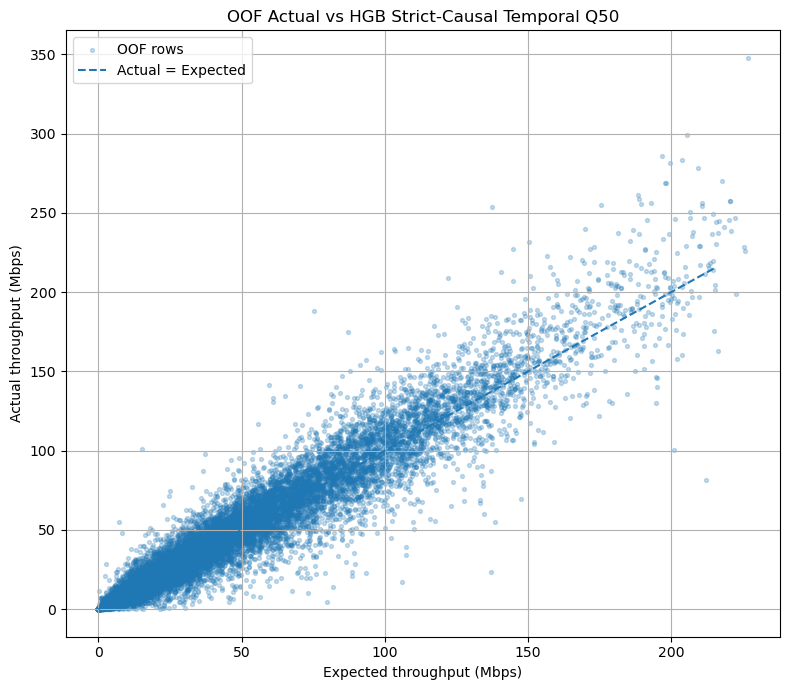

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_22_actual_vs_hgb_resource_oof.png


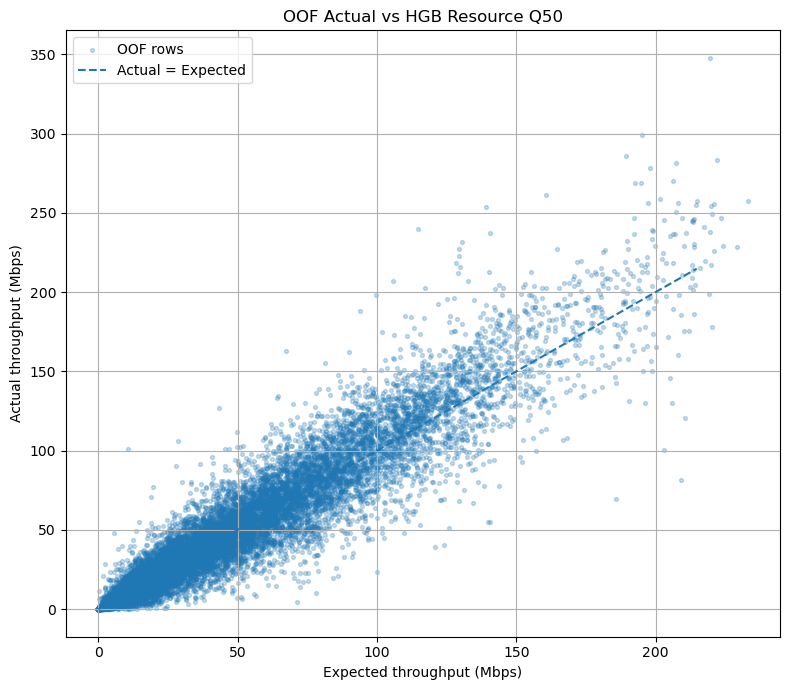

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_23_actual_vs_q75_resource_oof.png


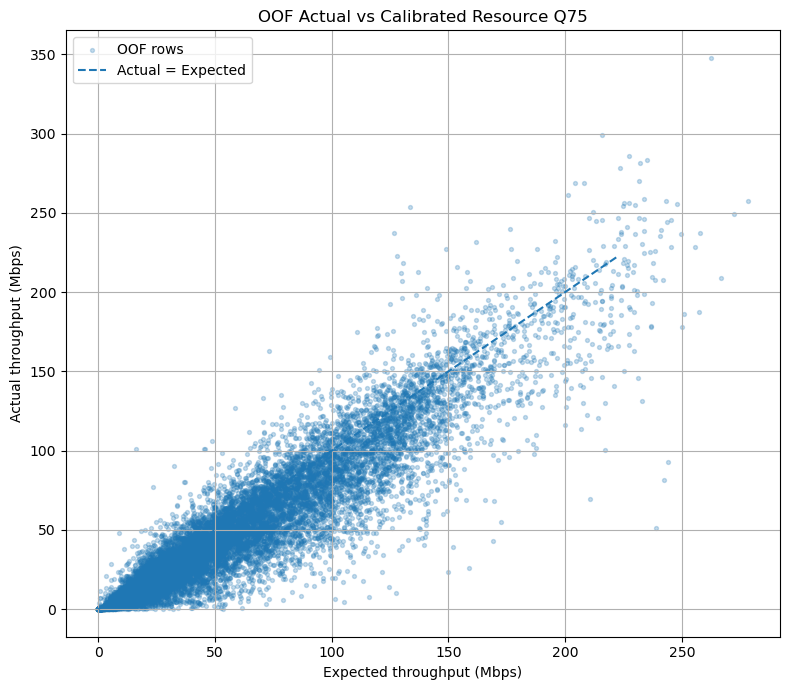

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_24_actual_vs_lstm_oof.png


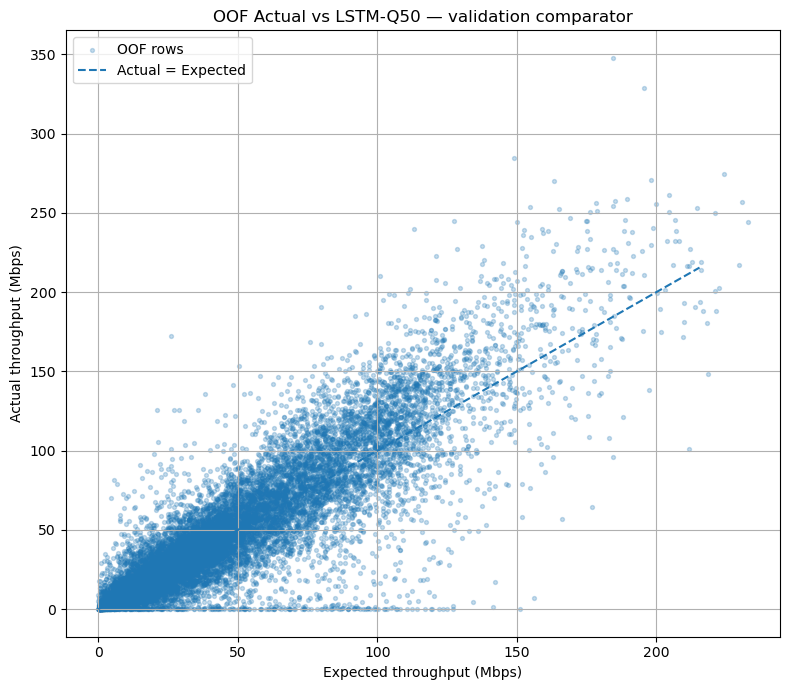

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_30_hgb_temporal_train_vs_test_same_plot.png


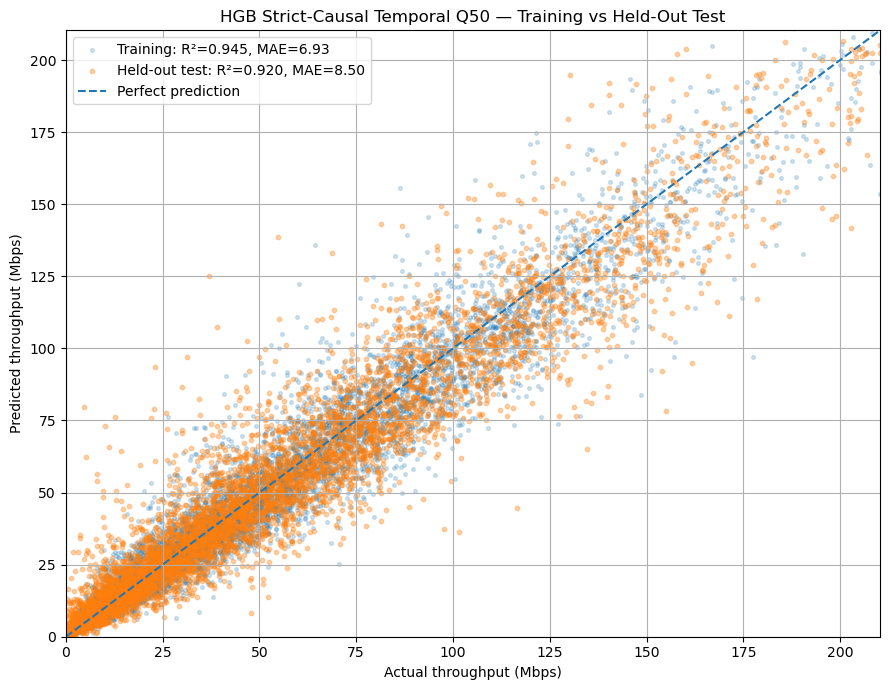

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_31_hgb_resource_train_vs_test_same_plot.png


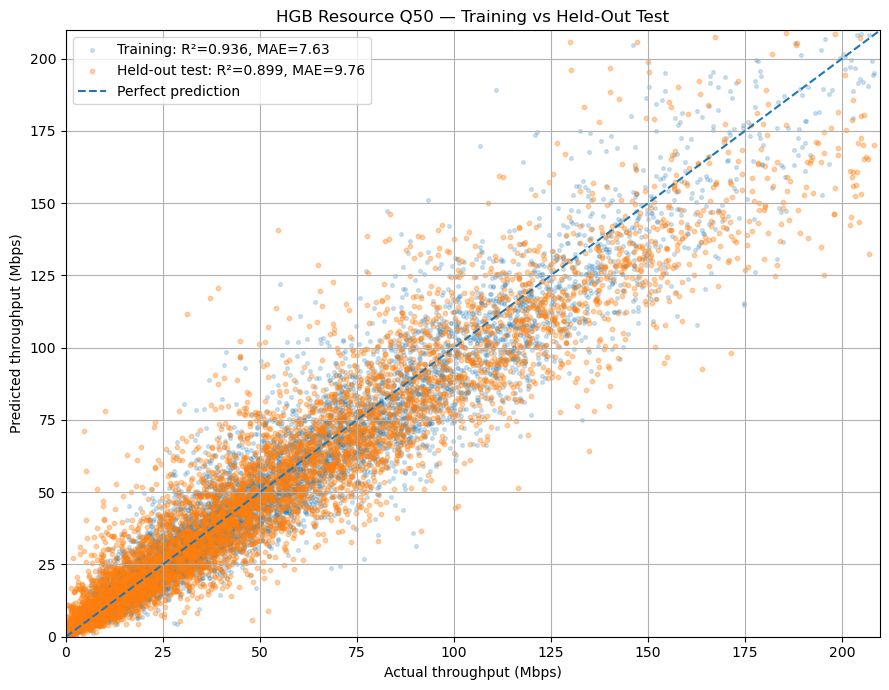

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_32_q75_resource_train_vs_test_same_plot.png


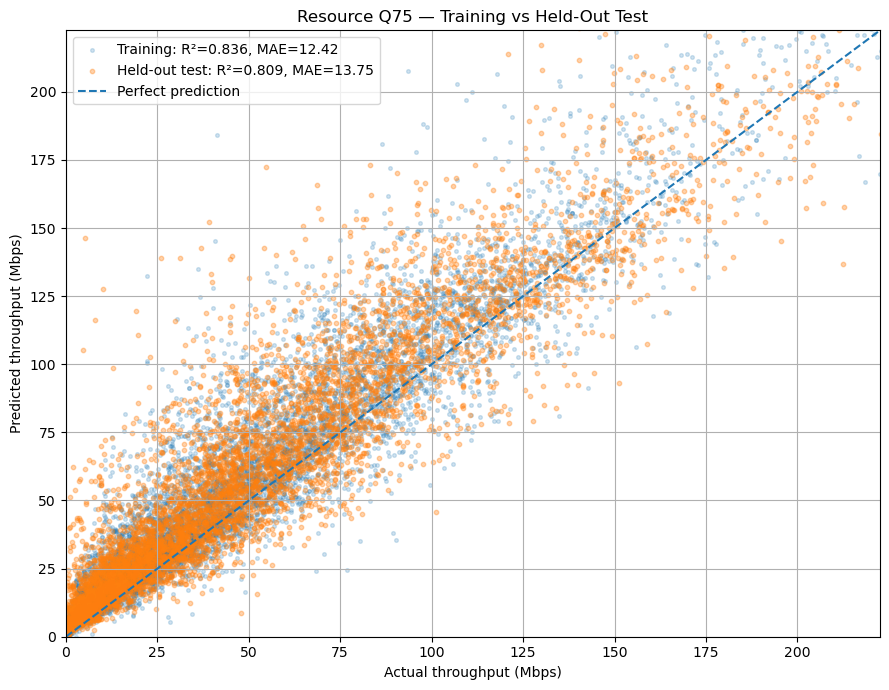

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_33_lstm_train_vs_test_same_plot.png


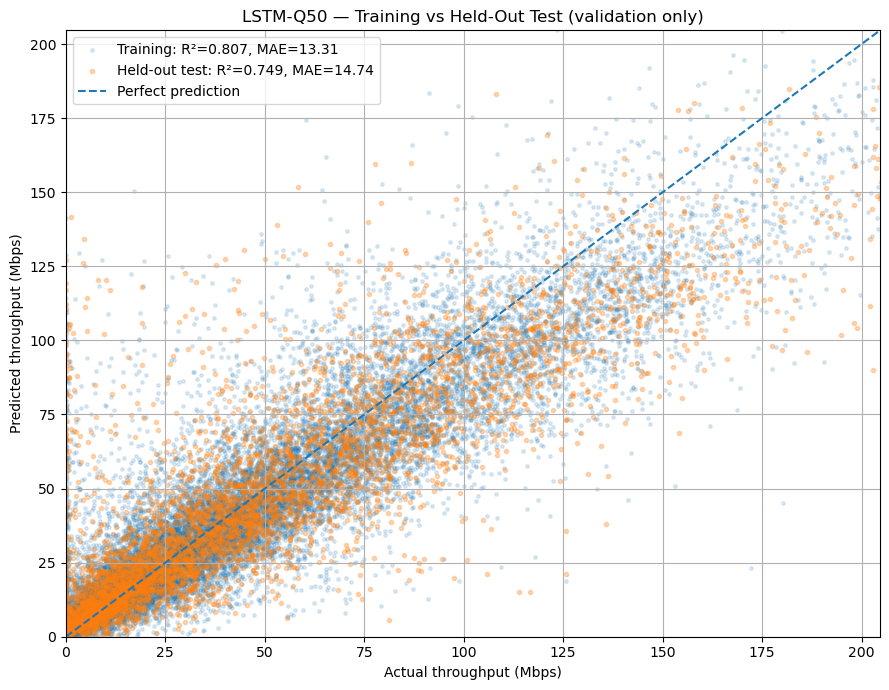

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_34_q75_resource_calibration_by_decile.png


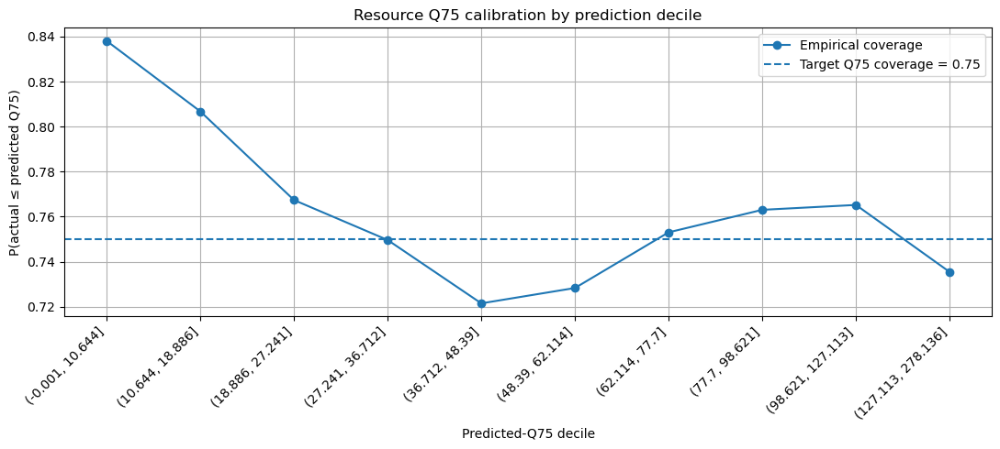

Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\ml_final_model_selection_summary.csv  shape=(5, 5)


,model,role,selection_reason,mean_r2_mbps,mean_mae_mbps
0,GradientBoosting_resource_conditioned_Q75_calibrated,KEEP_PRODUCTION,KEEP: calibrated upper expected-throughput reference; used for underperformance gap rather than central prediction.,0.8108,13.3421
1,HGB_resource_conditioned_Q50,KEEP_PRODUCTION,KEEP: strong resource/radio-conditioned central predictor independent of current throughput history.,0.8929,9.8409
2,HGB_strict_causal_temporal_Q50,KEEP_PRODUCTION,KEEP: strongest strict-causal forecasting benchmark; uses past-only session history and context.,0.9168,8.4773
3,LSTM_Q50,CONTEXT_VALIDATION_ONLY,VALIDATION ONLY: sequence-model comparator for model selection; excluded from final cases/JSON to avoid unnecessary complexity and weaker or less stable generalization.,0.7709,14.1853
4,IsolationForest_residual_space,CONTEXT_VALIDATION_ONLY,VALIDATION ONLY: unsupervised residual-space corroboration; not a throughput predictor and excluded from final cases/JSON.,NaN,NaN


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_35_final_model_selection_r2.png


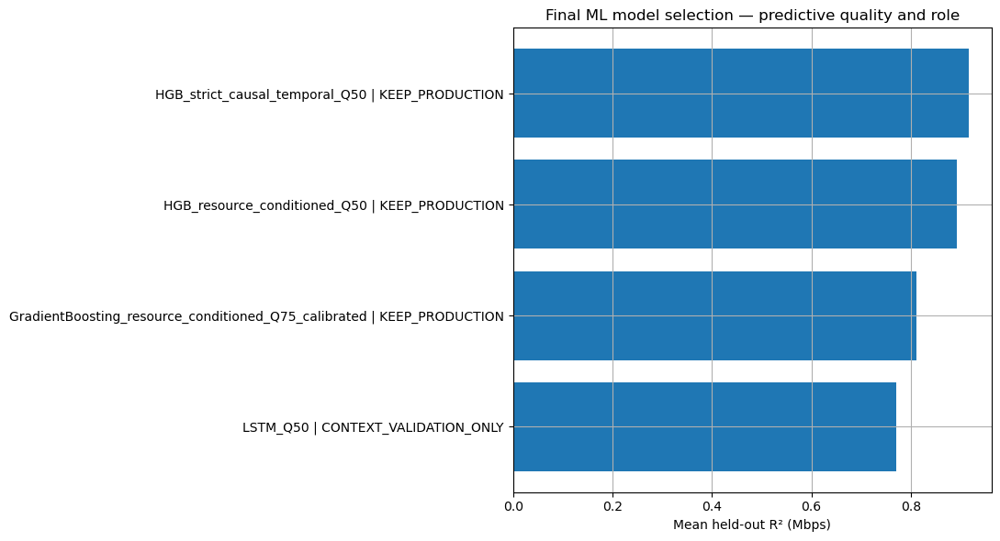

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\ml_36_final_model_selection_mae.png


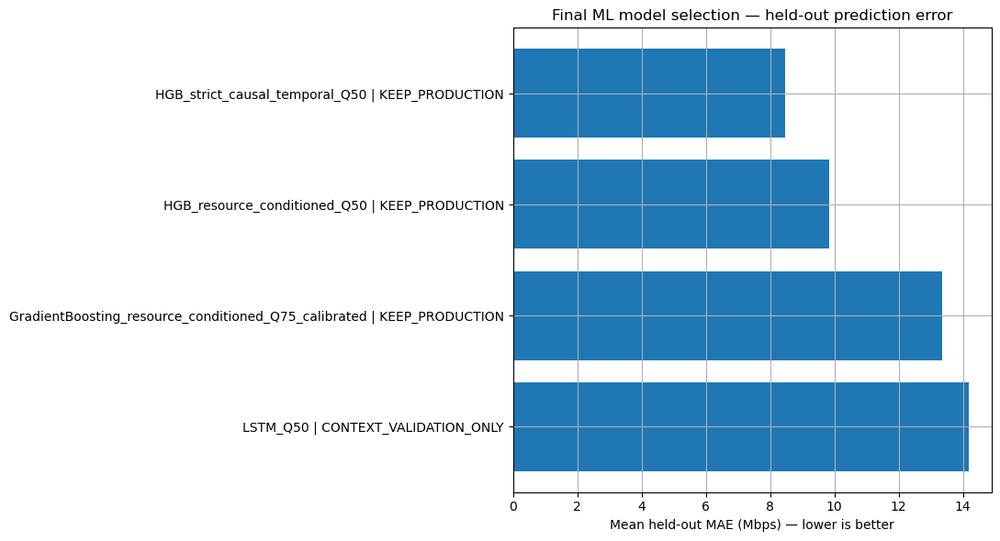

In [19]:
# =========================
# 25. Final ML validation plots — model quality, train vs test, Q75 calibration
# =========================


def plot_actual_vs_expected_oof(df, expected_col, title, filename, max_points=15000):
    if expected_col not in df.columns:
        return
    tmp = df[[TARGET_COL, expected_col]].dropna().copy()
    if len(tmp) > max_points:
        tmp = tmp.sample(max_points, random_state=ML_RANDOM_SEED)
    plt.figure(figsize=(8,7))
    plt.scatter(tmp[expected_col], tmp[TARGET_COL], s=8, alpha=0.25, label="OOF rows")
    limit = max(tmp[expected_col].quantile(0.995), tmp[TARGET_COL].quantile(0.995), 1)
    plt.plot([0,limit],[0,limit], linestyle="--", label="Actual = Expected")
    plt.xlabel("Expected throughput (Mbps)")
    plt.ylabel("Actual throughput (Mbps)")
    plt.title(title)
    plt.legend()
    save_current_plot(filename)
    plt.show()


def plot_train_vs_test_accuracy(comparison, title, filename):
    """Same plot: training fit and held-out-session test accuracy with different colors."""
    if not comparison:
        return
    train_idx = np.asarray(comparison["train_idx"], dtype=int)
    test_idx = np.asarray(comparison["test_idx"], dtype=int)
    y_train = pd.to_numeric(ml_audit.iloc[train_idx][TARGET_COL], errors="coerce").to_numpy()
    y_test = pd.to_numeric(ml_audit.iloc[test_idx][TARGET_COL], errors="coerce").to_numpy()
    pred_train = np.maximum(np.expm1(np.asarray(comparison["pred_train_log"])), 0)
    pred_test = np.maximum(np.expm1(np.asarray(comparison["pred_test_log"])), 0)
    train_mae = mean_absolute_error(y_train, pred_train)
    test_mae = mean_absolute_error(y_test, pred_test)
    train_r2 = r2_score(y_train, pred_train)
    test_r2 = r2_score(y_test, pred_test)
    # Sample only for visual density, metrics use full fold arrays above.
    rng = np.random.default_rng(ML_RANDOM_SEED)
    tr_sel = rng.choice(len(y_train), size=min(len(y_train), 8000), replace=False)
    te_sel = rng.choice(len(y_test), size=min(len(y_test), 8000), replace=False)
    plt.figure(figsize=(9,7))
    plt.scatter(y_train[tr_sel], pred_train[tr_sel], s=7, alpha=0.20, label=f"Training: R²={train_r2:.3f}, MAE={train_mae:.2f}")
    plt.scatter(y_test[te_sel], pred_test[te_sel], s=10, alpha=0.35, label=f"Held-out test: R²={test_r2:.3f}, MAE={test_mae:.2f}")
    limit = max(np.nanpercentile(np.r_[y_train,y_test,pred_train,pred_test],99.5),1)
    plt.plot([0,limit],[0,limit], linestyle="--", label="Perfect prediction")
    plt.xlim(0,limit); plt.ylim(0,limit)
    plt.xlabel("Actual throughput (Mbps)")
    plt.ylabel("Predicted throughput (Mbps)")
    plt.title(title)
    plt.legend()
    save_current_plot(filename)
    plt.show()


def plot_q75_calibration_deciles(calibration_df, filename):
    if calibration_df is None or calibration_df.empty:
        return
    decile_cols = [c for c in calibration_df.columns if c.endswith("_prediction_decile")]
    if not decile_cols:
        print("Q75 calibration plot skipped: no decile column")
        return
    decile_col = decile_cols[0]
    x = np.arange(len(calibration_df))
    plt.figure(figsize=(11,5))
    plt.plot(x, calibration_df["empirical_q75_coverage"], marker="o", label="Empirical coverage")
    plt.axhline(0.75, linestyle="--", label="Target Q75 coverage = 0.75")
    plt.xticks(x, [str(v) for v in calibration_df[decile_col]], rotation=45, ha="right")
    plt.ylabel("P(actual ≤ predicted Q75)")
    plt.xlabel("Predicted-Q75 decile")
    plt.title("Resource Q75 calibration by prediction decile")
    plt.legend()
    save_current_plot(filename)
    plt.show()



def plot_route_final_overlay(df, score_col, flag_col, title, filename, max_background_points=50000):
    needed = {"longitude", "latitude", score_col, flag_col}
    if not needed.issubset(df.columns):
        return
    tmp = df.dropna(subset=["longitude", "latitude", score_col]).copy()
    bg = tmp.sample(min(len(tmp), max_background_points), random_state=ML_RANDOM_SEED) if len(tmp) else tmp
    anom = tmp[tmp[flag_col].fillna(False).astype(bool)].copy()
    plt.figure(figsize=(10,8))
    plt.scatter(bg["longitude"], bg["latitude"], s=4, alpha=0.10, label="All route samples")
    if len(anom):
        vmax = anom[score_col].quantile(0.95)
        sc = plt.scatter(anom["longitude"], anom["latitude"], c=anom[score_col].clip(upper=vmax), s=22, alpha=0.90, label="Final anomalies")
        plt.colorbar(sc, label=f"Score clipped at P95={vmax:.1f}")
    plt.xlabel("Longitude"); plt.ylabel("Latitude"); plt.title(title); plt.legend()
    save_current_plot(filename); plt.show()

# OOF quality plots for the reduced predictive set + LSTM validation comparator.
for col,title,filename in [
    ("expected_tp_ml_hgb_temporal_q50", "OOF Actual vs HGB Strict-Causal Temporal Q50", "ml_21_actual_vs_hgb_temporal_oof.png"),
    ("expected_tp_ml_hgb_resource_q50", "OOF Actual vs HGB Resource Q50", "ml_22_actual_vs_hgb_resource_oof.png"),
    ("expected_tp_ml_q75_resource", "OOF Actual vs Calibrated Resource Q75", "ml_23_actual_vs_q75_resource_oof.png"),
    ("expected_tp_ml_lstm_q50", "OOF Actual vs LSTM-Q50 — validation comparator", "ml_24_actual_vs_lstm_oof.png"),
]:
    if col in ml_audit.columns and ml_audit[col].notna().any():
        plot_actual_vs_expected_oof(ml_audit, col, title, filename)

# Same-plot training vs held-out test comparison requested for easy overfit validation.
plot_train_vs_test_accuracy(hgb_temporal_comparison, "HGB Strict-Causal Temporal Q50 — Training vs Held-Out Test", "ml_30_hgb_temporal_train_vs_test_same_plot.png")
plot_train_vs_test_accuracy(hgb_resource_comparison, "HGB Resource Q50 — Training vs Held-Out Test", "ml_31_hgb_resource_train_vs_test_same_plot.png")
plot_train_vs_test_accuracy(q75_resource_comparison, "Resource Q75 — Training vs Held-Out Test", "ml_32_q75_resource_train_vs_test_same_plot.png")

# LSTM comparison object uses different keys; make an equivalent plot.
if lstm_comparison:
    train_pos = np.asarray(lstm_comparison["train_positions"], dtype=int)
    test_pos = np.asarray(lstm_comparison["test_positions"], dtype=int)
    y_train = pd.to_numeric(ml_audit.loc[train_pos, TARGET_COL], errors="coerce").to_numpy()
    y_test = pd.to_numeric(ml_audit.loc[test_pos, TARGET_COL], errors="coerce").to_numpy()
    pred_train = np.maximum(np.expm1(np.asarray(lstm_comparison["train_predictions_log"])),0)
    pred_test = np.maximum(np.expm1(np.asarray(lstm_comparison["test_predictions_log"])),0)
    plt.figure(figsize=(9,7))
    plt.scatter(y_train, pred_train, s=6, alpha=0.15, label=f"Training: R²={r2_score(y_train,pred_train):.3f}, MAE={mean_absolute_error(y_train,pred_train):.2f}")
    plt.scatter(y_test, pred_test, s=9, alpha=0.30, label=f"Held-out test: R²={r2_score(y_test,pred_test):.3f}, MAE={mean_absolute_error(y_test,pred_test):.2f}")
    limit = max(np.nanpercentile(np.r_[y_train,y_test,pred_train,pred_test],99.5),1)
    plt.plot([0,limit],[0,limit], linestyle="--", label="Perfect prediction")
    plt.xlim(0,limit); plt.ylim(0,limit)
    plt.xlabel("Actual throughput (Mbps)"); plt.ylabel("Predicted throughput (Mbps)")
    plt.title("LSTM-Q50 — Training vs Held-Out Test (validation only)")
    plt.legend(); save_current_plot("ml_33_lstm_train_vs_test_same_plot.png"); plt.show()

plot_q75_calibration_deciles(ml_q75_resource_decile_calibration, "ml_34_q75_resource_calibration_by_decile.png")

# Model-selection summary: best predictive models are visually marked KEEP; LSTM/IF are context validation.
model_selection_rows = []
for model_name, g in boosted_fold_metrics.groupby("model"):
    valid = g[g["split"].astype(str).str.contains("validation|test", case=False, na=False)]
    if valid.empty:
        valid = g
    name_low = str(model_name).lower()
    if "temporal" in name_low:
        reason = "KEEP: strongest strict-causal forecasting benchmark; uses past-only session history and context."
    elif "q75" in name_low:
        reason = "KEEP: calibrated upper expected-throughput reference; used for underperformance gap rather than central prediction."
    else:
        reason = "KEEP: strong resource/radio-conditioned central predictor independent of current throughput history."
    model_selection_rows.append({
        "model": model_name, "role": "KEEP_PRODUCTION", "selection_reason": reason,
        "mean_r2_mbps": valid.get("r2_mbps", pd.Series(dtype=float)).mean(),
        "mean_mae_mbps": valid.get("mae_mbps", pd.Series(dtype=float)).mean(),
    })
if not lstm_fold_metrics.empty:
    model_selection_rows.append({
        "model": "LSTM_Q50", "role": "CONTEXT_VALIDATION_ONLY",
        "selection_reason": "VALIDATION ONLY: sequence-model comparator for model selection; excluded from final cases/JSON to avoid unnecessary complexity and weaker or less stable generalization.",
        "mean_r2_mbps": lstm_fold_metrics.get("r2_mbps", pd.Series(dtype=float)).mean(),
        "mean_mae_mbps": lstm_fold_metrics.get("mae_mbps", pd.Series(dtype=float)).mean(),
    })
model_selection_rows.append({"model":"IsolationForest_residual_space", "role":"CONTEXT_VALIDATION_ONLY", "selection_reason":"VALIDATION ONLY: unsupervised residual-space corroboration; not a throughput predictor and excluded from final cases/JSON.", "mean_r2_mbps":np.nan, "mean_mae_mbps":np.nan})
ml_model_selection_summary = pd.DataFrame(model_selection_rows)
save_table(ml_model_selection_summary, "ml_final_model_selection_summary.csv", category="key")
display(ml_model_selection_summary.round(4))

# R2 visual comparison for predictive models only.
plot_df = ml_model_selection_summary.dropna(subset=["mean_r2_mbps"]).sort_values("mean_r2_mbps")
if not plot_df.empty:
    plt.figure(figsize=(11,6))
    plt.barh(plot_df["model"] + " | " + plot_df["role"], plot_df["mean_r2_mbps"])
    plt.xlabel("Mean held-out R² (Mbps)")
    plt.title("Final ML model selection — predictive quality and role")
    save_current_plot("ml_35_final_model_selection_r2.png")
    plt.show()

mae_df = ml_model_selection_summary.dropna(subset=["mean_mae_mbps"]).sort_values("mean_mae_mbps", ascending=False)
if not mae_df.empty:
    plt.figure(figsize=(11,6))
    plt.barh(mae_df["model"] + " | " + mae_df["role"], mae_df["mean_mae_mbps"])
    plt.xlabel("Mean held-out MAE (Mbps) — lower is better")
    plt.title("Final ML model selection — held-out prediction error")
    save_current_plot("ml_36_final_model_selection_mae.png")
    plt.show()


# 26. Statistical–ML score fusion — strict RCA decision layer

Raw statistical and ML scores are **not** blindly averaged. Fusion separates:

1. **Impact** — size of the throughput loss/drop for the active case.
2. **Detection confidence** — strength of independent statistical/production-ML evidence.

Final rules:

- Statistical methods are primary. P10, session P10, IQR, and robust MAD remain individually visible, but correlated low-tail methods count as one LOW_LEVEL family plus one bounded consensus evidence term.
- Independent statistical families are LOW_LEVEL, TEMPORAL_CHANGE, EXPECTED_UNDERPERFORMANCE, and RB_EFFICIENCY.
- Production ML confidence uses only **resource** and **strict-causal temporal** families; calibrated Q75 contributes expected-throughput magnitude within the resource objective.
- LSTM and Isolation Forest are validation/context only.
- Statistical-only anomalies need stronger evidence for RCA retention.
- ML-only anomalies are allowed only under strict confidence/gap/ratio rules and are marked `requires_human_review=true`.
- Priority stays continuous for ranking; RCA receives both a diverse shortlist and the full compact incident set.


In [20]:
# =========================
# 26. Row-level statistical–ML–LSTM fusion — strict final RCA decision layer
# =========================

if "source_index" not in lte_dl.columns or "source_index" not in ml_audit.columns:
    raise KeyError("source_index is required for safe statistical–ML fusion")

ml_fusion_cols = [c for c in ml_audit.columns if c.startswith("ml_") or c.startswith("expected_tp_ml_") or c == "is_ml_throughput_anomaly"]
ml_fusion_export = ml_audit[["source_index"] + ml_fusion_cols].drop_duplicates("source_index")
fused = lte_dl.merge(ml_fusion_export, on="source_index", how="left", validate="one_to_one")


def bool_col(frame: pd.DataFrame, name: str) -> pd.Series:
    if name in frame.columns:
        return frame[name].fillna(False).astype(bool)
    return pd.Series(False, index=frame.index)

# -------------------------
# Statistical evidence
# -------------------------
stat_score = pd.to_numeric(fused.get("anomaly_score_0_100", 0), errors="coerce").fillna(0)
stat_raw_score = pd.to_numeric(fused.get("anomaly_score_raw_0_100", stat_score), errors="coerce").fillna(stat_score)
stat_handoff = bool_col(fused, "rca_handoff_flag")
stat_reliable_p75 = bool_col(fused, "underperform_vs_p75_flag") | bool_col(fused, "underperform_vs_rb_p75_flag")
stat_rb_efficiency = bool_col(fused, "low_rb_efficiency_high_rb_flag")
stat_ca = bool_col(fused, "ca_underperformance_flag")
stat_radio = bool_col(fused, "radio_limited_degradation_flag")
stat_temporal = bool_col(fused, "rolling_drop_flag") | bool_col(fused, "sudden_drop_flag")
stat_sustained = bool_col(fused, "rolling_sustained_degradation_flag")
stat_low_only = bool_col(fused, "low_tp_family_flag") & ~(stat_reliable_p75 | stat_rb_efficiency | stat_ca | stat_radio | stat_temporal | stat_sustained)

stat_reliability = np.select(
    [stat_reliable_p75 | stat_rb_efficiency | stat_ca, stat_radio, stat_temporal, stat_sustained, stat_low_only],
    [1.00, 0.92, 0.90, 0.82, 0.55],
    default=0.65,
)
stat_strength = np.clip(stat_raw_score / 100.0, 0, 1)
fused["fused_statistical_strength_0_1"] = stat_strength
fused["fused_statistical_reliability_0_1"] = stat_reliability
fused["fused_statistical_evidence_0_1"] = stat_strength * stat_reliability

# -------------------------
# ML evidence by independent family
# -------------------------
ml_score = pd.to_numeric(fused.get("ml_anomaly_score_0_100", 0), errors="coerce").fillna(0)
ml_raw_score = pd.to_numeric(fused.get("ml_anomaly_score_raw_0_100", ml_score), errors="coerce").fillna(ml_score)
ml_final = bool_col(fused, "is_ml_throughput_anomaly")

# Production ML confidence uses ONLY resource + strict-causal temporal families.
# LSTM and IsolationForest are validation/context and cannot inflate final confidence.
res_ev = pd.to_numeric(fused.get("ml_resource_family_evidence_0_1", 0), errors="coerce").fillna(0).clip(0, 1)
tmp_ev = pd.to_numeric(fused.get("ml_temporal_family_evidence_0_1", 0), errors="coerce").fillna(0).clip(0, 1)
ml_family_confidence = 1 - (1-res_ev) * (1-tmp_ev)
fused["fused_ml_strength_0_1"] = np.clip(ml_raw_score / 100.0, 0, 1)
fused["fused_ml_reliability_0_1"] = np.maximum(res_ev, tmp_ev)
fused["fused_ml_evidence_0_1"] = ml_family_confidence

fused["fused_stat_ml_agreement_flag"] = stat_handoff & ml_final
ml_family_count = pd.to_numeric(fused.get("ml_independent_trigger_count", 0), errors="coerce").fillna(0)

# Detection confidence combines statistical evidence with FOUR independent ML families.
stat_evidence = fused["fused_statistical_evidence_0_1"]
confidence = 1 - (1 - 0.80 * stat_evidence) * (1 - 0.90 * ml_family_confidence)
confidence += 0.08 * fused["fused_stat_ml_agreement_flag"].astype(float)
confidence += 0.04 * bool_col(fused, "rb_medium_or_high_usage_flag").astype(float)
confidence += 0.04 * (ml_family_count >= 2).astype(float)
fused["fused_detection_confidence_0_100"] = (100 * np.clip(confidence, 0, 1)).round(2)

# -------------------------
# Objective-aware expected-throughput references
# -------------------------
def robust_median(frame: pd.DataFrame, cols: Sequence[str]) -> pd.Series:
    existing = [c for c in cols if c in frame.columns]
    return frame[existing].median(axis=1, skipna=True) if existing else pd.Series(np.nan, index=frame.index)

fused["fused_capability_expected_tp"] = robust_median(fused, [
    "expected_tp_radio_p75",
])
fused["fused_resource_expected_tp"] = robust_median(fused, [
    "expected_tp_rb_conditioned_p75", "expected_tp_ml_q75_resource", "expected_tp_ml_hgb_resource_q50",
])
fused["fused_temporal_expected_tp"] = robust_median(fused, [
    "expected_tp_ml_hgb_temporal_q50", "rolling_median_tp",
])

actual_fused = pd.to_numeric(fused[TARGET_COL], errors="coerce")

def impact_from_expected(expected: pd.Series, include_drop: bool = False) -> Tuple[pd.Series, pd.Series, pd.Series, pd.Series]:
    gap = expected - actual_fused
    ratio = actual_fused / expected.replace(0, np.nan)
    low = np.clip((20.0 - actual_fused) / 20.0, 0, 1)
    gap_comp = np.clip(gap / 80.0, 0, 1).fillna(0)
    ratio_comp = np.clip((0.60 - ratio) / 0.60, 0, 1).fillna(0)
    impact = 0.25 * low + 0.40 * gap_comp + 0.35 * ratio_comp
    if include_drop:
        rolling_gap = pd.to_numeric(fused.get("rolling_tp_gap", 0), errors="coerce").fillna(0)
        prev_gap = pd.to_numeric(fused.get("tp_drop_from_prev", 0), errors="coerce").fillna(0)
        drop = np.clip(pd.concat([rolling_gap, prev_gap], axis=1).max(axis=1) / 40.0, 0, 1)
        impact = 0.80 * impact + 0.20 * drop
    return impact.clip(0, 1), gap, ratio, low

cap_impact, cap_gap, cap_ratio, _ = impact_from_expected(fused["fused_capability_expected_tp"])
res_impact, res_gap, res_ratio, _ = impact_from_expected(fused["fused_resource_expected_tp"])
tmp_impact, tmp_gap, tmp_ratio, _ = impact_from_expected(fused["fused_temporal_expected_tp"], include_drop=True)

cap_active = stat_reliable_p75 | bool_col(fused, "ml_capability_family_flag")
res_active = stat_rb_efficiency | stat_ca | bool_col(fused, "underperform_vs_rb_p75_flag") | bool_col(fused, "ml_resource_family_flag")
tmp_active = stat_temporal | bool_col(fused, "ml_temporal_family_flag")
radio_active = stat_radio

# Radio-limited impact is based on actual degradation and persistence, not an inflated
# capability maximum.
low_tp_component = np.clip((20.0 - actual_fused) / 20.0, 0, 1)
persistence_proxy = (0.70 * stat_sustained.astype(float) + 0.30 * bool_col(fused, "bad_session_sample_flag").astype(float)).clip(0, 1)
radio_impact = (0.70 * low_tp_component + 0.30 * persistence_proxy).clip(0, 1)

family_impact_df = pd.DataFrame({
    "capability": cap_impact.where(cap_active, 0),
    "resource": res_impact.where(res_active, 0),
    "temporal": tmp_impact.where(tmp_active, 0),
    "radio": radio_impact.where(radio_active, 0),
}, index=fused.index)
fused["fused_dominant_impact_family"] = family_impact_df.idxmax(axis=1)
fused["fused_impact_score_0_100"] = (100 * family_impact_df.max(axis=1)).round(2)

# Backward-compatible expected/gap fields now refer to the DOMINANT impact family rather
# than the maximum expected value across unrelated models.
fused["fused_best_expected_tp"] = np.select(
    [
        fused["fused_dominant_impact_family"].eq("capability"),
        fused["fused_dominant_impact_family"].eq("resource"),
        fused["fused_dominant_impact_family"].eq("temporal"),
    ],
    [fused["fused_capability_expected_tp"], fused["fused_resource_expected_tp"], fused["fused_temporal_expected_tp"]],
    default=np.nan,
)
fused["fused_expected_gap_mbps"] = fused["fused_best_expected_tp"] - actual_fused
fused["fused_actual_expected_ratio"] = actual_fused / pd.Series(fused["fused_best_expected_tp"], index=fused.index).replace(0, np.nan)

fused_priority_raw = (
    FUSION_IMPACT_WEIGHT * fused["fused_impact_score_0_100"]
    + FUSION_CONFIDENCE_WEIGHT * fused["fused_detection_confidence_0_100"]
)
fused["final_rca_priority_raw_0_100"] = np.clip(fused_priority_raw, 0, 100).round(2)

# -------------------------
# Strict final keep rules
# -------------------------
rolling_gap = pd.to_numeric(fused.get("rolling_tp_gap", 0), errors="coerce").fillna(0)
prev_gap = pd.to_numeric(fused.get("tp_drop_from_prev", 0), errors="coerce").fillna(0)
drop_component = np.clip(pd.concat([rolling_gap, prev_gap], axis=1).max(axis=1) / 40.0, 0, 1)
very_low_tp = actual_fused <= VERY_LOW_TP_MBPS
rb_medium_high = bool_col(fused, "rb_medium_or_high_usage_flag")

catastrophic_fused = (
    (actual_fused <= CATASTROPHIC_ACTUAL_TP_MBPS)
    & (
        (fused["fused_capability_expected_tp"] >= CATASTROPHIC_EXPECTED_TP_MBPS)
        | (fused["fused_resource_expected_tp"] >= CATASTROPHIC_EXPECTED_TP_MBPS)
    )
    & (fused["fused_stat_ml_agreement_flag"] | (ml_family_count >= 2))
)

consensus_keep = stat_handoff & ml_final & (
    (fused["final_rca_priority_raw_0_100"] >= FUSION_CONSENSUS_MIN_SCORE) | catastrophic_fused
)

stat_expected_keep = (
    (stat_reliable_p75 | stat_rb_efficiency | stat_ca)
    & (fused["final_rca_priority_raw_0_100"] >= FUSION_STAT_EXPECTED_MIN_SCORE)
)
stat_radio_keep = (
    stat_radio
    & (stat_sustained | very_low_tp)
    & (fused["final_rca_priority_raw_0_100"] >= FUSION_STAT_RADIO_TEMPORAL_MIN_SCORE)
)
stat_temporal_keep = (
    stat_temporal
    & (drop_component >= 0.40)
    & (fused["final_rca_priority_raw_0_100"] >= FUSION_STAT_RADIO_TEMPORAL_MIN_SCORE)
)
stat_only_keep = stat_handoff & (~ml_final) & (stat_expected_keep | stat_radio_keep | stat_temporal_keep)

ml_severe_any = pd.concat([
    bool_col(fused, c) for c in [
        "ml_q75_resource_severe_underperformance_flag", "ml_hgb_resource_severe_underperformance_flag",
        "ml_hgb_temporal_severe_underperformance_flag",
    ]
], axis=1).any(axis=1)
ml_only_keep = (
    ml_final & (~stat_handoff)
    & (
        (
            fused["fused_detection_confidence_0_100"] >= FUSION_ML_ONLY_MIN_CONFIDENCE
        )
        & (
            fused["final_rca_priority_raw_0_100"] >= FUSION_ML_ONLY_MIN_SCORE
        )
        | ml_severe_any
    )
)

fused["fused_consensus_flag"] = consensus_keep
fused["fused_statistical_only_flag"] = stat_only_keep
fused["fused_ml_only_flag"] = ml_only_keep
fused["final_rca_handoff_flag"] = consensus_keep | stat_only_keep | ml_only_keep
fused["requires_human_review_flag"] = ml_only_keep
fused["human_review_reason"] = np.where(ml_only_keep, "strict_ml_only_anomaly_requires_supervised_verification", "not_required_by_ml_only_rule")

# Preserve continuous raw priority. Non-handoff rows get zero only in the handoff-facing
# score column; no minimum score is forced onto retained rows.
fused["fusion_selected_impact_confidence_score_0_100"] = fused["final_rca_priority_raw_0_100"]
fused["final_rca_priority_score_0_100"] = fused["final_rca_priority_raw_0_100"].where(fused["final_rca_handoff_flag"], 0.0)
fused["fused_catastrophic_flag"] = catastrophic_fused

# Diagnostic comparison methods only.
fused["fusion_naive_average_score_0_100"] = ((stat_score + ml_score) / 2.0).round(2)
fused["fusion_weighted_max_score_0_100"] = np.maximum(0.80 * stat_score, 0.90 * ml_score).round(2)

fused["impact_severity"] = np.select(
    [fused["fused_impact_score_0_100"] >= 80, fused["fused_impact_score_0_100"] >= 55, fused["fused_impact_score_0_100"] >= 30],
    ["Critical", "High", "Medium"], default="Low",
)
fused["detection_confidence"] = np.select(
    [fused["fused_detection_confidence_0_100"] >= 80, fused["fused_detection_confidence_0_100"] >= 60, fused["fused_detection_confidence_0_100"] >= 40],
    ["Very High", "High", "Medium"], default="Low",
)
fused["final_priority_severity"] = np.select(
    [
        ~fused["final_rca_handoff_flag"],
        catastrophic_fused | (fused["final_rca_priority_score_0_100"] >= FUSION_CRITICAL),
        fused["final_rca_priority_score_0_100"] >= FUSION_HIGH,
        fused["final_rca_priority_score_0_100"] >= FUSION_MEDIUM,
    ],
    ["Normal", "Critical", "High", "Medium"], default="Low",
)
fused["fusion_source"] = np.select(
    [consensus_keep, stat_only_keep, ml_only_keep],
    ["statistical_and_ml_consensus", "statistical_only_retained", "ml_only_retained"],
    default="not_handed_off",
)

save_parquet_or_csv(fused, "lte_throughput_anomalies_fused_row_level", category="anomaly")
fused_handoff_rows = fused[fused["final_rca_handoff_flag"]].copy()
save_table(fused_handoff_rows, "lte_throughput_anomalies_final_fused_row_level.csv", category="anomaly")

# Overlap diagnostics.
overlap_rows = []
for stat_name, stat_flag in [
    ("broad_statistical_candidate", bool_col(fused, "is_throughput_anomaly")),
    ("statistical_rca_handoff", stat_handoff),
    ("statistical_high_or_critical", fused.get("anomaly_severity", "Normal").isin(["High", "Critical"]) if "anomaly_severity" in fused.columns else pd.Series(False, index=fused.index)),
]:
    for stat_value in [False, True]:
        for ml_value in [False, True]:
            mask = (stat_flag == stat_value) & (ml_final == ml_value)
            overlap_rows.append({
                "statistical_definition": stat_name, "statistical_flag": stat_value,
                "ml_final_flag": ml_value, "rows": int(mask.sum()), "pct_all_rows": float(mask.mean() * 100),
            })
ml_vs_statistical_overlap = pd.DataFrame(overlap_rows)
save_table(ml_vs_statistical_overlap, "ml_vs_statistical_overlap_summary.csv", category="anomaly")

fusion_summary = (
    fused.groupby(["fusion_source", "final_priority_severity", "detection_confidence"], dropna=False)
    .agg(
        rows=(TARGET_COL, "size"), median_actual_tp=(TARGET_COL, "median"),
        median_final_priority=("final_rca_priority_score_0_100", "median"),
        median_raw_priority=("final_rca_priority_raw_0_100", "median"),
        median_impact=("fused_impact_score_0_100", "median"),
        median_confidence=("fused_detection_confidence_0_100", "median"),
    ).reset_index()
)
save_table(fusion_summary, "final_score_fusion_distribution_summary.csv", category="anomaly")

fusion_method_comparison = pd.DataFrame([{
    "method": col,
    "median_all_rows": fused[col].median(),
    "median_final_handoff_rows": fused.loc[fused["final_rca_handoff_flag"], col].median(),
    "p90_final_handoff_rows": fused.loc[fused["final_rca_handoff_flag"], col].quantile(0.90),
    "statistical_only_median": fused.loc[stat_only_keep, col].median(),
    "ml_only_median": fused.loc[ml_only_keep, col].median(),
    "consensus_median": fused.loc[consensus_keep, col].median(),
} for col in [
    "fusion_naive_average_score_0_100", "fusion_weighted_max_score_0_100",
    "fusion_selected_impact_confidence_score_0_100",
]])
save_table(fusion_method_comparison, "score_fusion_method_comparison.csv", category="anomaly")

display(ml_vs_statistical_overlap)
display(fusion_summary.round(3))
print("Final fused row handoff:", len(fused_handoff_rows), "rows")


Saved Parquet: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomalies_fused_row_level.parquet  shape=(32238, 627)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomalies_final_fused_row_level.csv  shape=(3197, 627)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\ml_vs_statistical_overlap_summary.csv  shape=(12, 5)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\final_score_fusion_distribution_summary.csv  shape=(18, 9)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\score_fusion_method_comparison.csv  shape=(3, 7)


,statistical_definition,statistical_flag,ml_final_flag,rows,pct_all_rows
0,broad_statistical_candidate,False,False,24148,74.905391
1,broad_statistical_candidate,False,True,4,0.012408
2,broad_statistical_candidate,True,False,7950,24.660339
3,broad_statistical_candidate,True,True,136,0.421862
4,statistical_rca_handoff,False,False,26017,80.702897
5,statistical_rca_handoff,False,True,4,0.012408
6,statistical_rca_handoff,True,False,6081,18.862833
7,statistical_rca_handoff,True,True,136,0.421862
8,statistical_high_or_critical,False,False,28287,87.744277
9,statistical_high_or_critical,False,True,12,0.037223


,fusion_source,final_priority_severity,detection_confidence,rows,median_actual_tp,median_final_priority,median_raw_priority,median_impact,median_confidence
0,ml_only_retained,Medium,High,1,15.383,62.130,62.130,50.050,76.900
1,ml_only_retained,Medium,Very High,1,30.010,57.140,57.140,38.140,80.370
2,not_handed_off,Normal,High,441,10.356,0.000,45.920,28.430,64.800
3,not_handed_off,Normal,Low,25563,49.306,0.000,4.990,0.000,11.090
4,not_handed_off,Normal,Medium,3023,9.127,0.000,28.260,15.960,47.710
5,not_handed_off,Normal,Very High,14,7.751,0.000,54.195,31.190,82.510
6,statistical_and_ml_consensus,Critical,Very High,24,5.462,94.420,94.420,89.855,100.000
7,statistical_and_ml_consensus,High,Very High,111,18.319,80.590,80.590,64.750,100.000
8,statistical_and_ml_consensus,Medium,Very High,1,15.218,64.690,64.690,41.720,92.760
9,statistical_only_retained,Critical,Very High,23,2.250,93.350,93.350,94.230,94.430


Final fused row handoff: 3197 rows


## 27. Final RCA episodes and operational incidents

The fixed notebook produces three levels:

1. **All candidate episodes** — complete audit trail of consecutive final-row candidates.
2. **Strict final RCA episodes** — filtered by episode priority/confidence/direct evidence, with stricter rules for statistical-only singletons.
3. **Operational RCA incidents** — nearby compatible strict episodes are merged only when time, distance, PCI, and anomaly-family context are consistent.

This keeps forensic sample detail while preventing the engineer-facing RCA handoff from being dominated by low-priority singleton episodes.

In [21]:
# =========================
# 27. Candidate episodes, strict final RCA episodes, and operational incident consolidation
# =========================

if len(fused_handoff_rows):
    all_episode_rows = add_anomaly_episode_ids(fused_handoff_rows.copy()).rename(columns={"anomaly_episode_id": "final_episode_id"})
    all_episode_rows["statistical_type_for_episode"] = all_episode_rows.get("anomaly_type", "normal")
    all_episode_rows["ml_type_for_episode"] = all_episode_rows.get("ml_anomaly_type", "normal")
    episode_group = all_episode_rows.groupby("final_episode_id", dropna=False)

    all_episode_summary = episode_group.agg(
        id=(GROUP_COL, "first"),
        route_label=("id_route_test_label", "first") if "id_route_test_label" in all_episode_rows.columns else (GROUP_COL, "first"),
        start_time=(TIME_COL, "min"), end_time=(TIME_COL, "max"), rows=(TARGET_COL, "size"),
        latitude_start=("latitude", "first") if "latitude" in all_episode_rows.columns else (TARGET_COL, "size"),
        longitude_start=("longitude", "first") if "longitude" in all_episode_rows.columns else (TARGET_COL, "size"),
        latitude_end=("latitude", "last") if "latitude" in all_episode_rows.columns else (TARGET_COL, "size"),
        longitude_end=("longitude", "last") if "longitude" in all_episode_rows.columns else (TARGET_COL, "size"),
        primary_serving_pci=("serving_pci", lambda s: s.mode().iloc[0] if len(s.mode()) else np.nan) if "serving_pci" in all_episode_rows.columns else (TARGET_COL, "size"),
        primary_earfcn=("serving_earfcn", lambda s: s.mode().iloc[0] if len(s.mode()) else np.nan) if "serving_earfcn" in all_episode_rows.columns else (TARGET_COL, "size"),
        primary_band=("serving_band", lambda s: s.mode().iloc[0] if len(s.mode()) else np.nan) if "serving_band" in all_episode_rows.columns else (TARGET_COL, "size"),
        min_actual_tp=(TARGET_COL, "min"), median_actual_tp=(TARGET_COL, "median"),
        max_expected_tp=("fused_best_expected_tp", "max"), max_expected_gap=("fused_expected_gap_mbps", "max"),
        min_actual_expected_ratio=("fused_actual_expected_ratio", "min"),
        max_row_priority=("final_rca_priority_score_0_100", "max"), mean_row_priority=("final_rca_priority_score_0_100", "mean"),
        max_row_impact=("fused_impact_score_0_100", "max"), mean_row_impact=("fused_impact_score_0_100", "mean"),
        max_row_confidence=("fused_detection_confidence_0_100", "max"), mean_row_confidence=("fused_detection_confidence_0_100", "mean"),
        consensus_rows=("fused_consensus_flag", "sum"), statistical_only_rows=("fused_statistical_only_flag", "sum"), ml_only_rows=("fused_ml_only_flag", "sum"),
        dominant_statistical_type=("statistical_type_for_episode", lambda s: s.mode().iloc[0] if len(s.mode()) else "normal"),
        dominant_ml_type=("ml_type_for_episode", lambda s: s.mode().iloc[0] if len(s.mode()) else "normal"),
        fusion_source_mode=("fusion_source", lambda s: s.mode().iloc[0] if len(s.mode()) else "unknown"),
    ).reset_index()

    start_utc = pd.to_datetime(all_episode_summary["start_time"], errors="coerce", utc=True)
    end_utc = pd.to_datetime(all_episode_summary["end_time"], errors="coerce", utc=True)
    all_episode_summary["duration_seconds"] = (end_utc - start_utc).dt.total_seconds().fillna(0)
    if "distance_from_prev_m" in all_episode_rows.columns:
        all_episode_summary["distance_affected_m"] = all_episode_summary["final_episode_id"].map(episode_group["distance_from_prev_m"].sum(min_count=1))
    else:
        all_episode_summary["distance_affected_m"] = np.nan

    all_episode_summary["agreement_pct"] = all_episode_summary["consensus_rows"] / all_episode_summary["rows"].replace(0, np.nan) * 100
    persistence_component = np.clip(np.log1p(all_episode_summary["rows"]) / np.log1p(10), 0, 1)
    duration_component = np.clip(all_episode_summary["duration_seconds"] / 30.0, 0, 1)
    episode_impact = (
        0.55 * (all_episode_summary["max_row_impact"] / 100.0)
        + 0.20 * (all_episode_summary["mean_row_impact"] / 100.0)
        + 0.15 * persistence_component + 0.10 * duration_component
    )
    episode_confidence = (
        0.60 * (all_episode_summary["max_row_confidence"] / 100.0)
        + 0.25 * (all_episode_summary["mean_row_confidence"] / 100.0)
        + 0.15 * np.clip(all_episode_summary["agreement_pct"] / 100.0, 0, 1)
    )
    all_episode_summary["episode_impact_score_0_100"] = (100 * np.clip(episode_impact, 0, 1)).round(2)
    all_episode_summary["episode_detection_confidence_0_100"] = (100 * np.clip(episode_confidence, 0, 1)).round(2)
    all_episode_summary["episode_final_priority_0_100"] = (
        100 * (FUSION_IMPACT_WEIGHT*np.clip(episode_impact,0,1) + FUSION_CONFIDENCE_WEIGHT*np.clip(episode_confidence,0,1))
    ).clip(upper=100).round(2)

    all_episode_summary["episode_impact_severity"] = np.select(
        [all_episode_summary["episode_impact_score_0_100"] >= 80, all_episode_summary["episode_impact_score_0_100"] >= 55, all_episode_summary["episode_impact_score_0_100"] >= 30],
        ["Critical", "High", "Medium"], default="Low",
    )
    all_episode_summary["episode_detection_confidence"] = np.select(
        [all_episode_summary["episode_detection_confidence_0_100"] >= 80, all_episode_summary["episode_detection_confidence_0_100"] >= 60, all_episode_summary["episode_detection_confidence_0_100"] >= 40],
        ["Very High", "High", "Medium"], default="Low",
    )

    # Direct evidence counts used by the final episode keep gate.
    direct_flags = [
        "underperform_vs_p75_flag", "underperform_vs_rb_p75_flag", "low_rb_efficiency_high_rb_flag",
        "ca_underperformance_flag", "ml_q75_resource_underperformance_flag",
        "ml_hgb_resource_underperformance_flag", "ml_hgb_temporal_underperformance_flag",
    ]
    for flag_col in direct_flags + [
        "near_handover_execution_flag", "near_handover_failure_flag", "near_rach_failure_flag", "near_ca_activation_change_flag"
    ]:
        if flag_col in all_episode_rows.columns:
            all_episode_summary[f"{flag_col}_rows"] = all_episode_summary["final_episode_id"].map(episode_group[flag_col].sum()).fillna(0).astype(int)

    direct_evidence_cols = [f"{c}_rows" for c in direct_flags if f"{c}_rows" in all_episode_summary.columns]
    all_episode_summary["strong_direct_evidence_rows"] = all_episode_summary[direct_evidence_cols].sum(axis=1) if direct_evidence_cols else 0

    base_episode_keep = (
        (all_episode_summary["episode_final_priority_0_100"] >= FUSION_EPISODE_MIN_SCORE)
        & ((all_episode_summary["episode_detection_confidence_0_100"] >= FUSION_EPISODE_MIN_CONFIDENCE) | (all_episode_summary["strong_direct_evidence_rows"] > 0))
    )
    singleton_stat_only = (
        (all_episode_summary["rows"] == 1)
        & all_episode_summary["fusion_source_mode"].eq("statistical_only_retained")
    )
    singleton_ok = (
        (all_episode_summary["episode_final_priority_0_100"] >= FUSION_SINGLETON_STAT_ONLY_MIN_SCORE)
        | ((all_episode_summary["strong_direct_evidence_rows"] > 0) & (all_episode_summary["episode_impact_score_0_100"] >= 70))
    )
    all_episode_summary["final_episode_handoff_flag"] = base_episode_keep & (~singleton_stat_only | singleton_ok)

    all_episode_summary["episode_priority_severity"] = np.select(
        [
            ~all_episode_summary["final_episode_handoff_flag"],
            (all_episode_summary["episode_final_priority_0_100"] >= 85) & (all_episode_summary["strong_direct_evidence_rows"] > 0),
            all_episode_summary["episode_final_priority_0_100"] >= FUSION_HIGH,
            all_episode_summary["episode_final_priority_0_100"] >= FUSION_MEDIUM,
        ],
        ["Not handed off", "Critical", "High", "Medium"], default="Low",
    )

    all_episode_summary = all_episode_summary.sort_values(["episode_final_priority_0_100", "rows"], ascending=[False, False])
    final_episode_summary = all_episode_summary[all_episode_summary["final_episode_handoff_flag"]].copy()
    keep_ids = set(final_episode_summary["final_episode_id"].astype(str))
    final_episode_rows = all_episode_rows[all_episode_rows["final_episode_id"].astype(str).isin(keep_ids)].copy()

    # Operational incidents bridge only very close, technically compatible strict episodes.
    def _geo_distance_m(lat1, lon1, lat2, lon2):
        vals = [lat1, lon1, lat2, lon2]
        if not all(pd.notna(v) for v in vals):
            return np.nan
        p1, p2 = np.radians([float(lat1), float(lat2)])
        dphi = p2 - p1
        dl = np.radians(float(lon2) - float(lon1))
        a = np.sin(dphi/2)**2 + np.cos(p1)*np.cos(p2)*np.sin(dl/2)**2
        return float(2 * 6371008.8 * np.arcsin(np.sqrt(a)))

    operational = final_episode_summary.sort_values(["id", "start_time"]).copy()
    incident_ids, incident_counter, prev = [], 0, None
    for _, row in operational.iterrows():
        new_incident = True
        if prev is not None and str(row["id"]) == str(prev["id"]):
            gap_s = (pd.to_datetime(row["start_time"], utc=True) - pd.to_datetime(prev["end_time"], utc=True)).total_seconds()
            dist_m = _geo_distance_m(prev.get("latitude_end"), prev.get("longitude_end"), row.get("latitude_start"), row.get("longitude_start"))
            pci_compatible = pd.isna(row.get("primary_serving_pci")) or pd.isna(prev.get("primary_serving_pci")) or row.get("primary_serving_pci") == prev.get("primary_serving_pci")
            stat_now, stat_prev = row.get("dominant_statistical_type"), prev.get("dominant_statistical_type")
            ml_now, ml_prev = row.get("dominant_ml_type"), prev.get("dominant_ml_type")
            stat_match = pd.notna(stat_now) and pd.notna(stat_prev) and stat_now != "normal" and stat_now == stat_prev
            ml_match = pd.notna(ml_now) and pd.notna(ml_prev) and ml_now != "normal" and ml_now == ml_prev
            family_compatible = bool(stat_match or ml_match)
            spatial_ok = pd.isna(dist_m) or dist_m <= FUSION_OPERATIONAL_MAX_DISTANCE_M
            new_incident = not (0 <= gap_s <= FUSION_OPERATIONAL_MAX_GAP_SECONDS and spatial_ok and pci_compatible and family_compatible)
        if new_incident:
            incident_counter += 1
        incident_ids.append(f"INC-{incident_counter:06d}")
        prev = row
    operational["operational_incident_id"] = incident_ids

    operational_incident_summary = operational.groupby("operational_incident_id", dropna=False).agg(
        id=("id", "first"), route_label=("route_label", "first"), start_time=("start_time", "min"), end_time=("end_time", "max"),
        strict_episodes=("final_episode_id", "nunique"), rows=("rows", "sum"),
        max_priority=("episode_final_priority_0_100", "max"), mean_priority=("episode_final_priority_0_100", "mean"),
        max_impact=("episode_impact_score_0_100", "max"), max_confidence=("episode_detection_confidence_0_100", "max"),
        consensus_rows=("consensus_rows", "sum"), statistical_only_rows=("statistical_only_rows", "sum"), ml_only_rows=("ml_only_rows", "sum"),
        dominant_statistical_type=("dominant_statistical_type", lambda s: s.mode().iloc[0] if len(s.mode()) else "normal"),
        dominant_ml_type=("dominant_ml_type", lambda s: s.mode().iloc[0] if len(s.mode()) else "normal"),
        primary_serving_pci=("primary_serving_pci", lambda s: s.mode().iloc[0] if len(s.mode()) else np.nan),
    ).reset_index()
    incident_start = pd.to_datetime(operational_incident_summary["start_time"], errors="coerce", utc=True)
    incident_end = pd.to_datetime(operational_incident_summary["end_time"], errors="coerce", utc=True)
    operational_incident_summary["duration_seconds"] = (incident_end - incident_start).dt.total_seconds().fillna(0)
    operational_incident_summary = operational_incident_summary.sort_values(["max_priority", "rows"], ascending=[False, False])
else:
    all_episode_rows = pd.DataFrame()
    all_episode_summary = pd.DataFrame()
    final_episode_rows = pd.DataFrame()
    final_episode_summary = pd.DataFrame()
    operational_incident_summary = pd.DataFrame()

save_table(all_episode_rows, "lte_throughput_anomalies_final_fused_episode_rows_all_candidates.csv", category="anomaly")
save_table(all_episode_summary, "lte_throughput_anomaly_episodes_all_candidates.csv", category="anomaly")
save_table(final_episode_rows, "lte_throughput_anomalies_final_fused_episode_rows.csv", category="anomaly")
save_table(final_episode_summary, "lte_throughput_anomaly_episodes_final_rca_handoff.csv", category="anomaly")
save_table(operational_incident_summary, "lte_throughput_operational_incidents_final_rca_handoff.csv", category="anomaly")

print("All candidate fused episodes:", len(all_episode_summary))
print("Strict final RCA episodes:", len(final_episode_summary))
print("Operational RCA incidents:", len(operational_incident_summary))
display(final_episode_summary.head(25))
display(operational_incident_summary.head(25))


Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomalies_final_fused_episode_rows_all_candidates.csv  shape=(3197, 630)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomaly_episodes_all_candidates.csv  shape=(2000, 52)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomalies_final_fused_episode_rows.csv  shape=(2333, 630)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_anomaly_episodes_final_rca_handoff.csv  shape=(1213, 52)
Saved CSV: Throughput_Anomaly_Detection_Outputs\02_anomaly_detection\lte_throughput_operational_incidents_final_rca_handoff.csv  shape=(1113, 18)
All candidate fused episodes: 2000
Strict final RCA episodes: 1213
Operational RCA incidents: 1113


,final_episode_id,id,route_label,start_time,end_time,rows,latitude_start,longitude_start,latitude_end,longitude_end,primary_serving_pci,primary_earfcn,primary_band,min_actual_tp,median_actual_tp,max_expected_tp,max_expected_gap,min_actual_expected_ratio,max_row_priority,mean_row_priority,max_row_impact,mean_row_impact,max_row_confidence,mean_row_confidence,consensus_rows,statistical_only_rows,ml_only_rows,dominant_statistical_type,dominant_ml_type,fusion_source_mode,duration_seconds,distance_affected_m,agreement_pct,episode_impact_score_0_100,episode_detection_confidence_0_100,episode_final_priority_0_100,episode_impact_severity,episode_detection_confidence,underperform_vs_p75_flag_rows,underperform_vs_rb_p75_flag_rows,low_rb_efficiency_high_rb_flag_rows,ca_underperformance_flag_rows,ml_q75_resource_underperformance_flag_rows,ml_hgb_resource_underperformance_flag_rows,ml_hgb_temporal_underperformance_flag_rows,near_handover_execution_flag_rows,near_handover_failure_flag_rows,near_rach_failure_flag_rows,near_ca_activation_change_flag_rows,strong_direct_evidence_rows,final_episode_handoff_flag,episode_priority_severity
1125,LTE-TP-EP-001126,542020041221088+20250828105007+Fiji-Nadi-LTE-DL-D!20250828104930,Fiji-Nadi-LTE-DL-D,2025-08-28 00:49:04+02:00,2025-08-28 00:49:04+02:00,1,-17.648856,177.443542,-17.648856,177.443542,163.0,40790.0,41.0,3.176696,3.176696,118.447790,115.271094,0.026819,96.95,96.950000,94.46,94.460000,100.0,100.000000,1,0,0,ca_underperformance,ml_severe_quantile_p75_resource_underperformance,statistical_and_ml_consensus,0.0,4.219641,100.000000,75.18,100.00,86.35,High,Very High,1,1,1,1,1,1,1,0,0,0,1,7,True,Critical
697,LTE-TP-EP-000698,542020041221088+20250827135949+Fiji-Nadi-LTE-DL-D!20250827134144,Fiji-Nadi-LTE-DL-D,2025-08-27 03:39:42+02:00,2025-08-27 03:39:42+02:00,1,-17.778136,177.410150,-17.778136,177.410150,137.0,40790.0,41.0,5.130352,5.130352,138.256303,133.125951,0.037108,95.28,95.280000,91.42,91.420000,100.0,100.000000,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,statistical_and_ml_consensus,0.0,NaN,100.000000,72.90,100.00,85.10,High,Very High,1,1,1,1,1,1,1,0,0,0,1,7,True,Critical
605,LTE-TP-EP-000606,542020041221088+20250827134427+Fiji-Nadi-LTE-DL-D!20250827131213,Fiji-Nadi-LTE-DL-D,2025-08-27 03:10:11+02:00,2025-08-27 03:10:11+02:00,1,-17.777210,177.431193,-17.777210,177.431193,131.0,1850.0,3.0,5.327192,5.327192,135.569300,130.242108,0.039295,95.08,95.080000,91.05,91.050000,100.0,100.000000,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,statistical_and_ml_consensus,0.0,NaN,100.000000,72.62,100.00,84.94,High,Very High,1,1,1,1,1,1,1,1,0,0,1,7,True,High
1421,LTE-TP-EP-001422,542020041221088+20250828123823+Fiji-Nadi-LTE-DL-D!20250828123754,Fiji-Nadi-LTE-DL-D,2025-08-28 02:37:35+02:00,2025-08-28 02:37:36+02:00,2,-17.631383,177.442482,-17.631448,177.442486,313.0,41384.0,41.0,0.066992,2.325412,118.856850,114.273018,0.000847,96.49,91.815000,99.52,96.570000,100.0,86.000000,1,1,0,ca_underperformance,ml_severe_quantile_p75_resource_underperformance,statistical_and_ml_consensus,1.0,15.253897,50.000000,81.26,89.00,84.74,Critical,Very High,1,1,1,1,1,1,1,0,0,0,2,7,True,High
306,LTE-TP-EP-000307,542020041221088+20250827122034+Fiji-Nadi-LTE-DL-D!20250827113125,Fiji-Nadi-LTE-DL-D,2025-08-27 01:30:31+02:00,2025-08-27 01:30:31+02:00,1,-17.772602,177.423925,-17.772602,177.423925,394.0,41384.0,41.0,5.597328,5.597328,105.959710,100.362382,0.052825,94.46,94.460000,89.92,89.920000,100.0,100.000000,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,statistical_and_ml_consensus,0.0,14.058385,100.000000,71.78,100.00,84.48,High,Very High,1,1,1,1,1,0,1,0,0,0,1,6,True,High
331,LTE-TP-EP-000332,542020041221088+20250827122555+Fiji-Nadi-LTE-DL-D!20250827113546,Fiji-Nadi-LTE-DL-D,2025-08-27 01:35:17+02:00,2025-08-27 01:35:18+02:00,2,-17.771192,177.425363,-17.771275,177.425284,394.0,40790.0,41.0,1.190224,9.878664,119.029043,100.461939,0.014188,96.22,89.225000,97.68,82.685000,10

,operational_incident_id,id,route_label,start_time,end_time,strict_episodes,rows,max_priority,mean_priority,max_impact,max_confidence,consensus_rows,statistical_only_rows,ml_only_rows,dominant_statistical_type,dominant_ml_type,primary_serving_pci,duration_seconds
686,INC-000687,542020041221088+20250828105007+Fiji-Nadi-LTE-DL-D!20250828104930,Fiji-Nadi-LTE-DL-D,2025-08-28 00:49:04+02:00,2025-08-28 00:49:04+02:00,1,1,86.35,86.350,75.18,100.00,1,0,0,ca_underperformance,ml_severe_quantile_p75_resource_underperformance,163.0,0.0
424,INC-000425,542020041221088+20250827135949+Fiji-Nadi-LTE-DL-D!20250827134144,Fiji-Nadi-LTE-DL-D,2025-08-27 03:39:42+02:00,2025-08-27 03:39:42+02:00,1,1,85.10,85.100,72.90,100.00,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,137.0,0.0
373,INC-000374,542020041221088+20250827134427+Fiji-Nadi-LTE-DL-D!20250827131213,Fiji-Nadi-LTE-DL-D,2025-08-27 03:10:11+02:00,2025-08-27 03:10:11+02:00,1,1,84.94,84.940,72.62,100.00,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,131.0,0.0
825,INC-000826,542020041221088+20250828123823+Fiji-Nadi-LTE-DL-D!20250828123754,Fiji-Nadi-LTE-DL-D,2025-08-28 02:37:35+02:00,2025-08-28 02:37:36+02:00,1,2,84.74,84.740,81.26,89.00,1,1,0,ca_underperformance,ml_severe_quantile_p75_resource_underperformance,313.0,1.0
192,INC-000193,542020041221088+20250827122034+Fiji-Nadi-LTE-DL-D!20250827113125,Fiji-Nadi-LTE-DL-D,2025-08-27 01:30:31+02:00,2025-08-27 01:30:31+02:00,1,1,84.48,84.480,71.78,100.00,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,394.0,0.0
210,INC-000211,542020041221088+20250827122555+Fiji-Nadi-LTE-DL-D!20250827113546,Fiji-Nadi-LTE-DL-D,2025-08-27 01:35:17+02:00,2025-08-27 01:35:18+02:00,1,2,83.92,83.920,77.47,91.80,1,1,0,ca_underperformance,ml_quantile_p75_resource_underperformance,394.0,1.0
1050,INC-001051,542020041221088+20250828141838+Fiji-Nadi-LTE-DL-D!20250828141754,Fiji-Nadi-LTE-DL-D,2025-08-28 04:16:02+02:00,2025-08-28 04:16:02+02:00,1,1,83.71,83.710,70.37,100.00,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,230.0,0.0
205,INC-000206,542020041221088+20250827122555+Fiji-Nadi-LTE-DL-D!20250827113546,Fiji-Nadi-LTE-DL-D,2025-08-27 01:34:11+02:00,2025-08-27 01:34:12+02:00,1,2,82.83,82.830,74.97,92.43,1,1,0,ca_underperformance,ml_quantile_p75_resource_underperformance,394.0,1.0
433,INC-000434,542020041221088+20250827135949+Fiji-Nadi-LTE-DL-D!20250827134144,Fiji-Nadi-LTE-DL-D,2025-08-27 03:41:22+02:00,2025-08-27 03:41:22+02:00,1,1,82.71,82.710,68.56,100.00,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,135.0,0.0
606,INC-000607,542020041221088+20250827161114+Fiji-Nadi-LTE-DL-D!20250827160608,Fiji-Nadi-LTE-DL-D,2025-08-27 06:04:06+02:00,2025-08-27 06:04:06+02:00,1,1,82.71,82.710,68.57,100.00,1,0,0,ca_underperformance,ml_quantile_p75_resource_underperformance,469.0,0.0


Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\rca_anomaly_incidents_full_compact.csv  shape=(1113, 12)
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\rca_anomaly_incidents_shortlist_diverse.csv  shape=(15, 12)
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\rca_json_schema_dictionary.csv  shape=(13, 3)


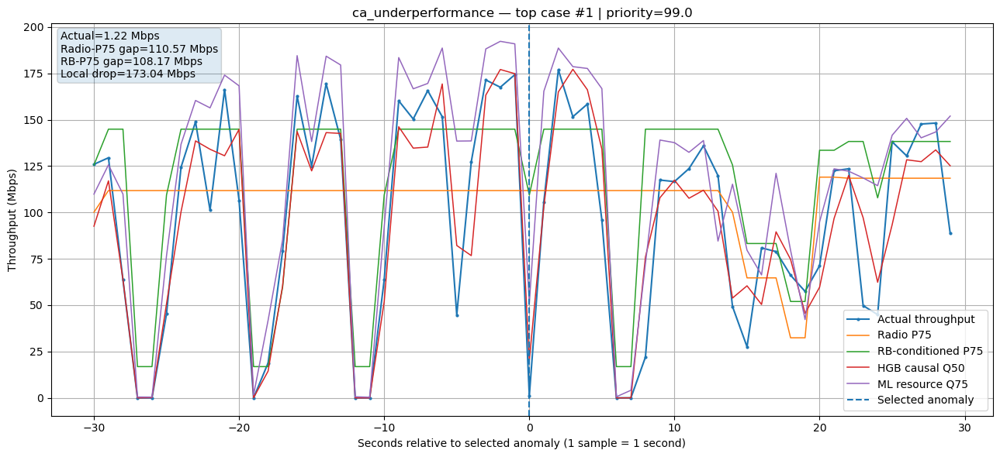

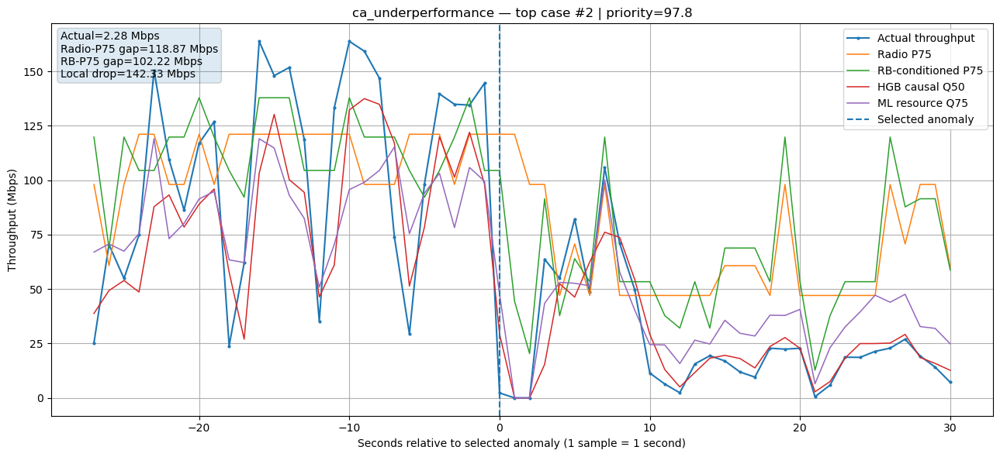

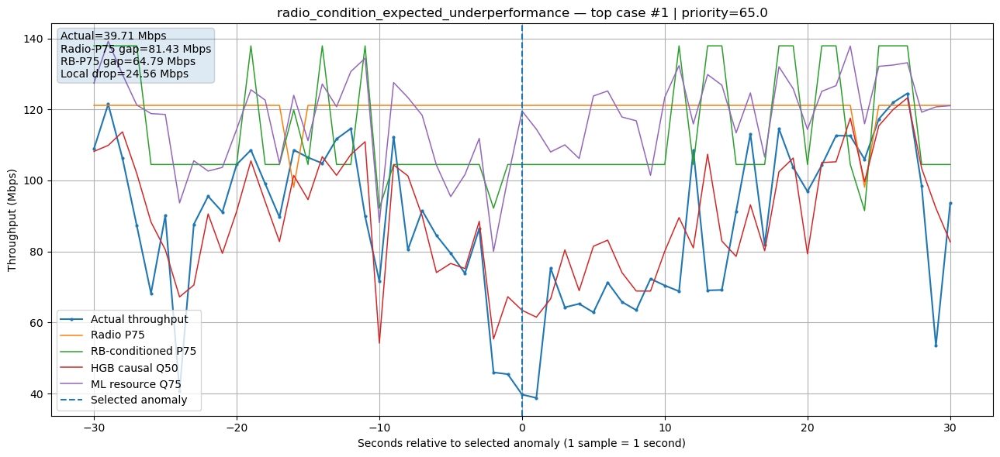

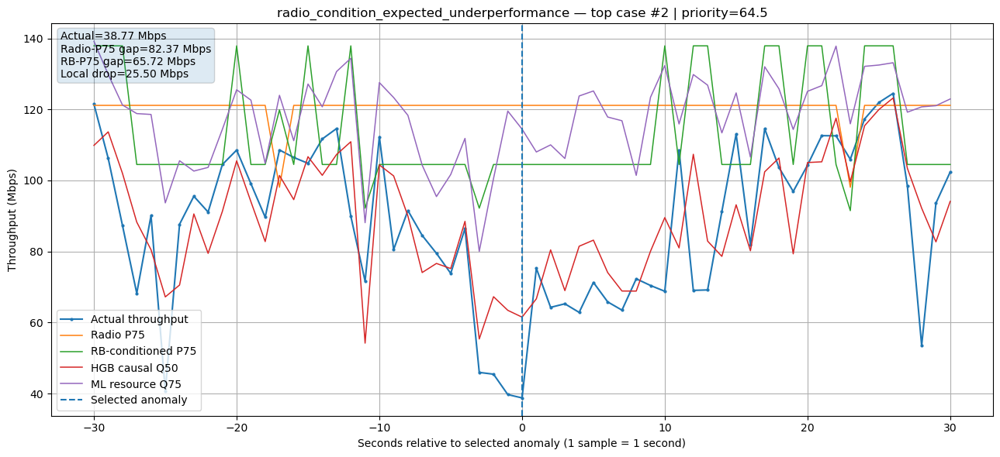

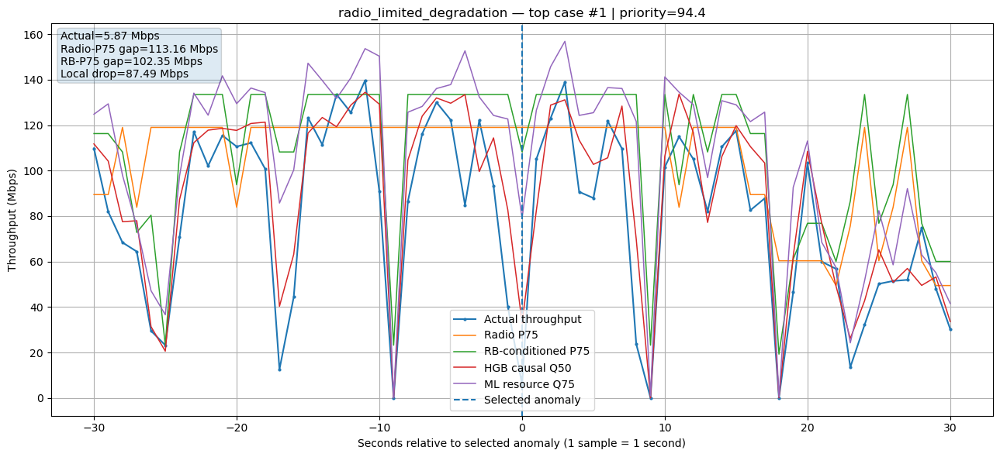

...

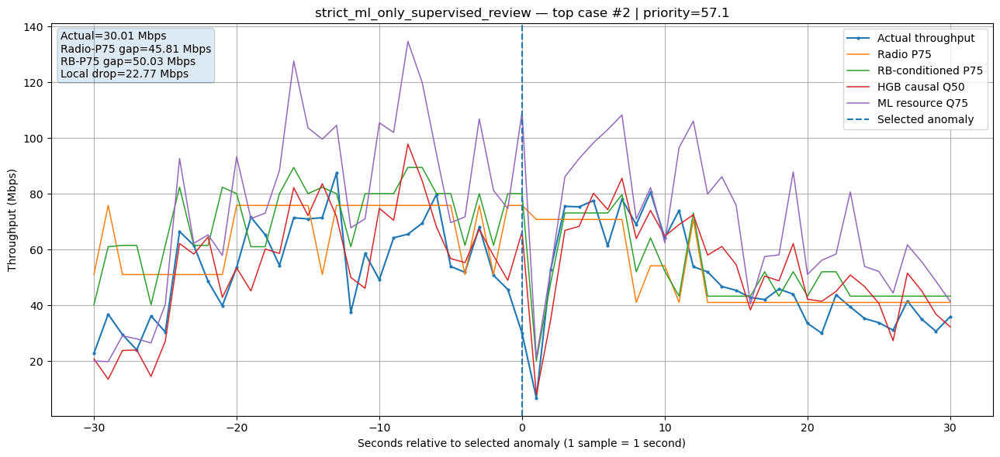

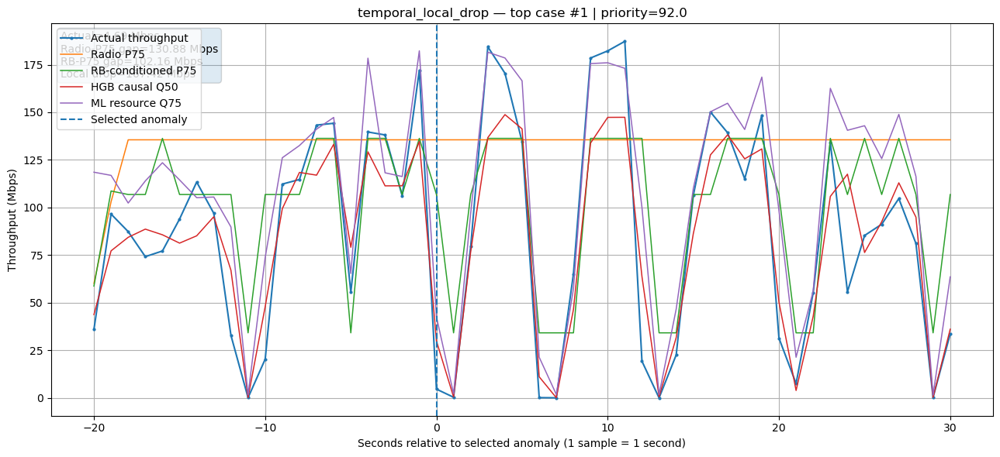

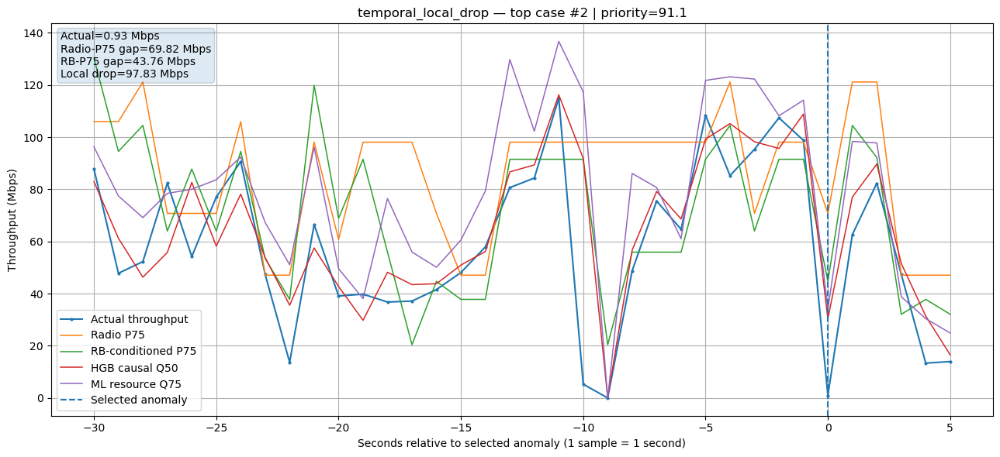

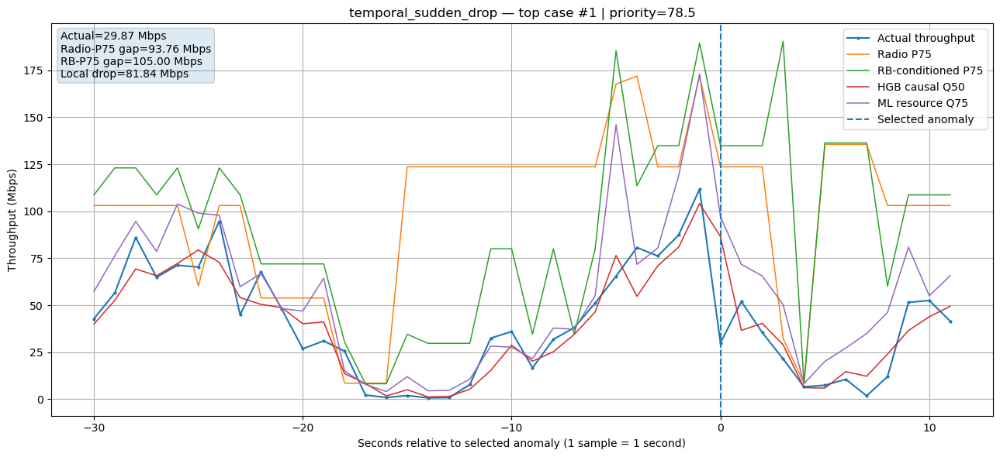

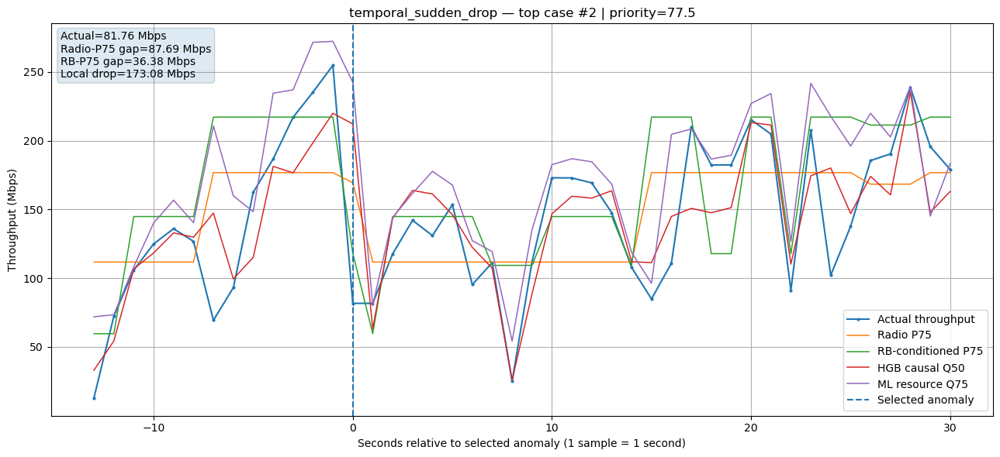

Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\top_anomaly_case_gap_drop_plot_index.csv  shape=(16, 9)
Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\FINAL_RCA_KEY_FILES_MANIFEST.csv  shape=(9, 2)
Compact RCA incidents: 1113 | Diverse shortlist: 15


,incident_id,detection_case,priority_score_0_100,severity,requires_human_review
0,INC-000358,ca_underperformance,98.96,Critical,False
1,INC-000366,radio_limited_degradation,94.38,Critical,False
2,INC-000923,temporal_local_drop,91.07,Critical,False
3,INC-000672,temporal_sudden_drop,78.50,High,False
4,INC-001084,rb_conditioned_expected_underperformance,78.03,High,False
5,INC-000320,radio_condition_expected_underperformance,65.01,High,False
6,INC-000829,ca_underperformance,97.83,High,False
7,INC-000544,radio_limited_degradation,92.78,High,False
8,INC-000361,temporal_local_drop,91.01,Critical,False
9,INC-000255,temporal_sudden_drop,77.52,High,False


In [22]:
# =========================
# 27B. Compact RCA handoff JSON, diverse shortlist, and top-case gap/drop plots
# =========================

# Map final row evidence to operational incident IDs.
if len(final_episode_rows) and 'operational' in globals() and len(operational):
    episode_to_incident = operational[["final_episode_id", "operational_incident_id"]].drop_duplicates()
    incident_rows = final_episode_rows.merge(episode_to_incident, on="final_episode_id", how="left")
else:
    incident_rows = pd.DataFrame()


def safe_mode(s, default=None):
    m = pd.Series(s).dropna().mode()
    return m.iloc[0] if len(m) else default


def any_bool(g, col):
    return bool(g[col].fillna(False).astype(bool).any()) if col in g.columns else False


def median_num(g, col):
    return float(pd.to_numeric(g[col], errors="coerce").median()) if col in g.columns and pd.to_numeric(g[col], errors="coerce").notna().any() else None


def max_num(g, col):
    return float(pd.to_numeric(g[col], errors="coerce").max()) if col in g.columns and pd.to_numeric(g[col], errors="coerce").notna().any() else None


def primary_detection_case(g):
    # Specific, RCA-useful case priority. These are detection/context labels, not final root causes.
    rules = [
        ("ca_underperformance_flag", "ca_underperformance"),
        ("radio_limited_degradation_flag", "radio_limited_degradation"),
        ("rolling_drop_flag", "temporal_local_drop"),
        ("sudden_drop_flag", "temporal_sudden_drop"),
        ("low_rb_efficiency_high_rb_flag", "rb_efficiency_underperformance"),
        ("underperform_vs_rb_p75_flag", "rb_conditioned_expected_underperformance"),
        ("underperform_vs_p75_flag", "radio_condition_expected_underperformance"),
        ("rolling_sustained_degradation_flag", "sustained_low_throughput"),
        ("low_tail_robust_consensus_flag", "robust_low_tail_consensus"),
    ]
    for col,label in rules:
        if any_bool(g,col): return label
    if any_bool(g,"fused_ml_only_flag"): return "strict_ml_only_underperformance"
    return safe_mode(g.get("anomaly_type", pd.Series(dtype=object)), "other_throughput_anomaly")

# Lookup tables let each incident carry the serving cell/PCI performance rank without
# duplicating the full ranking table inside the JSON.
cell_rank_lookup = {}
if 'cell_rank' in globals() and isinstance(cell_rank, pd.DataFrame) and not cell_rank.empty:
    cell_rank_lookup = cell_rank.set_index("serving_cell_key")[[c for c in ["bad_entity_rank","bad_entity_score_0_100","median_tp_mbps","p10_tp_mbps","median_cqi","median_mcs","median_bler_pct"] if c in cell_rank.columns]].to_dict("index")
pci_rank_lookup = {}
if 'pci_rank' in globals() and isinstance(pci_rank, pd.DataFrame) and not pci_rank.empty:
    pci_rank_lookup = pci_rank.set_index("serving_pci")[[c for c in ["bad_entity_rank","bad_entity_score_0_100"] if c in pci_rank.columns]].to_dict("index")

incident_records = []
if not incident_rows.empty:
    for incident_id, g in incident_rows.groupby("operational_incident_id", dropna=False):
        g = g.sort_values("timestamp") if "timestamp" in g.columns else g
        expected_candidates = [c for c in ["fused_best_expected_tp","expected_tp_radio_p75","expected_tp_rb_conditioned_p75","expected_tp_ml_hgb_resource_q50","expected_tp_ml_q75_resource","expected_tp_ml_hgb_temporal_q50"] if c in g.columns]
        expected_median = float(g[expected_candidates].median(axis=1, skipna=True).median()) if expected_candidates else None
        actual_median = median_num(g, TARGET_COL)
        local_drop = max(v for v in [max_num(g,"rolling_tp_gap"), max_num(g,"tp_drop_from_prev")] if v is not None) if any(v is not None for v in [max_num(g,"rolling_tp_gap"), max_num(g,"tp_drop_from_prev")]) else None
        cell_key_value = safe_mode(g.get("serving_cell_key", pd.Series(dtype=object)))
        pci_value = safe_mode(g.get("serving_pci", pd.Series(dtype=object)))
        cell_perf = cell_rank_lookup.get(cell_key_value, {})
        pci_perf = pci_rank_lookup.get(pci_value, {})
        rec = {
            "incident_id": str(incident_id),
            "session_id": str(safe_mode(g.get("id", pd.Series(dtype=object)), "")),
            "start_time": str(g["timestamp"].min()) if "timestamp" in g.columns else None,
            "end_time": str(g["timestamp"].max()) if "timestamp" in g.columns else None,
            "duration_seconds": float((pd.to_datetime(g["timestamp"], utc=True).max() - pd.to_datetime(g["timestamp"], utc=True).min()).total_seconds()) if "timestamp" in g.columns else None,
            "rows": int(len(g)),
            "serving_cell_key": cell_key_value,
            "serving_pci": pci_value,
            "serving_eci": safe_mode(g.get("serving_eci", pd.Series(dtype=object))),
            "serving_earfcn": safe_mode(g.get("serving_earfcn", pd.Series(dtype=object))),
            "serving_band": safe_mode(g.get("serving_band", pd.Series(dtype=object))),
            "latitude": median_num(g,"latitude"), "longitude": median_num(g,"longitude"),
            "detection_case": primary_detection_case(g),
            "fusion_source": safe_mode(g.get("fusion_source", pd.Series(dtype=object)), "unknown"),
            "priority_score_0_100": max_num(g,"final_rca_priority_score_0_100"),
            "impact_score_0_100": max_num(g,"fused_impact_score_0_100"),
            "detection_confidence_0_100": max_num(g,"fused_detection_confidence_0_100"),
            "severity": safe_mode(g.get("final_priority_severity", pd.Series(dtype=object)), "Unknown"),
            "requires_human_review": any_bool(g,"requires_human_review_flag"),
            "human_review_reason": "strict_ml_only_anomaly_requires_supervised_verification" if any_bool(g,"requires_human_review_flag") else None,
            "throughput": {
                "actual_median_mbps": actual_median,
                "actual_min_mbps": float(pd.to_numeric(g[TARGET_COL], errors="coerce").min()),
                "expected_median_mbps": expected_median,
                "expected_gap_median_mbps": (expected_median - actual_median) if expected_median is not None and actual_median is not None else None,
                "max_local_drop_mbps": local_drop,
                "radio_p75_gap_median_mbps": median_num(g,"throughput_gap_p75"),
                "rb_p75_gap_median_mbps": median_num(g,"throughput_gap_rb_p75"),
            },
            "cell_performance_context": {
                "cell_bad_rank": cell_perf.get("bad_entity_rank"), "cell_badness_score_0_100": cell_perf.get("bad_entity_score_0_100"),
                "cell_median_tp_mbps": cell_perf.get("median_tp_mbps"), "cell_p10_tp_mbps": cell_perf.get("p10_tp_mbps"),
                "cell_median_cqi": cell_perf.get("median_cqi"), "cell_median_mcs": cell_perf.get("median_mcs"),
                "cell_median_bler_pct": cell_perf.get("median_bler_pct"),
                "pci_bad_rank_secondary_view": pci_perf.get("bad_entity_rank"), "pci_badness_score_0_100": pci_perf.get("bad_entity_score_0_100"),
            },
            "radio_kpis": {
                "rsrp_median_dbm": median_num(g,"lte_rsrp"), "rsrq_median_db": median_num(g,"lte_rsrq"),
                "sinr_median_db": median_num(g,"lte_sinr"), "cqi_median": median_num(g,"lte_cqi"),
                "mcs_median": median_num(g,"lte_mcs"), "bler_median_pct": median_num(g,"lte_bler"),
            },
            "resource_kpis": {
                "rb_usage_median": median_num(g,"rb_usage_value"), "throughput_per_rb_median": median_num(g,"throughput_per_rb"),
                "rb_medium_or_high_usage": any_bool(g,"rb_medium_or_high_usage_flag"),
            },
            "ca_context": {
                "ca_active": any_bool(g,"ca_active_flag"), "carrier_count_median": median_num(g,"carrier_count"),
                "scell1_rsrp_median_dbm": median_num(g,"scell1_rsrp"), "scell1_sinr_median_db": median_num(g,"scell1_sinr"),
                "scell1_cqi_median": median_num(g,"scell1_cqi"), "scell1_mcs_median": median_num(g,"scell1_mcs"),
                "scell1_bler_median_pct": median_num(g,"scell1_bler"),
            },
            "statistical_evidence": {
                "global_p10": any_bool(g,"low_tp_global_p10_flag"), "session_p10": any_bool(g,"low_tp_session_p10_flag"),
                "iqr_lower_fence": any_bool(g,"low_tp_iqr_flag"), "robust_mad": any_bool(g,"low_tp_robust_z_flag"),
                "low_tail_consensus": any_bool(g,"low_tail_robust_consensus_flag"),
                "temporal_drop": any_bool(g,"temporal_drop_family_flag"), "expected_underperformance": any_bool(g,"expected_tp_family_flag"),
                "rb_efficiency": any_bool(g,"rb_efficiency_family_flag"), "sustained_window": any_bool(g,"sustained_window_family_flag"),
            },
            "production_ml_evidence": {
                "ml_final_anomaly": any_bool(g,"is_ml_throughput_anomaly"),
                "resource_family": any_bool(g,"ml_resource_family_flag"),
                "temporal_causal_family": any_bool(g,"ml_temporal_family_flag"),
                "ml_confidence_0_100": max_num(g,"ml_detection_confidence_0_100"),
                "hgb_resource_q50_expected_median_mbps": median_num(g,"expected_tp_ml_hgb_resource_q50"),
                "hgb_causal_temporal_q50_expected_median_mbps": median_num(g,"expected_tp_ml_hgb_temporal_q50"),
                "resource_q75_expected_median_mbps": median_num(g,"expected_tp_ml_q75_resource"),
            },
            # Deliberately excludes LSTM and IsolationForest fields from RCA JSON.
        }
        incident_records.append(rec)

rca_incidents_full = pd.DataFrame([{
    "incident_id": r["incident_id"], "session_id": r["session_id"], "start_time": r["start_time"], "end_time": r["end_time"],
    "serving_cell_key": r["serving_cell_key"], "serving_pci": r["serving_pci"], "detection_case": r["detection_case"],
    "priority_score_0_100": r["priority_score_0_100"], "impact_score_0_100": r["impact_score_0_100"],
    "detection_confidence_0_100": r["detection_confidence_0_100"], "severity": r["severity"],
    "requires_human_review": r["requires_human_review"],
} for r in incident_records])

# Diverse shortlist: quota by case first, then fill by priority while avoiding duplicate session+cell+case.
selected_ids = []
if not rca_incidents_full.empty:
    ranked_inc = rca_incidents_full.sort_values("priority_score_0_100", ascending=False).copy()
    for case, cg in ranked_inc.groupby("detection_case", sort=False):
        selected_ids.extend(cg.head(RCA_SHORTLIST_PER_CASE_QUOTA)["incident_id"].tolist())
    selected_ids = list(dict.fromkeys(selected_ids))
    if len(selected_ids) < RCA_SHORTLIST_TARGET_INCIDENTS:
        for _, row in ranked_inc.iterrows():
            if row["incident_id"] not in selected_ids:
                selected_ids.append(row["incident_id"])
            if len(selected_ids) >= RCA_SHORTLIST_TARGET_INCIDENTS:
                break
    # If quotas produced too many, keep diversity by round-robin case rank.
    if len(selected_ids) > RCA_SHORTLIST_TARGET_INCIDENTS:
        shortlist = ranked_inc[ranked_inc["incident_id"].isin(selected_ids)].copy()
        shortlist["case_rank"] = shortlist.groupby("detection_case")["priority_score_0_100"].rank(method="first", ascending=False)
        shortlist = shortlist.sort_values(["case_rank","priority_score_0_100"], ascending=[True,False]).head(RCA_SHORTLIST_TARGET_INCIDENTS)
        selected_ids = shortlist["incident_id"].tolist()

record_by_id = {r["incident_id"]: r for r in incident_records}
shortlist_records = [record_by_id[x] for x in selected_ids if x in record_by_id]

with open(RCA_HANDOFF_DIR / "rca_anomaly_incidents_full_compact.json", "w", encoding="utf-8") as f:
    json.dump(incident_records, f, ensure_ascii=False, indent=2, default=str)
with open(RCA_HANDOFF_DIR / "rca_anomaly_incidents_shortlist_diverse.json", "w", encoding="utf-8") as f:
    json.dump(shortlist_records, f, ensure_ascii=False, indent=2, default=str)

if not rca_incidents_full.empty:
    save_table(rca_incidents_full, "rca_anomaly_incidents_full_compact.csv", category="rca")
    save_table(rca_incidents_full[rca_incidents_full["incident_id"].isin(selected_ids)].sort_values("priority_score_0_100", ascending=False), "rca_anomaly_incidents_shortlist_diverse.csv", category="rca")

# Handoff schema dictionary: compact and explicit.
rca_schema = pd.DataFrame([
    ("incident_id", "Identity", "Operational incident identifier"),
    ("session_id/start_time/end_time/duration_seconds", "Identity", "When the anomaly occurred"),
    ("serving_cell_key/PCI/ECI/EARFCN/band", "Cell", "Serving cell identity for RCA"),
    ("detection_case", "Detection", "Primary anomaly/context case; not a final root cause"),
    ("priority/impact/confidence/severity", "Ranking", "Why RCA should review this incident first"),
    ("requires_human_review", "Governance", "True for strict ML-only anomalies"),
    ("throughput.*", "Impact", "Actual, expected, gap, and local drop evidence"),
    ("cell_performance_context.*", "Cell ranking", "Cell/PCI badness ranks and compact cell-level KPI context"),
    ("radio_kpis.*", "Radio evidence", "RSRP/RSRQ/SINR/CQI/MCS/BLER"),
    ("resource_kpis.*", "Resource evidence", "RB demand and throughput efficiency"),
    ("ca_context.*", "CA evidence", "Carrier aggregation and SCell context"),
    ("statistical_evidence.*", "Detector evidence", "P10/IQR/MAD/temporal/P75/RB-efficiency evidence"),
    ("production_ml_evidence.*", "ML evidence", "Only selected production HGB/Q75 evidence; LSTM and IsolationForest excluded"),
], columns=["json_field", "section", "meaning"])
save_table(rca_schema, "rca_json_schema_dictionary.csv", category="rca")

# -------------------------
# Top anomaly-case plots with explicit gap/drop annotation
# -------------------------
def plot_case_context(row, case_name, rank):
    if "timestamp" not in fused.columns or "id" not in fused.columns:
        return
    sid = row.get("id")
    ts0 = pd.to_datetime(row.get("timestamp"), utc=True, errors="coerce")
    if pd.isna(ts0): return
    ctx = fused[fused["id"].astype(str).eq(str(sid))].copy()
    ctx["_ts"] = pd.to_datetime(ctx["timestamp"], utc=True, errors="coerce")
    ctx = ctx[(ctx["_ts"] >= ts0 - pd.Timedelta(seconds=TOP_CASE_CONTEXT_SECONDS)) & (ctx["_ts"] <= ts0 + pd.Timedelta(seconds=TOP_CASE_CONTEXT_SECONDS))].sort_values("_ts")
    if ctx.empty: return
    x = (ctx["_ts"] - ts0).dt.total_seconds()
    plt.figure(figsize=(13,6))
    plt.plot(x, ctx[TARGET_COL], marker="o", markersize=2, linewidth=1.5, label="Actual throughput")
    for col,label in [
        ("expected_tp_radio_p75","Radio P75"), ("expected_tp_rb_conditioned_p75","RB-conditioned P75"),
        ("expected_tp_ml_hgb_temporal_q50","HGB causal Q50"), ("expected_tp_ml_q75_resource","ML resource Q75"),
    ]:
        if col in ctx.columns and pd.to_numeric(ctx[col], errors="coerce").notna().any():
            plt.plot(x, pd.to_numeric(ctx[col], errors="coerce"), linewidth=1.1, label=label)
    plt.axvline(0, linestyle="--", label="Selected anomaly")
    actual = row.get(TARGET_COL, np.nan)
    p75_gap = row.get("throughput_gap_p75", np.nan)
    rb_gap = row.get("throughput_gap_rb_p75", np.nan)
    local_drop = np.nanmax([row.get("rolling_tp_gap", np.nan), row.get("tp_drop_from_prev", np.nan)])
    txt = f"Actual={actual:.2f} Mbps\nRadio-P75 gap={p75_gap:.2f} Mbps\nRB-P75 gap={rb_gap:.2f} Mbps\nLocal drop={local_drop:.2f} Mbps"
    plt.text(0.01, 0.98, txt, transform=plt.gca().transAxes, va="top", bbox=dict(boxstyle="round", alpha=0.15))
    plt.xlabel("Seconds relative to selected anomaly (1 sample = 1 second)")
    plt.ylabel("Throughput (Mbps)")
    plt.title(f"{case_name} — top case #{rank} | priority={row.get('final_rca_priority_score_0_100', np.nan):.1f}")
    plt.legend(loc="best")
    safe_case = re.sub(r"[^A-Za-z0-9_]+", "_", str(case_name))[:80]
    path = RCA_CASE_PLOTS_DIR / f"{safe_case}_top_{rank:02d}.png"
    plt.tight_layout(); plt.savefig(path, dpi=150, bbox_inches="tight"); plt.show()

def row_primary_detection_case(row):
    row_rules = [
        ("ca_underperformance_flag", "ca_underperformance"),
        ("radio_limited_degradation_flag", "radio_limited_degradation"),
        ("rolling_drop_flag", "temporal_local_drop"),
        ("sudden_drop_flag", "temporal_sudden_drop"),
        ("low_rb_efficiency_high_rb_flag", "rb_efficiency_underperformance"),
        ("underperform_vs_rb_p75_flag", "rb_conditioned_expected_underperformance"),
        ("underperform_vs_p75_flag", "radio_condition_expected_underperformance"),
        ("rolling_sustained_degradation_flag", "sustained_low_throughput"),
        ("low_tail_robust_consensus_flag", "robust_low_tail_consensus"),
    ]
    if bool(row.get("fused_ml_only_flag", False)):
        return "strict_ml_only_supervised_review"
    for col,label in row_rules:
        if bool(row.get(col, False)):
            return label
    return "other_throughput_anomaly"

if len(fused_handoff_rows):
    plot_rows = fused_handoff_rows.copy()
    plot_rows["final_detection_case"] = plot_rows.apply(row_primary_detection_case, axis=1)
    gap_plot_summary = []
    for case_name, cg in plot_rows.groupby("final_detection_case", dropna=False):
        cg = cg.sort_values("final_rca_priority_score_0_100", ascending=False).head(TOP_PLOTS_PER_ANOMALY_CASE)
        for rank,(_,row) in enumerate(cg.iterrows(), start=1):
            plot_case_context(row, case_name, rank)
            gap_plot_summary.append({
                "case": case_name, "rank_in_case": rank, "source_index": row.get("source_index"),
                "priority": row.get("final_rca_priority_score_0_100"), "actual_tp": row.get(TARGET_COL),
                "radio_p75_gap": row.get("throughput_gap_p75"), "rb_p75_gap": row.get("throughput_gap_rb_p75"),
                "rolling_drop_gap": row.get("rolling_tp_gap"), "previous_sample_drop_gap": row.get("tp_drop_from_prev"),
            })
    gap_plot_summary = pd.DataFrame(gap_plot_summary)
    save_table(gap_plot_summary, "top_anomaly_case_gap_drop_plot_index.csv", category="rca")

# Copy the most important machine-readable review tables into one obvious key-files folder.
key_manifest = pd.DataFrame([
    ("rca_anomaly_incidents_shortlist_diverse.json", "Primary diverse incident shortlist for RCA/demo"),
    ("rca_anomaly_incidents_full_compact.json", "All compact RCA-ready incidents"),
    ("worst_performing_cells_rca_handoff.json", "Worst cells ranked using throughput + CQI/MCS/BLER + anomaly evidence"),
    ("worst_performing_pci_rca_handoff.json", "PCI-only ranking; interpret with PCI reuse caution"),
    ("statistical_threshold_calibration_report.csv", "Data-driven threshold validation"),
    ("fusion_component_empirical_validation.csv", "Checks whether fusion components/bonuses are proportionate"),
    ("fusion_weight_health_check.csv", "Flags if evidence bonuses dominate main anomaly evidence"),
    ("ml_final_model_selection_summary.csv", "Why final predictive models are kept vs validation-only"),
    ("rca_json_schema_dictionary.csv", "Compact JSON field dictionary"),
], columns=["file", "purpose"])
save_table(key_manifest, "FINAL_RCA_KEY_FILES_MANIFEST.csv", category="key")

rca_readme = """RCA HANDOFF — START HERE

1. rca_anomaly_incidents_shortlist_diverse.json
   Primary presentation/review set: diverse high-priority incidents across anomaly cases.
2. rca_anomaly_incidents_full_compact.json
   Full compact RCA-ready incident handoff. Strict ML-only incidents are marked requires_human_review=true.
3. worst_performing_cells_rca_handoff.json
   Serving-cell ranking using throughput, anomaly/gap evidence, CQI, MCS, BLER, SINR, RSRQ and RSRP.
4. worst_performing_pci_rca_handoff.json
   Secondary PCI-only view. PCI reuse means this is not as reliable as ECI/EARFCN+PCI cell identity.
5. 01_top_anomaly_case_plots/
   Top examples per standardized anomaly case with actual throughput, expected references and explicit gap/drop annotation.

LSTM-Q50 and Isolation Forest are model-selection/context validators only and are deliberately excluded from the compact RCA JSON.
"""
(RCA_KEY_FILES_DIR / "README_FIRST_RCA_HANDOFF.txt").write_text(rca_readme, encoding="utf-8")

print("Compact RCA incidents:", len(incident_records), "| Diverse shortlist:", len(shortlist_records))
display(pd.DataFrame(shortlist_records)[[c for c in ["incident_id","detection_case","priority_score_0_100","severity","requires_human_review"] if c in pd.DataFrame(shortlist_records).columns]].head(30) if shortlist_records else pd.DataFrame())


Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\50_final_fused_row_priority_distribution.png


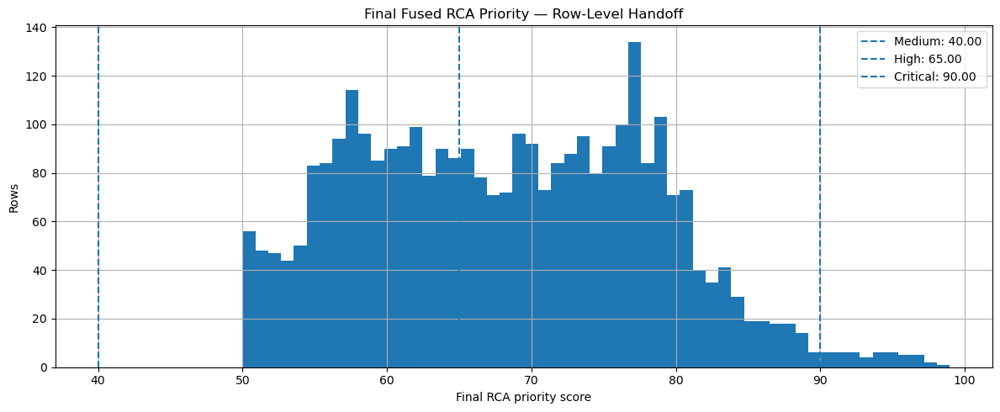

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\51_statistical_vs_ml_score_fusion.png


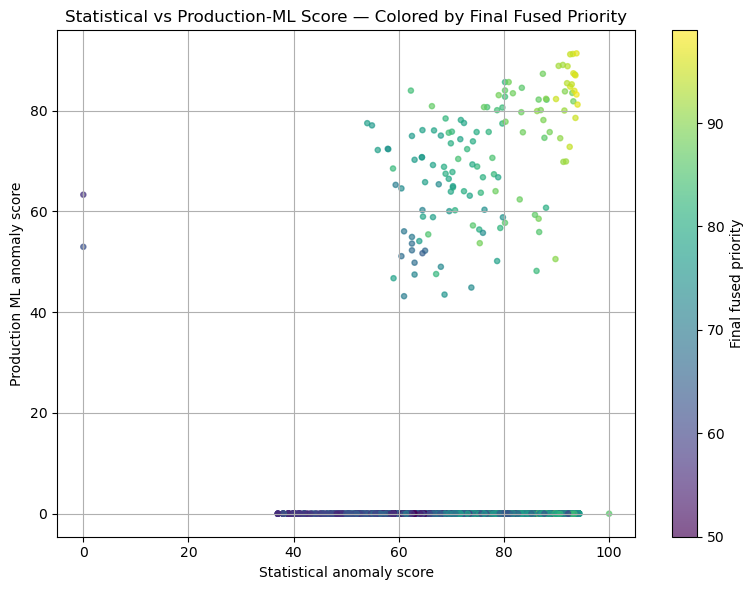

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\52_fusion_method_ecdf_comparison.png


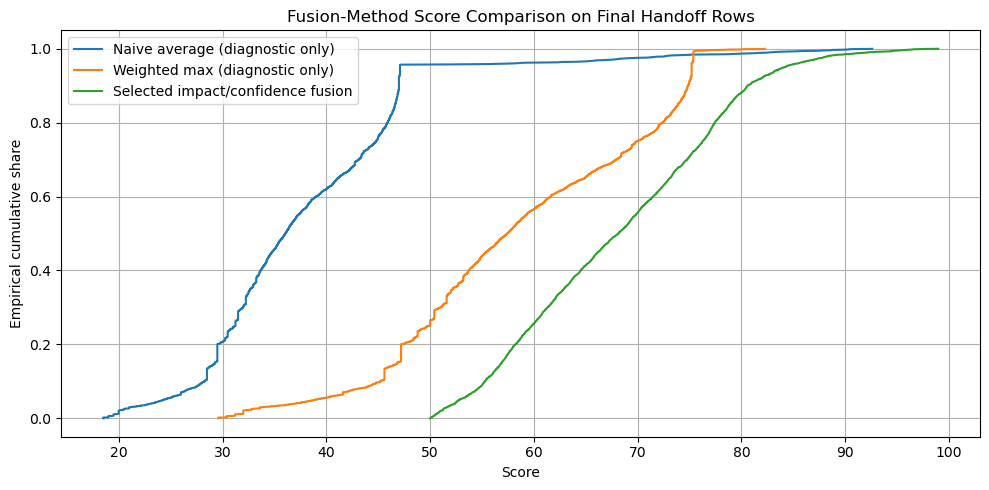

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\52_final_handoff_by_fusion_source.png


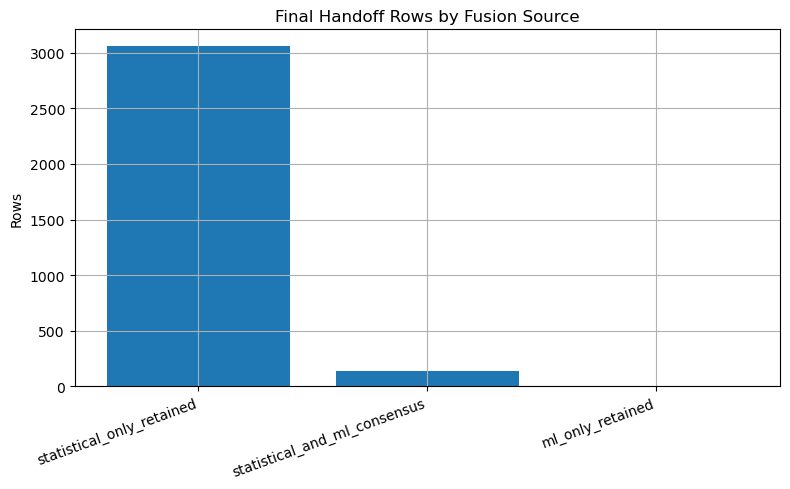

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\53_route_final_fused_anomaly_overlay.png


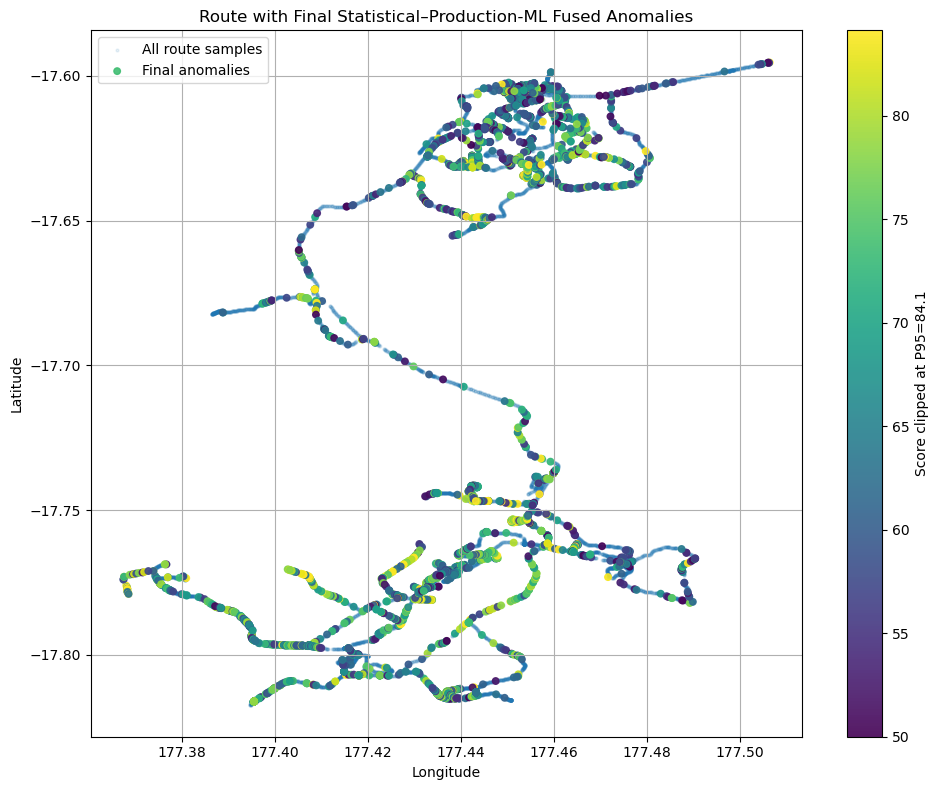

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\54_final_episode_priority_distribution.png


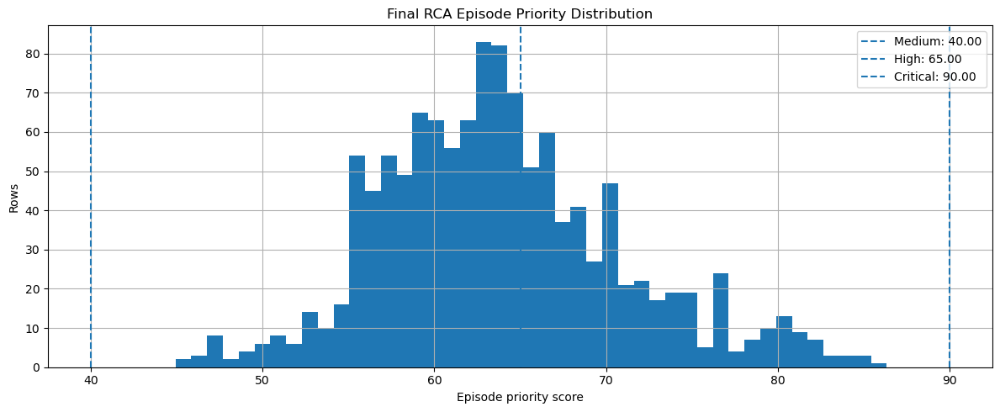

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\55_episode_duration_vs_priority.png


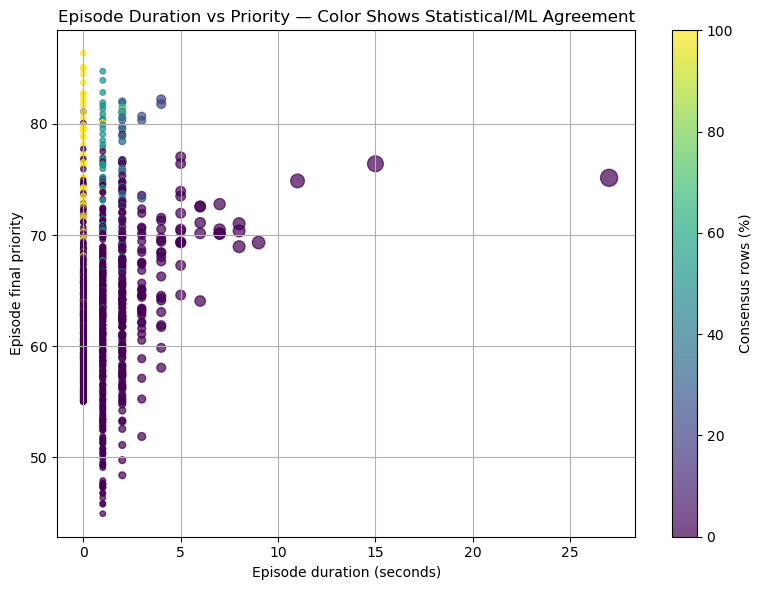

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\56_final_detection_funnel.png


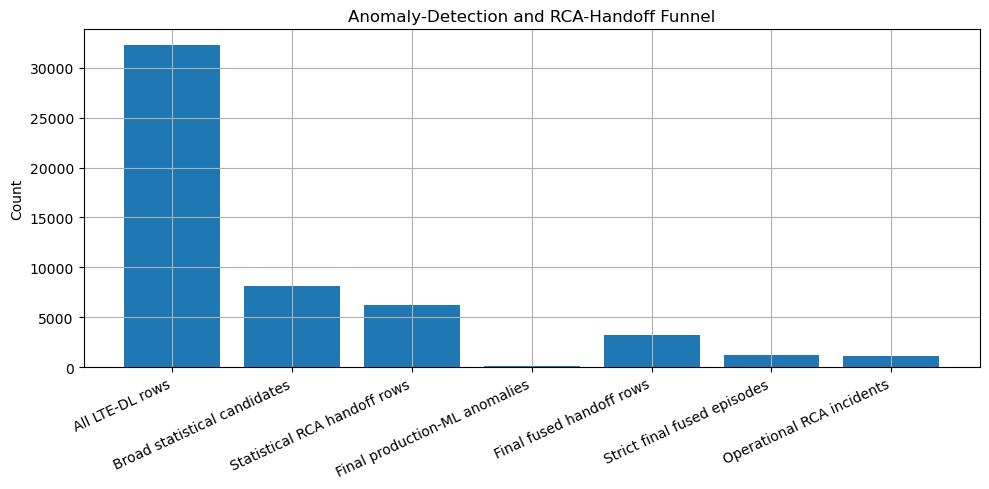

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_01.png


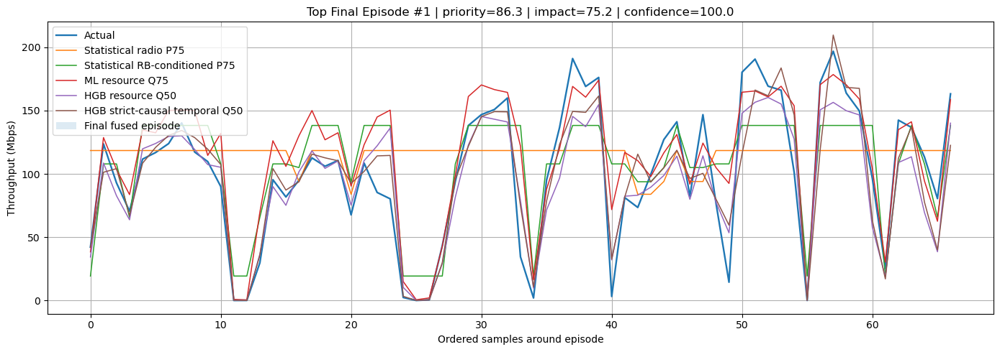

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_02.png


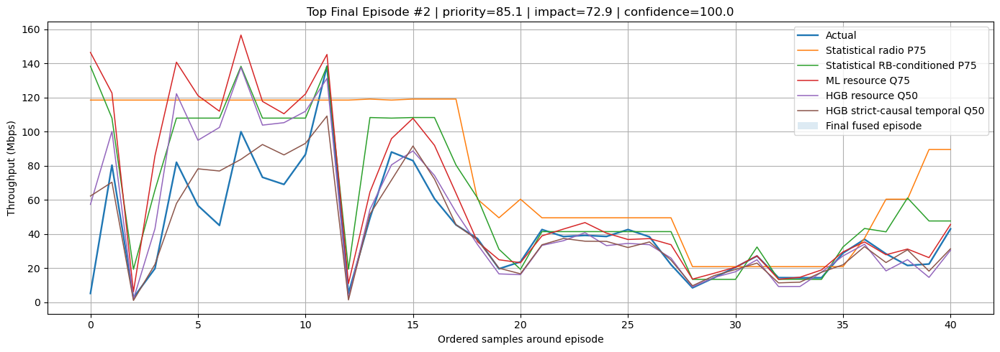

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_03.png


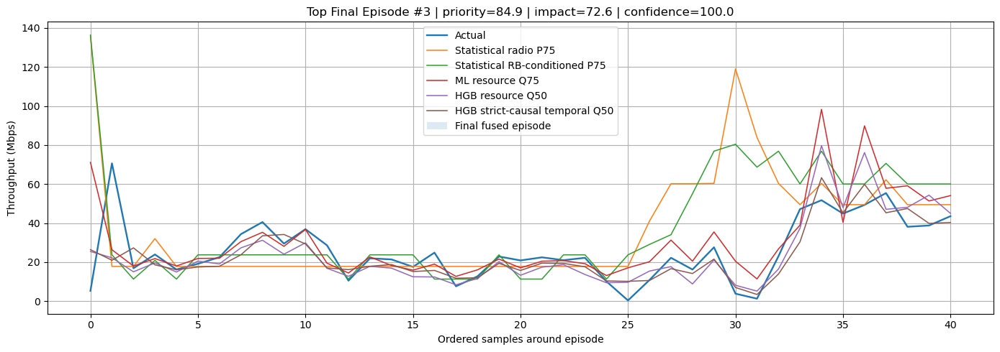

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_04.png


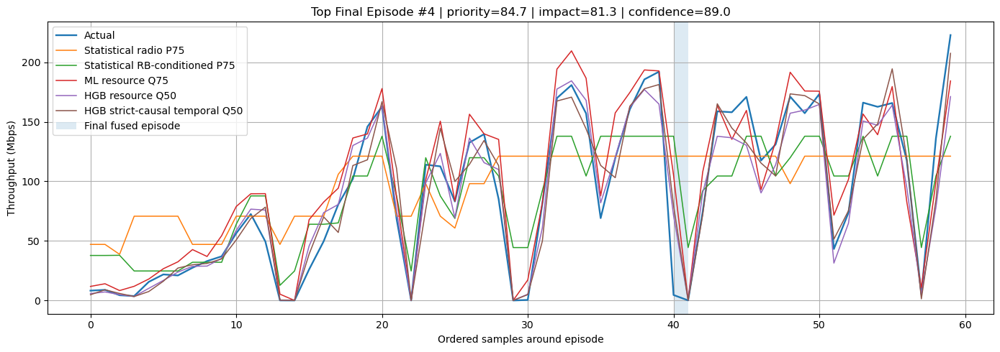

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_05.png


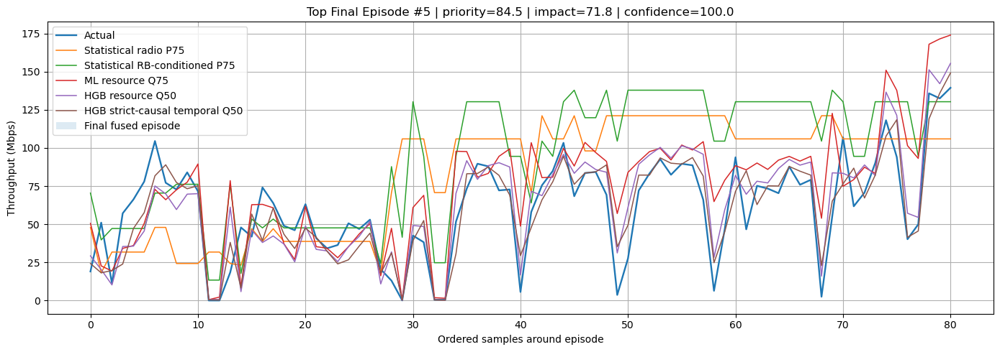

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_06.png


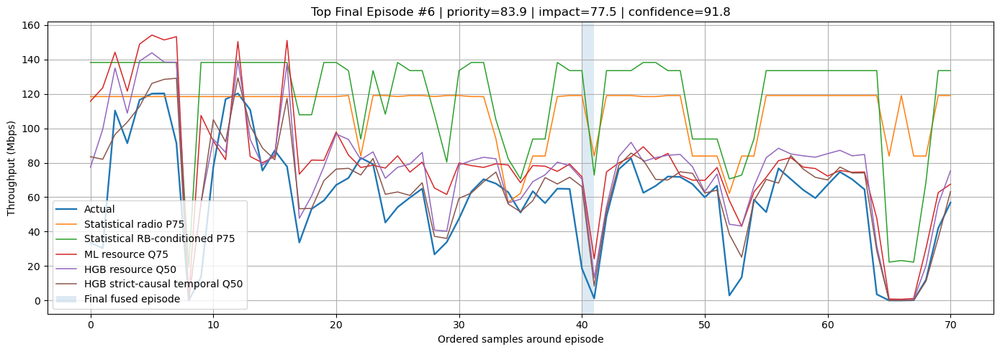

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_07.png


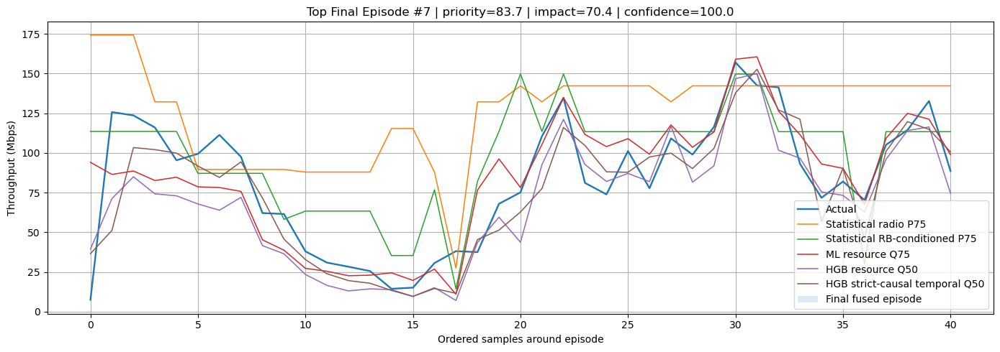

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\57_top_fused_episode_context_08.png


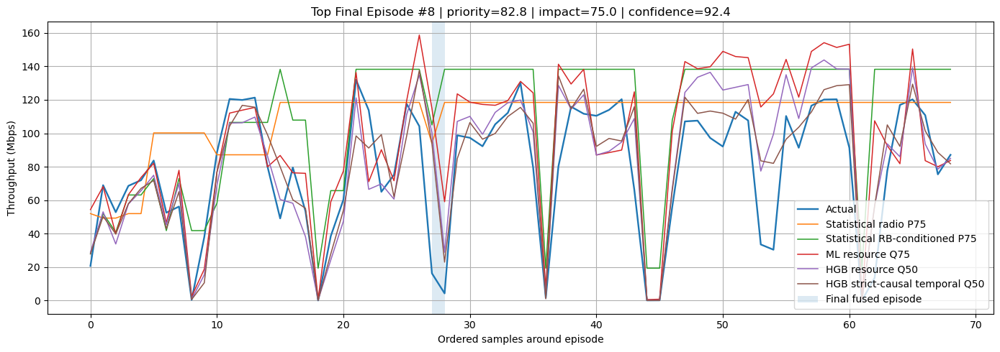

Saved plot: Throughput_Anomaly_Detection_Outputs\03_plots\58_operational_incident_priority_distribution.png


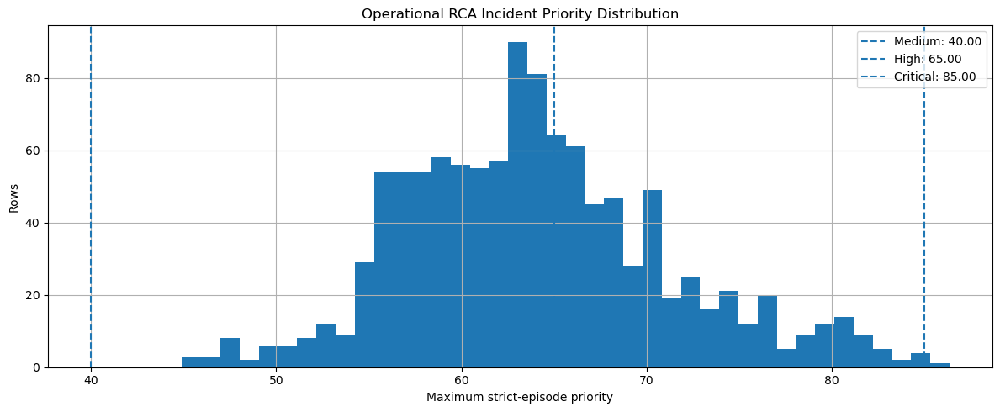

In [23]:

# =========================
# 28. Fusion and episode visual validation
# =========================

if len(fused_handoff_rows):
    plot_distribution_with_lines(
        fused_handoff_rows,
        "final_rca_priority_score_0_100",
        "Final Fused RCA Priority — Row-Level Handoff",
        "Final RCA priority score",
        {"Medium": FUSION_MEDIUM, "High": FUSION_HIGH, "Critical": FUSION_CRITICAL},
        bins=55,
        clip_upper_q=None,
        filename="50_final_fused_row_priority_distribution.png",
    )

    plt.figure(figsize=(8, 6))
    plt.scatter(
        fused_handoff_rows.get("anomaly_score_0_100", 0),
        fused_handoff_rows.get("ml_anomaly_score_0_100", 0),
        c=fused_handoff_rows["final_rca_priority_score_0_100"],
        s=14,
        alpha=0.65,
    )
    plt.xlabel("Statistical anomaly score")
    plt.ylabel("Production ML anomaly score")
    plt.title("Statistical vs Production-ML Score — Colored by Final Fused Priority")
    plt.colorbar(label="Final fused priority")
    save_current_plot("51_statistical_vs_ml_score_fusion.png")
    plt.show()

    # Compare score fusion alternatives on the same final handoff population.
    plt.figure(figsize=(10, 5))
    for col, label in [
        ("fusion_naive_average_score_0_100", "Naive average (diagnostic only)"),
        ("fusion_weighted_max_score_0_100", "Weighted max (diagnostic only)"),
        ("fusion_selected_impact_confidence_score_0_100", "Selected impact/confidence fusion"),
    ]:
        values = fused_handoff_rows[col].dropna().sort_values().to_numpy()
        if len(values):
            y = np.linspace(0, 1, len(values), endpoint=True)
            plt.plot(values, y, label=label)
    plt.xlabel("Score")
    plt.ylabel("Empirical cumulative share")
    plt.title("Fusion-Method Score Comparison on Final Handoff Rows")
    plt.legend()
    save_current_plot("52_fusion_method_ecdf_comparison.png")
    plt.show()

    source_counts = fused_handoff_rows["fusion_source"].value_counts()
    plt.figure(figsize=(8, 5))
    plt.bar(source_counts.index.astype(str), source_counts.values)
    plt.ylabel("Rows")
    plt.title("Final Handoff Rows by Fusion Source")
    plt.xticks(rotation=20, ha="right")
    save_current_plot("52_final_handoff_by_fusion_source.png")
    plt.show()

    plot_route_final_overlay(
        fused,
        "final_rca_priority_score_0_100",
        "final_rca_handoff_flag",
        "Route with Final Statistical–Production-ML Fused Anomalies",
        "53_route_final_fused_anomaly_overlay.png",
    )

if len(final_episode_summary):
    plot_distribution_with_lines(
        final_episode_summary,
        "episode_final_priority_0_100",
        "Final RCA Episode Priority Distribution",
        "Episode priority score",
        {"Medium": FUSION_MEDIUM, "High": FUSION_HIGH, "Critical": FUSION_CRITICAL},
        bins=45,
        clip_upper_q=None,
        filename="54_final_episode_priority_distribution.png",
    )

    plt.figure(figsize=(8, 6))
    plt.scatter(
        final_episode_summary["duration_seconds"],
        final_episode_summary["episode_final_priority_0_100"],
        c=final_episode_summary["agreement_pct"],
        s=np.clip(final_episode_summary["rows"] * 8, 15, 150),
        alpha=0.70,
    )
    plt.xlabel("Episode duration (seconds)")
    plt.ylabel("Episode final priority")
    plt.title("Episode Duration vs Priority — Color Shows Statistical/ML Agreement")
    plt.colorbar(label="Consensus rows (%)")
    save_current_plot("55_episode_duration_vs_priority.png")
    plt.show()

    # Funnel from broad statistical candidates to final incidents.
    funnel_labels = [
        "All LTE-DL rows",
        "Broad statistical candidates",
        "Statistical RCA handoff rows",
        "Final production-ML anomalies",
        "Final fused handoff rows",
        "Strict final fused episodes",
        "Operational RCA incidents",
    ]
    funnel_values = [
        len(fused),
        int(bool_col(fused, "is_throughput_anomaly").sum()),
        int(stat_handoff.sum()),
        int(ml_final.sum()),
        len(fused_handoff_rows),
        len(final_episode_summary),
        len(operational_incident_summary),
    ]
    plt.figure(figsize=(10, 5))
    plt.bar(funnel_labels, funnel_values)
    plt.ylabel("Count")
    plt.title("Anomaly-Detection and RCA-Handoff Funnel")
    plt.xticks(rotation=25, ha="right")
    save_current_plot("56_final_detection_funnel.png")
    plt.show()


def plot_top_fused_episode(rank: int, filename: str, context_rows: int = 40) -> None:
    if final_episode_summary.empty or rank >= len(final_episode_summary):
        return
    ep = final_episode_summary.iloc[rank]
    ep_rows = final_episode_rows[final_episode_rows["final_episode_id"].eq(ep["final_episode_id"])].sort_values(TIME_COL)
    session = fused[fused[GROUP_COL].eq(ep[GROUP_COL])].sort_values(TIME_COL).copy()
    if session.empty or ep_rows.empty:
        return
    first_idx = ep_rows.index.min()
    session_positions = np.where(session.index.to_numpy() == first_idx)[0]
    center = int(session_positions[0]) if len(session_positions) else len(session) // 2
    win = session.iloc[max(0, center-context_rows):min(len(session), center+len(ep_rows)+context_rows)]
    x = np.arange(len(win))
    plt.figure(figsize=(14, 5))
    plt.plot(x, win[TARGET_COL], linewidth=1.7, label="Actual")
    for col, label in [
        ("expected_tp_radio_p75", "Statistical radio P75"),
        ("expected_tp_rb_conditioned_p75", "Statistical RB-conditioned P75"),
        ("expected_tp_ml_q75_resource", "ML resource Q75"),
        ("expected_tp_ml_hgb_resource_q50", "HGB resource Q50"),
        ("expected_tp_ml_hgb_temporal_q50", "HGB strict-causal temporal Q50"),
    ]:
        if col in win.columns:
            plt.plot(x, win[col], linewidth=1.1, label=label)
    episode_mask = win.index.isin(ep_rows.index)
    if episode_mask.any():
        positions = np.where(episode_mask)[0]
        plt.axvspan(positions.min(), positions.max(), alpha=0.15, label="Final fused episode")
    plt.xlabel("Ordered samples around episode")
    plt.ylabel("Throughput (Mbps)")
    plt.title(
        f"Top Final Episode #{rank+1} | priority={ep['episode_final_priority_0_100']:.1f} | "
        f"impact={ep['episode_impact_score_0_100']:.1f} | confidence={ep['episode_detection_confidence_0_100']:.1f}"
    )
    plt.legend()
    save_current_plot(filename)
    plt.show()


for rank in range(min(8, len(final_episode_summary))):
    plot_top_fused_episode(rank, f"57_top_fused_episode_context_{rank+1:02d}.png")


if 'operational_incident_summary' in globals() and len(operational_incident_summary):
    plot_distribution_with_lines(
        operational_incident_summary,
        "max_priority",
        "Operational RCA Incident Priority Distribution",
        "Maximum strict-episode priority",
        {"Medium": FUSION_MEDIUM, "High": FUSION_HIGH, "Critical": 85.0},
        bins=40, clip_upper_q=None,
        filename="58_operational_incident_priority_distribution.png",
    )


# 29. Final model artifacts and outputs

OOF predictions remain the historical anomaly-scoring source. Full-data artifacts are saved only for future inference or validation:

- **PRODUCTION:** strict-causal temporal HGB Q50, resource HGB Q50, calibrated resource Q75 base model plus its calibration metadata.
- **CONTEXT / MODEL SELECTION ONLY:** Isolation Forest and LSTM-Q50 diagnostics. They do not contribute to final anomaly cases or the compact RCA JSON.

The RCA team should start from the dedicated folder:

```text
Throughput_Anomaly_Detection_Outputs/04_rca_handoff_final/
```

The key review subset, compact JSON handoff, bad-cell/PCI rankings, schema, and top-case plots are separated there from internal audit artifacts.


In [24]:
# =========================
# 29. Fit/save final future-inference artifacts and refreshed output index
# =========================

if ML_SAVE_FINAL_MODELS:
    final_model_manifest = []
    final_fit_idx = np.where(final_reference_train_mask)[0]
    if len(final_fit_idx) < 100:
        final_fit_idx = np.arange(len(ml_audit))

    def fit_save_model(view_name, factory, filename, model_role, extra_metadata=None):
        view = ml_feature_views[view_name]
        cols = view["numeric"] + view["categorical"]
        model = factory(view)
        X = ml_audit.iloc[final_fit_idx][cols]
        y = np.log1p(pd.to_numeric(ml_audit.iloc[final_fit_idx][TARGET_COL], errors="coerce"))
        with threadpool_limits(limits=1):
            model.fit(X, y)
        path = MODEL_ARTIFACT_DIR / filename
        payload = {"model": model, "features": view, "target": TARGET_COL, "role": model_role}
        if extra_metadata:
            payload.update(extra_metadata)
        joblib.dump(payload, path)
        final_model_manifest.append({"artifact": filename, "role": model_role, "rows_fit": len(final_fit_idx), "feature_view": view_name})

    fit_save_model("temporal_lag", make_hgb_pipeline, "hgb_strict_causal_temporal_q50.joblib", "PRODUCTION")
    fit_save_model("resource", make_hgb_pipeline, "hgb_resource_q50.joblib", "PRODUCTION")
    q75_resource_calibration_correction_log = float(pd.to_numeric(
        nested_reference_summary.get("q75_resource_correction_log", pd.Series(dtype=float)), errors="coerce"
    ).median()) if len(nested_reference_summary) else 0.0
    if not np.isfinite(q75_resource_calibration_correction_log):
        q75_resource_calibration_correction_log = 0.0
    fit_save_model(
        "resource", make_q75_pipeline, "gb_resource_q75_calibrated_base.joblib", "PRODUCTION",
        extra_metadata={
            "q75_calibration_correction_log": q75_resource_calibration_correction_log,
            "prediction_transform": "expm1(raw_log_prediction + q75_calibration_correction_log)",
        },
    )

    # IsolationForest stays validation/context only.
    joblib.dump({"preprocessor": iforest_preprocessor, "model": iforest_model, "features": iforest_feature_cols, "role": "CONTEXT_VALIDATION_ONLY"}, MODEL_ARTIFACT_DIR / "isolation_forest_context_only.joblib")
    final_model_manifest.append({"artifact":"isolation_forest_context_only.joblib","role":"CONTEXT_VALIDATION_ONLY","rows_fit":len(ml_audit),"feature_view":"residual_space"})

    # LSTM final artifact, when available, remains validation/context only.
    if TORCH_AVAILABLE and 'lstm_final_model' in globals() and lstm_final_model is not None:
        lstm_path = MODEL_ARTIFACT_DIR / "lstm_q50_context_validation_only.pt"
        torch.save({"state_dict": lstm_final_model.state_dict(), "role":"CONTEXT_VALIDATION_ONLY", "sequence_length":LSTM_SEQUENCE_LENGTH}, lstm_path)
        final_model_manifest.append({"artifact":lstm_path.name,"role":"CONTEXT_VALIDATION_ONLY","rows_fit":len(ml_audit),"feature_view":"lstm_temporal"})

    final_model_manifest = pd.DataFrame(final_model_manifest)
    save_table(final_model_manifest, "ml_final_model_artifact_manifest.csv", category="key")
    display(final_model_manifest)

# Final output index focused on the production/RCA-facing artifacts.
final_output_index = []
for folder,label in [
    (PREPROCESSING_DIR,"preprocessing"),(ANOMALY_DIR,"anomaly_audit"),(PLOTS_DIR,"plots"),
    (RCA_HANDOFF_DIR,"final_rca_handoff"),(RCA_KEY_FILES_DIR,"key_review_files"),(RCA_CASE_PLOTS_DIR,"top_case_plots")
]:
    if folder.exists():
        for p in sorted(folder.glob('*')):
            if p.is_file(): final_output_index.append({"category":label,"file":p.name,"path":str(p)})
final_output_index = pd.DataFrame(final_output_index)
save_table(final_output_index, "final_output_file_index.csv", category="key")
print("Final optimized pipeline artifacts indexed:", len(final_output_index))
display(final_output_index.tail(100))


Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\ml_final_model_artifact_manifest.csv  shape=(4, 4)


,artifact,role,rows_fit,feature_view
0,hgb_strict_causal_temporal_q50.joblib,PRODUCTION,31768,temporal_lag
1,hgb_resource_q50.joblib,PRODUCTION,31768,resource
2,gb_resource_q75_calibrated_base.joblib,PRODUCTION,31768,resource
3,isolation_forest_context_only.joblib,CONTEXT_VALIDATION_ONLY,32238,residual_space


Saved CSV: Throughput_Anomaly_Detection_Outputs\04_rca_handoff_final\00_key_review_files\final_output_file_index.csv  shape=(266, 3)
Final optimized pipeline artifacts indexed: 266


,category,file,path
166,plots,20g_lstm_q50_expected_distribution.png,Throughput_Anomaly_Detection_Outputs\03_plots\20g_lstm_q50_expected_distribution.png
167,plots,21_actual_vs_hgb_capability_oof.png,Throughput_Anomaly_Detection_Outputs\03_plots\21_actual_vs_hgb_capability_oof.png
168,plots,22_actual_vs_hgb_resource_oof.png,Throughput_Anomaly_Detection_Outputs\03_plots\22_actual_vs_hgb_resource_oof.png
169,plots,23_actual_vs_q75_capability_oof.png,Throughput_Anomaly_Detection_Outputs\03_plots\23_actual_vs_q75_capability_oof.png
170,plots,23b_actual_vs_q75_resource_oof.png,Throughput_Anomaly_Detection_Outputs\03_plots\23b_actual_vs_q75_resource_oof.png
171,plots,24_actual_vs_hgb_temporal_oof.png,Throughput_Anomaly_Detection_Outputs\03_plots\24_actual_vs_hgb_temporal_oof.png
172,plots,25_actual_vs_lstm_q50_oof.png,Throughput_Anomaly_Detection_Outputs\03_plots\25_actual_vs_lstm_q50_oof.png
173,plots,25_hgb_capability_residual.png,Throughput_Anomaly_Detection_Outputs\03_plots\25_hgb_capability_residual.png
174,plots,26_hgb_resource_residual.png,Throughput_Anomaly_Detection_Outputs\03_plots\26_hgb_resource_residual.png
175,plots,27_q75_residual.png,Throughput_Anomaly_Detection_Outputs\03_plots\27_q75_residual.png



# Final handoff checklist

Before delivering the fused episodes to RCA, verify:

1. `ml_feature_leakage_audit.csv` contains no target/duplicate-throughput predictor.
2. OOF fold and repeated-group metrics are stable.
3. Q75 coverage is reasonably close to 0.75 globally and does not fail badly in major RB/CA/radio groups.
4. The Q75-below-HGB inversion rate is not excessive.
5. LSTM train and validation curves converge without a widening overfit gap.
6. Representative held-out sessions show useful temporal prediction rather than a flat mean.
7. ML severity has a meaningful Medium tier and rare Critical tier.
8. `ml_vs_statistical_overlap_summary.csv` is reviewed against both broad and strict statistical definitions.
9. ML-only retained rows are manually reviewed with context plots.
10. The RCA team receives the **episode table first**, with separate impact and confidence labels.

LSTM-Q50 and Isolation Forest are intentionally retained for **model-selection validation/context only**. They must not alter final anomaly cases or the compact RCA JSON. Their held-out metrics and plots are used to demonstrate why the selected production ML models are preferred.


## Final optimized freeze criteria

- P10, session P10, IQR, and robust MAD remain individually auditable.
- Only four true statistical families count as independent: LOW_LEVEL, TEMPORAL_CHANGE, EXPECTED_UNDERPERFORMANCE, RB_EFFICIENCY.
- All ML event features are past-only; symmetric ± event context is forbidden from predictors.
- Production ML: HGB strict-causal temporal Q50, HGB resource Q50, calibrated resource Q75.
- LSTM-Q50 and IsolationForest: validation/context only; excluded from final RCA JSON.
- Strict ML-only incidents may be handed off only with `requires_human_review=true`.
- Final RCA handoff lives under `04_rca_handoff_final/`, including compact JSON, bad-cell/PCI rankings, case plots, schema, and a key-files manifest.
